# Data Preparation

In [ ]:
# Mount your Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

# Define the original file path and the new file path with the updated name
original_file = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm Data.xlsx'
new_file = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 2.xlsx'

# Read the "Film Metadata" tab from the protected Excel file.
df_metadata = pd.read_excel(original_file, sheet_name='Film Metadata', header=0)

# Display the first few rows to verify the data
print(df_metadata.head())

# Write the data to a new unprotected Excel file with the new name
df_metadata.to_excel(new_file, index=False)

print("New unprotected Excel file created at:", new_file)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
                     Film Title         Genre(s) Release Date  Budget ($USD)  \
0                        Avatar           Action   2009-12-10    237000000.0   
1                        Avatar        Adventure   2009-12-10    237000000.0   
2                        Avatar          Fantasy   2009-12-10    237000000.0   
3                        Avatar  Science Fiction   2009-12-10    237000000.0   
4  Star Wars: The Force Awakens           Action   2015-12-15    245000000.0   

   Global Box Office Revenue ($USD)                        Tagline  \
0                      2.787965e+09    Enter the World of Pandora.   
1                      2.787965e+09    Enter the World of Pandora.   
2                      2.787965e+09    Enter the World of Pandora.   
3                      2.787965e+09    Enter the World of Pandora.   
4                      2.068224e+09  Eve

In [ ]:
# Define the file path of the new file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 2.xlsx'

# Read the file into a DataFrame
df = pd.read_excel(file_path)
print("Original Data:")
print(df.head())
print(df.info())

Original Data:
                     Film Title         Genre(s) Release Date  Budget ($USD)  \
0                        Avatar           Action   2009-12-10    237000000.0   
1                        Avatar        Adventure   2009-12-10    237000000.0   
2                        Avatar          Fantasy   2009-12-10    237000000.0   
3                        Avatar  Science Fiction   2009-12-10    237000000.0   
4  Star Wars: The Force Awakens           Action   2015-12-15    245000000.0   

   Global Box Office Revenue ($USD)                        Tagline  \
0                      2.787965e+09    Enter the World of Pandora.   
1                      2.787965e+09    Enter the World of Pandora.   
2                      2.787965e+09    Enter the World of Pandora.   
3                      2.787965e+09    Enter the World of Pandora.   
4                      2.068224e+09  Every generation has a story.   

   Runtime (minutes)  
0              162.0  
1              162.0  
2             

In [ ]:
# Read the Excel file (assuming it's already mounted and read earlier)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 2.xlsx'
df = pd.read_excel(file_path)

# Group by "Film Title" and calculate number of unique values for each column per film
grouped_uniques = df.groupby("Film Title").agg(lambda x: x.nunique())
print("Unique value counts per column for each film:")
print(grouped_uniques.head())

# Next, let's see a summary: For each column, how many films have a single unique value vs more than one unique value.
def unique_summary(df_grouped):
    summary = {}
    for col in df_grouped.columns:
        counts = df_grouped[col].value_counts()
        summary[col] = counts.to_dict()
    return summary

unique_summary_dict = unique_summary(grouped_uniques)
print("\nSummary of unique counts per column (across films):")
for col, summary in unique_summary_dict.items():
    print(f"{col}: {summary}")

Unique value counts per column for each film:
                            Genre(s)  Release Date  Budget ($USD)  \
Film Title                                                          
(500) Days of Summer               3             1              1   
10 Cloverfield Lane                3             1              1   
10 Things I Hate About You         3             1              1   
10 to Midnight                     4             1              1   
10,000 BC                          4             1              1   

                            Global Box Office Revenue ($USD)  Tagline  \
Film Title                                                              
(500) Days of Summer                                       1        1   
10 Cloverfield Lane                                        1        1   
10 Things I Hate About You                                 1        1   
10 to Midnight                                             1        1   
10,000 BC                       

In [ ]:
# Step 2: Consolidate rows for each film
# For the "Genre(s)" column, combine all unique genres into a comma-separated string.
def combine_genres(series):
    genres = sorted(set(series.dropna()))
    return ",".join(genres)

# For other columns, we assume the first value is representative (since unique count is 1 for most films)
agg_dict = {
    'Genre(s)': combine_genres,
    'Release Date': 'first',
    'Budget ($USD)': 'first',
    'Global Box Office Revenue ($USD)': 'first',
    'Tagline': 'first',
    'Runtime (minutes)': 'first'
}

df_consolidated = df.groupby("Film Title", as_index=False).agg(agg_dict)
print("\nConsolidated Data (one row per film):")
print(df_consolidated.head())

# Step 3: One-Hot Encode the Genres
# Remove extra spaces (if any) in the genre strings
df_consolidated['Genre(s)'] = df_consolidated['Genre(s)'].str.replace(" ", "")

# One-hot encode using comma as separator
genre_dummies = df_consolidated['Genre(s)'].str.get_dummies(sep=',')
print("\nOne-Hot Encoded Genre Columns:")
print(genre_dummies.head())

# Combine the one-hot encoded columns with the rest of the consolidated DataFrame
df_final = pd.concat([df_consolidated.drop(columns=['Genre(s)']), genre_dummies], axis=1)
print("\nFinal DataFrame with one-hot encoded genres:")
print(df_final.head())

# Step 4: Save the final DataFrame as "LevelFilm 3.xlsx" in the same folder
output_file = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 3.xlsx'
df_final.to_excel(output_file, index=False)
print("Final consolidated file saved as:", output_file)


Consolidated Data (one row per film):
                   Film Title                        Genre(s) Release Date  \
0        (500) Days of Summer            Comedy,Drama,Romance   2009-07-17   
1         10 Cloverfield Lane  Drama,Science Fiction,Thriller   2016-03-10   
2  10 Things I Hate About You            Comedy,Drama,Romance   1999-03-30   
3              10 to Midnight     Crime,Drama,Horror,Thriller   1983-03-11   
4                   10,000 BC  Action,Adventure,Drama,Fantasy   2008-02-22   

   Budget ($USD)  Global Box Office Revenue ($USD)  \
0      7500000.0                        60722734.0   
1     15000000.0                       108286421.0   
2     16000000.0                        53478166.0   
3      4520000.0                         7175592.0   
4    105000000.0                       266000000.0   

                                        Tagline  Runtime (minutes)  
0           It was almost like falling in love.               95.0  
1                  Monsters c

In [ ]:
# Define the file path for LevelFilm 3.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 3.xlsx'

# Read the file into a DataFrame
df_final = pd.read_excel(file_path)

# Display the first 5 rows and all columns
print("First 5 rows of the final file:")
print(df_final.head())


First 5 rows of the final file:
                   Film Title Release Date  Budget ($USD)  \
0        (500) Days of Summer   2009-07-17      7500000.0   
1         10 Cloverfield Lane   2016-03-10     15000000.0   
2  10 Things I Hate About You   1999-03-30     16000000.0   
3              10 to Midnight   1983-03-11      4520000.0   
4                   10,000 BC   2008-02-22    105000000.0   

   Global Box Office Revenue ($USD)  \
0                        60722734.0   
1                       108286421.0   
2                        53478166.0   
3                         7175592.0   
4                       266000000.0   

                                        Tagline  Runtime (minutes)  Action  \
0           It was almost like falling in love.               95.0       0   
1                  Monsters come in many forms.              103.0       0   
2  How do I loathe thee? Let me count the ways.               97.0       0   
3              A cop... A killer... A deadline.       

Shape of the DataFrame: (5211, 26)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5211 entries, 0 to 5210
Data columns (total 26 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Film Title                        5211 non-null   object        
 1   Release Date                      5210 non-null   datetime64[ns]
 2   Budget ($USD)                     5210 non-null   float64       
 3   Global Box Office Revenue ($USD)  5210 non-null   float64       
 4   Tagline                           4498 non-null   object        
 5   Runtime (minutes)                 5209 non-null   float64       
 6   Action                            5211 non-null   int64         
 7   Adventure                         5211 non-null   int64         
 8   Animation                         5211 non-null   int64         
 9   Comedy                            5211 non-null   int64         
 

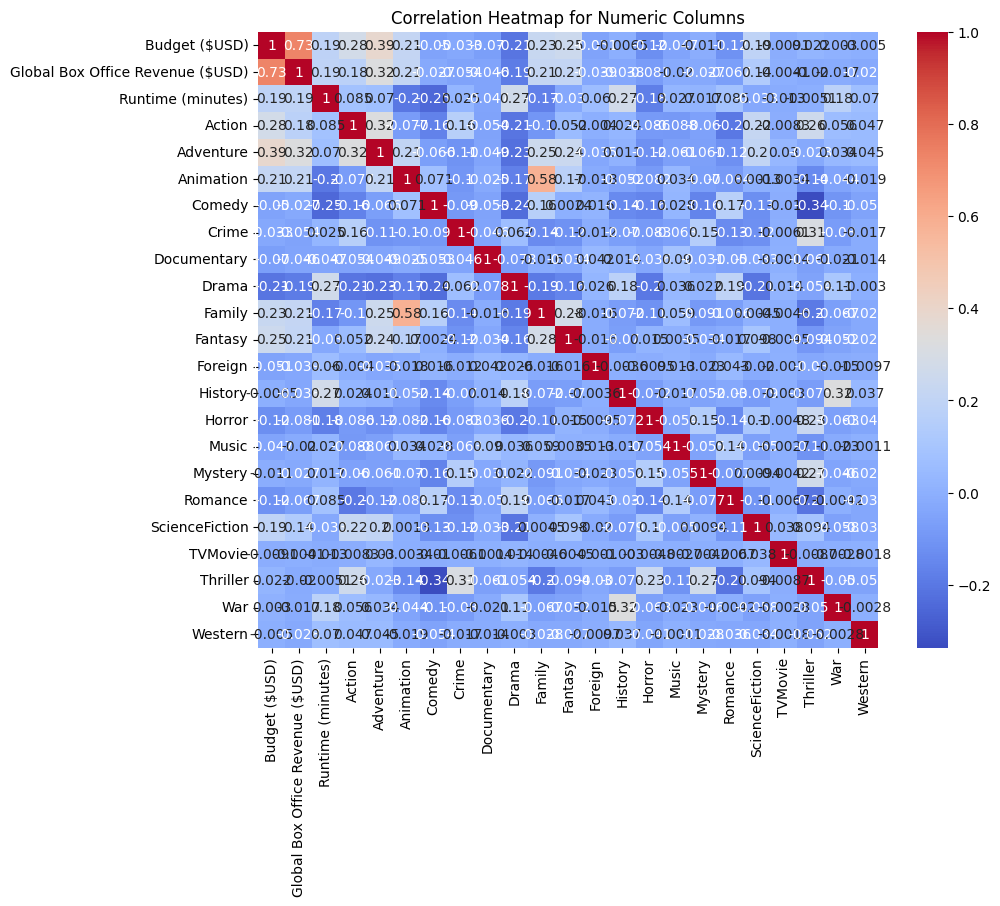

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the file path for LevelFilm 3.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 3.xlsx'

# Read the file into a DataFrame
df_final = pd.read_excel(file_path)

# Basic Information
print("Shape of the DataFrame:", df_final.shape)
print("\nDataFrame Info:")
print(df_final.info())

# Summary statistics for numeric columns
print("\nSummary Statistics:")
print(df_final.describe())

# Check for missing values in each column
print("\nMissing Values in Each Column:")
print(df_final.isnull().sum())

# Explore unique values for key categorical columns
print("\nUnique Film Titles:", df_final['Film Title'].nunique())
print("Unique Taglines:", df_final['Tagline'].nunique())

# Release Date Range
print("\nRelease Date Range:")
print("Earliest Release Date:", df_final['Release Date'].min())
print("Latest Release Date:", df_final['Release Date'].max())

# Identify genre columns (one-hot encoded) by listing expected genres
genre_columns = [
    'Action', 'Adventure', 'Animation', 'Comedy', 'Crime', 'Documentary', 'Drama',
    'Family', 'Fantasy', 'Foreign', 'History', 'Horror', 'Music', 'Mystery',
    'Romance', 'ScienceFiction', 'TVMovie', 'Thriller', 'War', 'Western'
]
print("\nOne-Hot Encoded Genre Columns Summary (sum over rows):")
print(df_final[genre_columns].sum())

# Plot a correlation heatmap for numeric columns
numeric_cols = df_final.select_dtypes(include=['float64', 'int64']).columns
plt.figure(figsize=(10,8))
sns.heatmap(df_final[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap for Numeric Columns")
plt.show()


In [ ]:
import pandas as pd

# Define the file path for LevelFilm 3.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 3.xlsx'

# Read the file into a DataFrame
df_final = pd.read_excel(file_path)

# Drop the 'Tagline' column
df_final = df_final.drop(columns=['Tagline'])

# Print out the DataFrame info to see the updated data types
print("DataFrame Info after dropping the 'Tagline' column:")
print(df_final.info())


DataFrame Info after dropping the 'Tagline' column:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5211 entries, 0 to 5210
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Film Title                        5211 non-null   object        
 1   Release Date                      5210 non-null   datetime64[ns]
 2   Budget ($USD)                     5210 non-null   float64       
 3   Global Box Office Revenue ($USD)  5210 non-null   float64       
 4   Runtime (minutes)                 5209 non-null   float64       
 5   Action                            5211 non-null   int64         
 6   Adventure                         5211 non-null   int64         
 7   Animation                         5211 non-null   int64         
 8   Comedy                            5211 non-null   int64         
 9   Crime                             5211 non-null   int64         
 

In [ ]:
import pandas as pd

# Define the file path for LevelFilm 3.xlsx (without the Tagline column)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 3.xlsx'
df_final = pd.read_excel(file_path)

# Drop the Tagline column (if not already dropped)
if 'Tagline' in df_final.columns:
    df_final = df_final.drop(columns=['Tagline'])

# Calculate missing value counts per column
missing_counts = df_final.isnull().sum()
# Calculate missing value percentages
missing_percentage = (missing_counts / len(df_final)) * 100

# Combine counts and percentages into a DataFrame
missing_analysis = pd.DataFrame({
    'Missing Count': missing_counts,
    'Missing Percentage': missing_percentage
})

print("Missing Value Analysis:")
print(missing_analysis)


Missing Value Analysis:
                                  Missing Count  Missing Percentage
Film Title                                    0             0.00000
Release Date                                  1             0.01919
Budget ($USD)                                 1             0.01919
Global Box Office Revenue ($USD)              1             0.01919
Runtime (minutes)                             2             0.03838
Action                                        0             0.00000
Adventure                                     0             0.00000
Animation                                     0             0.00000
Comedy                                        0             0.00000
Crime                                         0             0.00000
Documentary                                   0             0.00000
Drama                                         0             0.00000
Family                                        0             0.00000
Fantasy                 

In [ ]:
import pandas as pd

# Define the file path for LevelFilm 3.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 3.xlsx'
df_final = pd.read_excel(file_path)

# Drop the Tagline column if it exists
if 'Tagline' in df_final.columns:
    df_final = df_final.drop(columns=['Tagline'])

# Drop rows with any missing values
df_final_clean = df_final.dropna()

# Print out the info to confirm missing values are dropped
print("DataFrame Info after dropping rows with missing values:")
print(df_final_clean.info())

# Define the new file path for LevelFilm 4.xlsx and save the cleaned DataFrame
new_file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 4.xlsx'
df_final_clean.to_excel(new_file_path, index=False)

print("Cleaned DataFrame saved as LevelFilm 4.xlsx")


DataFrame Info after dropping rows with missing values:
<class 'pandas.core.frame.DataFrame'>
Index: 5209 entries, 0 to 5209
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Film Title                        5209 non-null   object        
 1   Release Date                      5209 non-null   datetime64[ns]
 2   Budget ($USD)                     5209 non-null   float64       
 3   Global Box Office Revenue ($USD)  5209 non-null   float64       
 4   Runtime (minutes)                 5209 non-null   float64       
 5   Action                            5209 non-null   int64         
 6   Adventure                         5209 non-null   int64         
 7   Animation                         5209 non-null   int64         
 8   Comedy                            5209 non-null   int64         
 9   Crime                             5209 non-null   int64         
 1

In [ ]:
import pandas as pd

# Read the cleaned file from LevelFilm 4.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 4.xlsx'
df = pd.read_excel(file_path)

# 1. Create new release date columns: "Release Year", "Release Month", "Release Month-Date"
df['Release Year'] = df['Release Date'].dt.year
df['Release Month'] = df['Release Date'].dt.month
df['Release Month-Date'] = df['Release Date'].dt.day

# Reorder columns so that the new columns appear immediately after "Release Date"
cols = list(df.columns)
# Remove new columns from list if already present
for new_col in ['Release Year', 'Release Month', 'Release Month-Date']:
    cols.remove(new_col)
# Insert new columns after "Release Date" (which is at index 1)
new_order = cols[:2] + ['Release Year', 'Release Month', 'Release Month-Date'] + cols[2:]
df = df[new_order]

# 2. Rename columns: "Budget ($USD)" -> "Budget" and "Global Box Office Revenue ($USD)" -> "Revenue"
df = df.rename(columns={
    "Budget ($USD)": "Budget",
    "Global Box Office Revenue ($USD)": "Revenue"
})

# 3. Create a new column "Profit" (Revenue - Budget) and insert it right after "Revenue"
profit = df["Revenue"] - df["Budget"]
revenue_idx = df.columns.get_loc("Revenue")
df.insert(revenue_idx + 1, "Profit", profit)

# 4. Save the modified DataFrame as LevelFilm 5.xlsx
output_file = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 5.xlsx'
df.to_excel(output_file, index=False)

print("Modified DataFrame saved as LevelFilm 5.xlsx")


Modified DataFrame saved as LevelFilm 5.xlsx


Ranges:
Release Year: (1915, 2017)
Budget: (0 M, 380 M)
Revenue: (0 M, 2788 M)
Profit: (-166 M, 2551 M)
Runtime (minutes): (0, 338)

Runtime counts (20-minute bins):
Runtime_bin
(0, 20]          0
(20, 40]         1
(40, 60]         2
(60, 80]       107
(80, 100]     1861
(100, 120]    1944
(120, 140]     874
(140, 160]     254
(160, 180]     103
(180, 200]      34
(200, 220]      13
(220, 240]       3
(240, 260]       1
(260, 280]       0
(280, 300]       0
(300, 320]       1
(320, 340]       1
Name: count, dtype: int64
Total runtime count: 5199


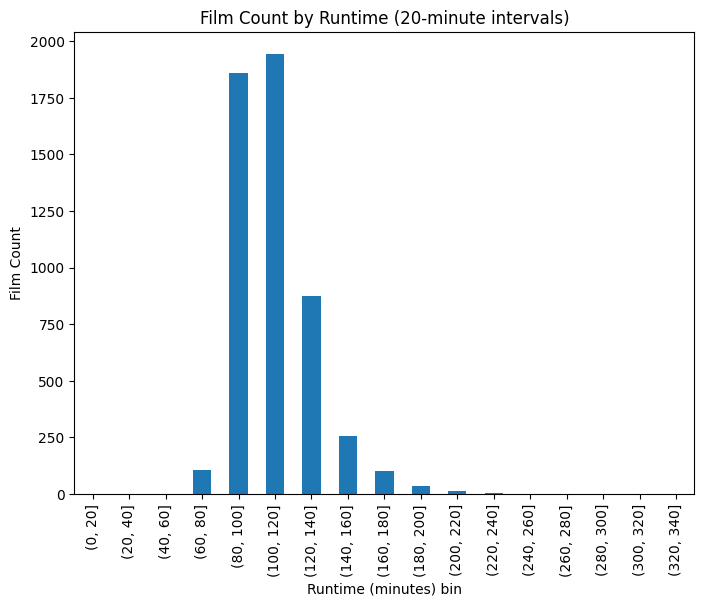


Release Year counts (5-year bins):
ReleaseYear_bin
[1915, 1920)       2
[1920, 1925)       2
[1925, 1930)      11
[1930, 1935)      13
[1935, 1940)      17
[1940, 1945)      24
[1945, 1950)      21
[1950, 1955)      34
[1955, 1960)      33
[1960, 1965)      61
[1965, 1970)      60
[1970, 1975)      76
[1975, 1980)      99
[1980, 1985)     202
[1985, 1990)     300
[1990, 1995)     358
[1995, 2000)     551
[2000, 2005)     735
[2005, 2010)    1010
[2010, 2015)    1092
[2015, 2020)     508
Name: count, dtype: int64
Total release year count: 5209


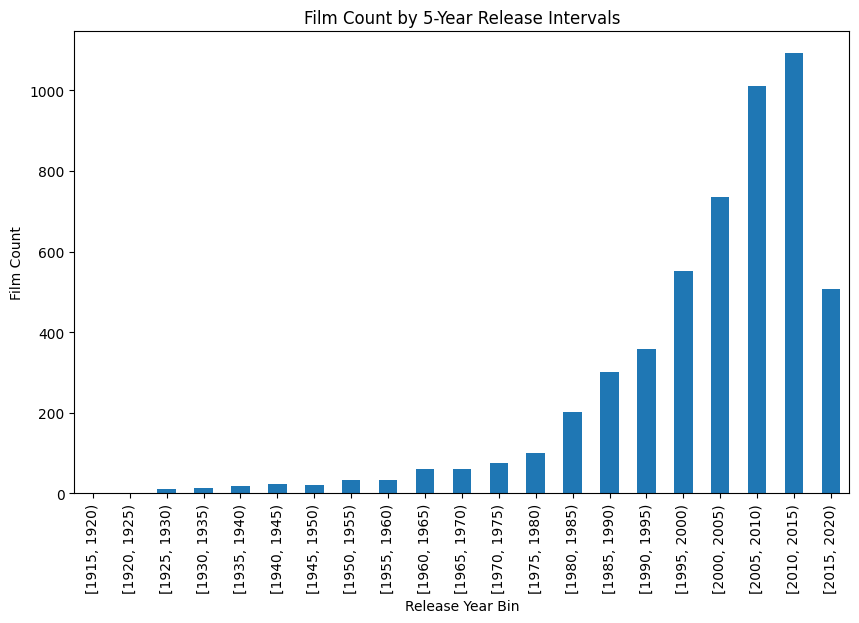

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Read LevelFilm 6.xlsx
file_path_6 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 6.xlsx'
df = pd.read_excel(file_path_6)

# 2. (Assuming Release Year, Release Month, Release Month-Date, and Profit columns already exist)
# 3. Print overall ranges for key columns, formatting in millions with "M"
def format_range_M(label, rng):
    # Convert to millions with abbreviation "M"
    return f"{label}: ({rng[0]/1e6:.0f} M, {rng[1]/1e6:.0f} M)"

range_release_year = (df['Release Year'].min(), df['Release Year'].max())
range_budget = (df['Budget'].min(), df['Budget'].max())
range_revenue = (df['Revenue'].min(), df['Revenue'].max())
range_profit = (df['Profit'].min(), df['Profit'].max())
range_runtime = (df['Runtime (minutes)'].min(), df['Runtime (minutes)'].max())

print("Ranges:")
print("Release Year:", range_release_year)
print(format_range_M("Budget", range_budget))
print(format_range_M("Revenue", range_revenue))
print(format_range_M("Profit", range_profit))
print("Runtime (minutes):", range_runtime)

# 4. Runtime Analysis (20-minute bins) remains unchanged
runtime_min = int(df['Runtime (minutes)'].min())
runtime_max = int(df['Runtime (minutes)'].max())
runtime_bins = np.arange(runtime_min, runtime_max + 20, 20)
df['Runtime_bin'] = pd.cut(df['Runtime (minutes)'], bins=runtime_bins)
runtime_counts = df['Runtime_bin'].value_counts().sort_index()
print("\nRuntime counts (20-minute bins):")
print(runtime_counts)
print("Total runtime count:", runtime_counts.sum())

plt.figure(figsize=(8,6))
runtime_counts.plot(kind='bar')
plt.xlabel('Runtime (minutes) bin')
plt.ylabel('Film Count')
plt.title('Film Count by Runtime (20-minute intervals)')
plt.show()

# 5. Release Year Analysis: Bin data into 5-year intervals
min_year = df['Release Year'].min()
max_year = df['Release Year'].max()
year_bins = np.arange(min_year, max_year + 5, 5)
df['ReleaseYear_bin'] = pd.cut(df['Release Year'], bins=year_bins, right=False)
release_year_counts = df['ReleaseYear_bin'].value_counts().sort_index()
print("\nRelease Year counts (5-year bins):")
print(release_year_counts)
print("Total release year count:", release_year_counts.sum())

plt.figure(figsize=(10,6))
release_year_counts.plot(kind='bar')
plt.xlabel('Release Year Bin')
plt.ylabel('Film Count')
plt.title('Film Count by 5-Year Release Intervals')
plt.show()

Ranges:
Budget: (0 M, 380 M)
Revenue: (0 M, 2788 M)
Profit: (-166 M, 2551 M)

Budget counts with custom bins:
Budget
(0 M, 10 M]       1915
(10 M, 25 M]      1345
(25 M, 50 M]       976
(50 M, 75 M]       419
(75 M, 100 M]      234
(100 M, 125 M]      89
(125 M, 150 M]     108
(150 M, 175 M]      47
(175 M, 200 M]      44
(200 M, 380 M]      32
Name: count, dtype: int64
Total Budget count: 5209


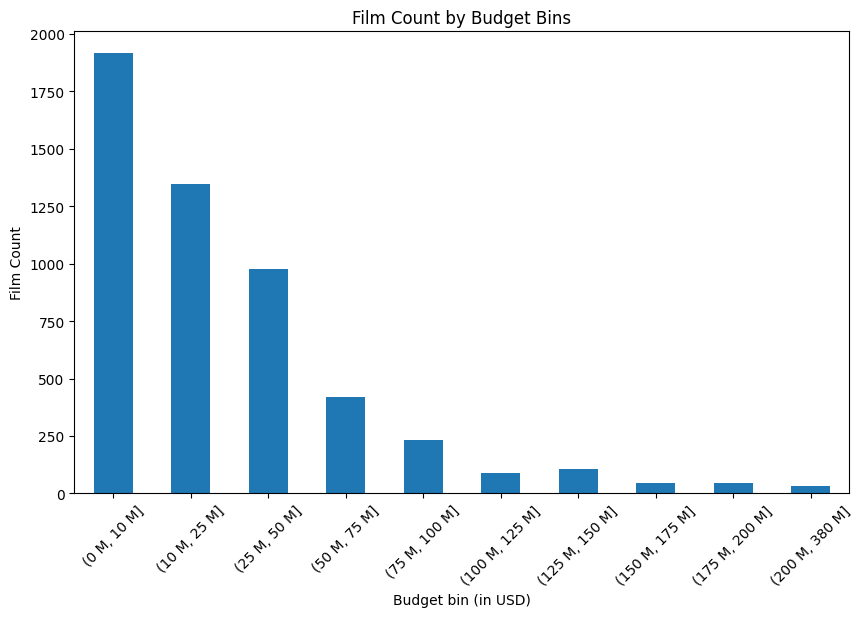


Revenue counts with custom bins:
Revenue
(0 M, 10 M]         1499
(10 M, 25 M]         891
(25 M, 50 M]         744
(50 M, 75 M]         445
(75 M, 100 M]        305
(100 M, 125 M]       249
(125 M, 150 M]       149
(150 M, 175 M]       160
(175 M, 200 M]       106
(200 M, 225 M]        94
(225 M, 250 M]        68
(250 M, 275 M]        54
(275 M, 300 M]        45
(300 M, 325 M]        49
(325 M, 350 M]        39
(350 M, 375 M]        50
(375 M, 400 M]        20
(400 M, 425 M]        23
(425 M, 450 M]        18
(450 M, 475 M]        18
(475 M, 500 M]        14
(500 M, 1000 M]      140
(1000 M, 2788 M]      29
Name: count, dtype: int64
Total Revenue count: 5209


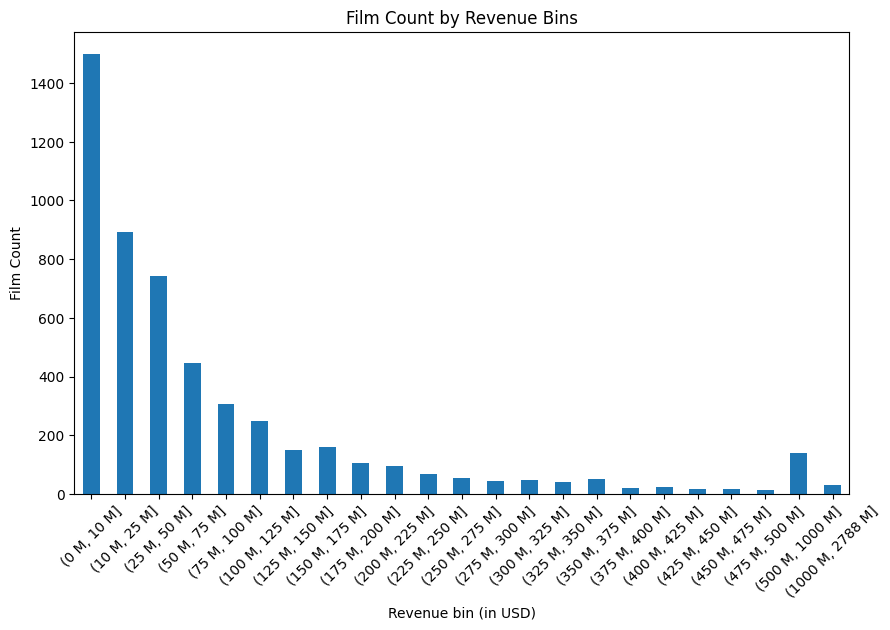


Profit counts with custom bins:
Profit
(-166 M, -50 M]      38
(-50 M, -35 M]       57
(-35 M, -20 M]      171
(-20 M, -10 M]      339
(-10 M, 0 M]        954
(0 M, 10 M]         947
(10 M, 20 M]        461
(20 M, 35 M]        440
(35 M, 50 M]        282
(50 M, 100 M]       580
(100 M, 150 M]      314
(150 M, 200 M]      172
(200 M, 250 M]      114
(250 M, 300 M]       85
(300 M, 350 M]       49
(350 M, 400 M]       36
(400 M, 450 M]       29
(450 M, 500 M]       25
(500 M, 1000 M]     103
(1000 M, 2551 M]     13
Name: count, dtype: int64
Total Profit count: 5209


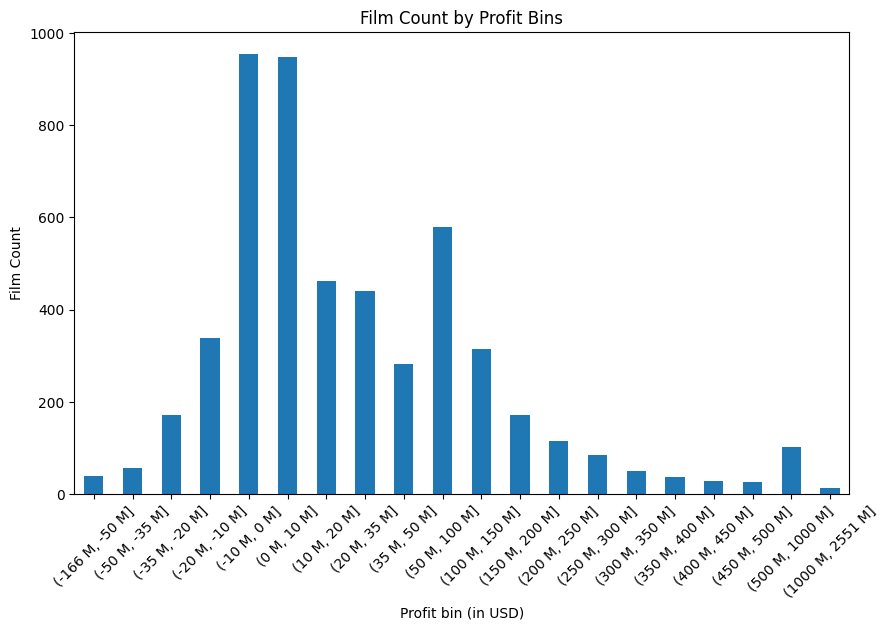

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Read LevelFilm 6.xlsx
file_path_6 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 6.xlsx'
df = pd.read_excel(file_path_6)

# 3. Print overall ranges for key columns (Budget, Revenue, Profit) in M notation.
def format_range_M(label, rng):
    return f"{label}: ({rng[0]/1e6:.0f} M, {rng[1]/1e6:.0f} M)"

range_budget = (df['Budget'].min(), df['Budget'].max())
range_revenue = (df['Revenue'].min(), df['Revenue'].max())
range_profit = (df['Profit'].min(), df['Profit'].max())

print("Ranges:")
print(format_range_M("Budget", range_budget))
print(format_range_M("Revenue", range_revenue))
print(format_range_M("Profit", range_profit))

# 6a. Custom bins for Budget
def create_budget_bins(series):
    # For Budget:
    # 0-25M: break into 0-10M and 10M-25M.
    # Then from 25M to 200M in 25M increments.
    # Then consolidate all above 200M into one bin.
    max_val = series.max()
    bins = [0, 10e6, 25e6]
    extra_bins = list(np.arange(25e6, 200e6+1, 25e6))[1:]  # drop duplicate 25e6; np.arange stops exactly at 200e6
    bins += extra_bins
    bins.append(max_val + 1)
    bins = np.array(bins)
    return bins

# Custom bins for Revenue
def create_revenue_bins(series):
    # For Revenue:
    # 0-25M: break into 0-10M and 10M-25M.
    # Then from 25M to 500M in 25M increments.
    # Then consolidate all values from 500M to 1B into one bin and from 1B to max into another.
    max_val = series.max()
    bins = [0, 10e6, 25e6]
    extra_bins = list(np.arange(25e6, 500e6+1, 25e6))[1:]
    bins += extra_bins
    bins.append(1000e6)  # 1B boundary
    bins.append(max_val + 1)
    bins = np.array(bins)
    return bins

# 6b. Custom bins for Profit
def create_profit_bins(series):
    pos_vals = series[series >= 0]
    neg_vals = series[series < 0]
    pos_max = pos_vals.max() if len(pos_vals) > 0 else 0
    neg_min = neg_vals.min() if len(neg_vals) > 0 else 0
    # Positive side:
    # Break 0-50M into: 0, 10M, 20M, 35M, 50M.
    pos_bins_small = [0, 10e6, 20e6, 35e6, 50e6]
    # Then from 50M to 500M in 50M increments
    pos_bins_rest = list(np.arange(50e6, 500e6+1, 50e6))[1:]
    pos_bins = pos_bins_small + pos_bins_rest
    pos_bins.append(1000e6)  # consolidate 500M-1B into one bin boundary at 1B
    pos_bins.append(pos_max + 1)

    # Negative side:
    # Break 0 to -50M into: -50M, -35M, -20M, -10M, 0.
    neg_bins_small = [neg_min, -50e6, -35e6, -20e6, -10e6, 0]

    # Combine negative and positive bins, ensuring 0 is not duplicated.
    bins = np.concatenate([np.array(neg_bins_small), np.array(pos_bins)[1:]])
    return bins

# Functions to format bin labels using "M" abbreviation
def format_bins_labels_M(bins):
    labels = []
    for i in range(len(bins) - 1):
        lower = bins[i] / 1e6
        upper = bins[i+1] / 1e6
        labels.append(f"({lower:.0f} M, {upper:.0f} M]")
    return labels

# Plotting functions for Budget and Revenue
def plot_financial_bins(series, col_name, create_bins_func):
    bins = create_bins_func(series)
    labels = format_bins_labels_M(bins)
    bin_series = pd.cut(series, bins=bins, labels=labels, include_lowest=True)
    counts = bin_series.value_counts().sort_index()

    print(f"\n{col_name} counts with custom bins:")
    print(counts)
    print(f"Total {col_name} count: {counts.sum()}")

    plt.figure(figsize=(10,6))
    counts.plot(kind='bar')
    plt.xlabel(f'{col_name} bin (in USD)')
    plt.ylabel('Film Count')
    plt.title(f'Film Count by {col_name} Bins')
    plt.xticks(rotation=45)
    plt.show()

# Plotting function for Profit
def plot_profit_bins(series, col_name="Profit"):
    bins = create_profit_bins(series)
    labels = format_bins_labels_M(bins)
    bin_series = pd.cut(series, bins=bins, labels=labels, include_lowest=True)
    counts = bin_series.value_counts().sort_index()

    print(f"\n{col_name} counts with custom bins:")
    print(counts)
    print(f"Total {col_name} count: {counts.sum()}")

    plt.figure(figsize=(10,6))
    counts.plot(kind='bar')
    plt.xlabel(f'{col_name} bin (in USD)')
    plt.ylabel('Film Count')
    plt.title(f'Film Count by {col_name} Bins')
    plt.xticks(rotation=45)
    plt.show()

# 7. Perform the analyses and visualizations

# For Budget
plot_financial_bins(df['Budget'], "Budget", create_budget_bins)

# For Revenue
plot_financial_bins(df['Revenue'], "Revenue", create_revenue_bins)

# For Profit
plot_profit_bins(df['Profit'], "Profit")



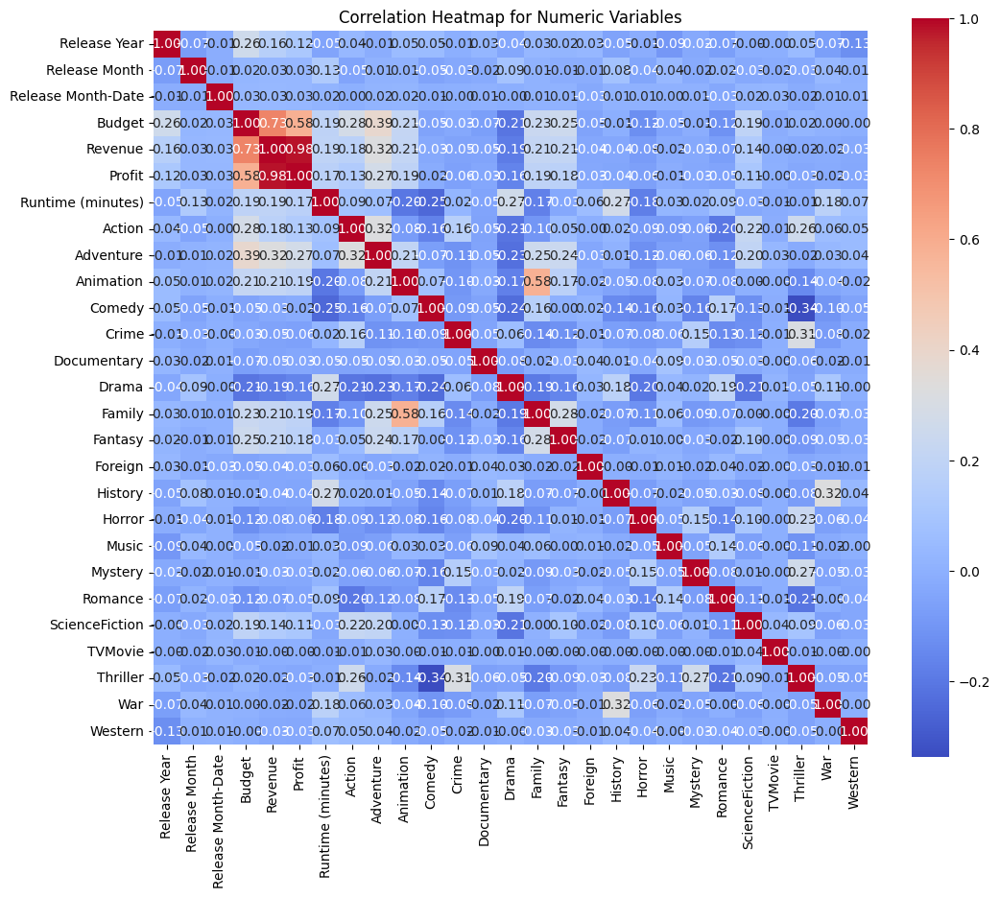

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read LevelFilm 6.xlsx
file_path_6 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 6.xlsx'
df = pd.read_excel(file_path_6)

# Select only numeric columns for correlation analysis
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
corr_matrix = df[numeric_cols].corr()

# Plot the correlation heatmap
plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Correlation Heatmap for Numeric Variables")
plt.show()


<ipython-input-36-a43047575b56>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=day_counts.index, y=day_counts.values, palette="viridis")


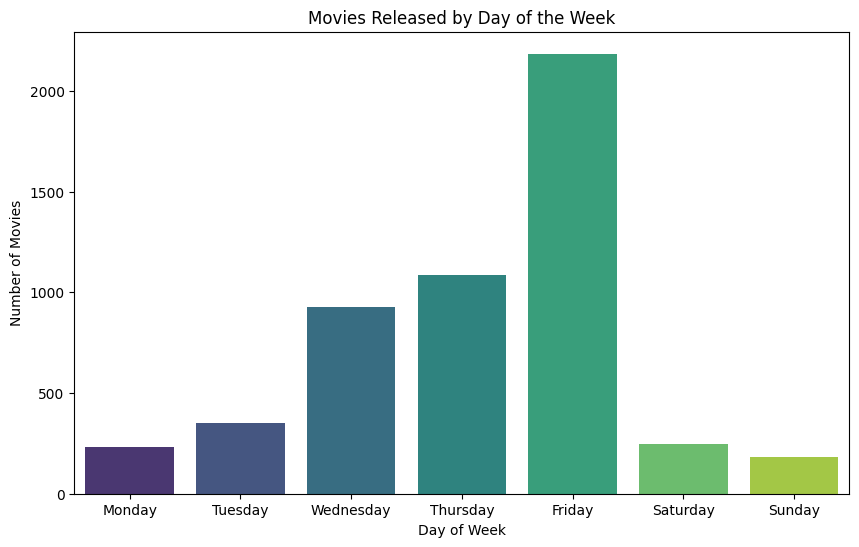

<ipython-input-36-a43047575b56>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=genre_counts.index, y=genre_counts.values, palette="magma")


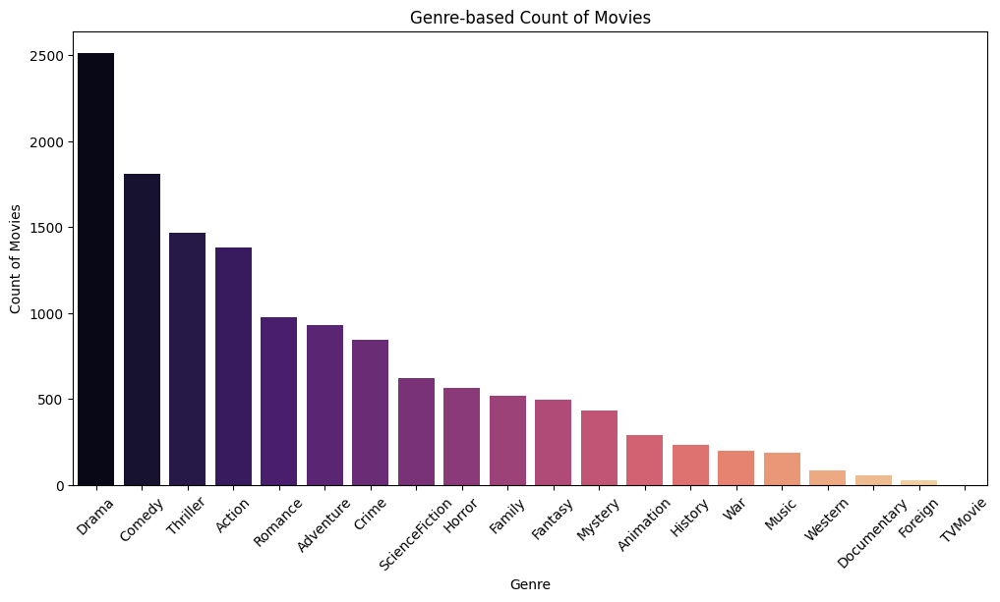

Modified DataFrame saved as LevelFilm 7.xlsx


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read LevelFilm 6.xlsx
file_path_6 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 6.xlsx'
df = pd.read_excel(file_path_6)

# Ensure 'Release Date' is a datetime object and create 'Release Day'
df['Release Date'] = pd.to_datetime(df['Release Date'])
df['Release Day'] = df['Release Date'].dt.day_name()

# Visualization 1: Movies released by day of the week
day_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
day_counts = df['Release Day'].value_counts().reindex(day_order)
plt.figure(figsize=(10,6))
sns.barplot(x=day_counts.index, y=day_counts.values, palette="viridis")
plt.xlabel("Day of Week")
plt.ylabel("Number of Movies")
plt.title("Movies Released by Day of the Week")
plt.show()

# Visualization 2: Genre-based count using one-hot encoded genre columns
genre_cols = [
    'Action', 'Adventure', 'Animation', 'Comedy', 'Crime', 'Documentary',
    'Drama', 'Family', 'Fantasy', 'Foreign', 'History', 'Horror', 'Music',
    'Mystery', 'Romance', 'ScienceFiction', 'TVMovie', 'Thriller', 'War', 'Western'
]
genre_counts = df[genre_cols].sum().sort_values(ascending=False)
plt.figure(figsize=(12,6))
sns.barplot(x=genre_counts.index, y=genre_counts.values, palette="magma")
plt.xlabel("Genre")
plt.ylabel("Count of Movies")
plt.title("Genre-based Count of Movies")
plt.xticks(rotation=45)
plt.show()

# Save the updated DataFrame as LevelFilm 7.xlsx
output_file_7 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 7.xlsx'
df.to_excel(output_file_7, index=False)
print("Modified DataFrame saved as LevelFilm 7.xlsx")


In [ ]:
import pandas as pd

# Read LevelFilm 7.xlsx
file_path_7 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 7.xlsx'
df = pd.read_excel(file_path_7)

# One‑hot encode the Release Day column (this yields 0/1 by default)
weekday_dummies = pd.get_dummies(df['Release Day'])

# Reorder columns Sunday → Saturday and cast to int
weekday_order = ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday']
weekday_dummies = weekday_dummies.reindex(columns=weekday_order, fill_value=0).astype(int)

# Concatenate back to df
df = pd.concat([df, weekday_dummies], axis=1)

# Save as LevelFilm 8.xlsx
output_file_8 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 8.xlsx'
df.to_excel(output_file_8, index=False)
print("Saved one‑hot encoded weekdays (0/1) as LevelFilm 8.xlsx")

# Snippet of the newly encoded weekday columns
print("\nSnippet of one‑hot encoded weekday columns:")
print(df[weekday_order].head())


Saved one‑hot encoded weekdays (0/1) as LevelFilm 8.xlsx

Snippet of one‑hot encoded weekday columns:
   Sunday  Monday  Tuesday  Wednesday  Thursday  Friday  Saturday
0       0       1        0          0         0       0         0
1       0       0        0          0         1       0         0
2       0       0        0          1         0       0         0
3       0       0        1          0         0       0         0
4       0       0        0          0         1       0         0


In [ ]:
import pandas as pd

# Read LevelFilm 8.xlsx
file_path_8 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 8.xlsx'
df = pd.read_excel(file_path_8)

# Ensure weekday one-hot columns exist
weekday_cols = ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday']

# Create aggregated columns
df['Early Weekdays'] = df[['Monday','Tuesday','Wednesday']].sum(axis=1).clip(upper=1)
df['Late Weekdays']  = df[['Thursday','Friday']].sum(axis=1).clip(upper=1)
df['Weekends']       = df[['Saturday','Sunday']].sum(axis=1).clip(upper=1)

# Save as LevelFilm 9.xlsx
output_file_9 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 9.xlsx'
df.to_excel(output_file_9, index=False)
print("Saved aggregated weekday groups as LevelFilm 9.xlsx")

# Snippet of the new columns
print("\nSnippet of aggregated weekday columns:")
print(df[['Early Weekdays','Late Weekdays','Weekends']].head())


Saved aggregated weekday groups as LevelFilm 9.xlsx

Snippet of aggregated weekday columns:
   Early Weekdays  Late Weekdays  Weekends
0               1              0         0
1               0              1         0
2               1              0         0
3               1              0         0
4               0              1         0


<ipython-input-41-88f4df3721a4>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=group_counts.index, y=group_counts.values, palette='pastel')


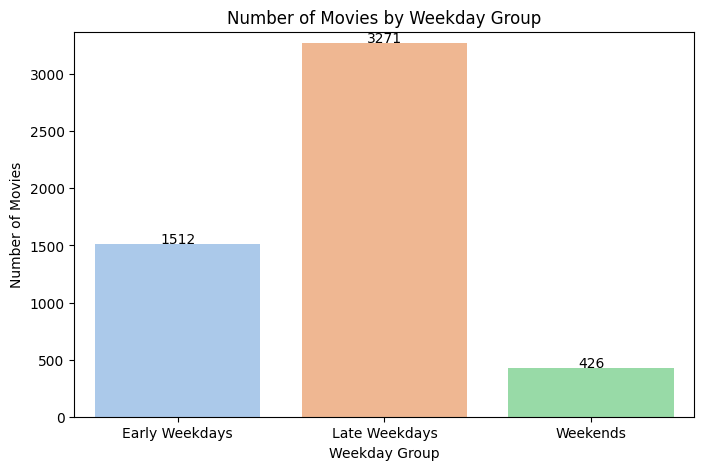

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read LevelFilm 9.xlsx
file_path_9 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 9.xlsx'
df = pd.read_excel(file_path_9)

# Compute counts for each group
group_cols = ['Early Weekdays', 'Late Weekdays', 'Weekends']
group_counts = df[group_cols].sum()

# Bar plot
plt.figure(figsize=(8,5))
sns.barplot(x=group_counts.index, y=group_counts.values, palette='pastel')
plt.xlabel('Weekday Group')
plt.ylabel('Number of Movies')
plt.title('Number of Movies by Weekday Group')
plt.ylim(0, group_counts.max() + 100)  # some headroom
for i, v in enumerate(group_counts.values):
    plt.text(i, v + 10, str(int(v)), ha='center')
plt.show()


Half-Season counts:
Half-Season
Early Winter    682
Late Winter     543
Early Spring    590
Late Spring     589
Early Summer    641
Late Summer     677
Early Autumn    864
Late Autumn     623
Name: count, dtype: int64


<ipython-input-42-4c05b4470ac9>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette='cubehelix')


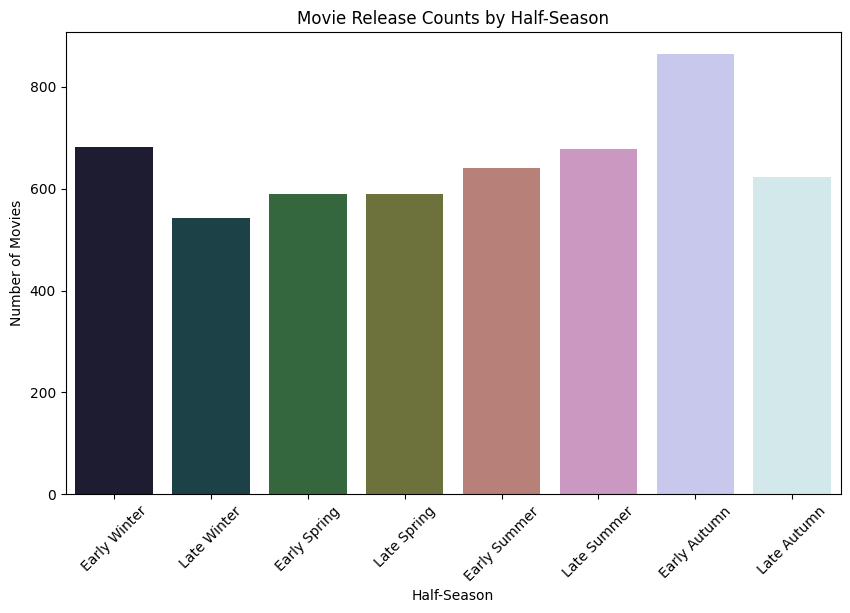

Saved Half-Season data as LevelFilm 10.xlsx


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Read LevelFilm 9.xlsx
file_path_9 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 9.xlsx'
df = pd.read_excel(file_path_9, parse_dates=['Release Date'])

# Define a helper to assign half‑seasons
def half_season(dt):
    m, d = dt.month, dt.day
    # Winter: Dec, Jan, Feb
    if m == 12 or m == 1 or m == 2:
        return "Early Winter" if (m == 12 or (m == 1 and d <= 15)) else "Late Winter"
    # Spring: Mar, Apr, May
    if m in (3,4,5):
        return "Early Spring" if (m == 3 or (m == 4 and d <= 15)) else "Late Spring"
    # Summer: Jun, Jul, Aug
    if m in (6,7,8):
        return "Early Summer" if (m == 6 or (m == 7 and d <= 15)) else "Late Summer"
    # Autumn: Sep, Oct, Nov
    if m in (9,10,11):
        return "Early Autumn" if (m == 9 or (m == 10 and d <= 15)) else "Late Autumn"
    return np.nan

# Apply to create new column
df['Half-Season'] = df['Release Date'].apply(half_season)

# Show counts
order = [
    "Early Winter","Late Winter",
    "Early Spring","Late Spring",
    "Early Summer","Late Summer",
    "Early Autumn","Late Autumn"
]
counts = df['Half-Season'].value_counts().reindex(order)
print("Half-Season counts:")
print(counts)

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x=counts.index, y=counts.values, palette='cubehelix')
plt.xticks(rotation=45)
plt.ylabel("Number of Movies")
plt.title("Movie Release Counts by Half-Season")
plt.show()

# Save as LevelFilm 10.xlsx
output_file_10 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 10.xlsx'
df.to_excel(output_file_10, index=False)
print("Saved Half-Season data as LevelFilm 10.xlsx")


Monthly release counts:
Release Month Number
January      333
February     348
March        390
April        382
May          407
June         449
July         416
August       453
September    607
October      480
November     400
December     544
dtype: int64


<ipython-input-43-28ca27091f1f>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=monthly_counts.index, y=monthly_counts.values, palette='Spectral')


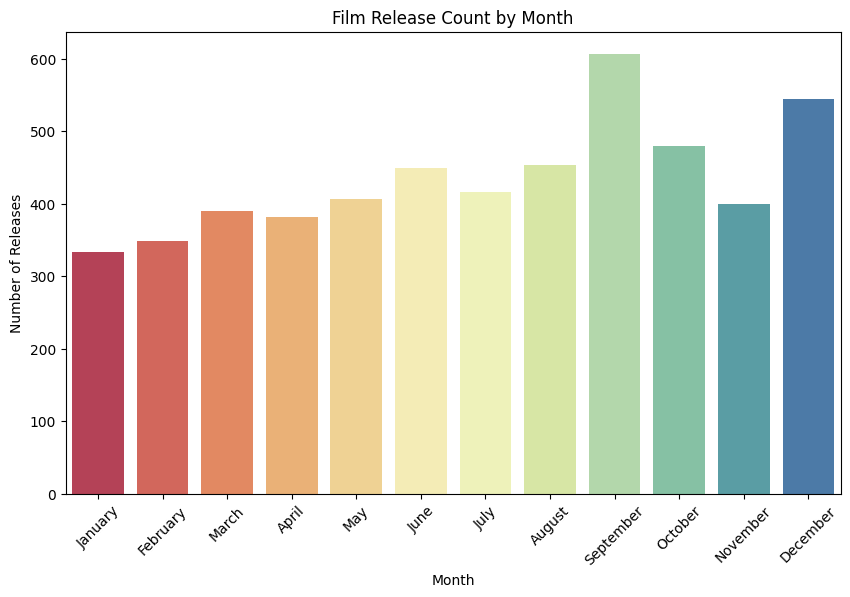

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read LevelFilm 10.xlsx
file_path_10 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 10.xlsx'
df = pd.read_excel(file_path_10, parse_dates=['Release Date'])

# Extract month name and month number
df['Release Month Name']   = df['Release Date'].dt.month_name()
df['Release Month Number'] = df['Release Date'].dt.month

# Compute counts per month
monthly_counts = df.groupby('Release Month Number').size().reindex(range(1,13), fill_value=0)

# Map month numbers to names in calendar order
month_names = pd.to_datetime(monthly_counts.index, format='%m').month_name()
monthly_counts.index = month_names

# Print the counts
print("Monthly release counts:")
print(monthly_counts)

# Visualization
plt.figure(figsize=(10,6))
sns.barplot(x=monthly_counts.index, y=monthly_counts.values, palette='Spectral')
plt.xticks(rotation=45)
plt.xlabel("Month")
plt.ylabel("Number of Releases")
plt.title("Film Release Count by Month")
plt.show()


Holiday window counts:
Holiday Window
Good Friday              223
Victoria Day             204
Canada Day               237
Labour Day               220
Thanksgiving             250
Christmas/New Year’s     544
None                    3531
Name: count, dtype: int64


<ipython-input-47-7353e615388b>:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="tab10")


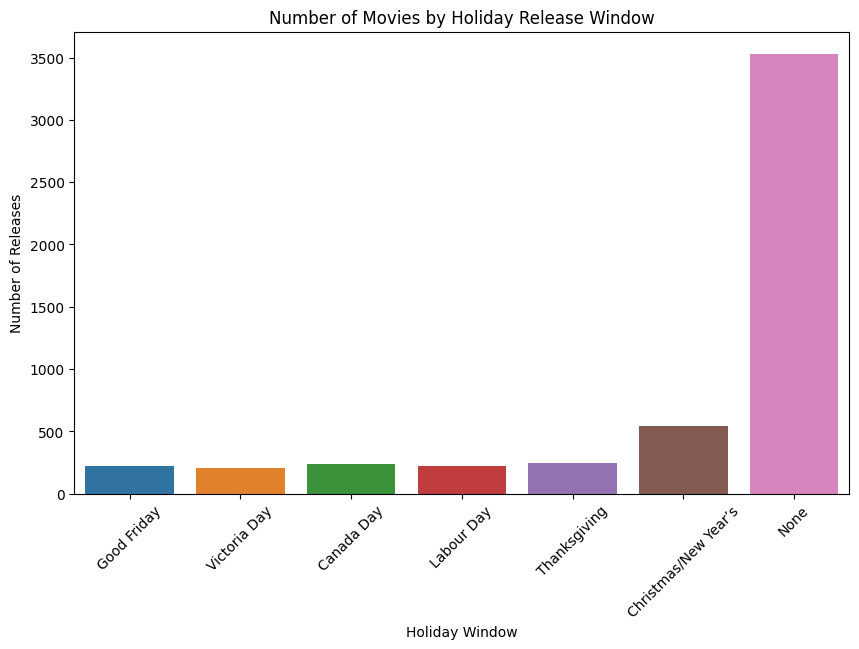

Saved with holiday windows as LevelFilm 11.xlsx


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import timedelta
from dateutil.easter import easter

# 1. Read LevelFilm 10.xlsx
file_path_10 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 10.xlsx'
df = pd.read_excel(file_path_10, parse_dates=['Release Date'])

# 2. Define holiday dates per year, converted to Timestamps
def make_holiday_dates(year):
    dates = {}
    # Good Friday
    gf = pd.Timestamp(easter(year) - timedelta(days=2))
    dates["Good Friday"] = gf
    # Victoria Day: Monday on or before May 24
    may24 = pd.Timestamp(year=year, month=5, day=24)
    # weekday(): Monday=0 … Sunday=6; we want the Monday on or before May24
    offset = (may24.weekday() - 0) % 7
    vd = may24 - timedelta(days=offset)
    dates["Victoria Day"] = vd
    # Canada Day: July 1 observed
    cd = pd.Timestamp(year=year, month=7, day=1)
    if cd.weekday() == 6:
        cd += timedelta(days=1)
    dates["Canada Day"] = cd
    # Labour Day: first Monday in September
    sept1 = pd.Timestamp(year=year, month=9, day=1)
    offset = (0 - sept1.weekday()) % 7
    ld = sept1 + timedelta(days=offset)
    dates["Labour Day"] = ld
    # Thanksgiving: second Monday in October
    oct1 = pd.Timestamp(year=year, month=10, day=1)
    offset = (0 - oct1.weekday()) % 7
    first_mon = oct1 + timedelta(days=offset)
    tg = first_mon + timedelta(days=7)
    dates["Thanksgiving"] = tg
    return dates

years = df['Release Date'].dt.year.unique()
holiday_dates = {y: make_holiday_dates(y) for y in years}

# 3. Assign holiday window
def assign_holiday_window(dt):
    # December → Christmas/New Year’s
    if dt.month == 12:
        return "Christmas/New Year’s"
    y = dt.year
    for name, hol in holiday_dates[y].items():
        start = hol - timedelta(days=14)
        if start <= dt <= hol:
            return name
    return "None"

df['Holiday Window'] = df['Release Date'].apply(assign_holiday_window)

# 4. Count and visualize
order = ["Good Friday","Victoria Day","Canada Day","Labour Day","Thanksgiving","Christmas/New Year’s","None"]
counts = df['Holiday Window'].value_counts().reindex(order, fill_value=0)

print("Holiday window counts:")
print(counts)

plt.figure(figsize=(10,6))
sns.barplot(x=counts.index, y=counts.values, palette="tab10")
plt.xticks(rotation=45)
plt.ylabel("Number of Releases")
plt.title("Number of Movies by Holiday Release Window")
plt.show()

# 5. Save as LevelFilm 11.xlsx
output_file_11 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 11.xlsx'
df.to_excel(output_file_11, index=False)
print("Saved with holiday windows as LevelFilm 11.xlsx")


In [ ]:
import pandas as pd

# Read LevelFilm 14.xlsx
file_path_14 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 14.xlsx'
df = pd.read_excel(file_path_14, parse_dates=['Release Date'])

# (Optional) Inspect to confirm it loaded correctly
print(df.info())

# Save as Final 1.xlsx
output_file_final = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 1.xlsx'
df.to_excel(output_file_final, index=False)
print(f"Saved as {output_file_final}")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5209 entries, 0 to 5208
Data columns (total 58 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Release Date                   5209 non-null   datetime64[ns]
 1   Release Day                    5209 non-null   object        
 2   ReleaseYear_bin                5209 non-null   object        
 3   Runtime_bin                    5199 non-null   object        
 4   Half-Season                    5209 non-null   object        
 5   Holiday Window                 1678 non-null   object        
 6   Film Title                     5209 non-null   object        
 7   Release Year                   5209 non-null   int64         
 8   Release Month                  5209 non-null   int64         
 9   Release Month-Date             5209 non-null   int64         
 10  Budget                         5209 non-null   int64         
 11  Revenue          

In [ ]:
import pandas as pd

# Read Final 1.xlsx
file_path_final1 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 1.xlsx'
df = pd.read_excel(file_path_final1, parse_dates=['Release Date'])

# List of the genre one‑hot columns to rename
genre_cols = [
    'Action','Adventure','Animation','Comedy','Crime','Documentary','Drama',
    'Family','Fantasy','Foreign','History','Horror','Music','Mystery','Romance',
    'ScienceFiction','TVMovie','Thriller','War','Western'
]

# Build a rename mapping
rename_map = {col: f'Genre_{col}' for col in genre_cols}

# Apply renaming
df = df.rename(columns=rename_map)

# Save as Final 2.xlsx
output_file_final2 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 2.xlsx'
df.to_excel(output_file_final2, index=False)
print("Saved updated genres as Final 2.xlsx")

# Snippet of the renamed genre columns
print(df.info())


Saved updated genres as Final 2.xlsx
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5209 entries, 0 to 5208
Data columns (total 58 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Release Date                   5209 non-null   datetime64[ns]
 1   Release Day                    5209 non-null   object        
 2   ReleaseYear_bin                5209 non-null   object        
 3   Runtime_bin                    5199 non-null   object        
 4   Half-Season                    5209 non-null   object        
 5   Holiday Window                 1678 non-null   object        
 6   Film Title                     5209 non-null   object        
 7   Release Year                   5209 non-null   int64         
 8   Release Month                  5209 non-null   int64         
 9   Release Month-Date             5209 non-null   int64         
 10  Budget                         5209 non-null   

In [ ]:
import pandas as pd

# 1. Read Final 2.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 2.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Rename columns
df = df.rename(columns={
    'Runtime (minutes)': 'Runtime',
    'Film Title': 'Title',
    'Holiday Window': 'Holidays',
    'Half-Season': 'Season',
    'Holidays_Christmas/New Year’s': 'Holidays_Christmas_New Year'
})

# 3. Show final columns and dtypes
print(df.info())

# 4. Save as Final 3.xlsx
output_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx'
df.to_excel(output_path, index=False)
print(f"Saved renamed file as {output_path}")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5209 entries, 0 to 5208
Data columns (total 58 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Release Date                 5209 non-null   datetime64[ns]
 1   Release Day                  5209 non-null   object        
 2   ReleaseYear_bin              5209 non-null   object        
 3   Runtime_bin                  5199 non-null   object        
 4   Season                       5209 non-null   object        
 5   Holidays                     1678 non-null   object        
 6   Title                        5209 non-null   object        
 7   Release Year                 5209 non-null   int64         
 8   Release Month                5209 non-null   int64         
 9   Release Month-Date           5209 non-null   int64         
 10  Budget                       5209 non-null   int64         
 11  Revenue                      5209 non-null 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from google.colab import drive
import os

# Mount your Drive (if you haven’t already in this session)
drive.mount('/content/drive', force_remount=True)

# List the files in your Capstone folder
capstone_dir = '/content/drive/My Drive/Colab Notebooks/804 Capstone'
print("Files in Capstone folder:")
print(os.listdir(capstone_dir))


Mounted at /content/drive
Files in Capstone folder:
['LevelFilm 2.xlsx', 'LevelFilm 3.xlsx', 'LevelFilm 1.xlsx', 'LevelFilm 4.xlsx', 'LevelFilm 5.xlsx', 'LevelFilm 6.xlsx', 'LevelFilm 7.xlsx', 'LevelFilm 8.xlsx', 'LevelFilm 9.xlsx', 'LevelFilm 10.xlsx', 'LevelFilm 11.xlsx', 'LevelFilm 12.xlsx', 'Movies 1.csv', 'LevelFilm 13.xlsx', 'Credits 1.csv', 'Movies 2.csv', 'Movies 3.csv', 'Movies 4.xlsx', 'Movies 5.xlsx', 'Movies 6.xlsx', 'Movies 7.xlsx', 'Movies 8.xlsx', 'Movies 9.xlsx', 'Movies 10.xlsx', 'LevelFilm 14.xlsx', 'Movies 11.xlsx', 'Movies 12.xlsx', 'Movies 13.xlsx', 'Movies 14.xlsx', 'Movies 15.xlsx', 'Movies 16.xlsx', 'Movies 17.xlsx', 'Movies 18.xlsx', 'Movies 19.xlsx', '804 Project_Movies.ipynb', '804 Project_LevelFilm.ipynb', 'LevelFilm 15.xlsx', 'LevelFilm 16.xlsx', 'LevelFilm 17.xlsx']


In [ ]:
import pandas as pd

# Paths (update if your filenames differ)
file_lf17 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 17.xlsx'
file_m19 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Movies 19.xlsx'

# Read and display LevelFilm 17
print("=== LevelFilm 17.xlsx ===")
df17 = pd.read_excel(file_lf17)
df17.info()
print("\nColumn dtypes:")
print(df17.dtypes)

print("\n\n")

# Read and display Movies 19
print("=== Movies 19.xlsx ===")
df19 = pd.read_excel(file_m19)
df19.info()
print("\nColumn dtypes:")
print(df19.dtypes)


=== LevelFilm 17.xlsx ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5209 entries, 0 to 5208
Data columns (total 58 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Release Date                 5209 non-null   datetime64[ns]
 1   Release Day                  5209 non-null   object        
 2   ReleaseYear_bin              5209 non-null   object        
 3   Runtime_bin                  5199 non-null   object        
 4   Season                       5209 non-null   object        
 5   Holidays                     1678 non-null   object        
 6   Title                        5209 non-null   object        
 7   Release Year                 5209 non-null   int64         
 8   Release Month                5209 non-null   int64         
 9   Release Month-Date           5209 non-null   int64         
 10  Budget                       5209 non-null   int64         
 11  Revenue          

In [ ]:
import pandas as pd

# 1. Read the two workbooks
lf17_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 17.xlsx'
m19_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Movies 19.xlsx'

lf17 = pd.read_excel(lf17_path, parse_dates=['Release Date'])
m19  = pd.read_excel(m19_path)

# 2. Columns to bring in from Movies 19
to_add = [
    'Language','Country','Studio',
    'Series or not','Series',
    'Director','Lead Actor','2nd Actor','3rd Actor',
    'IMDb ID','IMDb Rating','IMDb Votes','IMDb Advanced Rating','ID'
]

# 3. Merge on Title
merged = lf17.merge(
    m19[['Title'] + to_add],
    on='Title',
    how='left'
)

# 4. Save as Final 1.xlsx
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 1.xlsx'
merged.to_excel(out_path, index=False)
print(f"Saved merged file as {out_path}")

# 5. Read Final 1.xlsx and show its schema
final = pd.read_excel(out_path, parse_dates=['Release Date'])
print("\n=== Final 1.xlsx Schema ===")
final.info()
print("\nColumn data types:")
print(final.dtypes)


Saved merged file as /content/drive/My Drive/Colab Notebooks/804 Capstone/Final 1.xlsx

=== Final 1.xlsx Schema ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 72 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Release Date                 5312 non-null   datetime64[ns]
 1   Release Day                  5312 non-null   object        
 2   ReleaseYear_bin              5312 non-null   object        
 3   Runtime_bin                  5302 non-null   object        
 4   Season                       5312 non-null   object        
 5   Holidays                     1718 non-null   object        
 6   Title                        5312 non-null   object        
 7   Release Year                 5312 non-null   int64         
 8   Release Month                5312 non-null   int64         
 9   Release Month-Date           5312 non-null   int64       

In [ ]:
import pandas as pd

# Read your merged Final 1.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 1.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# Print the list of all columns
print(df.columns.tolist())

['Release Date', 'Release Day', 'ReleaseYear_bin', 'Runtime_bin', 'Season', 'Holidays', 'Title', 'Release Year', 'Release Month', 'Release Month-Date', 'Budget', 'Revenue', 'Profit', 'Runtime', 'Genre_Action', 'Genre_Adventure', 'Genre_Animation', 'Genre_Comedy', 'Genre_Crime', 'Genre_Documentary', 'Genre_Drama', 'Genre_Family', 'Genre_Fantasy', 'Genre_Foreign', 'Genre_History', 'Genre_Horror', 'Genre_Music', 'Genre_Mystery', 'Genre_Romance', 'Genre_ScienceFiction', 'Genre_TVMovie', 'Genre_Thriller', 'Genre_War', 'Genre_Western', 'RealeaseDay_Sunday', 'RealeaseDay_Monday', 'RealeaseDay_Tuesday', 'RealeaseDay_Wednesday', 'RealeaseDay_Thursday', 'RealeaseDay_Friday', 'RealeaseDay_Saturday', 'RealeaseDay_Early Weekdays', 'RealeaseDay_Late Weekdays', 'RealeaseDay_Weekends', 'Season_Early Autumn', 'Season_Early Spring', 'Season_Early Summer', 'Season_Early Winter', 'Season_Late Autumn', 'Season_Late Spring', 'Season_Late Summer', 'Season_Late Winter', 'Holidays_Canada Day', 'Holidays_Christ

In [ ]:
import pandas as pd

# 1. Read the file you renamed to Final 1.xlsx
input_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 1.xlsx'
df = pd.read_excel(input_path, parse_dates=['Release Date'])

# 2. Define your desired column order
new_order = [
    'ID', 'IMDb ID',
    'Release Date', 'Release Day', 'ReleaseYear_bin', 'Runtime_bin', 'Season', 'Holidays',
    'Language', 'Country', 'Studio', 'Series or not', 'Series',
    'Director', 'Lead Actor', '2nd Actor', '3rd Actor',
    'Title', 'Release Year', 'Release Month', 'Release Month-Date', 'Runtime',
    'Budget', 'Revenue', 'Profit', 'IMDb Rating', 'IMDb Votes', 'IMDb Advanced Rating',
    'Genre_Action', 'Genre_Adventure', 'Genre_Animation', 'Genre_Comedy', 'Genre_Crime',
    'Genre_Documentary', 'Genre_Drama', 'Genre_Family', 'Genre_Fantasy', 'Genre_Foreign',
    'Genre_History', 'Genre_Horror', 'Genre_Music', 'Genre_Mystery', 'Genre_Romance',
    'Genre_ScienceFiction', 'Genre_TVMovie', 'Genre_Thriller', 'Genre_War', 'Genre_Western',
    'RealeaseDay_Sunday', 'RealeaseDay_Monday', 'RealeaseDay_Tuesday', 'RealeaseDay_Wednesday',
    'RealeaseDay_Thursday', 'RealeaseDay_Friday', 'RealeaseDay_Saturday',
    'RealeaseDay_Early Weekdays', 'RealeaseDay_Late Weekdays', 'RealeaseDay_Weekends',
    'Season_Early Autumn', 'Season_Early Spring', 'Season_Early Summer', 'Season_Early Winter',
    'Season_Late Autumn', 'Season_Late Spring', 'Season_Late Summer', 'Season_Late Winter',
    'Holidays_Canada Day', 'Holidays_Christmas_New Year', 'Holidays_Good Friday',
    'Holidays_Labour Day', 'Holidays_Thanksgiving', 'Holidays_Victoria Day'
]

# 3. Verify current vs desired
current = df.columns.tolist()
if current == new_order:
    print("✅ Column order is already correct.")
else:
    print("❌ Column order mismatch!")
    for i, col in enumerate(new_order):
        found = current[i] if i < len(current) else None
        if found != col:
            print(f"  • At pos {i}: expected '{col}', found '{found}'")

# 4. Reorder and save
df = df[new_order]
output_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 2.xlsx'
df.to_excel(output_path, index=False)
print(f"Saved reordered file as {output_path}")


❌ Column order mismatch!
  • At pos 0: expected 'ID', found 'Release Date'
  • At pos 1: expected 'IMDb ID', found 'Release Day'
  • At pos 2: expected 'Release Date', found 'ReleaseYear_bin'
  • At pos 3: expected 'Release Day', found 'Runtime_bin'
  • At pos 4: expected 'ReleaseYear_bin', found 'Season'
  • At pos 5: expected 'Runtime_bin', found 'Holidays'
  • At pos 6: expected 'Season', found 'Title'
  • At pos 7: expected 'Holidays', found 'Release Year'
  • At pos 8: expected 'Language', found 'Release Month'
  • At pos 9: expected 'Country', found 'Release Month-Date'
  • At pos 10: expected 'Studio', found 'Budget'
  • At pos 11: expected 'Series or not', found 'Revenue'
  • At pos 12: expected 'Series', found 'Profit'
  • At pos 13: expected 'Director', found 'Runtime'
  • At pos 14: expected 'Lead Actor', found 'Genre_Action'
  • At pos 15: expected '2nd Actor', found 'Genre_Adventure'
  • At pos 16: expected '3rd Actor', found 'Genre_Animation'
  • At pos 17: expected 'Titl

In [ ]:
import pandas as pd

# Read Final 2.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 2.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# Display DataFrame info
print("=== Final 2.xlsx Schema ===")
df.info()

=== Final 2.xlsx Schema ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 72 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           4867 non-null   float64       
 1   IMDb ID                      4867 non-null   object        
 2   Release Date                 5312 non-null   datetime64[ns]
 3   Release Day                  5312 non-null   object        
 4   ReleaseYear_bin              5312 non-null   object        
 5   Runtime_bin                  5302 non-null   object        
 6   Season                       5312 non-null   object        
 7   Holidays                     1718 non-null   object        
 8   Language                     4867 non-null   object        
 9   Country                      4867 non-null   object        
 10  Studio                       4867 non-null   object        
 11  Series or not  

In [ ]:
import pandas as pd

# 1. Read Final 2.xlsx
file_in = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 2.xlsx'
df = pd.read_excel(file_in, parse_dates=['Release Date'])

# 2. Reorder: move 'Series or not' right after 'Title'
cols = df.columns.tolist()
if 'Series or not' in cols:
    cols.remove('Series or not')
    title_idx = cols.index('Title')
    cols.insert(title_idx + 1, 'Series or not')
else:
    raise KeyError("'Series or not' column not found")

df = df[cols]

# 3. Verify around 'Title'
snippet_range = slice(title_idx-2, title_idx+4)
print("Columns around 'Title':", df.columns[snippet_range].tolist())

# 4. Save as Final 3.xlsx
file_out = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx'
df.to_excel(file_out, index=False)
print(f"Saved reordered file as {file_out}")


Columns around 'Title': ['2nd Actor', '3rd Actor', 'Title', 'Series or not', 'Release Year', 'Release Month']
Saved reordered file as /content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 72 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           4867 non-null   float64       
 1   IMDb ID                      4867 non-null   object        
 2   Release Date                 5312 non-null   datetime64[ns]
 3   Release Day                  5312 non-null   object        
 4   ReleaseYear_bin              5312 non-null   object        
 5   Runtime_bin                  5302 non-null   object        
 6   Season                       5312 non-null   object        
 7   Holidays                     1718 non-null   object        
 8   Language                     4867 non-null   object        
 9   Country                      4867 non-null   object        
 10  Studio                       4867 non-null   object        
 11  Series                       1124 non-null 

In [ ]:
import pandas as pd

# Read the full Final 3.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# Compute missing counts and percentages
missing_counts = df.isna().sum()
missing_pct    = (missing_counts / len(df) * 100).round(2)

# Assemble into a single table
missing_summary = pd.DataFrame({
    'Missing Count': missing_counts,
    'Missing %': missing_pct
})

# Filter to only columns with any missing values
missing_summary = missing_summary[missing_summary['Missing Count'] > 0]

# Display
print("=== Missing Value Analysis for Final 3.xlsx ===")
print(missing_summary)


=== Missing Value Analysis for Final 3.xlsx ===
                      Missing Count  Missing %
ID                              445       8.38
IMDb ID                         445       8.38
Runtime_bin                      10       0.19
Holidays                       3594      67.66
Language                        445       8.38
Country                         445       8.38
Studio                          445       8.38
Series                         4188      78.84
Director                        472       8.89
Lead Actor                      476       8.96
2nd Actor                       484       9.11
3rd Actor                       487       9.17
Series or not                   445       8.38
IMDb Rating                     445       8.38
IMDb Votes                      445       8.38
IMDb Advanced Rating            445       8.38


In [ ]:
import os
import pandas as pd
from difflib import get_close_matches

# 1. Point to your Capstone folder
base_dir = '/content/drive/My Drive/Colab Notebooks/804 Capstone'

# 2. Find the files
all_files = os.listdir(base_dir)
final3_file  = next(f for f in all_files if 'Final 3' in f)
movies19_file= next(f for f in all_files if 'Movies 19' in f)

final3_path   = os.path.join(base_dir, final3_file)
movies19_path = os.path.join(base_dir, movies19_file)

print("Using Final 3 file:", final3_path)
print("Using Movies 19 file:", movies19_path)

# 3. Load them
df_final3 = pd.read_excel(final3_path)
df_m19    = pd.read_excel(movies19_path)

# 4. Compare titles
titles_final = set(df_final3['Title'].dropna().unique())
titles_m19   = set(df_m19['Title'].dropna().unique())

missing_titles = sorted(titles_final - titles_m19)
print(f"\nTotal unmatched titles: {len(missing_titles)}\n")

# 5. Sample of missing titles
print("Sample of missing titles:")
for t in missing_titles[:20]:
    print(" -", t)

# 6. Show close matches for each sample
print("\nClose matches for those samples:")
for t in missing_titles[:20]:
    candidates = get_close_matches(t, titles_m19, n=3, cutoff=0.6)
    print(f"'{t}' -> {candidates}")

# 7. Save full missing list for review
out_csv = '/content/drive/My Drive/Colab Notebooks/mismatched_titles.csv'
pd.DataFrame(missing_titles, columns=['Title']).to_csv(out_csv, index=False)
print(f"\nSaved all missing titles to {out_csv}")


Using Final 3 file: /content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx
Using Movies 19 file: /content/drive/My Drive/Colab Notebooks/804 Capstone/Movies 19.xlsx

Total unmatched titles: 445

Sample of missing titles:
 - 13 Assassins
 - 17 Girls
 - 1911
 - 20th Century Boys - Chapter 1: Beginning of the End
 - 3 Braves
 - 4 Months, 3 Weeks and 2 Days
 - 71: Into the Fire
 - 9th Company
 - A Coffee in Berlin
 - A Company Man
 - A Conspiracy of Faith
 - A Driver for Vera
 - A Fistful of Dollars
 - A Little Night Music
 - A Royal Affair
 - A Wednesday!
 - A Whole Life Ahead
 - A Woman Is a Woman
 - Aanandam
 - Aasai

Close matches for those samples:
'13 Assassins' -> ['Assassins', 'Ninja Assassin', "Assassin's Creed"]
'17 Girls' -> ['17 filles', 'Mean Girls', '21 Grams']
'1911' -> ['1941']
'20th Century Boys - Chapter 1: Beginning of the End' -> []
'3 Braves' -> ['Brave', 'Grave']
'4 Months, 3 Weeks and 2 Days' -> []
'71: Into the Fire' -> ['Into the Wild', 'Into the Blue', 

In [ ]:
import pandas as pd

# 1. Read the three columns from Final 3.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx'
df = pd.read_excel(file_path, usecols=['Budget','Revenue','Profit'])

# 2. Display first and last few rows
print("First 5 rows:")
print(df.head(), "\n")

print("Last 5 rows:")
print(df.tail(), "\n")

# 3. Missing values
print("Missing values per column:")
print(df.isna().sum(), "\n")

# 4. Descriptive statistics
print("Descriptive statistics:")
print(df.describe(), "\n")

# 5. Count of loss‑making films
loss_count = (df['Profit'] < 0).sum()
total = len(df)
print(f"Films with negative profit: {loss_count} / {total} ({loss_count/total:.1%})")


First 5 rows:
    Budget  Revenue   Profit
0    17311   137365   120054
1   250000  8000000  7750000
2   250000  8000000  7750000
3  1100000   400200  -699800
4  1135654  1213880    78226 

Last 5 rows:
        Budget    Revenue     Profit
5307  30000000   90007945   60007945
5308  50000000   66913939   16913939
5309  60000000   71000000   11000000
5310  11000000  184770205  173770205
5311  21000000   24527158    3527158 

Missing values per column:
Budget     0
Revenue    0
Profit     0
dtype: int64 

Descriptive statistics:
             Budget       Revenue        Profit
count  5.312000e+03  5.312000e+03  5.312000e+03
mean   3.206163e+07  9.408160e+07  6.201997e+07
std    4.086088e+07  1.721883e+08  1.448479e+08
min    2.500000e+03  1.404000e+03 -1.657101e+08
25%    6.000000e+06  7.883957e+06 -1.439310e+06
50%    1.800000e+07  3.152743e+07  1.217670e+07
75%    4.000000e+07  1.028870e+08  6.572904e+07
max    3.800000e+08  2.787965e+09  2.550965e+09 

Films with negative profit: 1560 /

In [ ]:
# Quick code to pull those exact numbers:
import pandas as pd

df = pd.read_excel(
    '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx',
    usecols=['Budget','Revenue','Profit']
)
print(df.describe()[['Budget','Revenue','Profit']])


             Budget       Revenue        Profit
count  5.312000e+03  5.312000e+03  5.312000e+03
mean   3.206163e+07  9.408160e+07  6.201997e+07
std    4.086088e+07  1.721883e+08  1.448479e+08
min    2.500000e+03  1.404000e+03 -1.657101e+08
25%    6.000000e+06  7.883957e+06 -1.439310e+06
50%    1.800000e+07  3.152743e+07  1.217670e+07
75%    4.000000e+07  1.028870e+08  6.572904e+07
max    3.800000e+08  2.787965e+09  2.550965e+09


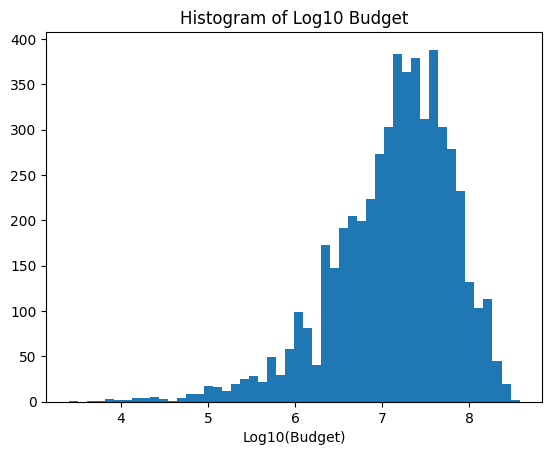

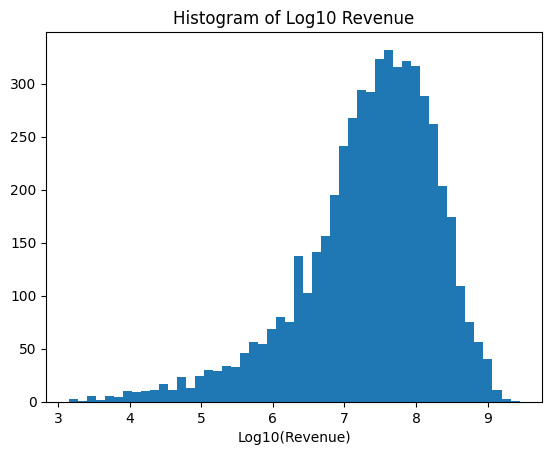

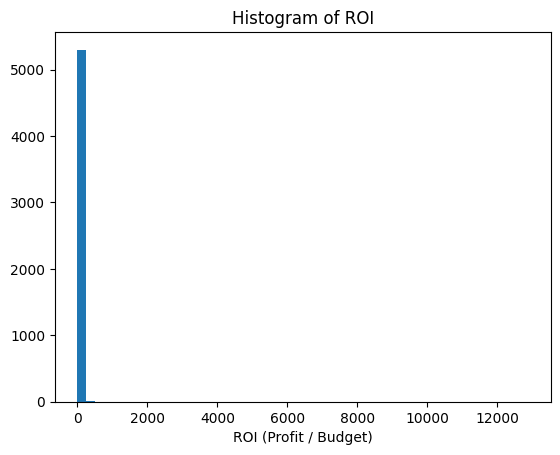

<ipython-input-36-583f145c340b>:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  roi_by_tier = df.groupby('Budget Tier')['ROI'].mean()


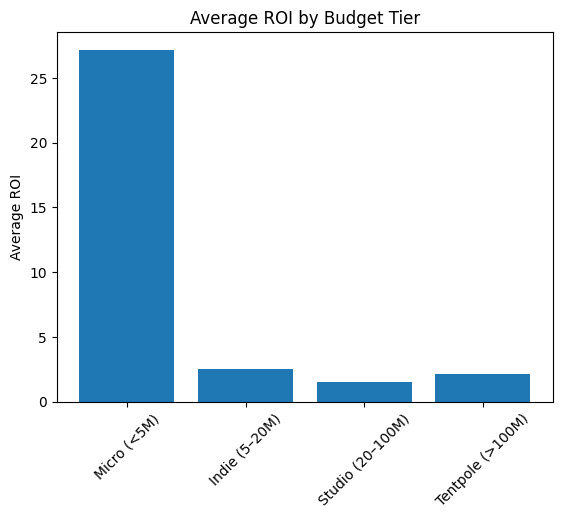

Top 1% by Profit:
                                                Title     Budget     Revenue  \
0                                              Avatar  237000000  2787965087   
1                        Star Wars: The Force Awakens  245000000  2068223624   
2                                             Titanic  200000000  1845034188   
3                                             Titanic  200000000  1845034188   
4                                      Jurassic World  150000000  1513528810   
5                                           Furious 7  190000000  1506249360   
6                                        The Avengers  220000000  1519557910   
7                                        The Avengers  220000000  1519557910   
8        Harry Potter and the Deathly Hallows: Part 2  125000000  1342000000   
9                             Avengers: Age of Ultron  280000000  1405403694   
10                                             Frozen  150000000  1274219009   
11                    

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 1. Log‐scale histograms for Budget and Revenue
for col in ['Budget', 'Revenue']:
    plt.figure()
    plt.hist(np.log10(df[col] + 1), bins=50)
    plt.xlabel(f'Log10({col})')
    plt.title(f'Histogram of Log10 {col}')
    plt.show()

# 2. Compute ROI
df['ROI'] = df['Profit'] / df['Budget']

# Histogram of ROI
plt.figure()
plt.hist(df['ROI'].dropna(), bins=50)
plt.xlabel('ROI (Profit / Budget)')
plt.title('Histogram of ROI')
plt.show()

# 3. Budget tiers and average ROI by tier
bins = [0, 5e6, 20e6, 100e6, df['Budget'].max()]
labels = ['Micro (<5M)', 'Indie (5–20M)', 'Studio (20–100M)', 'Tentpole (>100M)']
df['Budget Tier'] = pd.cut(df['Budget'], bins=bins, labels=labels, include_lowest=True)

roi_by_tier = df.groupby('Budget Tier')['ROI'].mean()
plt.figure()
plt.bar(roi_by_tier.index, roi_by_tier.values)
plt.xticks(rotation=45)
plt.ylabel('Average ROI')
plt.title('Average ROI by Budget Tier')
plt.show()

# 4. Outlier examination: top 1% by Profit and by Budget
thr_profit = df['Profit'].quantile(0.99)
top_profit = df[df['Profit'] >= thr_profit][['Title','Budget','Revenue','Profit','ROI']]
print("Top 1% by Profit:")
print(top_profit.sort_values('Profit', ascending=False).reset_index(drop=True))

thr_budget = df['Budget'].quantile(0.99)
top_budget = df[df['Budget'] >= thr_budget][['Title','Budget','Revenue','Profit','ROI']]
print("\nTop 1% by Budget:")
print(top_budget.sort_values('Budget', ascending=False).reset_index(drop=True))


In [ ]:
import pandas as pd

# 1. Load Final 3
in_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 3.xlsx'
df = pd.read_excel(in_path, parse_dates=['Release Date'])

# 2. Compute ROI
df['ROI'] = df['Profit'] / df['Budget']

# 3. Insert ROI right after Profit
cols = df.columns.tolist()
# remove ROI from end
cols.remove('ROI')
# find Profit position
p_idx = cols.index('Profit')
# insert ROI
cols.insert(p_idx+1, 'ROI')
# reorder
df = df[cols]

# 4. Quick peek
print("Columns around Profit/ROI:", df.columns[p_idx:p_idx+3].tolist())
print(df[['Profit','ROI']].head())

# 5. Save as Final 4.xlsx
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df.to_excel(out_path, index=False)
print(f"\nSaved with ROI column as {out_path}")

Columns around Profit/ROI: ['Profit', 'ROI', 'IMDb Rating']
    Profit        ROI
0   120054   6.935128
1  7750000  31.000000
2  7750000  31.000000
3  -699800  -0.636182
4    78226   0.068882

Saved with ROI column as /content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx


ROI Descriptive Statistics:
count     5312.000000
mean         7.963634
std        189.461751
min         -0.999790
25%         -0.196324
50%          1.076918
75%          3.257029
max      12889.386667
Name: ROI, dtype: float64 

Percentage of films with negative ROI: 29.37%



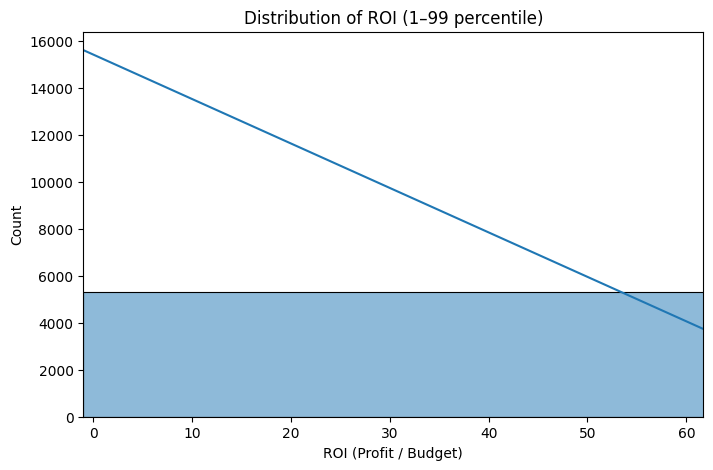

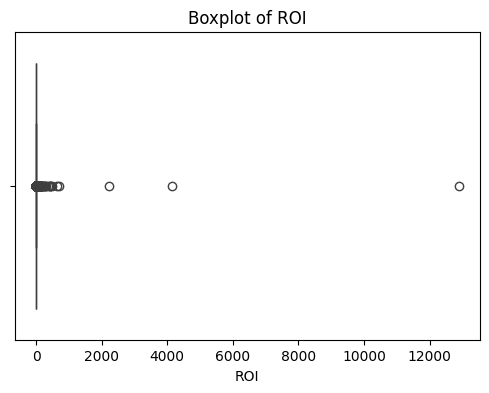

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read the file (adjust path if needed)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Ensure ROI exists
if 'ROI' not in df.columns:
    df['ROI'] = (df['Revenue'] - df['Budget']) / df['Budget']

# 3. Descriptive statistics
print("ROI Descriptive Statistics:")
print(df['ROI'].describe(), "\n")

# 4. % of films losing money
neg_pct = (df['ROI'] < 0).mean() * 100
print(f"Percentage of films with negative ROI: {neg_pct:.2f}%\n")

# 5. Histogram (with 1st–99th percentile limits to tame outliers)
plt.figure(figsize=(8,5))
sns.histplot(df['ROI'], bins=50, kde=True)
plt.xlim(df['ROI'].quantile(0.01), df['ROI'].quantile(0.99))
plt.xlabel('ROI (Profit / Budget)')
plt.title('Distribution of ROI (1–99 percentile)')
plt.show()

# 6. Boxplot
plt.figure(figsize=(6,4))
sns.boxplot(x=df['ROI'])
plt.xlabel('ROI')
plt.title('Boxplot of ROI')
plt.show()


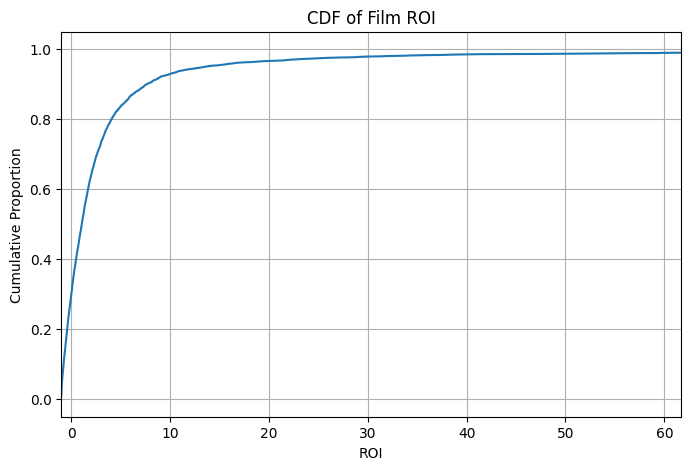

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

roi = df['ROI'].dropna().sort_values()
cdf = np.arange(len(roi)) / float(len(roi))

plt.figure(figsize=(8,5))
plt.plot(roi, cdf)
plt.xlim(roi.quantile(0.01), roi.quantile(0.99))
plt.xlabel('ROI')
plt.ylabel('Cumulative Proportion')
plt.title('CDF of Film ROI')
plt.grid(True)
plt.show()


In [ ]:
import seaborn as sns

plt.figure(figsize=(10,6))
sns.violinplot(x='Budget Tier', y='ROI', data=df, inner='quartile')
plt.ylim(df['ROI'].quantile(0.05), df['ROI'].quantile(0.95))
plt.title('ROI Distribution by Budget Tier')
plt.show()


ValueError: Could not interpret value `Budget Tier` for `x`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

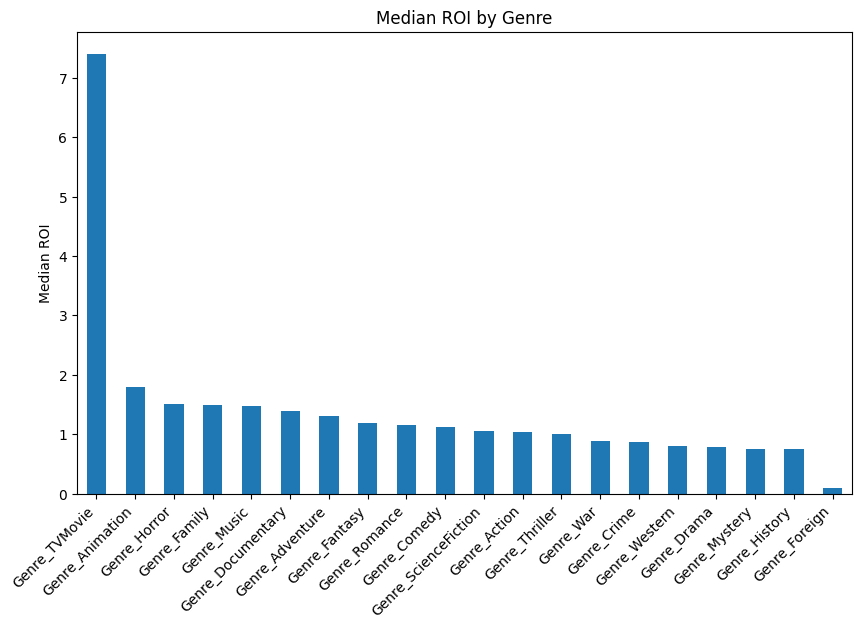

In [ ]:
# Compute mean or median ROI per genre
genre_cols = [c for c in df.columns if c.startswith('Genre_')]
median_roi = {g: df.loc[df[g]==1, 'ROI'].median() for g in genre_cols}
median_roi = pd.Series(median_roi).sort_values(ascending=False)

plt.figure(figsize=(10,6))
median_roi.plot.bar()
plt.ylabel('Median ROI')
plt.title('Median ROI by Genre')
plt.xticks(rotation=45, ha='right')
plt.show()


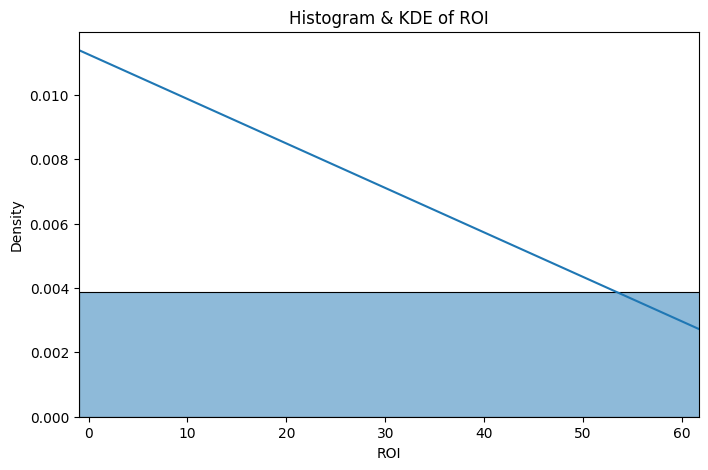

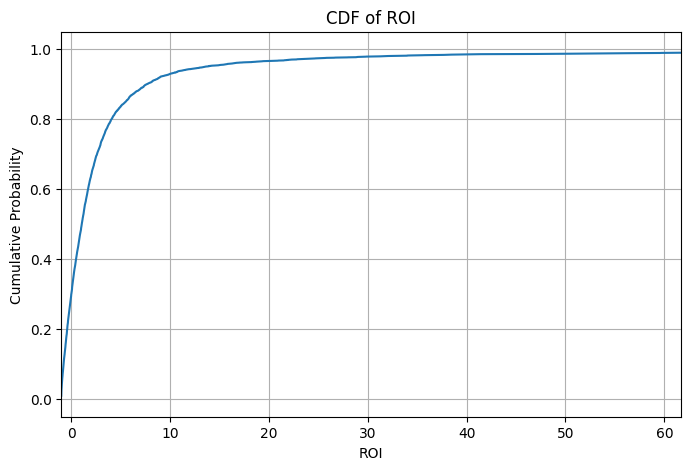

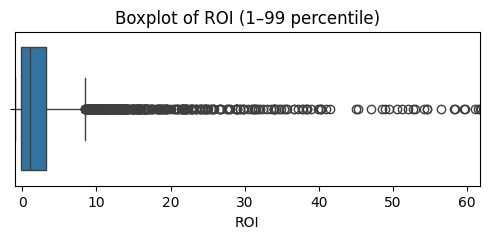

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# Ensure ROI column exists
if 'ROI' not in df:
    df['ROI'] = (df['Revenue'] - df['Budget']) / df['Budget']

# Clip extremes at 1st and 99th percentiles for plotting
lo, hi = df['ROI'].quantile([0.01, 0.99])

# 1) Histogram + KDE
plt.figure(figsize=(8,5))
sns.histplot(df['ROI'], bins=50, kde=True, stat="density")
plt.xlim(lo, hi)
plt.xlabel('ROI')
plt.title('Histogram & KDE of ROI')
plt.show()

# 2) CDF
roi_sorted = np.sort(df['ROI'].dropna())
cdf = np.arange(len(roi_sorted)) / float(len(roi_sorted))
plt.figure(figsize=(8,5))
plt.plot(roi_sorted, cdf)
plt.xlim(lo, hi)
plt.xlabel('ROI')
plt.ylabel('Cumulative Probability')
plt.title('CDF of ROI')
plt.grid(True)
plt.show()

# 3) Boxplot
plt.figure(figsize=(6,2))
sns.boxplot(x=df['ROI'])
plt.xlim(lo, hi)
plt.xlabel('ROI')
plt.title('Boxplot of ROI (1–99 percentile)')
plt.show()


Counts per 5% ROI bin:
ROI_bin
-25% to -20%    63
-20% to -15%    66
-15% to -10%    55
-10% to -5%     60
-5% to 0%       57
0% to 4%        68
4% to 9%        62
9% to 14%       71
14% to 19%      57
19% to 24%      58
Name: count, dtype: int64


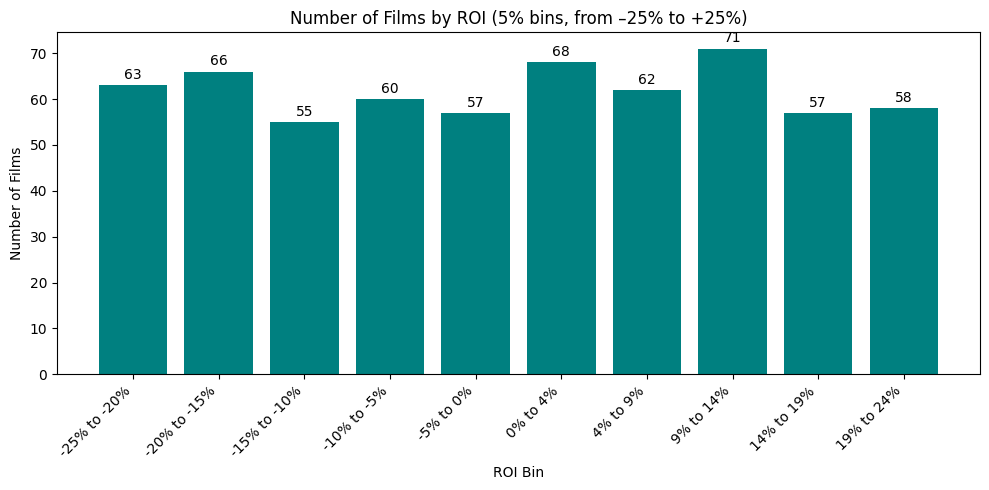

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ROI from Final 4.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, usecols=['ROI'])

# 2. Define 5% bins from -25% to +25%
bin_edges = np.arange(-0.25, 0.2501, 0.05)  # [-0.25, -0.20, ..., 0.20, 0.25]
bin_labels = [f"{int(left*100)}% to {int((left+0.05)*100)}%" for left in bin_edges[:-1]]

# 3. Bin the ROI values, ignoring those outside ±25%
df['ROI_bin'] = pd.cut(df['ROI'], bins=bin_edges, labels=bin_labels)

# 4. Count per bin
counts = df['ROI_bin'].value_counts().reindex(bin_labels, fill_value=0)
print("Counts per 5% ROI bin:")
print(counts)

# 5. Plot
plt.figure(figsize=(10,5))
plt.bar(bin_labels, counts.values, color='teal')
plt.xticks(rotation=45, ha='right')
plt.xlabel('ROI Bin')
plt.ylabel('Number of Films')
plt.title('Number of Films by ROI (5% bins, from –25% to +25%)')
for i, v in enumerate(counts.values):
    plt.text(i, v + max(counts.values)*0.01, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ROI from Final 4.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, usecols=['ROI'])

# 2. Define bin edges including tails
edges = [-np.inf] + list(np.arange(-0.25, 0.3001, 0.05)) + [np.inf]
# e.g. [-inf, -0.25, -0.20, …, 0.25, inf]

# 3. Create human‐readable labels
labels = ['≤ -25%'] + \
         [f"{int(left*100)}% to {int((left+0.05)*100)}%"
          for left in np.arange(-0.25, 0.25, 0.05)] + \
         ['> 25%']

# 4. Bin the data
df['ROI_bin'] = pd.cut(df['ROI'], bins=edges, labels=labels)

# 5. Count per bin
counts = df['ROI_bin'].value_counts().reindex(labels, fill_value=0)
print("Counts per ROI bin (including tails):")
print(counts)

# 6. Plot
plt.figure(figsize=(12,5))
plt.bar(labels, counts.values, color='teal')
plt.xticks(rotation=45, ha='right')
plt.xlabel('ROI Bin')
plt.ylabel('Number of Films')
plt.title('Number of Films by ROI (5% bins with tails)')
for i, v in enumerate(counts.values):
    plt.text(i, v + max(counts.values)*0.01, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


ValueError: Bin labels must be one fewer than the number of bin edges

Counts per ROI bin:
ROI_bin
≤ -25%          1259
-25% to -20%      63
-20% to -15%      66
-15% to -10%      55
-10% to -5%       60
-5% to 0%         57
0% to 4%          68
4% to 9%          62
9% to 14%         71
14% to 19%        57
19% to 24%        58
> 25%           3436
Name: count, dtype: int64


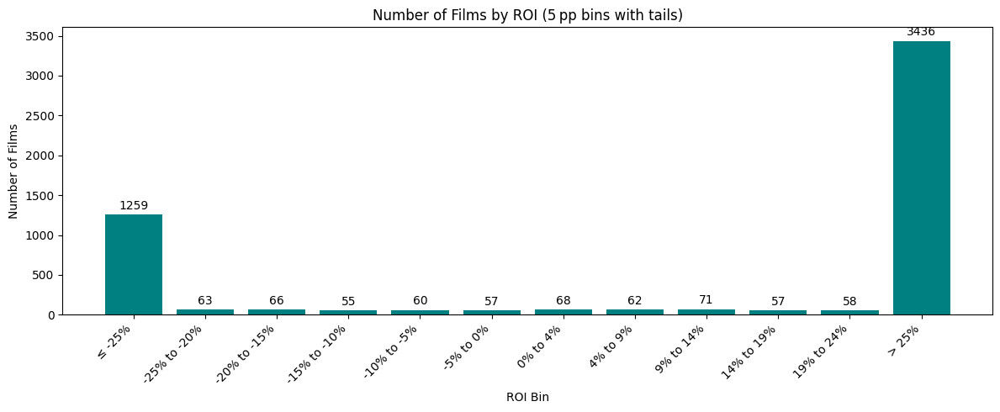

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ROI from Final 4.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, usecols=['ROI'])

# 2. Define bin edges and labels
edges = [-np.inf] + list(np.arange(-0.25, 0.25+0.05, 0.05)) + [np.inf]
# edges = [-inf, -0.25, -0.20, ..., 0.20, 0.25, inf]

labels = (
    ['≤ -25%'] +
    [f"{int(l*100)}% to {int((l+0.05)*100)}%" for l in np.arange(-0.25, 0.25, 0.05)] +
    ['> 25%']
)
# labels length = len(edges) - 1

# 3. Bin the ROI values
df['ROI_bin'] = pd.cut(df['ROI'], bins=edges, labels=labels)

# 4. Count per bin
counts = df['ROI_bin'].value_counts().reindex(labels, fill_value=0)
print("Counts per ROI bin:")
print(counts)

# 5. Plot
plt.figure(figsize=(12,5))
plt.bar(labels, counts.values, color='teal')
plt.xticks(rotation=45, ha='right')
plt.xlabel('ROI Bin')
plt.ylabel('Number of Films')
plt.title('Number of Films by ROI (5 pp bins with tails)')
for i, v in enumerate(counts.values):
    plt.text(i, v + max(counts.values)*0.01, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


Counts per ROI bin:
ROI_bin
≤ -25%          1259
-25% to -15%     129
-15% to -5%      116
-5% to 5%        124
5% to 15%        133
15% to 25%       116
> 25%           3435
Name: count, dtype: int64


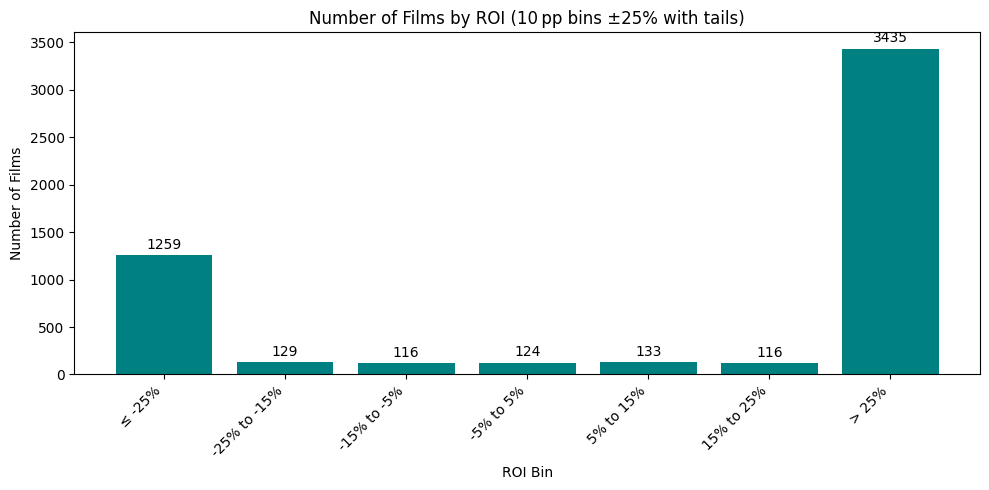

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ROI from Final 4.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, usecols=['ROI'])

# 2. Define “sensible” bin edges and labels
edges = [
    -np.inf,
    -0.25,  # ≤ -25%
    -0.15,  # -25% to -15%
    -0.05,  # -15% to -5%
     0.05,  # -5% to 5%
     0.15,  # 5% to 15%
     0.25,  # 15% to 25%
     np.inf # > 25%
]
labels = [
    '≤ -25%',
    '-25% to -15%',
    '-15% to -5%',
    '-5% to 5%',
    '5% to 15%',
    '15% to 25%',
    '> 25%'
]

# 3. Bin the ROI values
df['ROI_bin'] = pd.cut(df['ROI'], bins=edges, labels=labels)

# 4. Count per bin
counts = df['ROI_bin'].value_counts().reindex(labels, fill_value=0)
print("Counts per ROI bin:")
print(counts)

# 5. Plot
plt.figure(figsize=(10,5))
plt.bar(labels, counts.values, color='teal')
plt.xticks(rotation=45, ha='right')
plt.xlabel('ROI Bin')
plt.ylabel('Number of Films')
plt.title('Number of Films by ROI (10 pp bins ±25% with tails)')
for i, v in enumerate(counts.values):
    plt.text(i, v + max(counts.values)*0.01, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


Counts per ROI bin:
ROI_bin
≤ -100%            0
-100% to -90%    303
-90% to -80%     168
-80% to -70%     164
-70% to -60%     129
-60% to -50%     152
-50% to -40%     141
-40% to -30%     143
-30% to -20%     120
-20% to -10%     123
-10% to 0%       117
0% to 9%         130
9% to 19%        128
19% to 29%       112
29% to 39%        92
39% to 49%       100
49% to 59%       101
59% to 69%        80
69% to 79%        96
79% to 89%       102
89% to 99%        71
99% to 150%      456
150% to 200%     357
200% to 250%     286
250% to 300%     216
300% to 350%     194
350% to 400%     147
400% to 450%     126
450% to 500%      85
> 500%           873
Name: count, dtype: int64


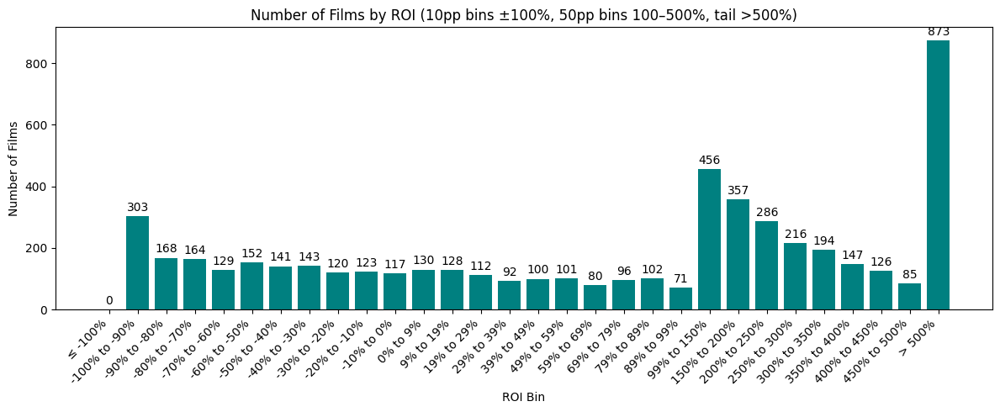

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ROI from Final 4.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, usecols=['ROI'])

# 2. Define bin edges
#   - 10pp bins from -100% to +100%
edges1 = np.arange(-1.0, 1.0 + 0.1, 0.1)     # [-1.0, -0.9, ..., 0.9, 1.0]
#   - 50pp bins from +100% to +500%
edges2 = np.arange(1.0, 5.0 + 0.5, 0.5)      # [1.0, 1.5, 2.0, ..., 4.5, 5.0]
# Combine with open tails
edges = np.concatenate(([-np.inf], edges1, edges2[1:], [np.inf]))

# 3. Create labels
labels = []
for i in range(len(edges)-1):
    left, right = edges[i], edges[i+1]
    if left == -np.inf:
        labels.append(f"≤ {int(edges1[0]*100)}%")
    elif right == np.inf:
        labels.append(f"> {int(edges2[-1]*100)}%")
    else:
        labels.append(f"{int(left*100)}% to {int(right*100)}%")

# 4. Bin and count
df['ROI_bin'] = pd.cut(df['ROI'], bins=edges, labels=labels)
counts = df['ROI_bin'].value_counts().reindex(labels, fill_value=0)

print("Counts per ROI bin:")
print(counts)

# 5. Plot
plt.figure(figsize=(12,5))
plt.bar(labels, counts.values, color='teal')
plt.xticks(rotation=45, ha='right')
plt.xlabel('ROI Bin')
plt.ylabel('Number of Films')
plt.title('Number of Films by ROI (10pp bins ±100%, 50pp bins 100–500%, tail >500%)')
for i, v in enumerate(counts.values):
    plt.text(i, v + max(counts.values)*0.01, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ROI
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, usecols=['ROI'])
roi = df['ROI'].dropna()

# 2. Determine max ROI for tail bins
max_roi = roi.max()

# 3. Define edges
#  - 10pp bins from -100% to +100%
edges1 = np.arange(-1.0, 1.0 + 0.1, 0.1)      # [-1.0, -0.9, …, 0.9, 1.0]
#  - 50pp bins from +100% to +500%
edges2 = np.arange(1.0, 5.0 + 0.5, 0.5)       # [1.0, 1.5, …, 4.5, 5.0]
#  - 150pp bins above +500%
edges3 = np.arange(5.0, max_roi + 1.5, 1.5)   # [5.0, 6.5, 8.0, … up to ≥ max_roi]
# Combine with open tails
edges = np.concatenate(([-np.inf], edges1, edges2[1:], edges3[1:], [np.inf]))

# 4. Build labels
labels = []
for left, right in zip(edges[:-1], edges[1:]):
    if left == -np.inf:
        labels.append(f"≤ {int(edges1[0]*100)}%")
    elif right == np.inf:
        labels.append(f"> {int(edges3[-1]*100)}%")
    else:
        labels.append(f"{int(left*100)}% to {int(right*100)}%")

# 5. Bin and count
df['ROI_bin'] = pd.cut(roi, bins=edges, labels=labels)
counts = df['ROI_bin'].value_counts().reindex(labels, fill_value=0)

print("Counts per ROI bin:")
print(counts)

# 6. Plot
plt.figure(figsize=(14,5))
plt.bar(labels, counts.values, color='teal')
plt.xticks(rotation=45, ha='right')
plt.xlabel('ROI Bin')
plt.ylabel('Number of Films')
plt.title('Films by ROI (10pp ±100%, 50pp 100–500%, 150pp >500%)')
for i, v in enumerate(counts.values):
    plt.text(i, v + max(counts.values)*0.01, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


Counts per ROI bin:
ROI_bin
≤ -100%                   0
-100% to -90%           303
-90% to -80%            168
-80% to -70%            164
-70% to -60%            129
                       ... 
1288400% to 1288550%      0
1288550% to 1288700%      0
1288700% to 1288850%      0
1288850% to 1289000%      1
> 1289000%                0
Name: count, Length: 8620, dtype: int64


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7d2651bb4400> (for post_execute):


KeyboardInterrupt: 

Counts per ROI bin:
ROI_bin
≤ -100%            0
-100% to -90%    303
-90% to -80%     168
-80% to -70%     164
-70% to -60%     129
-60% to -50%     152
-50% to -40%     141
-40% to -30%     143
-30% to -20%     120
-20% to -10%     123
-10% to 0%       117
0% to 9%         130
9% to 19%        128
19% to 29%       112
29% to 39%        92
39% to 49%       100
49% to 59%       101
59% to 69%        80
69% to 79%        96
79% to 89%       102
89% to 99%        71
99% to 150%      456
150% to 200%     357
200% to 250%     286
250% to 300%     216
300% to 350%     194
350% to 400%     147
400% to 450%     126
450% to 500%      85
500% to 3k%      761
3k% to 5.5k%      51
5.5k% to 8k%      21
8k% to 10.5k%     13
> 10.5k%          27
Name: count, dtype: int64


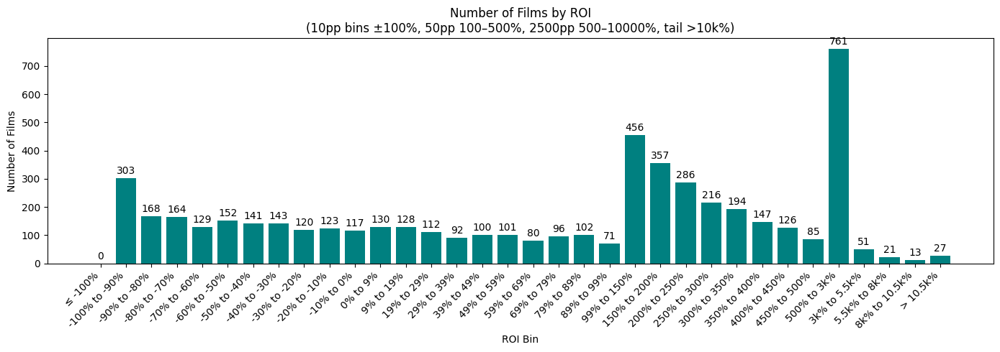

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load ROI from Final 4.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, usecols=['ROI'])

# 2. Define bin edges
edges1 = np.arange(-1.0, 1.0 + 0.1, 0.1)   # -100% to +100% in 10pp
edges2 = np.arange(1.0, 5.0 + 0.5, 0.5)    # 100% to 500% in 50pp
edges3 = np.arange(5.0, 100.0 + 25.0, 25.0) # 500% to 10000% in 2500pp
edges = np.concatenate(([-np.inf], edges1, edges2[1:], edges3[1:], [np.inf]))

# 3. Helper to format percentages, using "k%" for ≥1000%
def fmt_pct(frac):
    pct = frac * 100
    if np.isinf(pct):
        return None
    if abs(pct) >= 1000:
        k = pct / 1000
        return f"{k:.1f}k%" if not k.is_integer() else f"{int(k)}k%"
    else:
        return f"{int(pct)}%"

# 4. Build labels
labels = []
for left, right in zip(edges[:-1], edges[1:]):
    if np.isneginf(left):
        labels.append(f"≤ {fmt_pct(edges1[0])}")
    elif np.isposinf(right):
        labels.append(f"> {fmt_pct(edges3[-1])}")
    else:
        labels.append(f"{fmt_pct(left)} to {fmt_pct(right)}")

# 5. Bin and count
df['ROI_bin'] = pd.cut(df['ROI'], bins=edges, labels=labels)
counts = df['ROI_bin'].value_counts().reindex(labels, fill_value=0)
print("Counts per ROI bin:")
print(counts)

# 6. Plot
plt.figure(figsize=(14,5))
plt.bar(labels, counts.values, color='teal')
plt.xticks(rotation=45, ha='right')
plt.xlabel('ROI Bin')
plt.ylabel('Number of Films')
plt.title('Number of Films by ROI\n(10pp bins ±100%, 50pp 100–500%, 2500pp 500–10000%, tail >10k%)')
for i, v in enumerate(counts.values):
    plt.text(i, v + counts.max()*0.01, str(v), ha='center', va='bottom')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# 1. Load the data
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 4.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Define bins & labels

# Budget tiers (USD)
budget_bins  = [0, 5e6, 20e6, 100e6, float('inf')]
budget_labels= ['Micro (<5M)','Indie (5–20M)','Studio (20–100M)','Tentpole (>100M)']

# Revenue tiers (USD)
revenue_bins  = [0, 10e6, 50e6, 200e6, float('inf')]
revenue_labels= ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']

# Profit tiers (USD)
profit_bins   = [float('-inf'), 0, 10e6, 50e6, 200e6, float('inf')]
profit_labels = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']

# ROI tiers (fraction)
roi_bins   = [float('-inf'), 0, 1, 2, 5, float('inf')]
roi_labels = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

# 3. Create the tier columns
df['Budget Tier']  = pd.cut(df['Budget'], bins=budget_bins, labels=budget_labels, include_lowest=True)
df['Revenue Tier'] = pd.cut(df['Revenue'], bins=revenue_bins, labels=revenue_labels, include_lowest=True)
df['Profit Tier']  = pd.cut(df['Profit'], bins=profit_bins, labels=profit_labels)
df['ROI Category'] = pd.cut(df['ROI'], bins=roi_bins, labels=roi_labels)

# 4. Show counts for each
print("Budget Tier counts:\n", df['Budget Tier'].value_counts(), "\n")
print("Revenue Tier counts:\n", df['Revenue Tier'].value_counts(), "\n")
print("Profit Tier counts:\n", df['Profit Tier'].value_counts(), "\n")
print("ROI Category counts:\n", df['ROI Category'].value_counts(), "\n")

# 5. Save as Final 5.xlsx
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 5.xlsx'
df.to_excel(out_path, index=False)
print(f"Saved with new tier columns as {out_path}")


Budget Tier counts:
 Budget Tier
Studio (20–100M)    1996
Indie (5–20M)       1723
Micro (<5M)         1256
Tentpole (>100M)     337
Name: count, dtype: int64 

Revenue Tier counts:
 Revenue Tier
Mid‑range (10–50M)     1663
Small (<10M)           1511
Large (50–200M)        1449
Blockbuster (>200M)     689
Name: count, dtype: int64 

Profit Tier counts:
 Profit Tier
Loss (<0)            1575
Moderate (10–50M)    1205
High (50–200M)       1100
Low (0–10M)           958
Superhit (>200M)      474
Name: count, dtype: int64 

ROI Category counts:
 ROI Category
Negative (<0)       1575
High (2–5)          1054
Low (0–1)           1007
Exceptional (>5)     873
Medium (1–2)         803
Name: count, dtype: int64 

Saved with new tier columns as /content/drive/My Drive/Colab Notebooks/804 Capstone/Final 5.xlsx


Columns in Final 5.xlsx:
['ID', 'IMDb ID', 'Release Date', 'Release Day', 'ReleaseYear_bin', 'Runtime_bin', 'Season', 'Holidays', 'Language', 'Country', 'Studio', 'Series', 'Director', 'Lead Actor', '2nd Actor', '3rd Actor', 'Title', 'Series or not', 'Release Year', 'Release Month', 'Release Month-Date', 'Runtime', 'Budget', 'Revenue', 'Profit', 'ROI', 'IMDb Rating', 'IMDb Votes', 'IMDb Advanced Rating', 'Genre_Action', 'Genre_Adventure', 'Genre_Animation', 'Genre_Comedy', 'Genre_Crime', 'Genre_Documentary', 'Genre_Drama', 'Genre_Family', 'Genre_Fantasy', 'Genre_Foreign', 'Genre_History', 'Genre_Horror', 'Genre_Music', 'Genre_Mystery', 'Genre_Romance', 'Genre_ScienceFiction', 'Genre_TVMovie', 'Genre_Thriller', 'Genre_War', 'Genre_Western', 'RealeaseDay_Sunday', 'RealeaseDay_Monday', 'RealeaseDay_Tuesday', 'RealeaseDay_Wednesday', 'RealeaseDay_Thursday', 'RealeaseDay_Friday', 'RealeaseDay_Saturday', 'RealeaseDay_Early Weekdays', 'RealeaseDay_Late Weekdays', 'RealeaseDay_Weekends', 'Seas

<ipython-input-63-3a221ab7e50f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette='viridis')


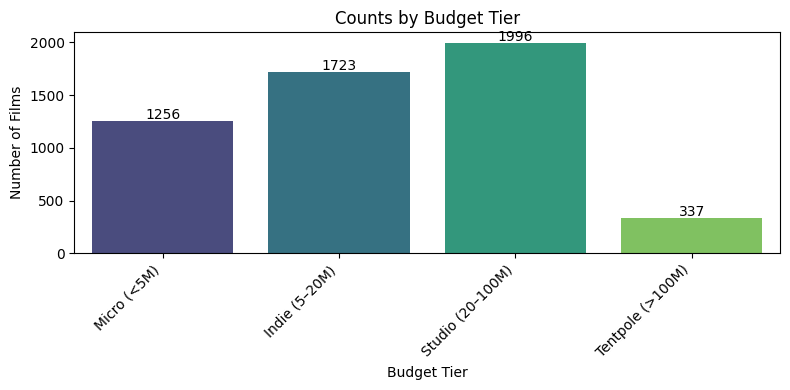

<ipython-input-63-3a221ab7e50f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette='viridis')


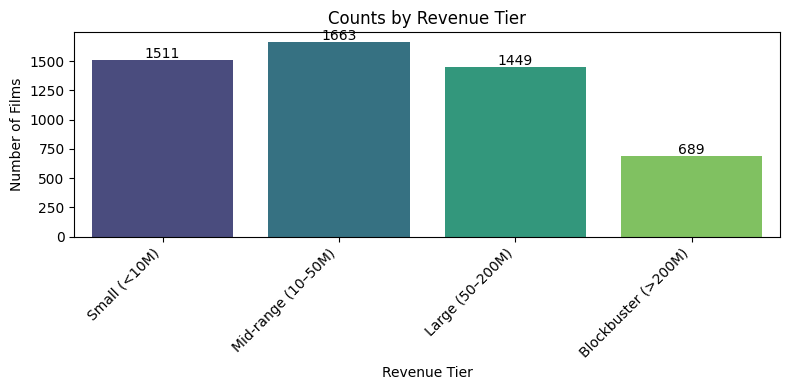

<ipython-input-63-3a221ab7e50f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette='viridis')


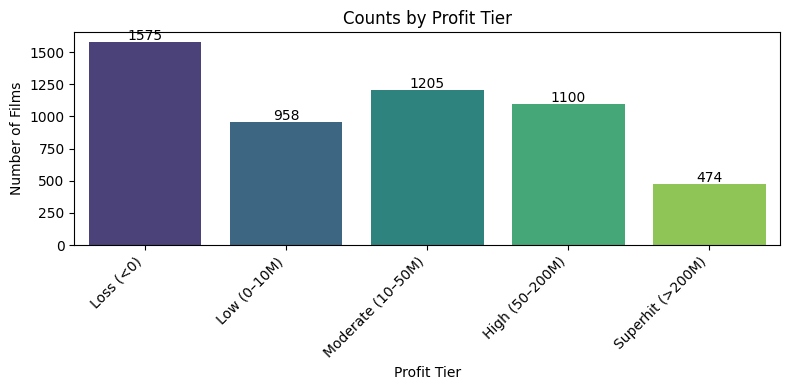

<ipython-input-63-3a221ab7e50f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette='viridis')


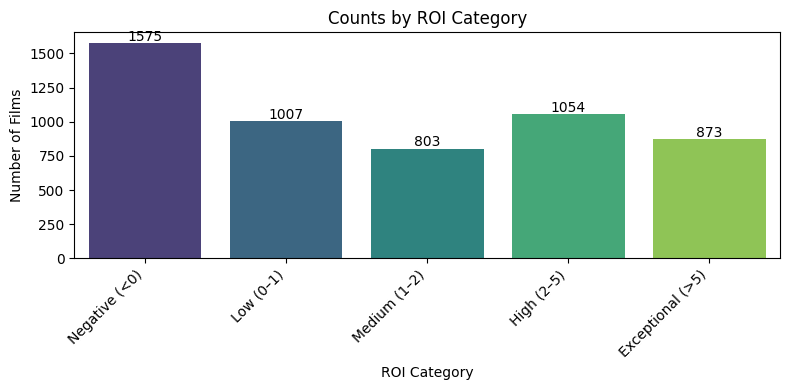

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load Final 5.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 5.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# List all columns
print("Columns in Final 5.xlsx:")
print(df.columns.tolist())

# Define the display order for each tier
tier_orders = {
    'Budget Tier':  ['Micro (<5M)','Indie (5–20M)','Studio (20–100M)','Tentpole (>100M)'],
    'Revenue Tier': ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)'],
    'Profit Tier':  ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)'],
    'ROI Category':['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']
}

# Plot counts for each tier column in the specified order
for col, order in tier_orders.items():
    counts = df[col].value_counts().reindex(order, fill_value=0)
    plt.figure(figsize=(8, 4))
    sns.barplot(x=counts.index, y=counts.values, palette='viridis')
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Counts by {col}')
    plt.ylabel('Number of Films')
    plt.xlabel(col)
    # Annotate counts
    for i, v in enumerate(counts.values):
        plt.text(i, v + counts.max()*0.01, str(v), ha='center')
    plt.tight_layout()
    plt.show()


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 77 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           4867 non-null   float64       
 1   IMDb ID                      4867 non-null   object        
 2   Release Date                 5312 non-null   datetime64[ns]
 3   Release Day                  5312 non-null   object        
 4   ReleaseYear_bin              5312 non-null   object        
 5   Runtime_bin                  5302 non-null   object        
 6   Season                       5312 non-null   object        
 7   Holidays                     1718 non-null   object        
 8   Language                     4867 non-null   object        
 9   Country                      4867 non-null   object        
 10  Studio                       4867 non-null   object        
 11  Series                       1124 non-null 

In [ ]:
import pandas as pd

# 1. Load Final 5.xlsx
input_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 5.xlsx'
df = pd.read_excel(input_path, parse_dates=['Release Date'])

# 2. Columns to move
tier_cols = ['Budget Tier', 'Revenue Tier', 'Profit Tier', 'ROI Category']

# 3. Build new column list
cols = df.columns.tolist()
# Remove tier columns from their current positions
for c in tier_cols:
    cols.remove(c)

# Insert them after position 15 (0‑based index)
# That is, after the 16th column in the original ordering
insert_pos = 16
for i, c in enumerate(tier_cols):
    cols.insert(insert_pos + i, c)

# 4. Reorder DataFrame
df = df[cols]

# 5. Verify insertion
print("Columns around the insertion point:")
print(df.columns[insert_pos-2:insert_pos+6].tolist())

# 6. Save as Final 6.xlsx
output_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df.to_excel(output_path, index=False)
print(f"Saved reordered file as {output_path}")


Columns around the insertion point:
['2nd Actor', '3rd Actor', 'Budget Tier', 'Revenue Tier', 'Profit Tier', 'ROI Category', 'Title', 'Series or not']
Saved reordered file as /content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx


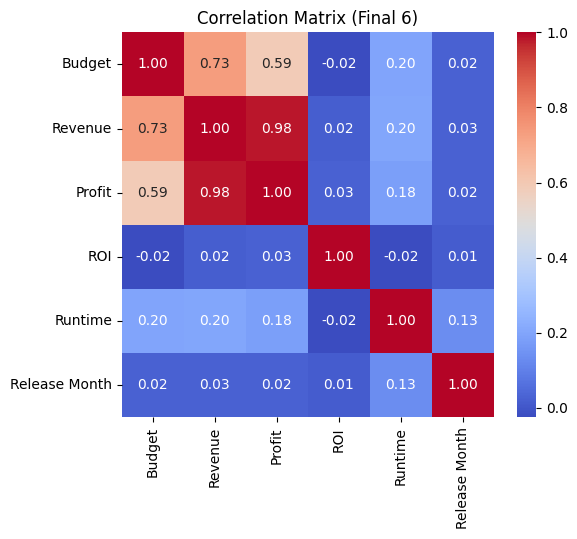

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load Final 6
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# Numeric columns of interest
nums = ['Budget','Revenue','Profit','ROI','Runtime','Release Month']
corr = df[nums].corr()

plt.figure(figsize=(6,5))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix (Final 6)")
plt.show()


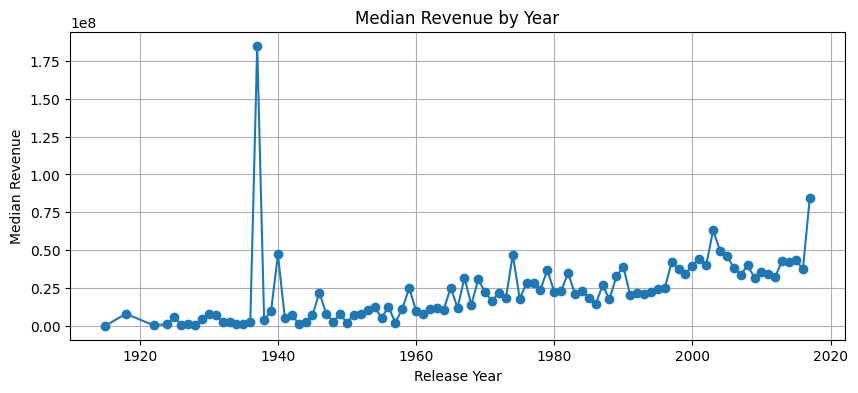

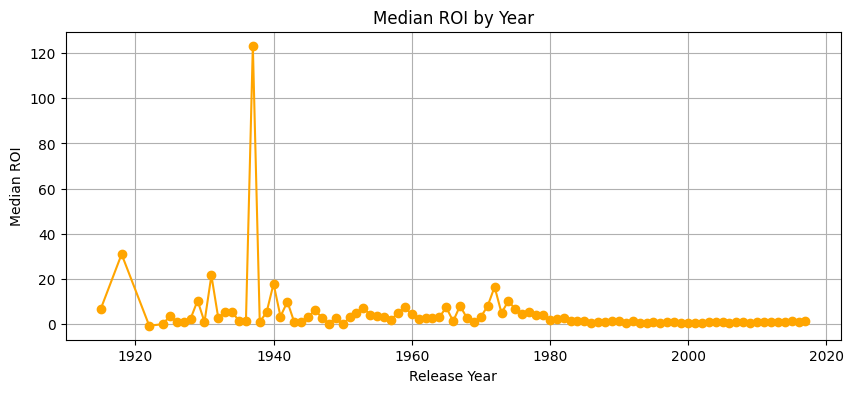

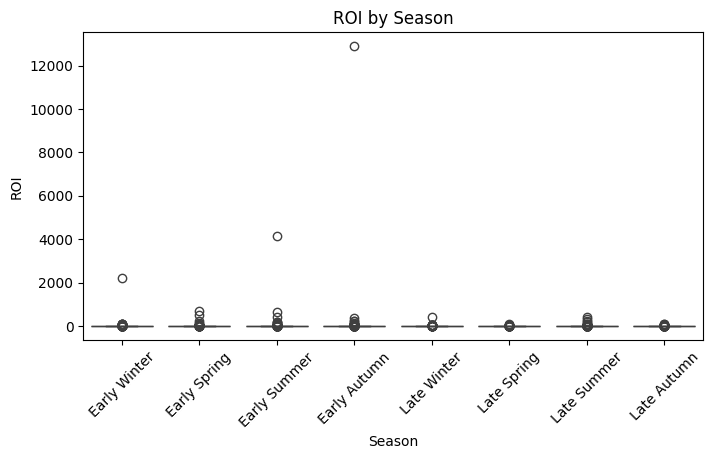

In [ ]:
# Yearly median Revenue & ROI
yearly = df.groupby('Release Year')[['Revenue','ROI']].median()

plt.figure(figsize=(10,4))
yearly['Revenue'].plot(marker='o')
plt.ylabel('Median Revenue')
plt.title('Median Revenue by Year')
plt.grid(True)
plt.show()

plt.figure(figsize=(10,4))
yearly['ROI'].plot(marker='o', color='orange')
plt.ylabel('Median ROI')
plt.title('Median ROI by Year')
plt.grid(True)
plt.show()

# Seasonality of ROI
order = [
    'Early Winter','Early Spring','Early Summer','Early Autumn',
    'Late Winter','Late Spring','Late Summer','Late Autumn'
]
plt.figure(figsize=(8,4))
sns.boxplot(x='Season', y='ROI', data=df, order=order)
plt.xticks(rotation=45)
plt.title('ROI by Season')
plt.show()


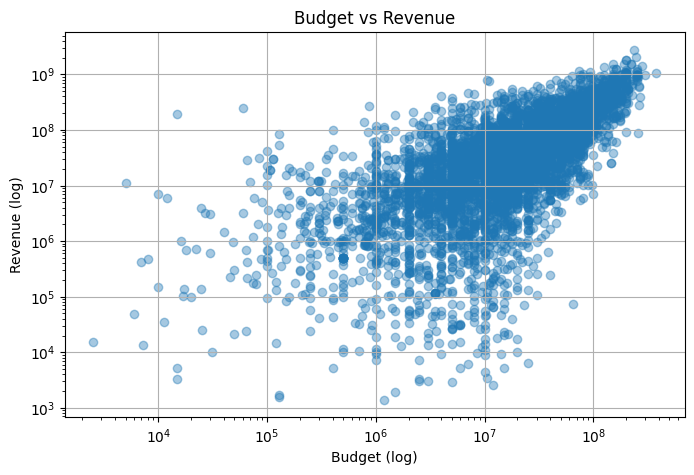

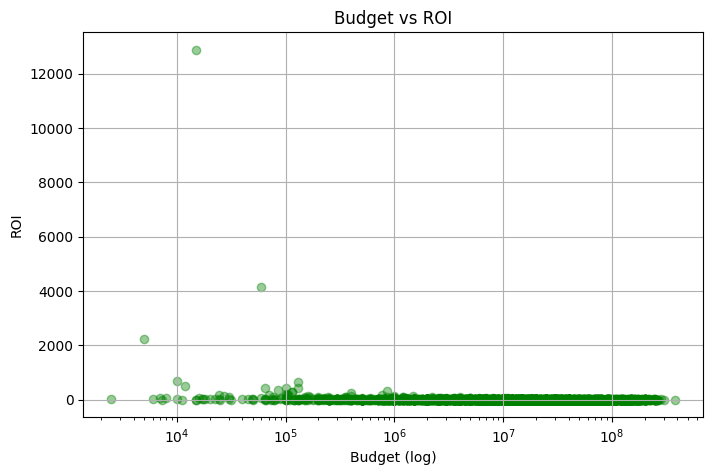

In [ ]:
plt.figure(figsize=(8,5))
plt.scatter(df['Budget'], df['Revenue'], alpha=0.4)
plt.xscale('log'); plt.yscale('log')
plt.xlabel('Budget (log)')
plt.ylabel('Revenue (log)')
plt.title('Budget vs Revenue')
plt.grid(True)
plt.show()

plt.figure(figsize=(8,5))
plt.scatter(df['Budget'], df['ROI'], alpha=0.4, color='green')
plt.xscale('log')
plt.xlabel('Budget (log)')
plt.ylabel('ROI')
plt.title('Budget vs ROI')
plt.grid(True)
plt.show()


<ipython-input-71-b93181604698>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='Revenue', data=df, palette='Set2')


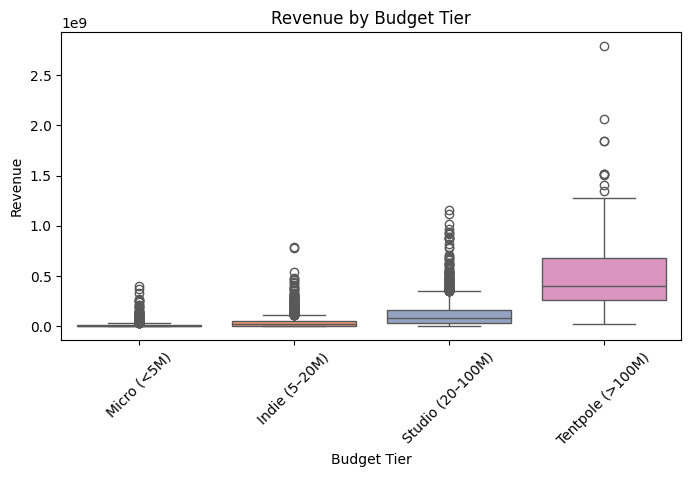

<ipython-input-71-b93181604698>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='ROI', data=df, palette='Set2')


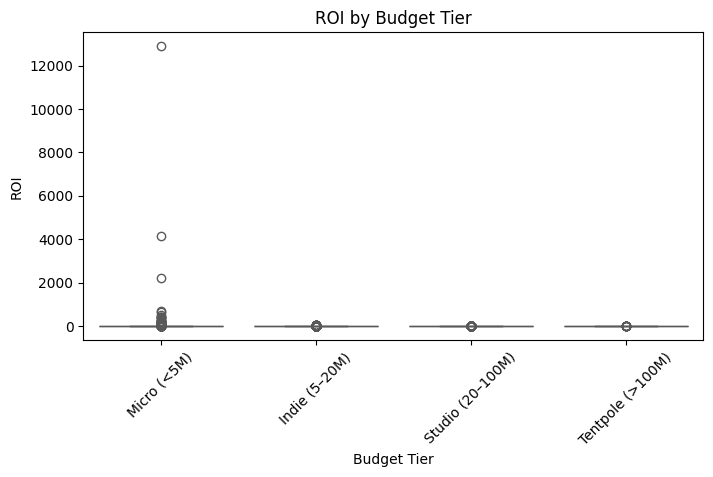

<ipython-input-71-b93181604698>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='Revenue', data=df, palette='Set2')


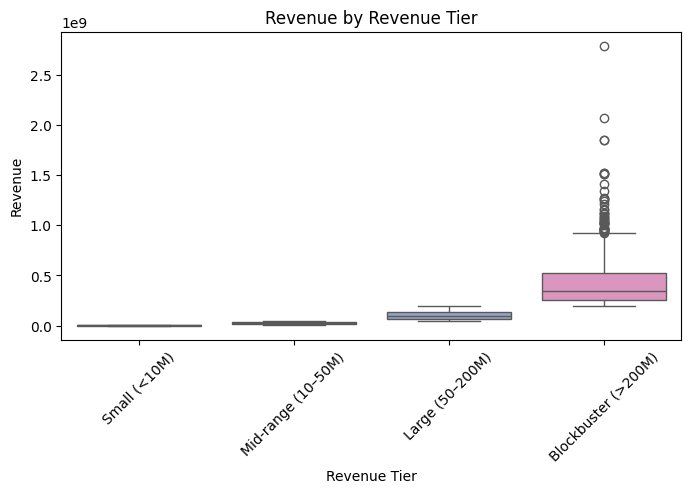

<ipython-input-71-b93181604698>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='ROI', data=df, palette='Set2')


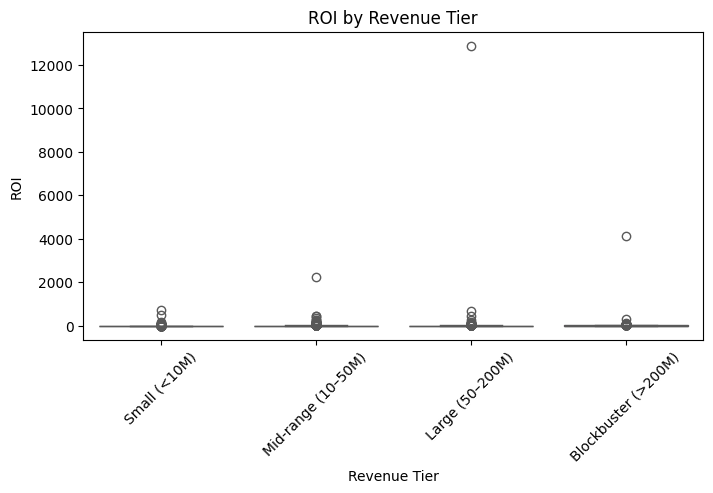

<ipython-input-71-b93181604698>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='Revenue', data=df, palette='Set2')


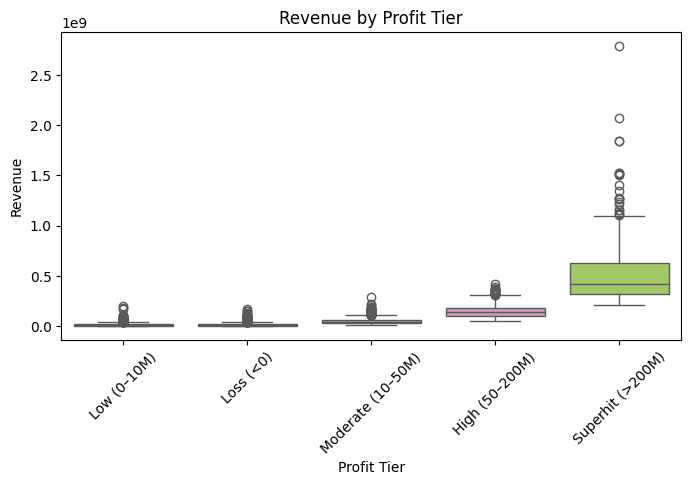

<ipython-input-71-b93181604698>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='ROI', data=df, palette='Set2')


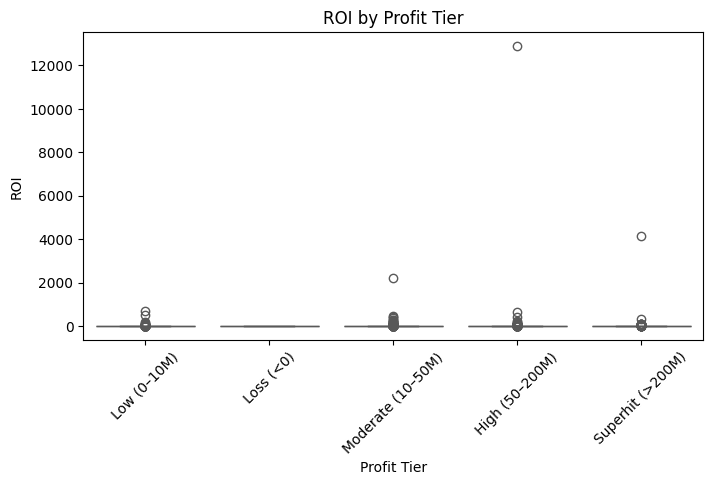

<ipython-input-71-b93181604698>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='Revenue', data=df, palette='Set2')


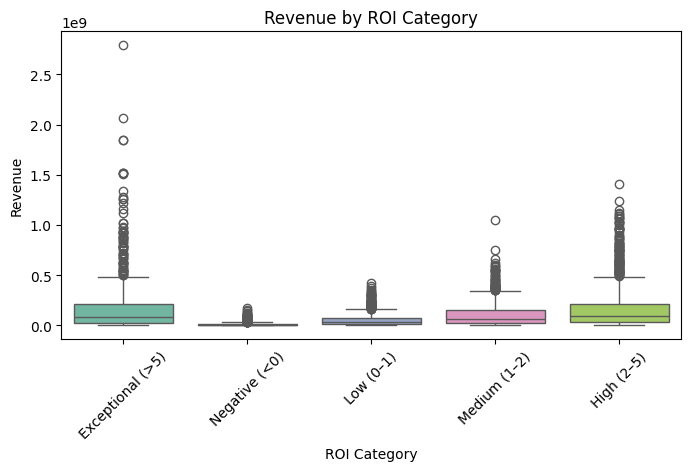

<ipython-input-71-b93181604698>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y='ROI', data=df, palette='Set2')


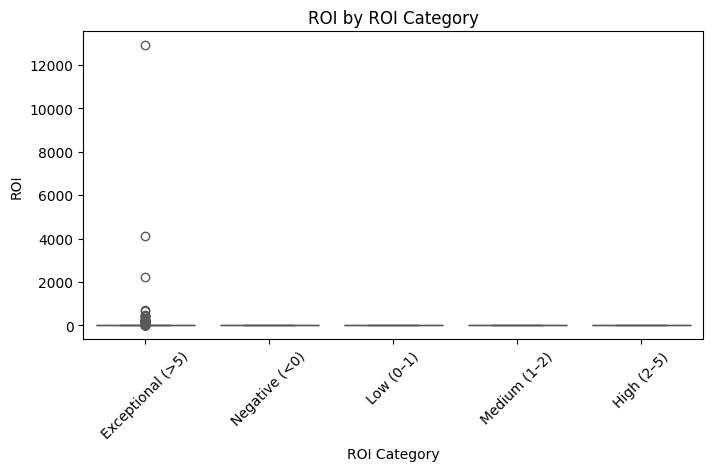

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for col in ['Budget Tier','Revenue Tier','Profit Tier','ROI Category']:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=col, y='Revenue', data=df, palette='Set2')
    plt.xticks(rotation=45)
    plt.title(f'Revenue by {col}')
    plt.show()

    plt.figure(figsize=(8,4))
    sns.boxplot(x=col, y='ROI', data=df, palette='Set2')
    plt.xticks(rotation=45)
    plt.title(f'ROI by {col}')
    plt.show()


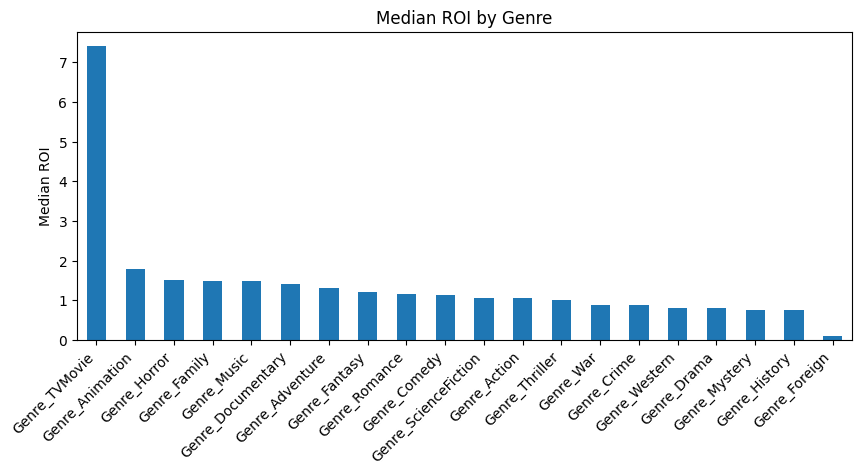

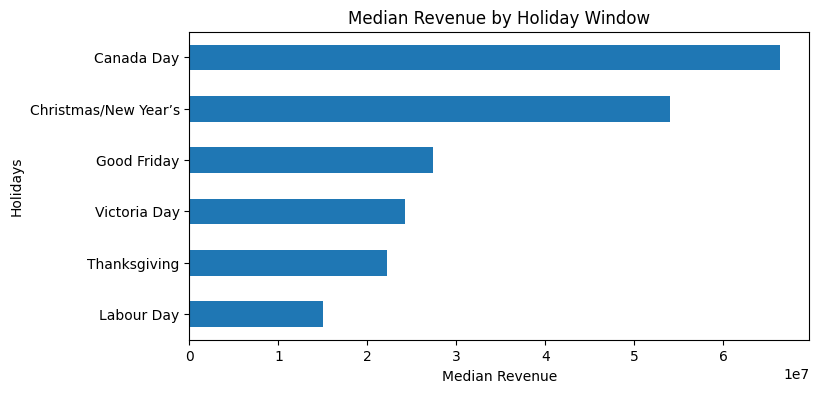

In [ ]:
# Median ROI by genre
genre_cols = [c for c in df.columns if c.startswith('Genre_')]
med_roi = {
    g: df.loc[df[g]==1, 'ROI'].median()
    for g in genre_cols
}
med_roi = pd.Series(med_roi).sort_values(ascending=False)

plt.figure(figsize=(10,4))
med_roi.plot.bar()
plt.ylabel('Median ROI')
plt.title('Median ROI by Genre')
plt.xticks(rotation=45, ha='right')
plt.show()

# Median Revenue by Holiday window
holiday_rev = df.groupby('Holidays')['Revenue'].median().sort_values()
plt.figure(figsize=(8,4))
holiday_rev.plot.barh()
plt.xlabel('Median Revenue')
plt.title('Median Revenue by Holiday Window')
plt.show()


In [ ]:
import pandas as pd

# 1. Load Final 6.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Compute missing counts and percentages
missing_cnt = df.isna().sum()
missing_pct = (missing_cnt / len(df) * 100).round(2)

# 3. Assemble into a summary DataFrame
missing_summary = pd.DataFrame({
    'Missing Count': missing_cnt,
    'Missing %': missing_pct
})

# 4. Filter to only columns with any missing values
missing_summary = missing_summary[missing_summary['Missing Count'] > 0]

# 5. Sort by Missing %
missing_summary = missing_summary.sort_values('Missing %', ascending=False)

print("=== Missing Value Analysis for Final 6.xlsx ===")
print(missing_summary)


=== Missing Value Analysis for Final 6.xlsx ===
                      Missing Count  Missing %
Series                         4188      78.84
Holidays                       3594      67.66
3rd Actor                       487       9.17
2nd Actor                       484       9.11
Lead Actor                      476       8.96
Director                        472       8.89
IMDb ID                         445       8.38
ID                              445       8.38
Series or not                   445       8.38
Studio                          445       8.38
Language                        445       8.38
Country                         445       8.38
IMDb Votes                      445       8.38
IMDb Rating                     445       8.38
IMDb Advanced Rating            445       8.38
Runtime_bin                      10       0.19


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 77 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           4867 non-null   float64       
 1   IMDb ID                      4867 non-null   object        
 2   Release Date                 5312 non-null   datetime64[ns]
 3   Release Day                  5312 non-null   object        
 4   ReleaseYear_bin              5312 non-null   object        
 5   Runtime_bin                  5302 non-null   object        
 6   Season                       5312 non-null   object        
 7   Holidays                     1718 non-null   object        
 8   Language                     4867 non-null   object        
 9   Country                      4867 non-null   object        
 10  Studio                       4867 non-null   object        
 11  Series                       1124 non-null 

In [ ]:
import pandas as pd

# 1. Read Final 6 and Movies 19
lf6_path  = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
m19_path  = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Movies 19.xlsx'

df_lf6 = pd.read_excel(lf6_path,  parse_dates=['Release Date'])
df_m19 = pd.read_excel(m19_path)

# 2. Find Titles in Final 6 with any missing in the specified columns
cols_to_check = [
    'IMDb ID', 'ID', 'Series or not', 'Studio',
    'Language', 'Country', 'IMDb Votes',
    'IMDb Rating', 'IMDb Advanced Rating'
]
mask_missing_lf6 = df_lf6[cols_to_check].isna().any(axis=1)
titles_missing_lf6 = df_lf6.loc[mask_missing_lf6, 'Title'].unique()

# 3. Find Titles in Movies 19 that never appeared in Final 6 (i.e. dropped in join)
titles_lf6 = set(df_lf6['Title'].dropna())
titles_m19 = set(df_m19['Title'].dropna())
titles_unmatched_m19 = sorted(titles_m19 - titles_lf6)

# 4. Compile into one sheet
df_missing_lf6 = pd.DataFrame({
    'Title': titles_missing_lf6,
    'Source': 'Final 6 Missing'
})
df_unmatched_m19 = pd.DataFrame({
    'Title': titles_unmatched_m19,
    'Source': 'Movies 19 Unmatched'
})
df_out = pd.concat([df_missing_lf6, df_unmatched_m19], ignore_index=True)

# 5. Save to Missing 2.xlsx
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Missing 2.xlsx'
df_out.to_excel(out_path, index=False)

print(f"Saved compiled missing titles to {out_path}")
print(df_out.head(10))


Saved compiled missing titles to /content/drive/My Drive/Colab Notebooks/804 Capstone/Missing 2.xlsx
                    Title           Source
0         Bicycle Thieves  Final 6 Missing
1                Rashomon  Final 6 Missing
2           Seven Samurai  Final 6 Missing
3         Never on Sunday  Final 6 Missing
4      A Woman Is a Woman  Final 6 Missing
5            Vivre Sa Vie  Final 6 Missing
6                Contempt  Final 6 Missing
7       Band of Outsiders  Final 6 Missing
8    A Fistful of Dollars  Final 6 Missing
9  For a Few Dollars More  Final 6 Missing


In [ ]:
import pandas as pd

# 1. Load your Final 6 (or LevelFilm 6) dataset
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
# If that file doesn’t exist, try 'LevelFilm 6.xlsx' instead:
# file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/LevelFilm 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Columns to check for missing
cols_to_check = [
    'IMDb ID', 'ID', 'Series or not', 'Studio',
    'Language', 'Country', 'IMDb Votes',
    'IMDb Rating', 'IMDb Advanced Rating'
]

# 3. Filter any row with at least one null in those columns
df_missing3 = df[df[cols_to_check].isna().any(axis=1)]

# 4. Save the full set of columns for these rows
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Missing 3.xlsx'
df_missing3.to_excel(out_path, index=False)

# 5. Quick check
print(f"Extracted {len(df_missing3)} rows with missing values.")
print(df_missing3.head())


Extracted 445 rows with missing values.
     ID IMDb ID Release Date Release Day ReleaseYear_bin     Runtime_bin  \
89  NaN     NaN   1948-11-24   Wednesday    [1945, 1950)   (80.0, 100.0]   
98  NaN     NaN   1950-12-26     Tuesday    [1950, 1955)   (80.0, 100.0]   
119 NaN     NaN   1954-04-26      Monday    [1950, 1955)  (200.0, 220.0]   
166 NaN     NaN   1960-05-24     Tuesday    [1960, 1965)   (80.0, 100.0]   
180 NaN     NaN   1961-09-06   Wednesday    [1960, 1965)   (80.0, 100.0]   

           Season              Holidays Language Country  ...  \
89    Late Autumn                   NaN      NaN     NaN  ...   
98   Early Winter  Christmas/New Year’s      NaN     NaN  ...   
119   Late Spring                   NaN      NaN     NaN  ...   
166   Late Spring                   NaN      NaN     NaN  ...   
180  Early Autumn                   NaN      NaN     NaN  ...   

    Season_Late Autumn Season_Late Spring Season_Late Summer  \
89                   1                  0       

In [ ]:
# Read Final 6.xlsx into a DataFrame
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df_final6 = pd.read_excel(file_path, parse_dates=['Release Date'])

# Verify load
print(df_final6.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 77 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           4867 non-null   float64       
 1   IMDb ID                      4867 non-null   object        
 2   Release Date                 5312 non-null   datetime64[ns]
 3   Release Day                  5312 non-null   object        
 4   ReleaseYear_bin              5312 non-null   object        
 5   Runtime_bin                  5302 non-null   object        
 6   Season                       5312 non-null   object        
 7   Holidays                     1718 non-null   object        
 8   Language                     4867 non-null   object        
 9   Country                      4867 non-null   object        
 10  Studio                       4867 non-null   object        
 11  Series                       1124 non-null 

# Data Exploration

In [ ]:
from google.colab import drive
import pandas as pd

# 1. Unmount current drive
drive.flush_and_unmount()
print("Drive unmounted.")

# 2. Remount drive
drive.mount('/content/drive', force_remount=True)

Drive unmounted.
Mounted at /content/drive


In [ ]:
# 3. Read Final 6.xlsx into a DataFrame
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])
print("Loaded Final 6.xlsx into df with shape:", df.shape)

# 4. Display DataFrame info
print("=== DataFrame Info ===")
df.info()

Loaded Final 6.xlsx into df with shape: (5312, 53)
=== DataFrame Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 53 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Title                 5312 non-null   object        
 1   ID                    4867 non-null   float64       
 2   IMDb ID               4867 non-null   object        
 3   Series or not         4867 non-null   float64       
 4   Series                1124 non-null   object        
 5   Language              4867 non-null   object        
 6   Country               4867 non-null   object        
 7   Studio                4867 non-null   object        
 8   Director              4840 non-null   object        
 9   Lead Actor            4836 non-null   object        
 10  2nd Actor             4828 non-null   object        
 11  3rd Actor             4825 non-null   object        
 12  Ru


--- Revenue Tier by Series (counts) ---
Revenue Tier   Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Series or not                                                      
No Series              1411                1415             1045   
In Series               100                 248              404   

Revenue Tier   Blockbuster (>200M)  
Series or not                       
No Series                      317  
In Series                      372  

--- Revenue Tier by Series (row %) ---
Revenue Tier   Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Series or not                                                      
No Series              33.7                33.8             25.0   
In Series               8.9                22.1             35.9   

Revenue Tier   Blockbuster (>200M)  
Series or not                       
No Series                      7.6  
In Series                     33.1  


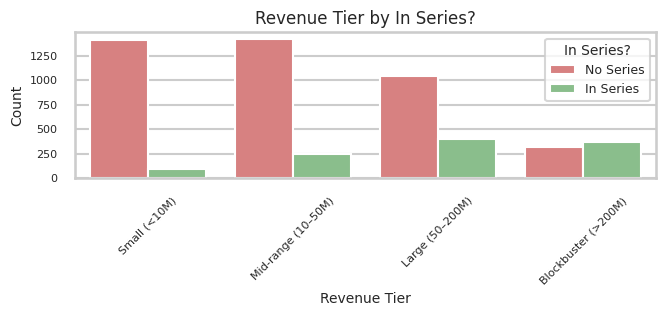

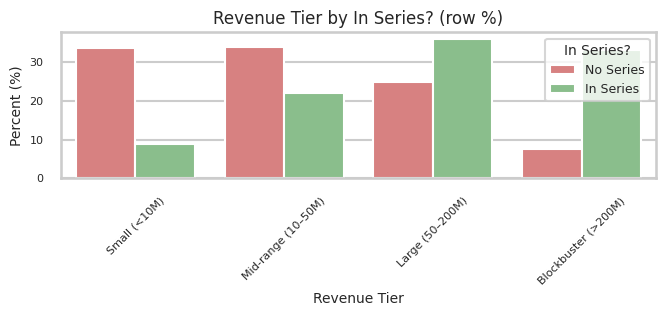

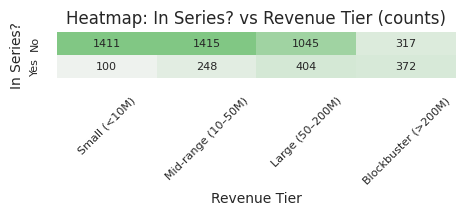

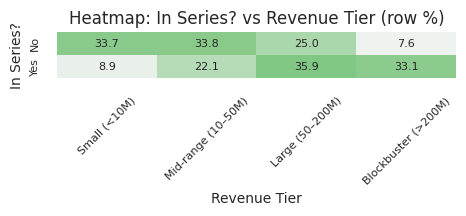


--- Profit Tier by Series (counts) ---
Profit Tier    Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Series or not                                                              
No Series           1476          859                952             728   
In Series             99           99                253             372   

Profit Tier    Superhit (>200M)  
Series or not                    
No Series                   173  
In Series                   301  

--- Profit Tier by Series (row %) ---
Profit Tier    Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Series or not                                                              
No Series           35.2         20.5               22.7            17.4   
In Series            8.8          8.8               22.5            33.1   

Profit Tier    Superhit (>200M)  
Series or not                    
No Series                   4.1  
In Series                  26.8  


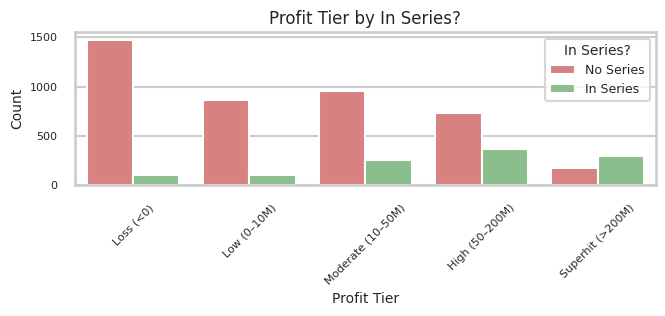

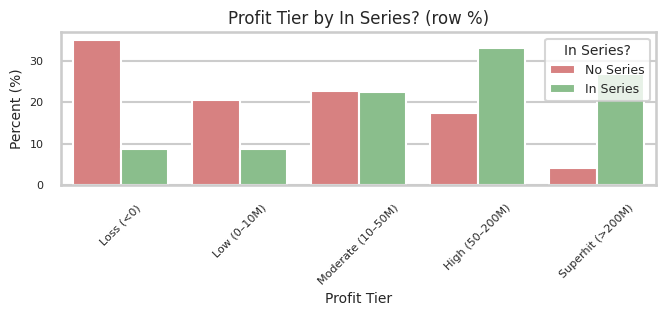

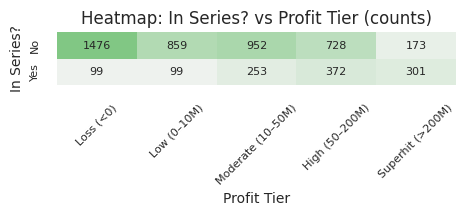

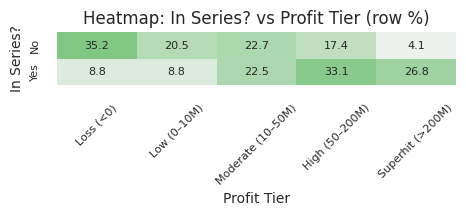


--- ROI Category by Series (counts) ---
ROI Category   Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Series or not                                                       
No Series               1476        864           619         680   
In Series                 99        143           184         374   

ROI Category   Exceptional (>5)  
Series or not                    
No Series                   549  
In Series                   324  

--- ROI Category by Series (row %) ---
ROI Category   Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Series or not                                                       
No Series               35.2       20.6          14.8        16.2   
In Series                8.8       12.7          16.4        33.3   

ROI Category   Exceptional (>5)  
Series or not                    
No Series                  13.1  
In Series                  28.8  


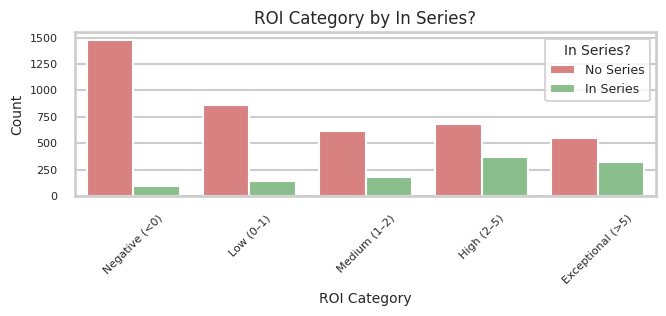

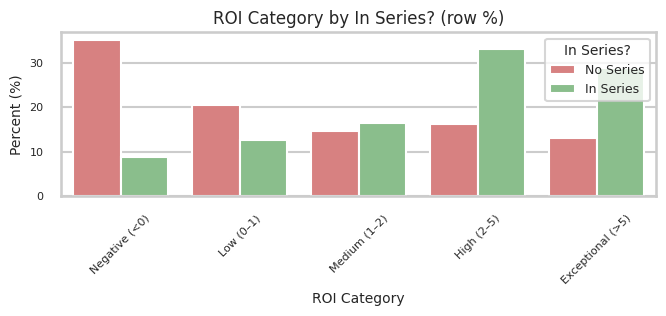

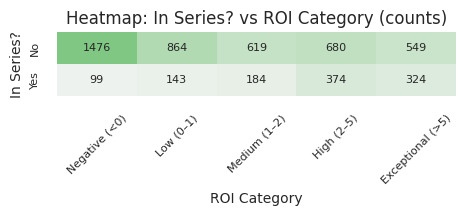

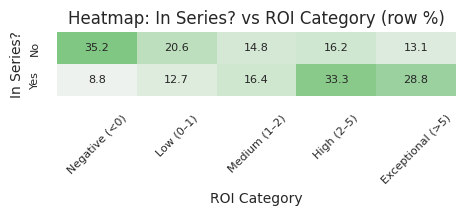

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load Final 6.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Map 'Series or not' to labels
df['Series or not'] = df['Series or not'].fillna(0).astype(int).map({0: 'No Series', 1: 'In Series'})

# 3. Set a softer theme & smaller fonts
sns.set_theme(style='whitegrid')
sns.set_context("talk", rc={
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 9,
    "legend.title_fontsize": 10
})

# 4. Define pastel color mapping
series_palette = {
    'No Series': '#e57373',  # soft red
    'In Series': '#81c784'   # soft green
}

# 5. Category orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

def series_vs_tier(tier, order):
    # Crosstabs
    ct_counts = pd.crosstab(df['Series or not'], df[tier]).reindex(index=['No Series','In Series'], columns=order, fill_value=0)
    ct_pct    = (ct_counts.div(ct_counts.sum(axis=1), axis=0) * 100).round(1)

    print(f"\n--- {tier} by Series (counts) ---\n{ct_counts}")
    print(f"\n--- {tier} by Series (row %) ---\n{ct_pct}")

    # Count‐based bar plot
    plt.figure(figsize=(7,3.5))
    sns.countplot(
        data=df, x=tier, hue='Series or not',
        order=order, hue_order=['No Series','In Series'],
        palette=series_palette
    )
    plt.title(f'{tier} by In Series?')
    plt.xlabel(tier)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='In Series?', loc='upper right')
    plt.tight_layout()
    plt.show()

    # Percent‐based bar plot
    df_pct = ct_pct.reset_index().melt(id_vars='Series or not', var_name=tier, value_name='Percent')
    plt.figure(figsize=(7,3.5))
    sns.barplot(
        data=df_pct, x=tier, y='Percent', hue='Series or not',
        order=order, hue_order=['No Series','In Series'],
        palette=series_palette
    )
    plt.title(f'{tier} by In Series? (row %)')
    plt.xlabel(tier)
    plt.ylabel('Percent (%)')
    plt.xticks(rotation=45)
    plt.legend(title='In Series?', loc='upper right')
    plt.tight_layout()
    plt.show()

    # Heatmap (counts)
    plt.figure(figsize=(5,2.5))
    sns.heatmap(
        ct_counts, annot=True, fmt='d',
        cmap=sns.light_palette(series_palette['In Series'], as_cmap=True),
        cbar=False, annot_kws={"size":8}
    )
    plt.title(f'Heatmap: In Series? vs {tier} (counts)')
    plt.xlabel(tier)
    plt.ylabel('In Series?')
    plt.yticks([0.5, 1.5], ['No','Yes'], fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

    # Heatmap (row %)
    plt.figure(figsize=(5,2.5))
    sns.heatmap(
        ct_pct, annot=True, fmt='.1f',
        cmap=sns.light_palette(series_palette['In Series'], as_cmap=True),
        cbar=False, annot_kws={"size":8}
    )
    plt.title(f'Heatmap: In Series? vs {tier} (row %)')
    plt.xlabel(tier)
    plt.ylabel('In Series?')
    plt.yticks([0.5, 1.5], ['No','Yes'], fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

# 6. Execute
series_vs_tier('Revenue Tier', rev_order)
series_vs_tier('Profit Tier', prof_order)
series_vs_tier('ROI Category', roi_order)



--- Revenue Tier counts by Series ---
 Revenue Tier                  Small (<10M)  Mid‑range (10–50M)  \
Series                                                           
... Has Fallen                           0                   0   
101 Dalmatians (Animated)                0                   0   
101 Dalmatians (Live-Action)             0                   0   
12 Rounds                                0                   1   
2 Days In...                             1                   0   
...                                    ...                 ...   
Young Guns                               0                   1   
Zoolander                                0                   0   
Zorro                                    0                   0   
[REC]                                    0                   1   
xXx                                      0                   0   

Revenue Tier                  Large (50–200M)  Blockbuster (>200M)  
Series                          

<Figure size 800x400 with 0 Axes>

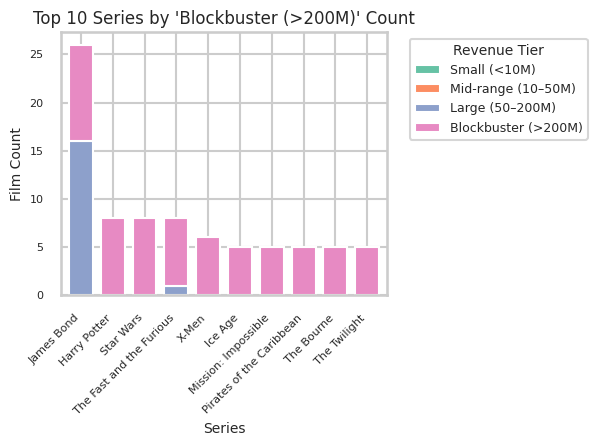

<Figure size 800x400 with 0 Axes>

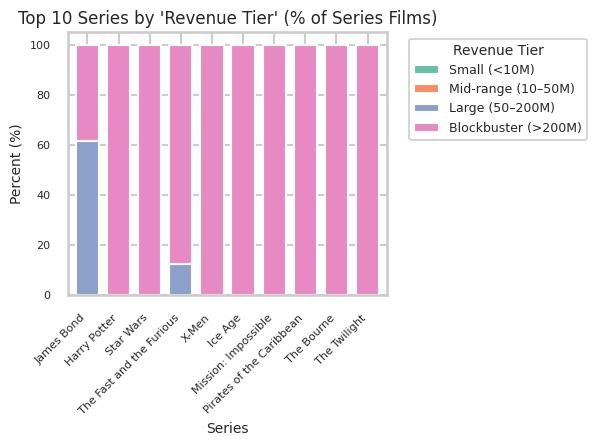

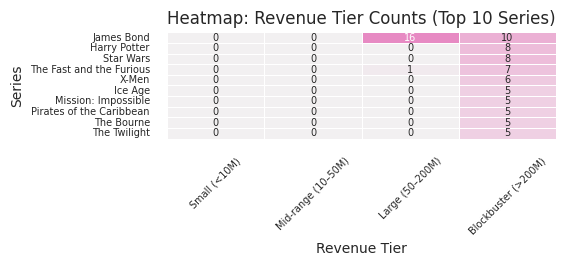

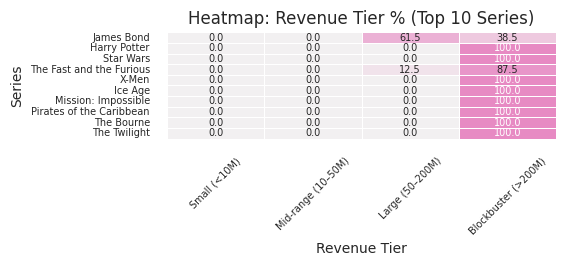


--- Profit Tier counts by Series ---
 Profit Tier                   Loss (<0)  Low (0–10M)  Moderate (10–50M)  \
Series                                                                    
... Has Fallen                        0            0                  0   
101 Dalmatians (Animated)             0            0                  0   
101 Dalmatians (Live-Action)          0            0                  0   
12 Rounds                             1            0                  0   
2 Days In...                          1            0                  0   
...                                 ...          ...                ...   
Young Guns                            0            0                  1   
Zoolander                             0            1                  1   
Zorro                                 0            0                  0   
[REC]                                 0            0                  1   
xXx                                   0            0         

<Figure size 800x400 with 0 Axes>

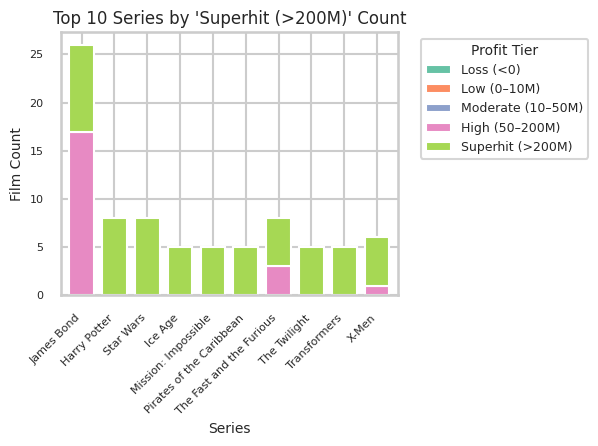

<Figure size 800x400 with 0 Axes>

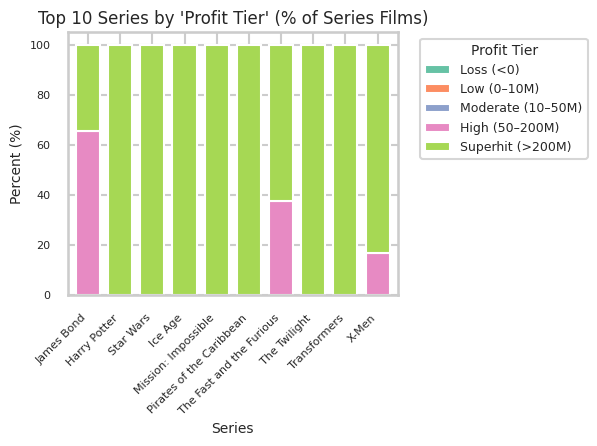

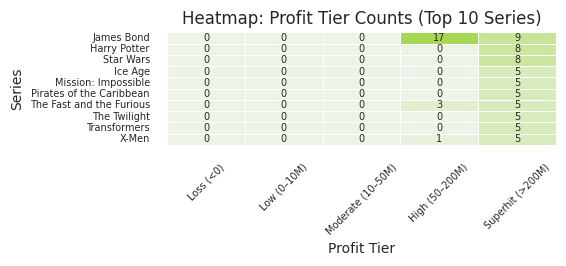

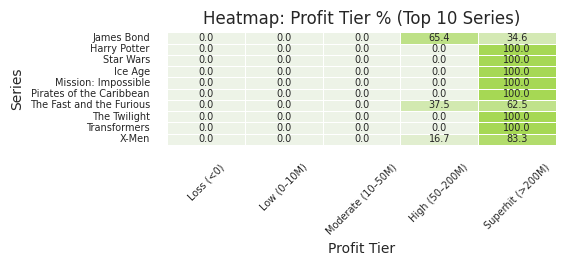


--- ROI Category counts by Series ---
 ROI Category                  Negative (<0)  Low (0–1)  Medium (1–2)  \
Series                                                                 
... Has Fallen                            0          0             1   
101 Dalmatians (Animated)                 0          0             0   
101 Dalmatians (Live-Action)              0          0             1   
12 Rounds                                 1          0             0   
2 Days In...                              1          0             0   
...                                     ...        ...           ...   
Young Guns                                0          0             0   
Zoolander                                 0          1             1   
Zorro                                     0          1             1   
[REC]                                     0          0             0   
xXx                                       0          1             0   

ROI Category           

<Figure size 800x400 with 0 Axes>

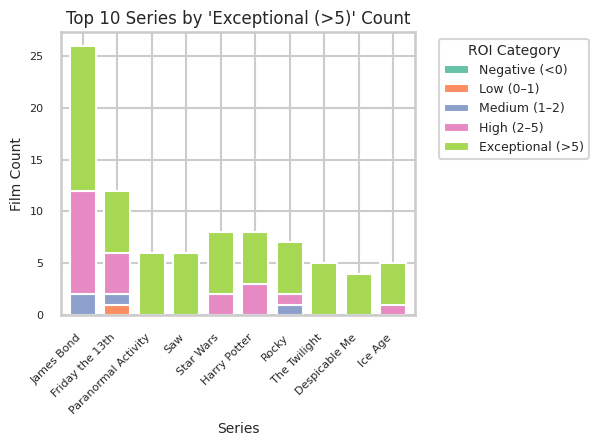

<Figure size 800x400 with 0 Axes>

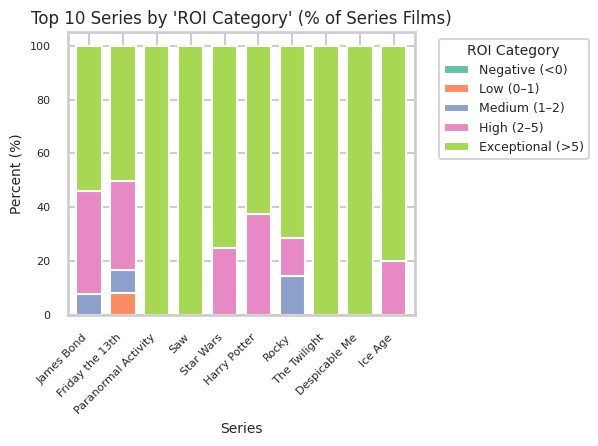

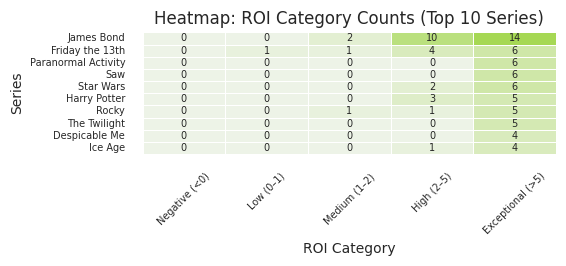

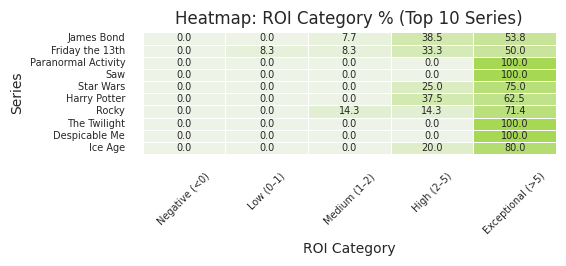

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load Final 6.xlsx (Drive already mounted)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Filter to only series titles
df_s = df[df['Series'].notna()].copy()

# 3. Define tier orders
rev_order  = ['Small (<10M)', 'Mid‑range (10–50M)', 'Large (50–200M)', 'Blockbuster (>200M)']
prof_order = ['Loss (<0)', 'Low (0–10M)', 'Moderate (10–50M)', 'High (50–200M)', 'Superhit (>200M)']
roi_order  = ['Negative (<0)', 'Low (0–1)', 'Medium (1–2)', 'High (2–5)', 'Exceptional (>5)']

# 4. Set a soft theme and smaller fonts
sns.set_theme(style='whitegrid')
sns.set_context("talk", rc={
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 9,
    "legend.title_fontsize": 10
})

def analyze_series(tier, order, cmap):
    # a) Crosstab counts
    ct = pd.crosstab(df_s['Series'], df_s[tier]).reindex(columns=order, fill_value=0)
    print(f"\n--- {tier} counts by Series ---\n", ct)

    # b) Crosstab row-percent
    pct = (ct.div(ct.sum(axis=1), axis=0) * 100).round(1)
    print(f"\n--- {tier} row % by Series ---\n", pct)

    # c) Top 10 series by highest-tier count
    top10 = ct[order[-1]].nlargest(10).index
    ct_top10  = ct.loc[top10]
    pct_top10 = pct.loc[top10]

    # d) Subtle pastel palette for bars
    colors = sns.color_palette("Set2", n_colors=len(order))

    # e) Stacked count bar for top 10
    plt.figure(figsize=(8,4))
    ct_top10.plot.bar(
        stacked=True, color=colors, width=0.75
    )
    plt.title(f"Top 10 Series by '{order[-1]}' Count")
    plt.ylabel('Film Count')
    plt.xlabel('Series')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # f) Stacked percent bar for top 10
    plt.figure(figsize=(8,4))
    pct_top10.plot.bar(
        stacked=True, color=colors, width=0.75
    )
    plt.title(f"Top 10 Series by '{tier}' (% of Series Films)")
    plt.ylabel('Percent (%)')
    plt.xlabel('Series')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # g) Heatmap (counts) for top 10
    plt.figure(figsize=(6,3))
    sns.heatmap(
        ct_top10, annot=True, fmt='d',
        cmap=sns.light_palette(colors[-1], as_cmap=True),
        cbar=False, linewidths=.5, annot_kws={"size":7}
    )
    plt.title(f"Heatmap: {tier} Counts (Top 10 Series)")
    plt.xlabel(tier)
    plt.ylabel('Series')
    plt.yticks(fontsize=7)
    plt.xticks(rotation=45, fontsize=7)
    plt.tight_layout()
    plt.show()

    # h) Heatmap (row %) for top 10
    plt.figure(figsize=(6,3))
    sns.heatmap(
        pct_top10, annot=True, fmt='.1f',
        cmap=sns.light_palette(colors[-1], as_cmap=True),
        cbar=False, linewidths=.5, annot_kws={"size":7}
    )
    plt.title(f"Heatmap: {tier} % (Top 10 Series)")
    plt.xlabel(tier)
    plt.ylabel('Series')
    plt.yticks(fontsize=7)
    plt.xticks(rotation=45, fontsize=7)
    plt.tight_layout()
    plt.show()

# 5. Execute for each tier
analyze_series('Revenue Tier', rev_order, cmap='Greens')
analyze_series('Profit Tier', prof_order, cmap='Blues')
analyze_series('ROI Category', roi_order, cmap='Purples')



--- Revenue Tier counts: English vs Other ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
LangGroup                                                         
English               1196                1463             1361   
Other                  315                 200               88   

Revenue Tier  Blockbuster (>200M)  
LangGroup                          
English                       674  
Other                          15  

--- Revenue Tier row %: English vs Other ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
LangGroup                                                         
English               25.5                31.2             29.0   
Other                 51.0                32.4             14.2   

Revenue Tier  Blockbuster (>200M)  
LangGroup                          
English                      14.4  
Other                         2.4  


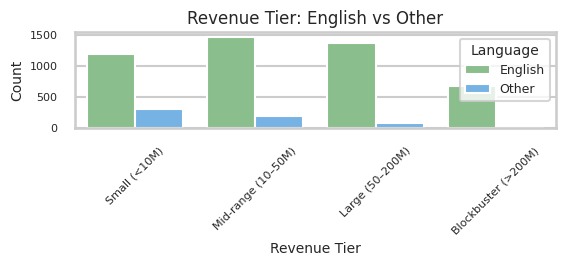

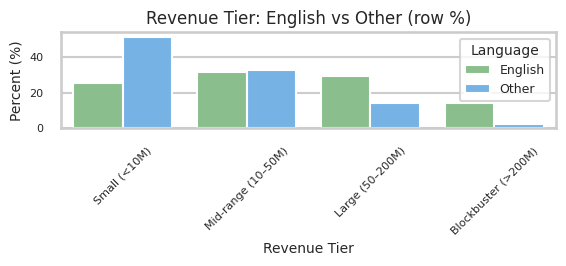

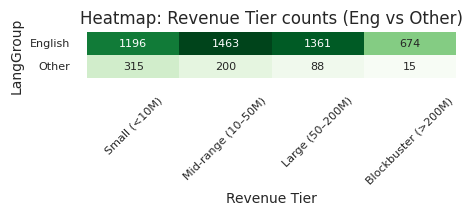

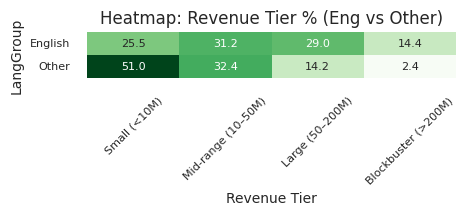


--- Profit Tier counts: English vs Other ---
Profit Tier  Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
LangGroup                                                                
English           1374          752               1068            1038   
Other              201          206                137              62   

Profit Tier  Superhit (>200M)  
LangGroup                      
English                   462  
Other                      12  

--- Profit Tier row %: English vs Other ---
Profit Tier  Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
LangGroup                                                                
English           29.3         16.0               22.8            22.1   
Other             32.5         33.3               22.2            10.0   

Profit Tier  Superhit (>200M)  
LangGroup                      
English                   9.8  
Other                     1.9  


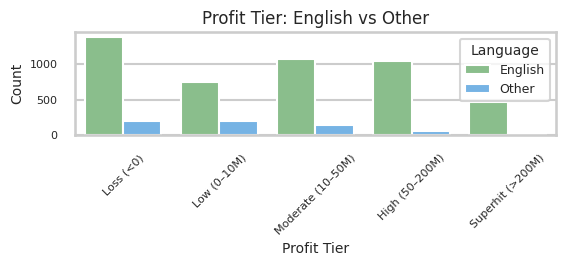

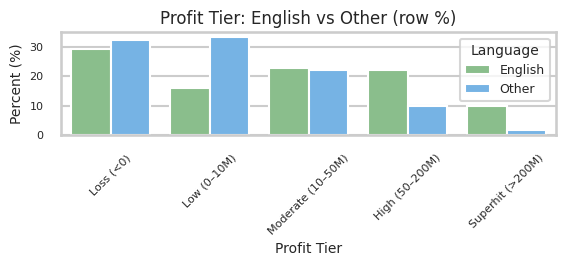

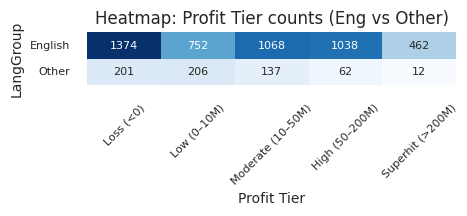

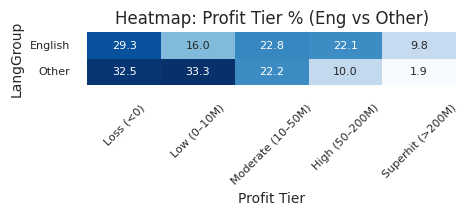


--- ROI Category counts: English vs Other ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
LangGroup                                                          
English                1374        891           724         945   
Other                   201        116            79         109   

ROI Category  Exceptional (>5)  
LangGroup                       
English                    760  
Other                      113  

--- ROI Category row %: English vs Other ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
LangGroup                                                          
English                29.3       19.0          15.4        20.1   
Other                  32.5       18.8          12.8        17.6   

ROI Category  Exceptional (>5)  
LangGroup                       
English                   16.2  
Other                     18.3  


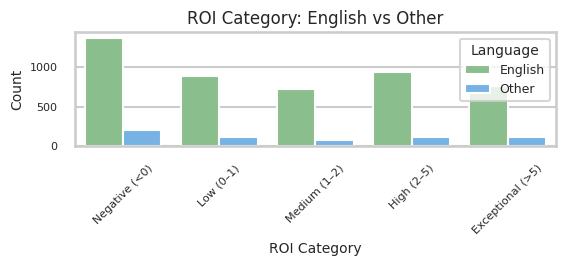

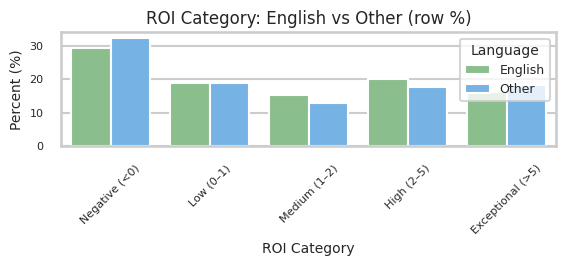

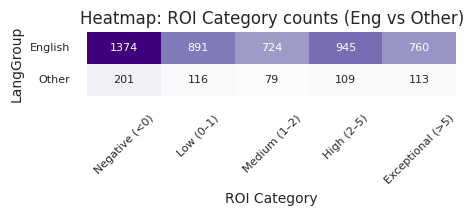

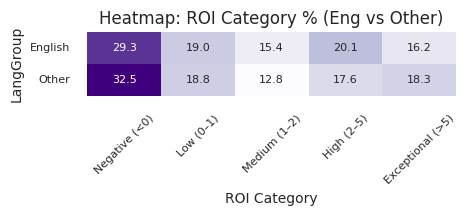


--- Revenue Tier counts for Top 5 Non‑English Languages ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Language                                                          
Other                   14                   5                2   
Chinese                  1                   1                0   
Danish                   2                   3                1   
French                  19                   7                1   
German                   4                   2                3   

Revenue Tier  Blockbuster (>200M)  
Language                           
Other                           1  
Chinese                         0  
Danish                          0  
French                          0  
German                          0  

--- Revenue Tier % for Top 5 Non‑English Languages ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Language                                                          
Other                 63.6 

<Figure size 700x300 with 0 Axes>

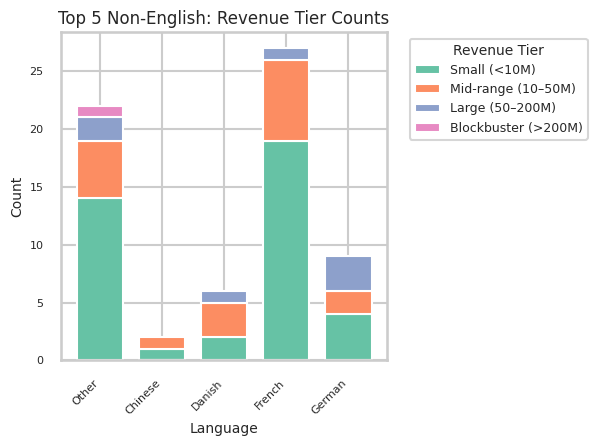

<Figure size 700x300 with 0 Axes>

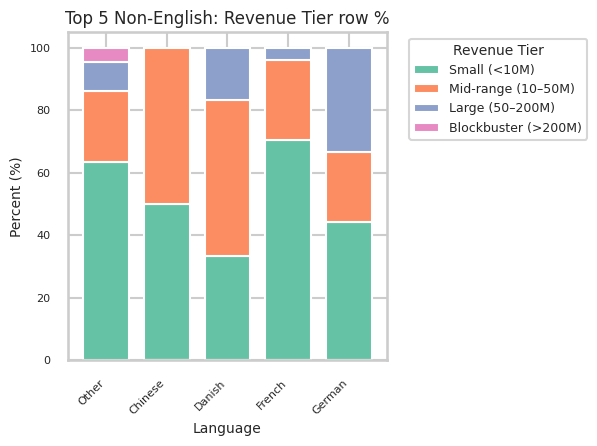

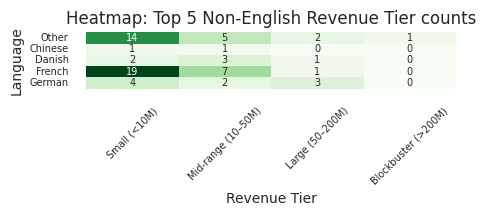

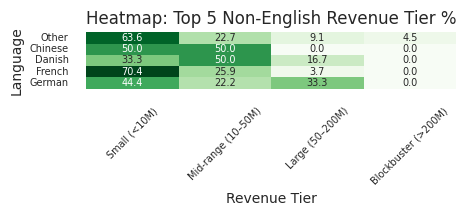


--- Profit Tier counts for Top 5 Non‑English Languages ---
Profit Tier  Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Language                                                                 
Other                6           11                  3               1   
Chinese              1            1                  0               0   
Danish               2            1                  2               1   
French              18            6                  2               1   
German               3            1                  2               3   

Profit Tier  Superhit (>200M)  
Language                       
Other                       1  
Chinese                     0  
Danish                      0  
French                      0  
German                      0  

--- Profit Tier % for Top 5 Non‑English Languages ---
Profit Tier  Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Language                                                            

<Figure size 700x300 with 0 Axes>

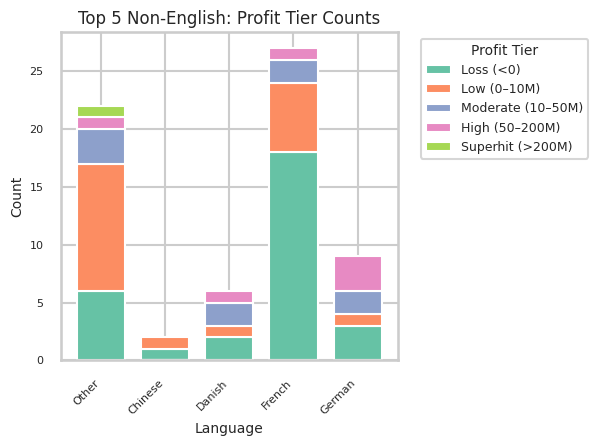

<Figure size 700x300 with 0 Axes>

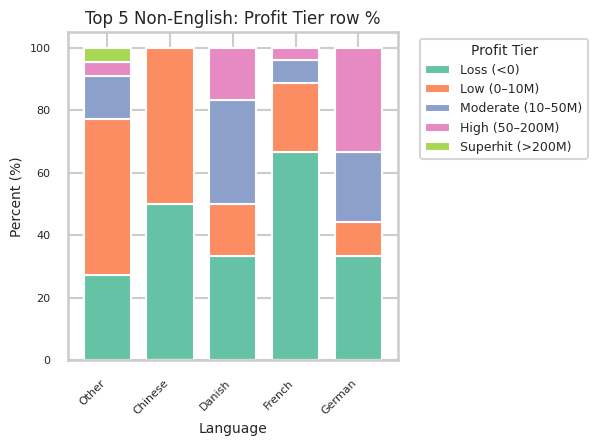

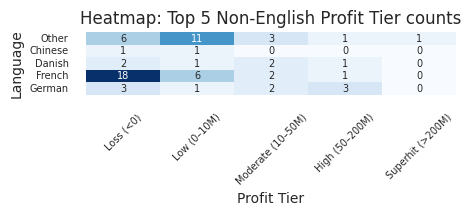

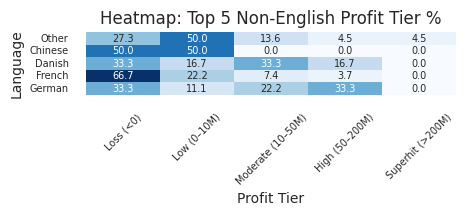


--- ROI Category counts for Top 5 Non‑English Languages ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Language                                                           
Hindi                     9         15             8          22   
Spanish                   3          0             0           0   
German                    3          1             0           2   
Tamil                     1          3             0           3   
Other                     6          5             3           6   

ROI Category  Exceptional (>5)  
Language                        
Hindi                       17  
Spanish                      4  
German                       3  
Tamil                        3  
Other                        2  

--- ROI Category % for Top 5 Non‑English Languages ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Language                                                           
Hindi                  12.7       21.1 

<Figure size 700x300 with 0 Axes>

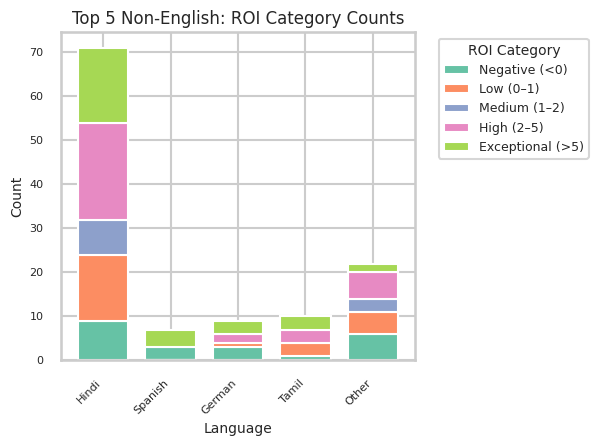

<Figure size 700x300 with 0 Axes>

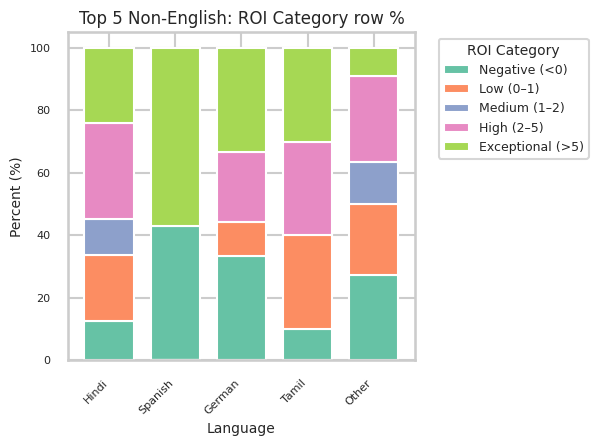

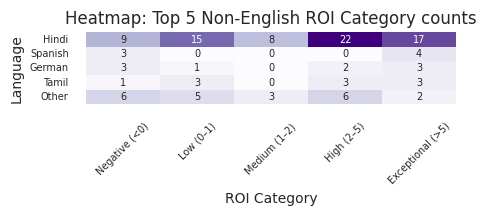

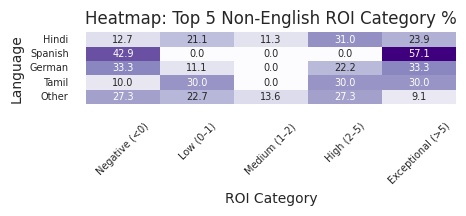

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load Final 6.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Create language groups
df['LangGroup'] = df['Language'].fillna('Unknown').apply(lambda x: 'English' if x == 'English' else 'Other')

# 3. Tier orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

# 4. Set style
sns.set_theme(style='whitegrid')
sns.set_context("talk", rc={
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 9,
    "legend.title_fontsize": 10
})

def aggregated_lang_analysis(tier, order, cmap):
    """Compare English vs Other aggregated."""
    # a) Crosstab counts
    ct = pd.crosstab(df['LangGroup'], df[tier]).reindex(index=['English','Other'], columns=order, fill_value=0)
    print(f"\n--- {tier} counts: English vs Other ---")
    print(ct)

    # b) Row‐percent
    pct = (ct.div(ct.sum(axis=1), axis=0)*100).round(1)
    print(f"\n--- {tier} row %: English vs Other ---")
    print(pct)

    # c) Count bar
    plt.figure(figsize=(6,3))
    sns.countplot(
        data=df, x=tier, hue='LangGroup',
        order=order, hue_order=['English','Other'],
        palette={'English':'#81c784','Other':'#64b5f6'}
    )
    plt.title(f'{tier}: English vs Other')
    plt.xticks(rotation=45)
    plt.ylabel('Count')
    plt.xlabel(tier)
    plt.legend(title='Language', loc='upper right')
    plt.tight_layout()
    plt.show()

    # d) Percent bar
    df_pct = pct.reset_index().melt(id_vars='LangGroup', var_name=tier, value_name='Percent')
    plt.figure(figsize=(6,3))
    sns.barplot(
        data=df_pct, x=tier, y='Percent', hue='LangGroup',
        order=order, hue_order=['English','Other'],
        palette={'English':'#81c784','Other':'#64b5f6'}
    )
    plt.title(f'{tier}: English vs Other (row %)')
    plt.xticks(rotation=45)
    plt.ylabel('Percent (%)')
    plt.xlabel(tier)
    plt.legend(title='Language', loc='upper right')
    plt.tight_layout()
    plt.show()

    # e) Heatmap counts
    plt.figure(figsize=(5,2.5))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap, cbar=False,
                annot_kws={"size":8})
    plt.title(f'Heatmap: {tier} counts (Eng vs Other)')
    plt.ylabel('LangGroup')
    plt.xlabel(tier)
    plt.yticks(rotation=0, fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

    # f) Heatmap %
    plt.figure(figsize=(5,2.5))
    sns.heatmap(pct, annot=True, fmt='.1f', cmap=cmap, cbar=False,
                annot_kws={"size":8})
    plt.title(f'Heatmap: {tier} % (Eng vs Other)')
    plt.ylabel('LangGroup')
    plt.xlabel(tier)
    plt.yticks(rotation=0, fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

def top_non_english_analysis(tier, order, cmap, top_n=5):
    """Analyze top N non-English languages for a given tier."""
    df_other = df[df['LangGroup']=='Other']
    ct_lang = pd.crosstab(df_other['Language'], df_other[tier]).reindex(columns=order, fill_value=0)
    # pick top N by highest-tier count
    top_langs = ct_lang[order[-1]].nlargest(top_n).index
    ct_top = ct_lang.loc[top_langs]
    pct_top = (ct_top.div(ct_top.sum(axis=1), axis=0)*100).round(1)

    print(f"\n--- {tier} counts for Top {top_n} Non‑English Languages ---")
    print(ct_top)
    print(f"\n--- {tier} % for Top {top_n} Non‑English Languages ---")
    print(pct_top)

    # bar counts
    plt.figure(figsize=(7,3))
    ct_top.plot.bar(stacked=True, color=sns.color_palette("Set2", len(order)), width=0.75)
    plt.title(f"Top {top_n} Non‑English: {tier} Counts")
    plt.ylabel('Count')
    plt.xlabel('Language')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # bar %
    plt.figure(figsize=(7,3))
    pct_top.plot.bar(stacked=True, color=sns.color_palette("Set2", len(order)), width=0.75)
    plt.title(f"Top {top_n} Non‑English: {tier} row %")
    plt.ylabel('Percent (%)')
    plt.xlabel('Language')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # heatmap counts
    plt.figure(figsize=(5,2.5))
    sns.heatmap(ct_top, annot=True, fmt='d', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f"Heatmap: Top {top_n} Non‑English {tier} counts")
    plt.ylabel('Language')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

    # heatmap %
    plt.figure(figsize=(5,2.5))
    sns.heatmap(pct_top, annot=True, fmt='.1f', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f"Heatmap: Top {top_n} Non‑English {tier} %")
    plt.ylabel('Language')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

# 5. Run aggregated English vs Other
aggregated_lang_analysis('Revenue Tier', rev_order, cmap='Greens')
aggregated_lang_analysis('Profit Tier', prof_order, cmap='Blues')
aggregated_lang_analysis('ROI Category', roi_order, cmap='Purples')

# 6. Run top_N non‑English breakdown
for tier, order, cmap in [
    ('Revenue Tier', rev_order, 'Greens'),
    ('Profit Tier', prof_order, 'Blues'),
    ('ROI Category', roi_order, 'Purples')
]:
    top_non_english_analysis(tier, order, cmap, top_n=5)



--- Revenue Tier counts: USA vs Other ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
CountryGroup                                                      
USA                    805                1091             1009   
Other                  706                 572              440   

Revenue Tier  Blockbuster (>200M)  
CountryGroup                       
USA                           496  
Other                         193  

--- Revenue Tier row %: USA vs Other ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
CountryGroup                                                      
USA                   23.7                32.1             29.7   
Other                 36.9                29.9             23.0   

Revenue Tier  Blockbuster (>200M)  
CountryGroup                       
USA                          14.6  
Other                        10.1  


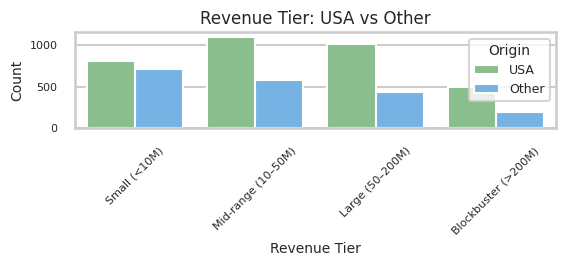

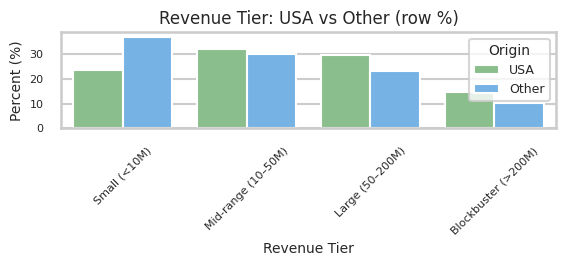

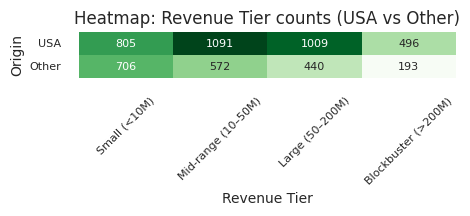

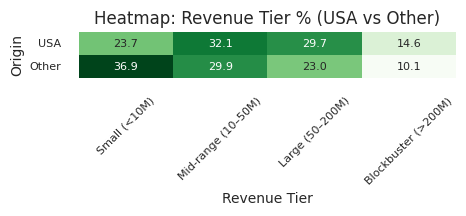


--- Profit Tier counts: USA vs Other ---
Profit Tier   Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
CountryGroup                                                              
USA                 892          583                803             778   
Other               683          375                402             322   

Profit Tier   Superhit (>200M)  
CountryGroup                    
USA                        345  
Other                      129  

--- Profit Tier row %: USA vs Other ---
Profit Tier   Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
CountryGroup                                                              
USA                26.2         17.1               23.6            22.9   
Other              35.7         19.6               21.0            16.8   

Profit Tier   Superhit (>200M)  
CountryGroup                    
USA                       10.1  
Other                      6.8  


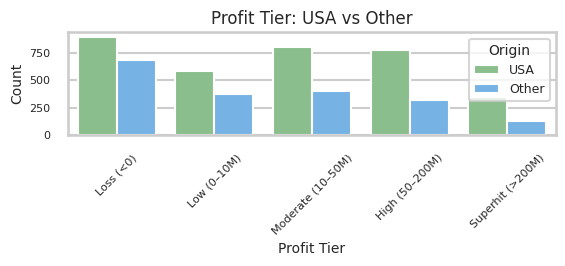

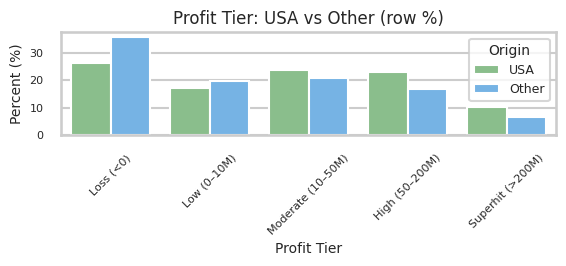

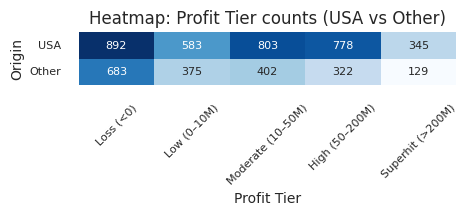

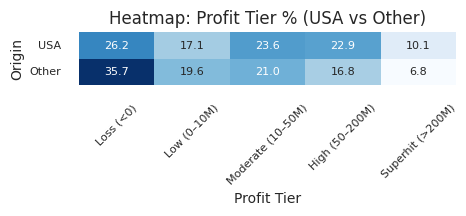


--- ROI Category counts: USA vs Other ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
CountryGroup                                                       
USA                     892        653           543         715   
Other                   683        354           260         339   

ROI Category  Exceptional (>5)  
CountryGroup                    
USA                        598  
Other                      275  

--- ROI Category row %: USA vs Other ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
CountryGroup                                                       
USA                    26.2       19.2          16.0        21.0   
Other                  35.7       18.5          13.6        17.7   

ROI Category  Exceptional (>5)  
CountryGroup                    
USA                       17.6  
Other                     14.4  


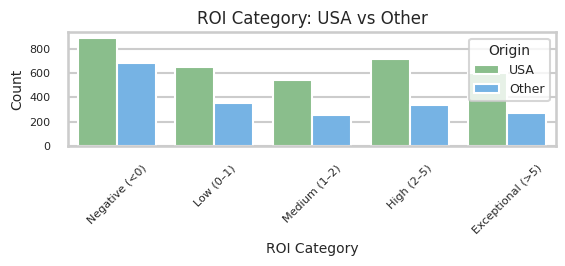

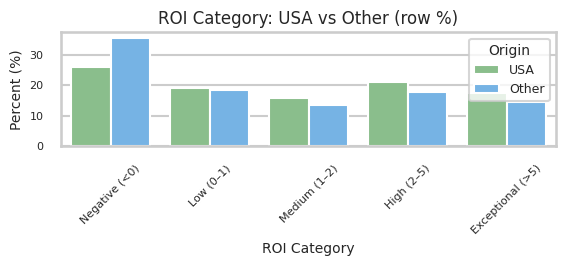

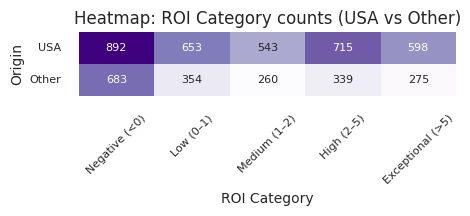

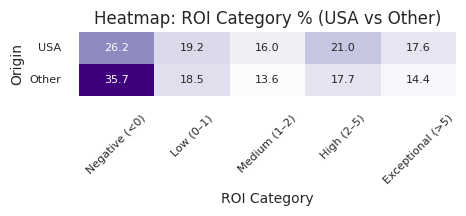


--- Revenue Tier counts for Top 5 Non‑USA Countries ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Country                                                           
UK                      97                 130               88   
Germany                 26                  42               68   
Canada                  62                  50               46   
France                  61                  43               44   
Australia               27                  24               32   

Revenue Tier  Blockbuster (>200M)  
Country                            
UK                             62  
Germany                        28  
Canada                         21  
France                         14  
Australia                      11  

--- Revenue Tier % for Top 5 Non‑USA Countries ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Country                                                           
UK                    25.7         

<Figure size 700x300 with 0 Axes>

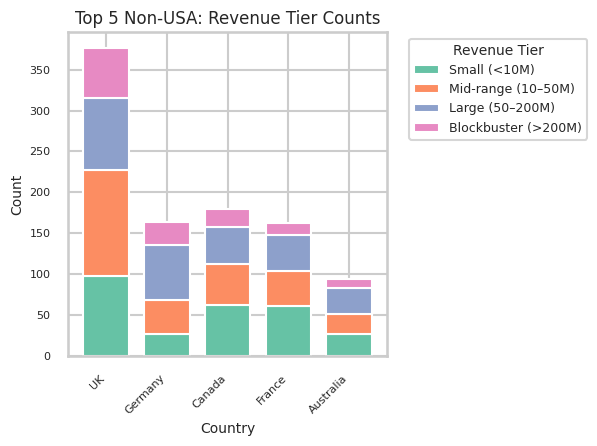

<Figure size 700x300 with 0 Axes>

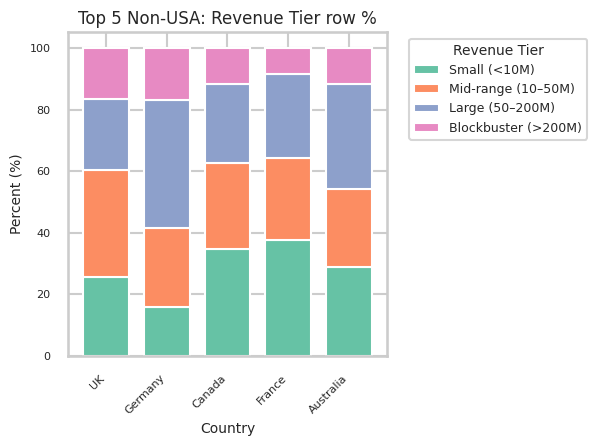

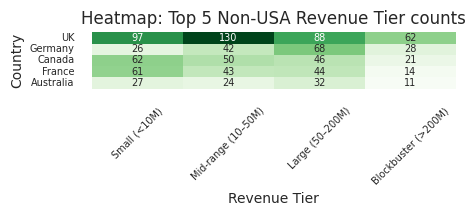

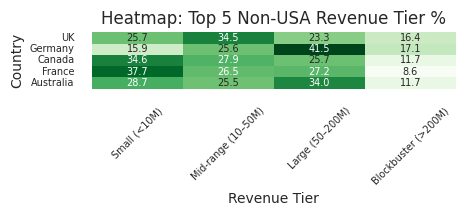


--- Profit Tier counts for Top 5 Non‑USA Countries ---
Profit Tier  Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Country                                                                  
UK                  97           67                 93              70   
Germany             61           12                 32              43   
Canada              74           14                 45              35   
New Zealand          5            2                  2               2   
Australia           31           17                 19              20   

Profit Tier  Superhit (>200M)  
Country                        
UK                         50  
Germany                    16  
Canada                     11  
New Zealand                 8  
Australia                   7  

--- Profit Tier % for Top 5 Non‑USA Countries ---
Profit Tier  Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Country                                                                  
UK

<Figure size 700x300 with 0 Axes>

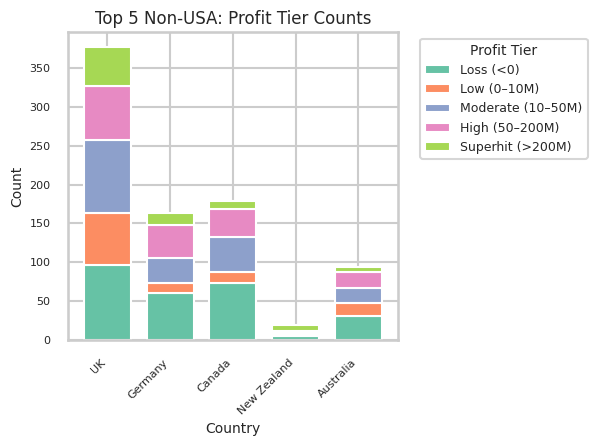

<Figure size 700x300 with 0 Axes>

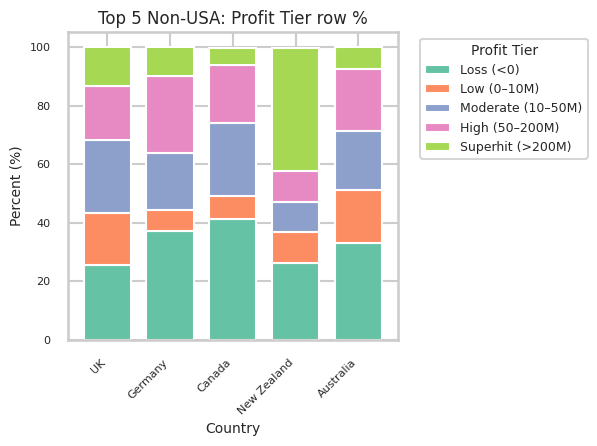

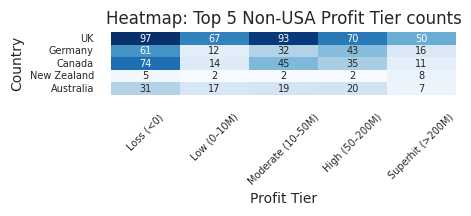

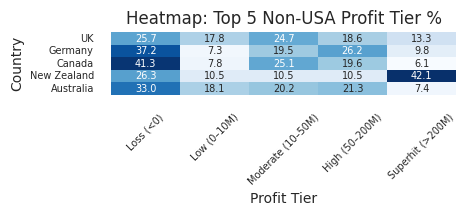


--- ROI Category counts for Top 5 Non‑USA Countries ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Country                                                            
UK                       97         63            54          83   
India                    17         23            12          34   
France                   75         29            14          26   
Canada                   74         25            35          30   
Australia                31         26            12          14   

ROI Category  Exceptional (>5)  
Country                         
UK                          80  
India                       24  
France                      18  
Canada                      15  
Australia                   11  

--- ROI Category % for Top 5 Non‑USA Countries ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Country                                                            
UK                     25.7       16.7         

<Figure size 700x300 with 0 Axes>

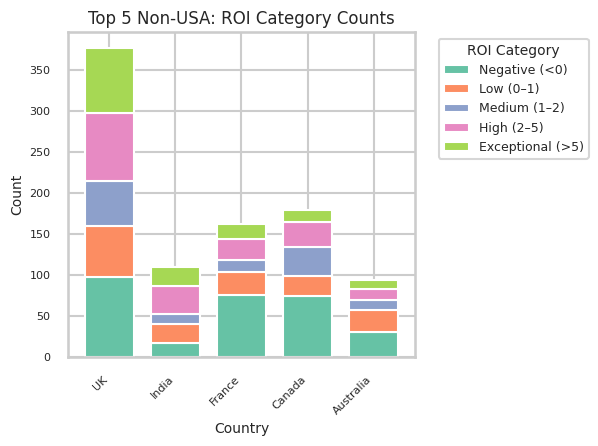

<Figure size 700x300 with 0 Axes>

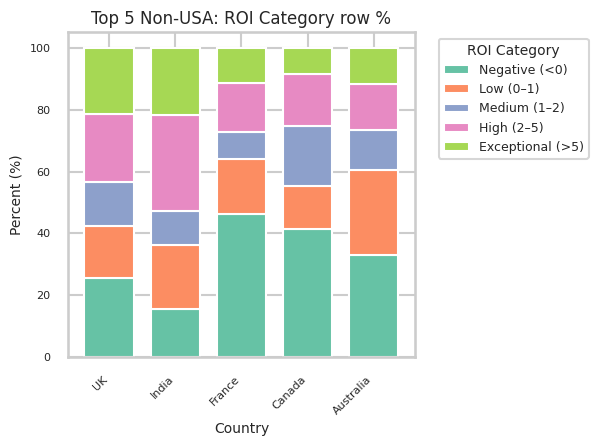

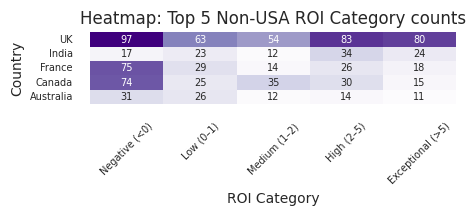

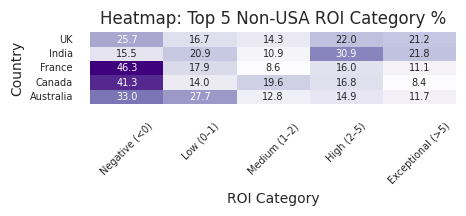

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load Final 6.xlsx (assumes Drive is already mounted)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Create country groups
df['CountryGroup'] = df['Country'].fillna('Unknown').apply(lambda x: 'USA' if x == 'USA' else 'Other')

# 3. Define tier orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

# 4. Set a soft theme and smaller fonts
sns.set_theme(style='whitegrid')
sns.set_context("talk", rc={
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 9,
    "legend.title_fontsize": 10
})

def aggregated_country_analysis(tier, order, cmap):
    # a) Crosstab counts
    ct = pd.crosstab(df['CountryGroup'], df[tier])\
           .reindex(index=['USA','Other'], columns=order, fill_value=0)
    print(f"\n--- {tier} counts: USA vs Other ---")
    print(ct)

    # b) Crosstab row-percent
    pct = (ct.div(ct.sum(axis=1), axis=0) * 100).round(1)
    print(f"\n--- {tier} row %: USA vs Other ---")
    print(pct)

    # c) Count bar chart
    plt.figure(figsize=(6,3))
    sns.countplot(
        data=df, x=tier, hue='CountryGroup',
        order=order, hue_order=['USA','Other'],
        palette={'USA':'#81c784','Other':'#64b5f6'}
    )
    plt.title(f'{tier}: USA vs Other')
    plt.xticks(rotation=45)
    plt.ylabel('Count')
    plt.xlabel(tier)
    plt.legend(title='Origin', loc='upper right')
    plt.tight_layout()
    plt.show()

    # d) Percent bar chart
    df_pct = pct.reset_index().melt(id_vars='CountryGroup', var_name=tier, value_name='Percent')
    plt.figure(figsize=(6,3))
    sns.barplot(
        data=df_pct, x=tier, y='Percent', hue='CountryGroup',
        order=order, hue_order=['USA','Other'],
        palette={'USA':'#81c784','Other':'#64b5f6'}
    )
    plt.title(f'{tier}: USA vs Other (row %)')
    plt.xticks(rotation=45)
    plt.ylabel('Percent (%)')
    plt.xlabel(tier)
    plt.legend(title='Origin', loc='upper right')
    plt.tight_layout()
    plt.show()

    # e) Heatmap counts
    plt.figure(figsize=(5,2.5))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap, cbar=False, annot_kws={"size":8})
    plt.title(f'Heatmap: {tier} counts (USA vs Other)')
    plt.ylabel('Origin')
    plt.xlabel(tier)
    plt.yticks(rotation=0, fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

    # f) Heatmap row-%
    plt.figure(figsize=(5,2.5))
    sns.heatmap(pct, annot=True, fmt='.1f', cmap=cmap, cbar=False, annot_kws={"size":8})
    plt.title(f'Heatmap: {tier} % (USA vs Other)')
    plt.ylabel('Origin')
    plt.xlabel(tier)
    plt.yticks(rotation=0, fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

def top_non_usa_analysis(tier, order, cmap, top_n=5):
    # focus only on non-USA
    df_o = df[df['CountryGroup']=='Other']
    ct_lang = pd.crosstab(df_o['Country'], df_o[tier]).reindex(columns=order, fill_value=0)
    # pick top_n countries by highest-tier count
    top_countries = ct_lang[order[-1]].nlargest(top_n).index
    ct_top = ct_lang.loc[top_countries]
    pct_top = (ct_top.div(ct_top.sum(axis=1), axis=0)*100).round(1)

    print(f"\n--- {tier} counts for Top {top_n} Non‑USA Countries ---")
    print(ct_top)
    print(f"\n--- {tier} % for Top {top_n} Non‑USA Countries ---")
    print(pct_top)

    # bar counts
    plt.figure(figsize=(7,3))
    ct_top.plot.bar(
        stacked=True, color=sns.color_palette("Set2", len(order)), width=0.75
    )
    plt.title(f"Top {top_n} Non‑USA: {tier} Counts")
    plt.ylabel('Count')
    plt.xlabel('Country')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # bar %
    plt.figure(figsize=(7,3))
    pct_top.plot.bar(
        stacked=True, color=sns.color_palette("Set2", len(order)), width=0.75
    )
    plt.title(f"Top {top_n} Non‑USA: {tier} row %")
    plt.ylabel('Percent (%)')
    plt.xlabel('Country')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # heatmap counts
    plt.figure(figsize=(5,2.5))
    sns.heatmap(ct_top, annot=True, fmt='d', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f"Heatmap: Top {top_n} Non‑USA {tier} counts")
    plt.ylabel('Country')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

    # heatmap %
    plt.figure(figsize=(5,2.5))
    sns.heatmap(pct_top, annot=True, fmt='.1f', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f"Heatmap: Top {top_n} Non‑USA {tier} %")
    plt.ylabel('Country')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

# 5. Aggregated USA vs Other
aggregated_country_analysis('Revenue Tier', rev_order, cmap='Greens')
aggregated_country_analysis('Profit Tier', prof_order, cmap='Blues')
aggregated_country_analysis('ROI Category', roi_order, cmap='Purples')

# 6. Top Non‑USA breakdown
for tier, order, cmap in [
    ('Revenue Tier', rev_order, 'Greens'),
    ('Profit Tier', prof_order, 'Blues'),
    ('ROI Category', roi_order, 'Purples')
]:
    top_non_usa_analysis(tier, order, cmap, top_n=5)



--- Revenue Tier counts: Major vs Other Studios ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
StudioGroup                                                       
Major Studio           273                 684              711   
Other                 1006                 846              672   

Revenue Tier  Blockbuster (>200M)  
StudioGroup                        
Major Studio                  407  
Other                         268  

--- Revenue Tier row %: Major vs Other Studios ---
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
StudioGroup                                                       
Major Studio          13.2                33.0             34.3   
Other                 36.0                30.3             24.1   

Revenue Tier  Blockbuster (>200M)  
StudioGroup                        
Major Studio                 19.6  
Other                         9.6  


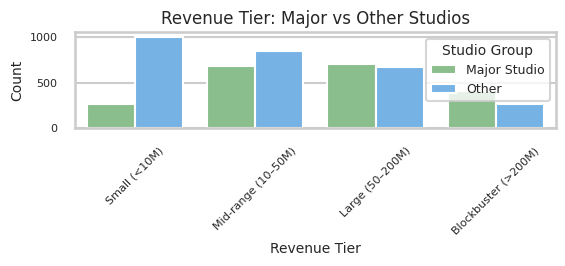

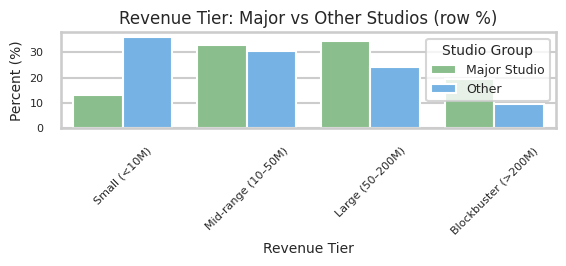

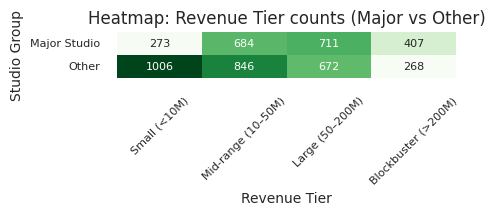

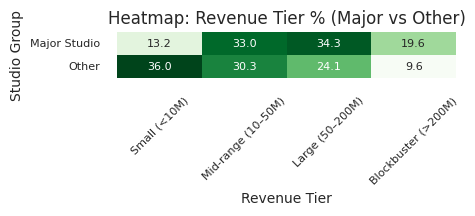


--- Profit Tier counts: Major vs Other Studios ---
Profit Tier   Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
StudioGroup                                                               
Major Studio        417          290                498             592   
Other              1008          526                610             463   

Profit Tier   Superhit (>200M)  
StudioGroup                     
Major Studio               278  
Other                      185  

--- Profit Tier row %: Major vs Other Studios ---
Profit Tier   Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
StudioGroup                                                               
Major Studio       20.1         14.0               24.0            28.5   
Other              36.1         18.8               21.8            16.6   

Profit Tier   Superhit (>200M)  
StudioGroup                     
Major Studio              13.4  
Other                      6.6  


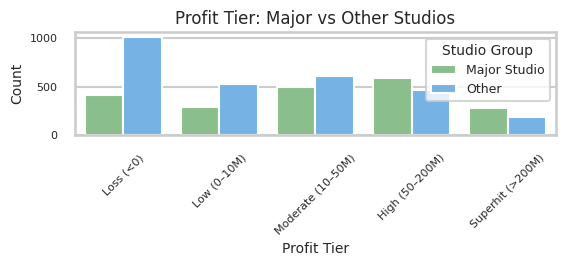

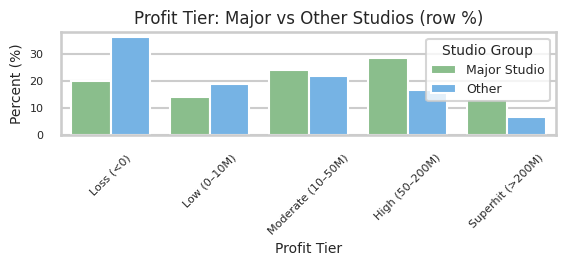

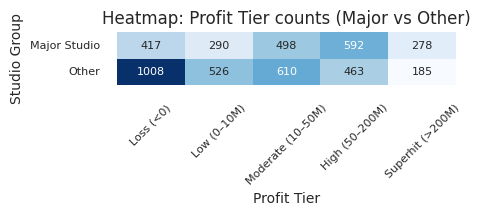

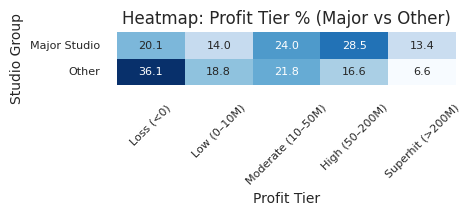


--- ROI Category counts: Major vs Other Studios ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
StudioGroup                                                        
Major Studio            417        396           380         499   
Other                  1008        532           361         483   

ROI Category  Exceptional (>5)  
StudioGroup                     
Major Studio               383  
Other                      408  

--- ROI Category row %: Major vs Other Studios ---
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
StudioGroup                                                        
Major Studio           20.1       19.1          18.3        24.0   
Other                  36.1       19.1          12.9        17.3   

ROI Category  Exceptional (>5)  
StudioGroup                     
Major Studio              18.5  
Other                     14.6  


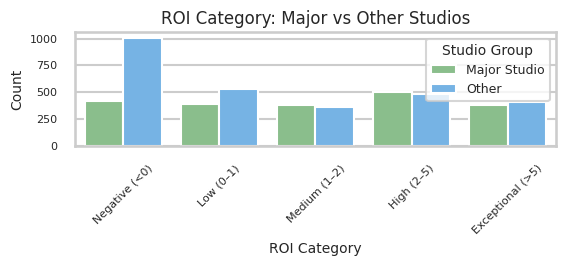

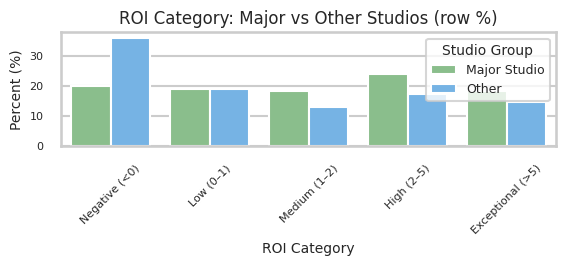

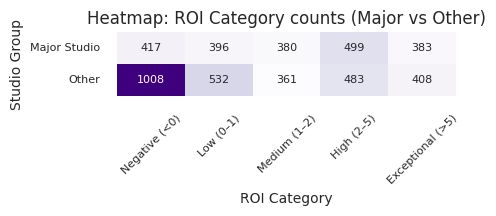

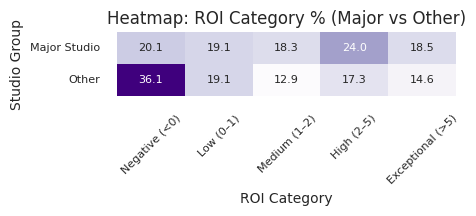


--- Revenue Tier counts for Top 5 Major Studios ---
Revenue Tier      Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Studio                                                                
Universal                   28                 103              127   
Paramount                   38                  98              125   
Columbia                    24                  84              115   
Disney                       2                  27               52   
20th Century Fox            27                  77               91   

Revenue Tier      Blockbuster (>200M)  
Studio                                 
Universal                          69  
Paramount                          68  
Columbia                           64  
Disney                             61  
20th Century Fox                   48  

--- Revenue Tier % for Top 5 Major Studios ---
Revenue Tier      Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Studio                                            

<Figure size 700x300 with 0 Axes>

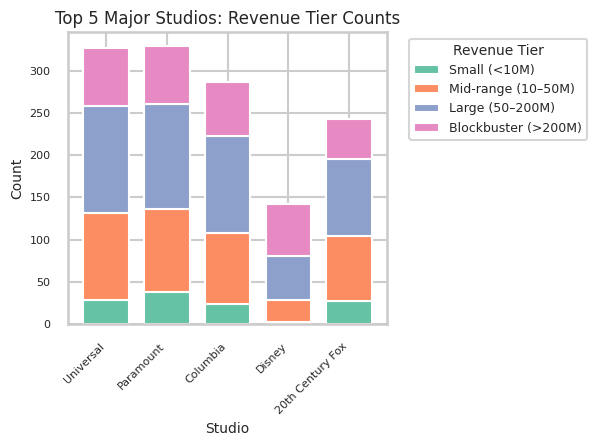

<Figure size 700x300 with 0 Axes>

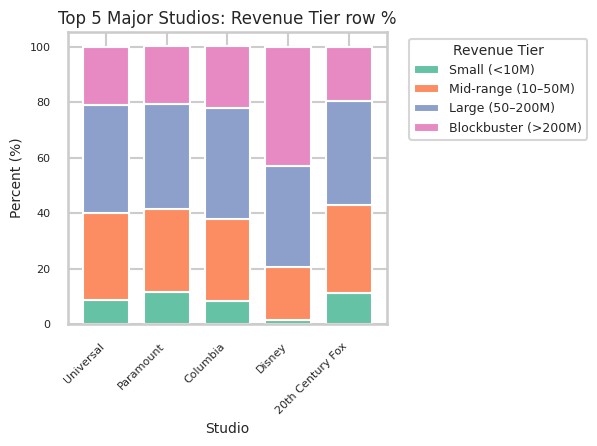

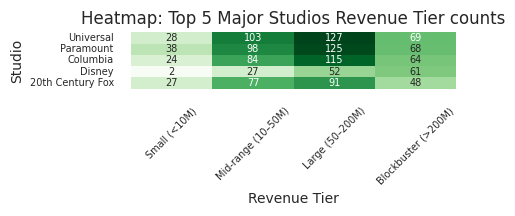

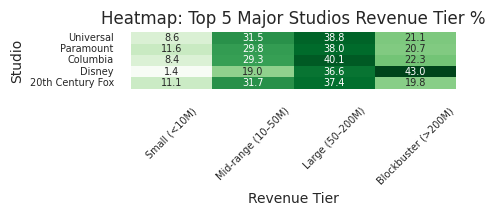


--- Profit Tier counts for Top 5 Major Studios ---
Profit Tier       Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Studio                                                                        
Paramount                59           47                 76              97   
Disney                   14            8                 26              50   
Universal                57           35                 85             107   
20th Century Fox         42           31                 62              66   
Columbia                 56           24                 68             107   

Profit Tier       Superhit (>200M)  
Studio                              
Paramount                       50  
Disney                          44  
Universal                       43  
20th Century Fox                42  
Columbia                        32  

--- Profit Tier % for Top 5 Major Studios ---
Profit Tier       Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Studio   

<Figure size 700x300 with 0 Axes>

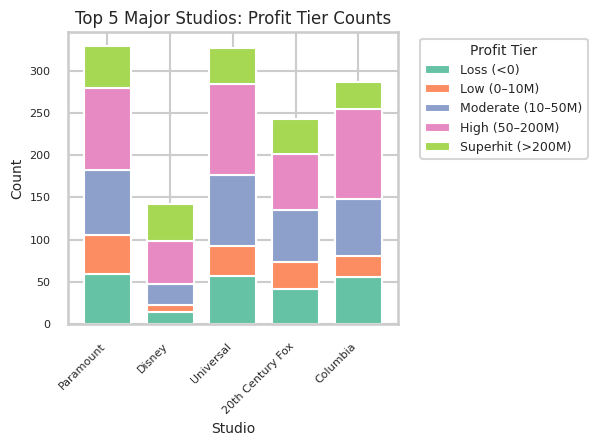

<Figure size 700x300 with 0 Axes>

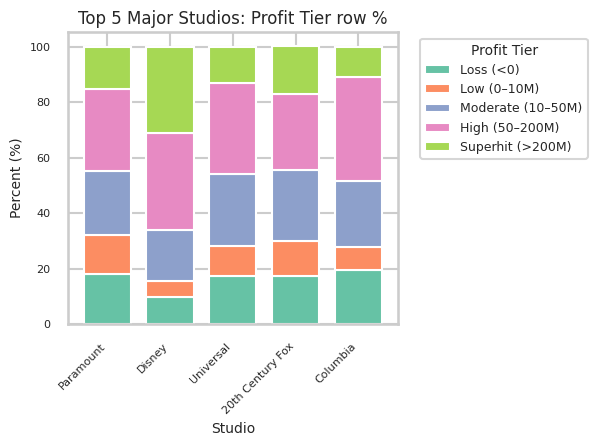

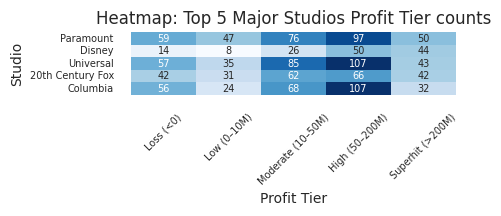

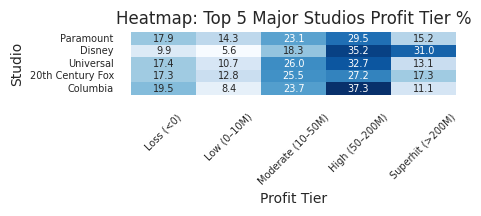


--- ROI Category counts for Top 5 Major Studios ---
ROI Category      Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Studio                                                                 
Universal                    57         59            59          90   
Paramount                    59         74            61          75   
20th Century Fox             42         34            51          70   
Columbia                     56         57            61          68   
United Artists               12          9            12          13   

ROI Category      Exceptional (>5)  
Studio                              
Universal                       62  
Paramount                       60  
20th Century Fox                46  
Columbia                        45  
United Artists                  36  

--- ROI Category % for Top 5 Major Studios ---
ROI Category      Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Studio                                                         

<Figure size 700x300 with 0 Axes>

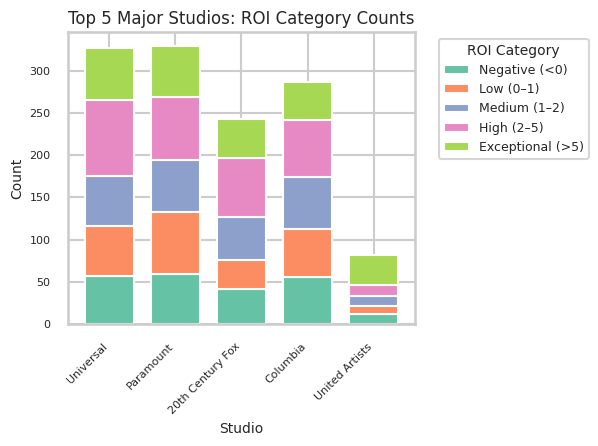

<Figure size 700x300 with 0 Axes>

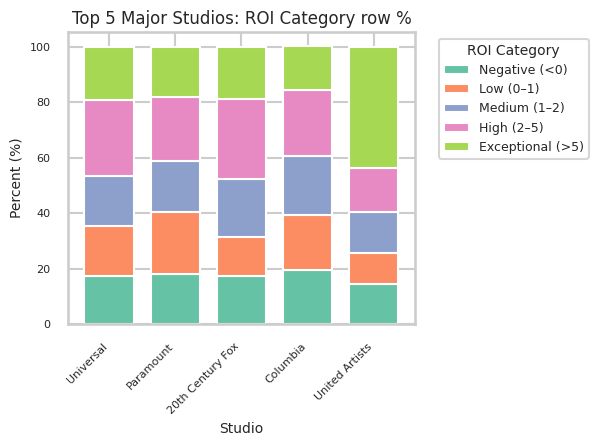

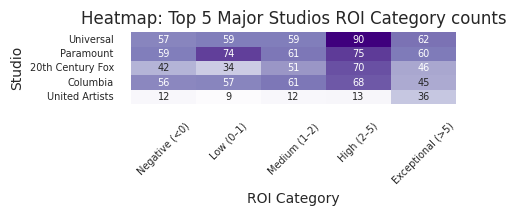

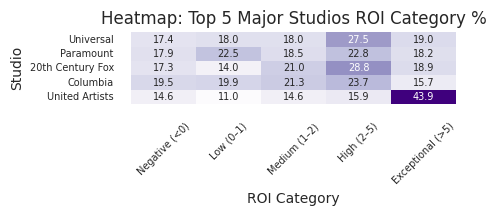

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load Final 6.xlsx
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Keep only rows where Studio is non-null
df = df[df['Studio'].notna()]

# 3. Mark Major vs Other studios
#    Treat any studio name as Major, and entries missing or labeled 'Other' as Other
df['StudioGroup'] = df['Studio'].apply(lambda s: s if s != 'Other' else 'Other')
df['StudioGroup'] = df['StudioGroup'].fillna('Other')
df['StudioGroup'] = df['StudioGroup'].where(df['StudioGroup']=='Other', 'Major Studio')
# Now StudioGroup is either 'Major Studio' or 'Other'

# 4. Define tier orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

# 5. Set a soft theme & smaller fonts
sns.set_theme(style='whitegrid')
sns.set_context("talk", rc={
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 9,
    "legend.title_fontsize": 10
})

def aggregated_studio_analysis(tier, order, cmap):
    # a) Crosstab counts
    ct = pd.crosstab(df['StudioGroup'], df[tier]).reindex(index=['Major Studio','Other'], columns=order, fill_value=0)
    print(f"\n--- {tier} counts: Major vs Other Studios ---")
    print(ct)

    # b) Crosstab row-percent
    pct = (ct.div(ct.sum(axis=1), axis=0) * 100).round(1)
    print(f"\n--- {tier} row %: Major vs Other Studios ---")
    print(pct)

    # c) Count bar chart
    plt.figure(figsize=(6,3))
    sns.countplot(
        data=df, x=tier, hue='StudioGroup',
        order=order, hue_order=['Major Studio','Other'],
        palette={'Major Studio':'#81c784','Other':'#64b5f6'}
    )
    plt.title(f'{tier}: Major vs Other Studios')
    plt.xticks(rotation=45)
    plt.ylabel('Count')
    plt.xlabel(tier)
    plt.legend(title='Studio Group', loc='upper right')
    plt.tight_layout()
    plt.show()

    # d) Percent bar chart
    df_pct = pct.reset_index().melt(id_vars='StudioGroup', var_name=tier, value_name='Percent')
    plt.figure(figsize=(6,3))
    sns.barplot(
        data=df_pct, x=tier, y='Percent', hue='StudioGroup',
        order=order, hue_order=['Major Studio','Other'],
        palette={'Major Studio':'#81c784','Other':'#64b5f6'}
    )
    plt.title(f'{tier}: Major vs Other Studios (row %)')
    plt.xticks(rotation=45)
    plt.ylabel('Percent (%)')
    plt.xlabel(tier)
    plt.legend(title='Studio Group', loc='upper right')
    plt.tight_layout()
    plt.show()

    # e) Heatmap counts
    plt.figure(figsize=(5,2.5))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap, cbar=False, annot_kws={"size":8})
    plt.title(f'Heatmap: {tier} counts (Major vs Other)')
    plt.ylabel('Studio Group')
    plt.xlabel(tier)
    plt.yticks(rotation=0, fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

    # f) Heatmap row-%
    plt.figure(figsize=(5,2.5))
    sns.heatmap(pct, annot=True, fmt='.1f', cmap=cmap, cbar=False, annot_kws={"size":8})
    plt.title(f'Heatmap: {tier} % (Major vs Other)')
    plt.ylabel('Studio Group')
    plt.xlabel(tier)
    plt.yticks(rotation=0, fontsize=8)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

def top_major_analysis(tier, order, cmap, top_n=5):
    # focus only on Major studios
    df_m = df[df['StudioGroup']=='Major Studio']
    ct_st = pd.crosstab(df_m['Studio'], df_m[tier]).reindex(columns=order, fill_value=0)
    # pick top_n studios by highest-tier count
    top_studios = ct_st[order[-1]].nlargest(top_n).index
    ct_top = ct_st.loc[top_studios]
    pct_top = (ct_top.div(ct_top.sum(axis=1), axis=0)*100).round(1)

    print(f"\n--- {tier} counts for Top {top_n} Major Studios ---")
    print(ct_top)
    print(f"\n--- {tier} % for Top {top_n} Major Studios ---")
    print(pct_top)

    # bar counts
    plt.figure(figsize=(7,3))
    ct_top.plot.bar(
        stacked=True, color=sns.color_palette("Set2", len(order)), width=0.75
    )
    plt.title(f"Top {top_n} Major Studios: {tier} Counts")
    plt.ylabel('Count')
    plt.xlabel('Studio')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # bar %
    plt.figure(figsize=(7,3))
    pct_top.plot.bar(
        stacked=True, color=sns.color_palette("Set2", len(order)), width=0.75
    )
    plt.title(f"Top {top_n} Major Studios: {tier} row %")
    plt.ylabel('Percent (%)')
    plt.xlabel('Studio')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=tier, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # heatmap counts
    plt.figure(figsize=(5,2.5))
    sns.heatmap(ct_top, annot=True, fmt='d', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f"Heatmap: Top {top_n} Major Studios {tier} counts")
    plt.ylabel('Studio')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

    # heatmap %
    plt.figure(figsize=(5,2.5))
    sns.heatmap(pct_top, annot=True, fmt='.1f', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f"Heatmap: Top {top_n} Major Studios {tier} %")
    plt.ylabel('Studio')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

# 6. Aggregated Major vs Other
aggregated_studio_analysis('Revenue Tier', rev_order, cmap='Greens')
aggregated_studio_analysis('Profit Tier', prof_order, cmap='Blues')
aggregated_studio_analysis('ROI Category', roi_order, cmap='Purples')

# 7. Top Major Studios breakdown
for tier, order, cmap in [
    ('Revenue Tier', rev_order, 'Greens'),
    ('Profit Tier', prof_order, 'Blues'),
    ('ROI Category', roi_order, 'Purples')
]:
    top_major_analysis(tier, order, cmap, top_n=5)



--- Revenue Tier counts by Runtime category ---
Revenue Tier    Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Runtime_bin                                                         
Feature (≤90m)           322                 207              162   
Long (91–135m)          1061                1288             1144   
Ultra (>135m)            128                 168              143   

Revenue Tier    Blockbuster (>200M)  
Runtime_bin                          
Feature (≤90m)                   53  
Long (91–135m)                  494  
Ultra (>135m)                   142  

--- Revenue Tier row % by Runtime category ---
Revenue Tier    Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Runtime_bin                                                         
Feature (≤90m)          43.3                27.8             21.8   
Long (91–135m)          26.6                32.3             28.7   
Ultra (>135m)           22.0                28.9             24.6   

Revenue Tier    Block

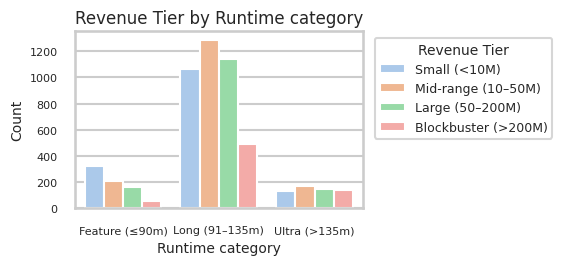

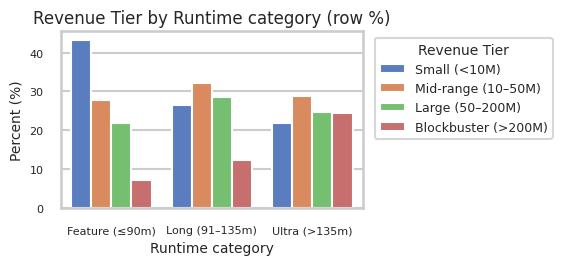

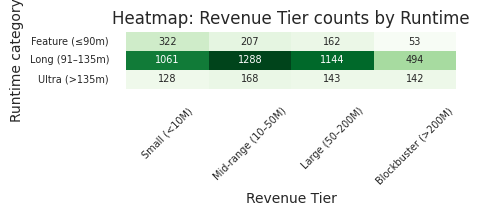

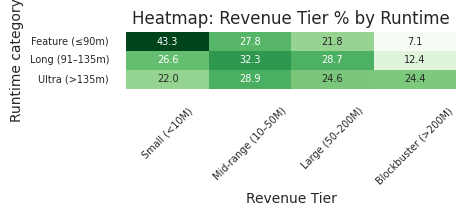


--- Profit Tier counts by Runtime category ---
Profit Tier     Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Runtime_bin                                                                 
Feature (≤90m)        245          200                140             123   
Long (91–135m)       1209          654                937             866   
Ultra (>135m)         121          104                128             111   

Profit Tier     Superhit (>200M)  
Runtime_bin                       
Feature (≤90m)                36  
Long (91–135m)               321  
Ultra (>135m)                117  

--- Profit Tier row % by Runtime category ---
Profit Tier     Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Runtime_bin                                                                 
Feature (≤90m)       32.9         26.9               18.8            16.5   
Long (91–135m)       30.3         16.4               23.5            21.7   
Ultra (>135m)        20.8         17

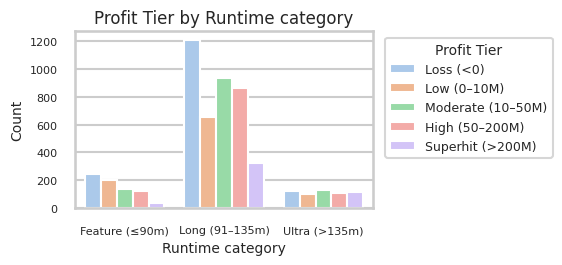

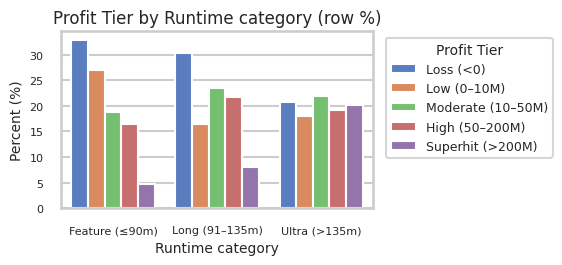

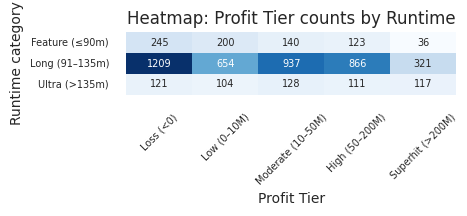

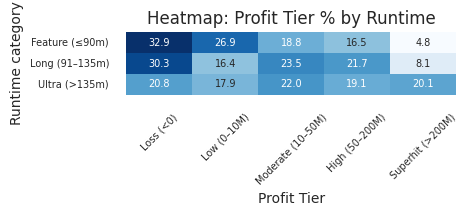


--- ROI Category counts by Runtime category ---
ROI Category    Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Runtime_bin                                                          
Feature (≤90m)            245        126            94         128   
Long (91–135m)           1209        778           611         774   
Ultra (>135m)             121        103            98         152   

ROI Category    Exceptional (>5)  
Runtime_bin                       
Feature (≤90m)               151  
Long (91–135m)               615  
Ultra (>135m)                107  

--- ROI Category row % by Runtime category ---
ROI Category    Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Runtime_bin                                                          
Feature (≤90m)           32.9       16.9          12.6        17.2   
Long (91–135m)           30.3       19.5          15.3        19.4   
Ultra (>135m)            20.8       17.7          16.9        26.2   

ROI Category    Exceptiona

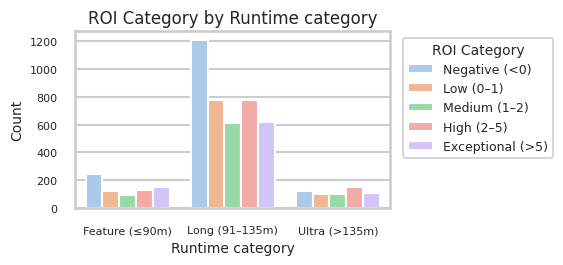

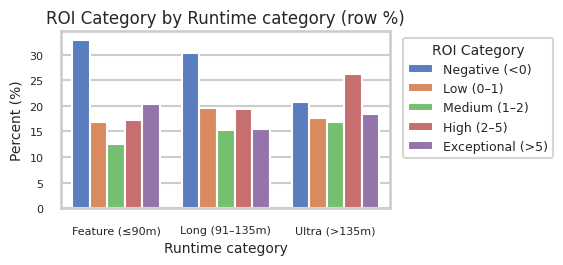

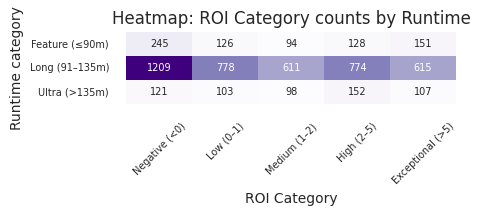

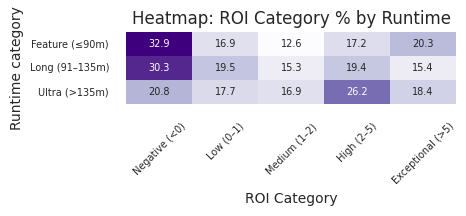

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load Final 6.xlsx (assumes drive already mounted)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 6.xlsx'
df = pd.read_excel(file_path, parse_dates=['Release Date'])

# 2. Keep only rows with non-null Runtime
df = df[df['Runtime'].notna()]

# 3. Re-bin Runtime into Feature, Long, Ultra
def runtime_category(rt):
    if rt <= 90:
        return 'Feature (≤90m)'
    elif rt <= 135:
        return 'Long (91–135m)'
    else:
        return 'Ultra (>135m)'

df['Runtime_bin'] = df['Runtime'].apply(runtime_category)

# 4. Define tier orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']
rt_order   = ['Feature (≤90m)','Long (91–135m)','Ultra (>135m)']

# 5. Set soft theme and reduced font sizes
sns.set_theme(style='whitegrid')
sns.set_context("talk", rc={
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 9,
    "legend.title_fontsize": 10
})

def analyze_runtime_vs_tier(tier, tier_order, cmap):
    # a) Crosstab counts
    ct = pd.crosstab(df['Runtime_bin'], df[tier]).reindex(index=rt_order, columns=tier_order, fill_value=0)
    print(f"\n--- {tier} counts by Runtime category ---")
    print(ct)

    # b) Crosstab row-%
    pct = (ct.div(ct.sum(axis=1), axis=0)*100).round(1)
    print(f"\n--- {tier} row % by Runtime category ---")
    print(pct)

    # c) Count bar chart
    plt.figure(figsize=(6,3))
    sns.countplot(
        data=df, x='Runtime_bin', hue=tier,
        order=rt_order, hue_order=tier_order,
        palette='pastel'
    )
    plt.title(f'{tier} by Runtime category')
    plt.xlabel('Runtime category')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.legend(title=tier, bbox_to_anchor=(1.02,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # d) Percent bar chart
    df_pct = pct.reset_index().melt(id_vars='Runtime_bin', var_name=tier, value_name='Percent')
    plt.figure(figsize=(6,3))
    sns.barplot(
        data=df_pct, x='Runtime_bin', y='Percent', hue=tier,
        order=rt_order, hue_order=tier_order,
        palette='muted'
    )
    plt.title(f'{tier} by Runtime category (row %)')
    plt.xlabel('Runtime category')
    plt.ylabel('Percent (%)')
    plt.legend(title=tier, bbox_to_anchor=(1.02,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # e) Heatmap counts
    plt.figure(figsize=(5,2.5))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f'Heatmap: {tier} counts by Runtime')
    plt.ylabel('Runtime category')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

    # f) Heatmap %
    plt.figure(figsize=(5,2.5))
    sns.heatmap(pct, annot=True, fmt='.1f', cmap=cmap, cbar=False, annot_kws={"size":7})
    plt.title(f'Heatmap: {tier} % by Runtime')
    plt.ylabel('Runtime category')
    plt.xlabel(tier)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.tight_layout()
    plt.show()

# 6. Run for each tier
analyze_runtime_vs_tier('Revenue Tier', rev_order, cmap='Greens')
analyze_runtime_vs_tier('Profit Tier', prof_order, cmap='Blues')
analyze_runtime_vs_tier('ROI Category', roi_order, cmap='Purples')


In [ ]:
# Path to save the new file
final7_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 7.xlsx'

# Save the DataFrame (df) to Excel
df.to_excel(final7_path, index=False)

print(f"Saved updated DataFrame with new Runtime_bin as: {final7_path}")


Saved updated DataFrame with new Runtime_bin as: /content/drive/My Drive/Colab Notebooks/804 Capstone/Final 7.xlsx


Summary statistics by genre:
         Genre  Count  Mean Revenue (M)  Median Revenue (M)  Mean Profit (M)  Median Profit (M)  Mean ROI  Median ROI
     Animation    301            242.96              126.55           174.61              75.54      4.68        1.80
     Adventure    965            211.32               90.02           145.45              47.44      5.45        1.30
       Fantasy    519            206.04               89.79           142.61              44.85      4.49        1.20
        Family    541            203.97              100.08           143.38              55.07      3.91        1.50
ScienceFiction    642            157.40               53.39           104.26              18.34      4.29        1.05
        Action   1418            146.76               57.64            95.45              21.69      4.68        1.04
      Thriller   1515             89.83               36.73            56.24              13.66      4.98        1.00
        Comedy   1835      

<ipython-input-44-b33d61674531>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=stats_df, x='Mean Revenue (M)', y='Genre', palette='Blues_r')


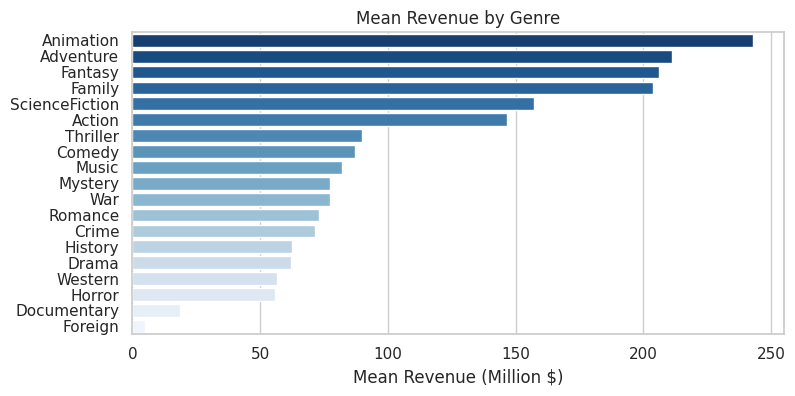

<ipython-input-44-b33d61674531>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=stats_df, x='Mean Profit (M)', y='Genre', palette='Greens_r')


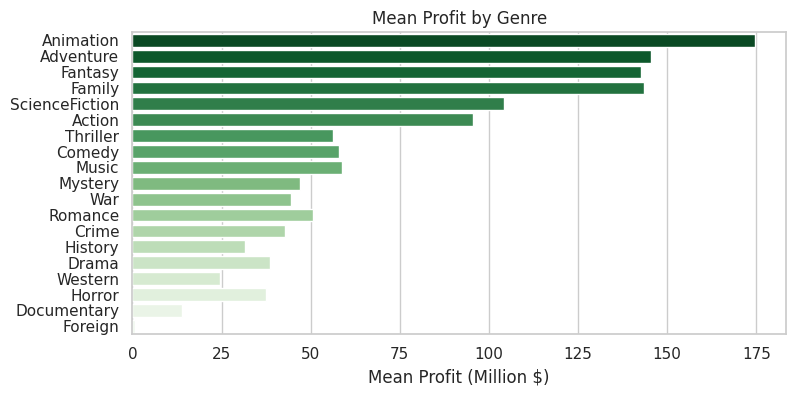

<ipython-input-44-b33d61674531>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=stats_df, x='Mean ROI', y='Genre', palette='Purples_r')


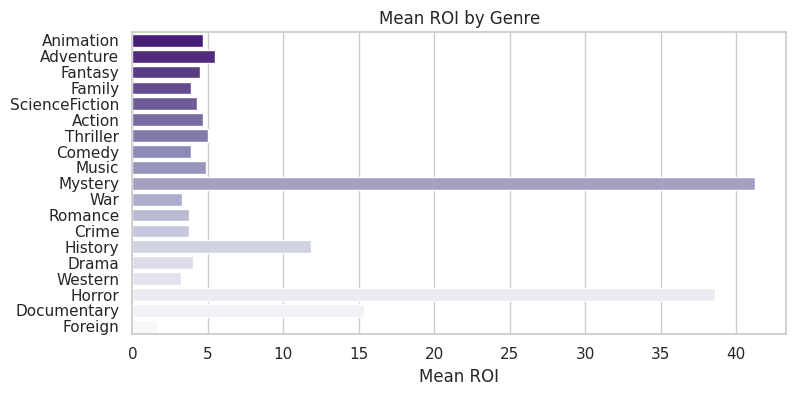

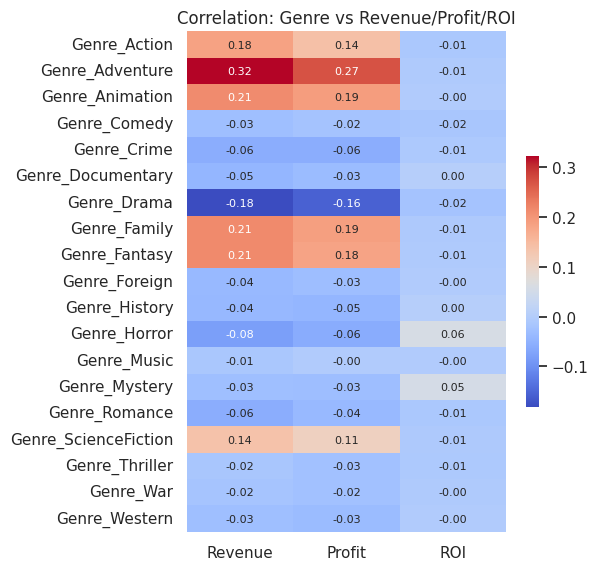

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 7 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 7.xlsx'
df = pd.read_excel(file_path)

# 2. Identify one-hot genre columns and filter those with at least 5 occurrences
genre_cols = [c for c in df.columns if c.startswith('Genre_')]
valid_genres = [g for g in genre_cols if df[g].sum() >= 5]

# 3. Compute summary statistics per genre
stats = []
for genre in valid_genres:
    subset = df[df[genre] == 1]
    stats.append({
        'Genre': genre.replace('Genre_', ''),
        'Count': subset.shape[0],
        'Mean Revenue (M)': subset['Revenue'].mean() / 1e6,
        'Median Revenue (M)': subset['Revenue'].median() / 1e6,
        'Mean Profit (M)': subset['Profit'].mean() / 1e6,
        'Median Profit (M)': subset['Profit'].median() / 1e6,
        'Mean ROI': subset['ROI'].mean(),
        'Median ROI': subset['ROI'].median()
    })
stats_df = pd.DataFrame(stats).sort_values('Mean Revenue (M)', ascending=False)

# Display summary stats
print("Summary statistics by genre:")
print(stats_df.to_string(index=False, float_format="%.2f"))

# 4. Set plotting style
sns.set_theme(style='whitegrid')
plt.rcParams.update({'font.size': 8})

# 5. Bar chart: Mean Revenue by genre
plt.figure(figsize=(8, 4))
sns.barplot(data=stats_df, x='Mean Revenue (M)', y='Genre', palette='Blues_r')
plt.title('Mean Revenue by Genre')
plt.xlabel('Mean Revenue (Million $)')
plt.ylabel('')
plt.tight_layout()
plt.show()

# 6. Bar chart: Mean Profit by genre
plt.figure(figsize=(8, 4))
sns.barplot(data=stats_df, x='Mean Profit (M)', y='Genre', palette='Greens_r')
plt.title('Mean Profit by Genre')
plt.xlabel('Mean Profit (Million $)')
plt.ylabel('')
plt.tight_layout()
plt.show()

# 7. Bar chart: Mean ROI by genre
plt.figure(figsize=(8, 4))
sns.barplot(data=stats_df, x='Mean ROI', y='Genre', palette='Purples_r')
plt.title('Mean ROI by Genre')
plt.xlabel('Mean ROI')
plt.ylabel('')
plt.tight_layout()
plt.show()

# 8. Heatmap: correlation of genres with Revenue, Profit, ROI
corr_df = df[valid_genres + ['Revenue', 'Profit', 'ROI']].corr()
plt.figure(figsize=(6, len(valid_genres)*0.25 + 1))
sns.heatmap(
    corr_df.loc[valid_genres, ['Revenue', 'Profit', 'ROI']],
    annot=True, fmt='.2f', cmap='coolwarm', cbar_kws={'shrink': .5}
)
plt.title('Correlation: Genre vs Revenue/Profit/ROI')
plt.xlabel('')
plt.tight_layout()
plt.show()



--- Revenue Tier counts by Genre ---
Revenue Tier    Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Drama                    908                 851              612   
Comedy                   496                 573              535   
Thriller                 371                 495              471   
Action                   272                 391              449   
Romance                  323                 329              250   
Adventure                142                 222              290   
Crime                    232                 294              264   
ScienceFiction           143                 171              182   
Horror                   179                 209              172   
Family                    57                 130              183   
Fantasy                   79                 124              158   
Mystery                  119                 148              128   
Animation                 43                  51               87

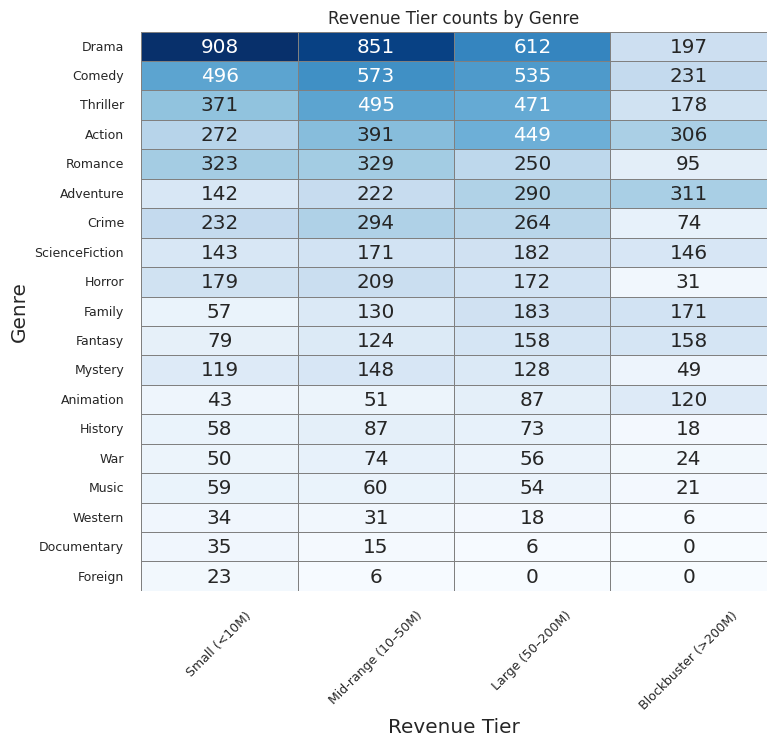

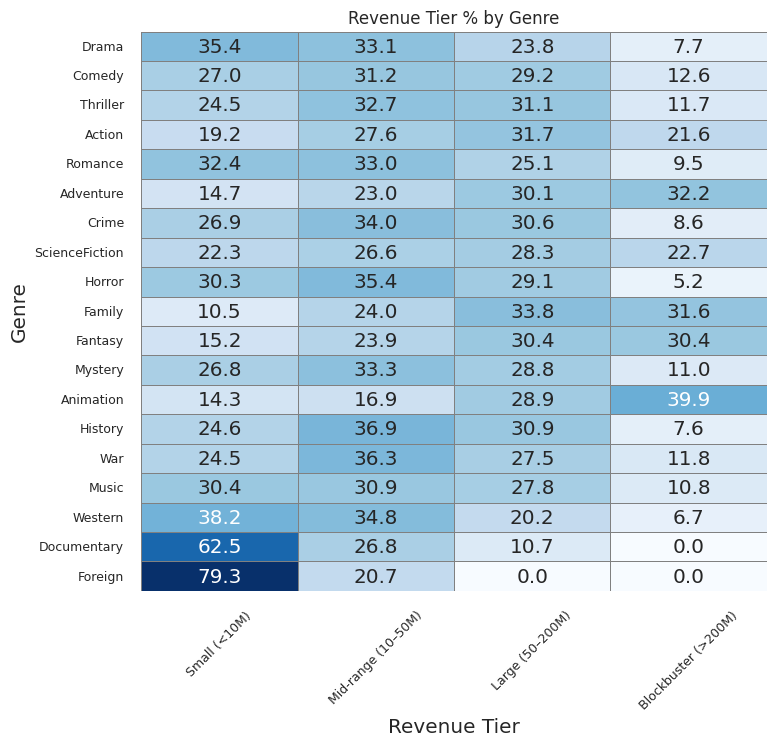


--- Profit Tier counts by Genre ---
Profit Tier     Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Drama                 890          545                570             434   
Comedy                509          327                427             414   
Thriller              467          226                357             354   
Action                392          176                294             349   
Romance               290          229                228             184   
Adventure             228           93                172             239   
Crime                 253          170                216             181   
ScienceFiction        176           94                132             136   
Horror                160          108                175             129   
Family                107           45                109             151   
Fantasy               123           61                 88             132   
Mystery               152           74 

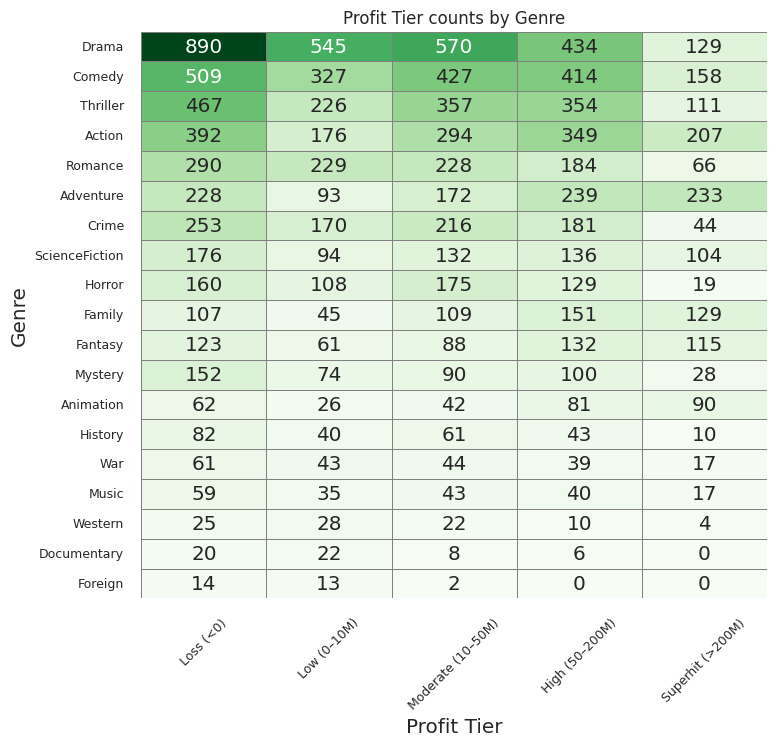

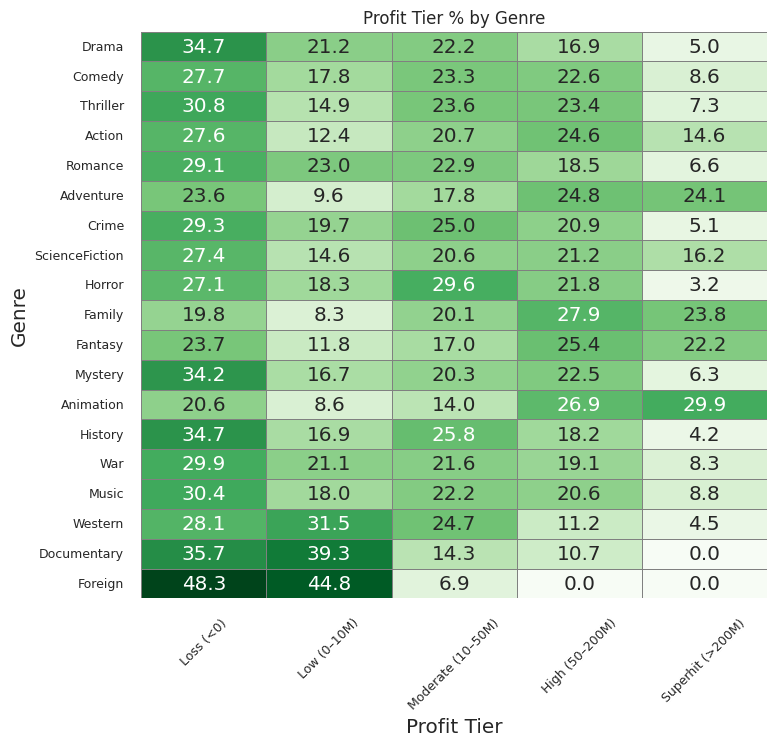


--- ROI Category counts by Genre ---
ROI Category    Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Drama                     890        475           352         448   
Comedy                    509        362           274         375   
Thriller                  467        287           247         309   
Action                    392        301           241         314   
Romance                   290        186           143         188   
Adventure                 228        204           160         223   
Crime                     253        202           134         171   
ScienceFiction            176        138           107         134   
Horror                    160         82           101         118   
Family                    107        112            96         136   
Fantasy                   123        118            95         106   
Mystery                   152         81            64          86   
Animation                  62         58            

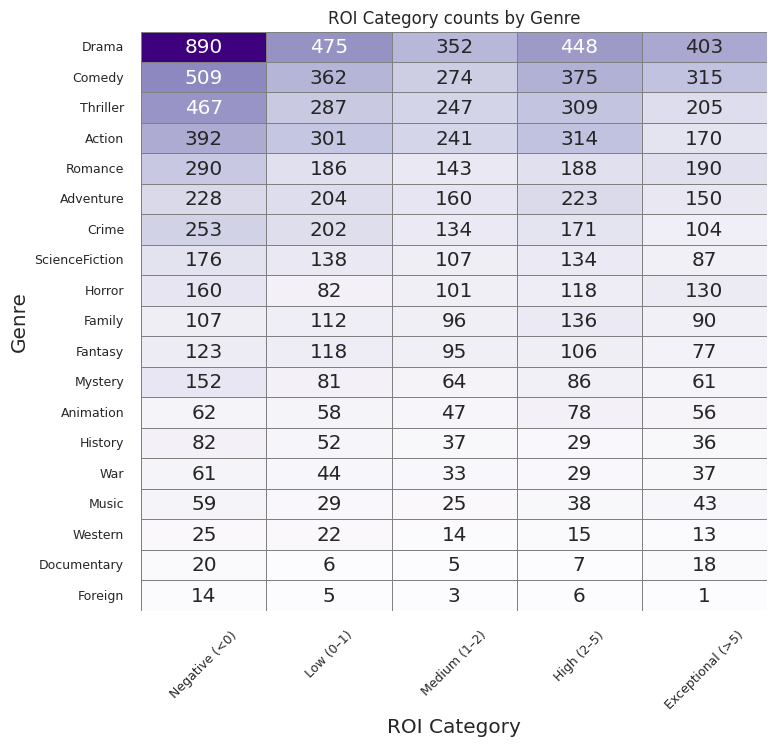

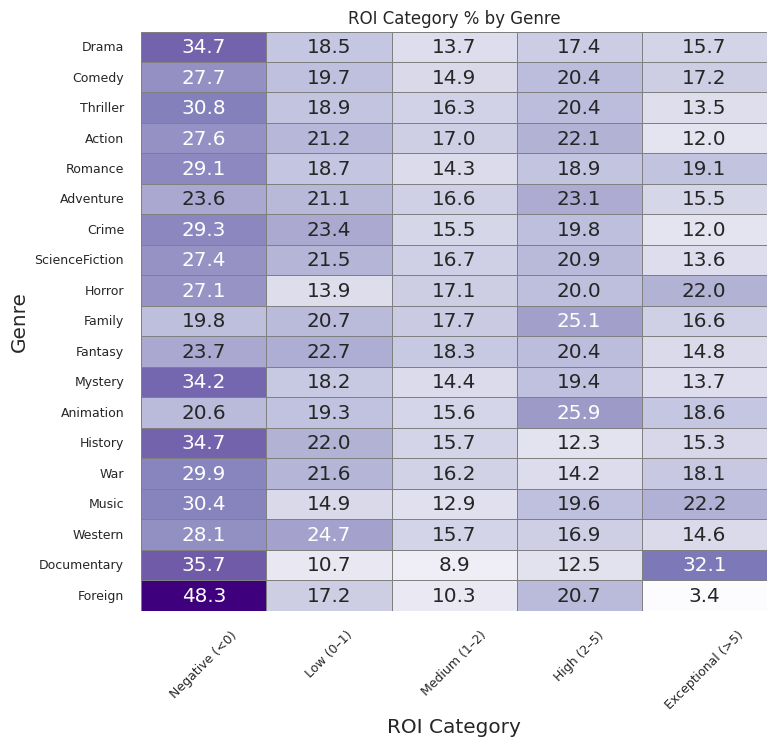

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Read Final 7 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 7.xlsx'
df = pd.read_excel(file_path)

# 2. Identify genre one‑hot columns
genre_cols = [c for c in df.columns if c.startswith('Genre_')]

# 3. Keep only rows with complete genre flags
dfg = df.dropna(subset=genre_cols)

# 4. Filter genres with at least 5 films
genre_counts = dfg[genre_cols].sum().sort_values(ascending=False)
valid_genres = genre_counts[genre_counts >= 5].index.tolist()

# 5. Define tier orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']
tier_map   = {
    'Revenue Tier': (rev_order, 'Blues'),
    'Profit Tier':  (prof_order, 'Greens'),
    'ROI Category': (roi_order,  'Purples')
}

# 6. Set plotting style
sns.set_theme(style='whitegrid')
sns.set_context('talk', font_scale=0.8)

# 7. Loop over each tier column
for tier_col, (order, cmap) in tier_map.items():
    # a) Build count table
    counts = {
        g.replace('Genre_', ''): dfg[dfg[g] == 1][tier_col]
                                  .value_counts()
                                  .reindex(order, fill_value=0)
        for g in valid_genres
    }
    counts_df = pd.DataFrame(counts).T

    print(f"\n--- {tier_col} counts by Genre ---")
    print(counts_df)

    # b) Build percent table (row %)
    pct_df = counts_df.div(counts_df.sum(axis=1), axis=0) * 100
    pct_df = pct_df.round(1)

    print(f"\n--- {tier_col} % by Genre (row %) ---")
    print(pct_df)

    # c) Count‑based heatmap
    plt.figure(figsize=(8, len(valid_genres) * 0.3 + 2))
    sns.heatmap(
        counts_df, annot=True, fmt='d', cmap=cmap,
        cbar=False, linewidths=0.5, linecolor='gray'
    )
    plt.title(f'{tier_col} counts by Genre', fontsize=12)
    plt.ylabel('Genre')
    plt.xlabel(tier_col)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()

    # d) Percent‑based heatmap
    plt.figure(figsize=(8, len(valid_genres) * 0.3 + 2))
    sns.heatmap(
        pct_df, annot=True, fmt='.1f', cmap=cmap,
        cbar=False, linewidths=0.5, linecolor='gray'
    )
    plt.title(f'{tier_col} % by Genre', fontsize=12)
    plt.ylabel('Genre')
    plt.xlabel(tier_col)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()


=== Top Genre Combos by Count ===
               Genre_Combo  Count  Mean Revenue (M)  Median Revenue (M)  \
127                  Drama    375         43.026919           13.350369   
83                  Comedy    319         65.947706           38.435947   
148          Drama&Romance    206         40.112220           12.959429   
97    Comedy&Drama&Romance    193         63.120646           24.000000   
90            Comedy&Drama    185         35.426862           10.686841   
111         Comedy&Romance    146         92.518337           40.242874   
166        Horror&Thriller    110         47.203456           35.995356   
122   Crime&Drama&Thriller     98         62.427756           40.037362   
154         Drama&Thriller     76         36.786372           16.450000   
33   Action&Crime&Thriller     75        105.193403           51.000000   

     Mean Profit (M)  Median Profit (M)   Mean ROI  Median ROI  
127        27.772036           1.691899   4.510750    0.450000  
83        

<ipython-input-56-a62af4552359>:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-56-a62af4552359>:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-56-a62af4552359>:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


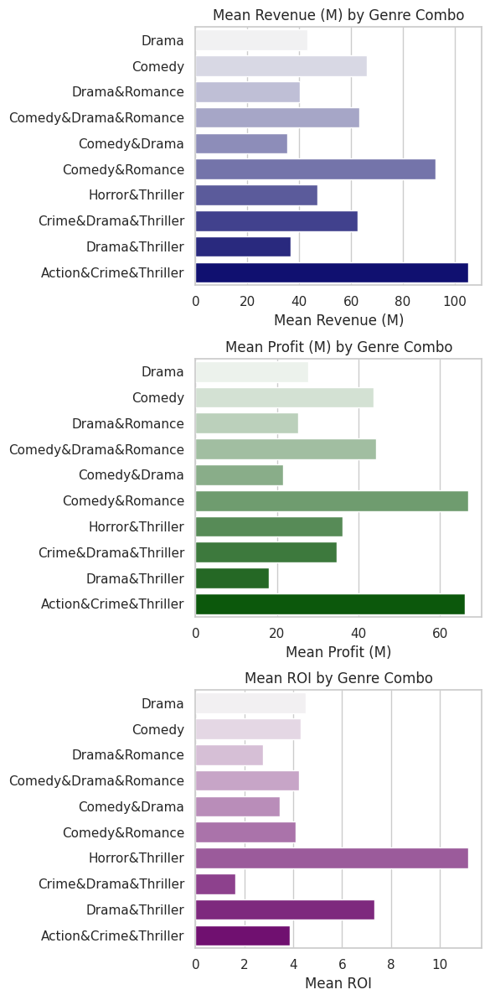

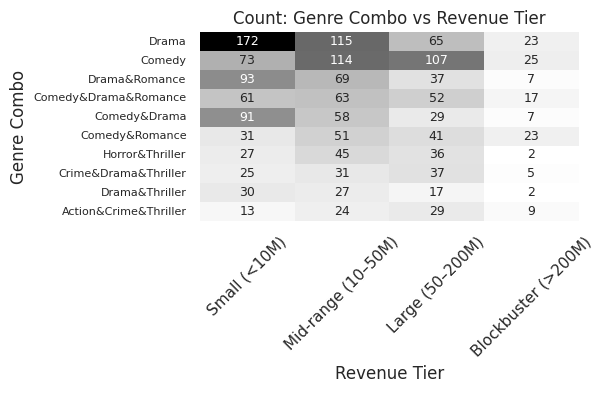

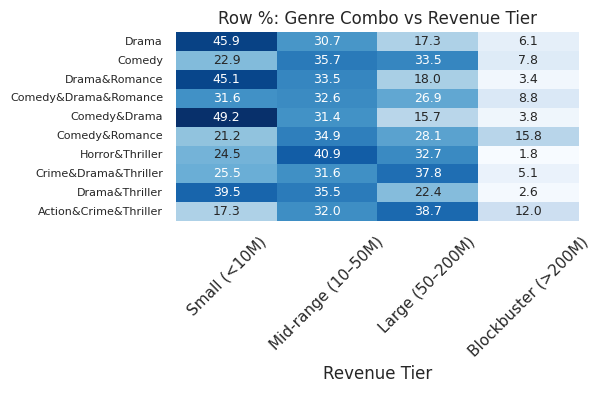

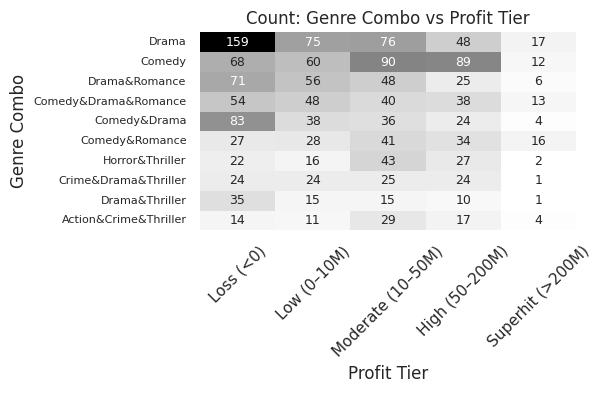

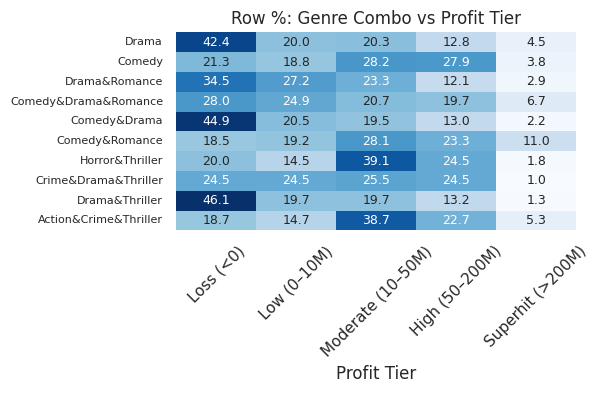

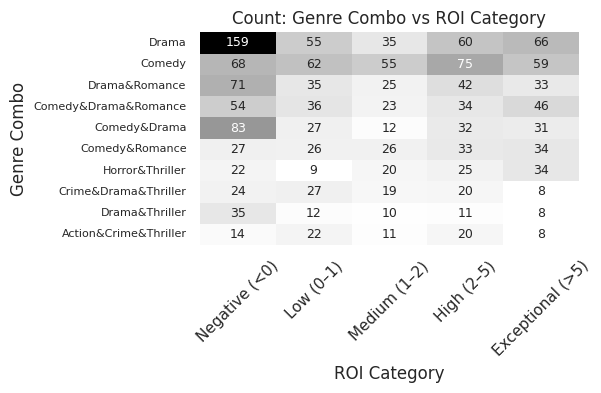

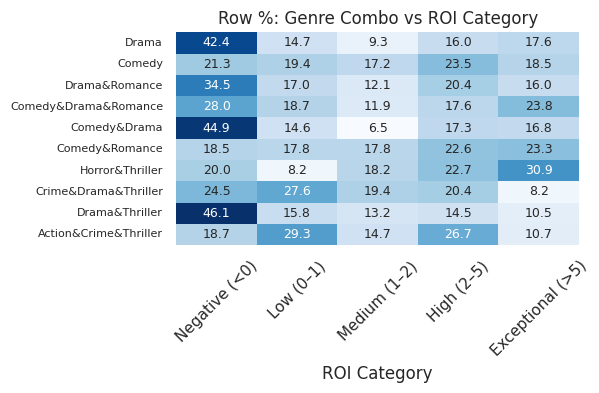

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 7 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 7.xlsx'
df = pd.read_excel(file_path)

# 2. Identify genre columns and drop any rows with missing genre flags (if any)
genre_cols = [c for c in df.columns if c.startswith('Genre_')]
df = df.dropna(subset=genre_cols)

# 3. Build “combo” strings of all genres present in each film
def make_combo(row):
    genres = [g.replace('Genre_', '') for g in genre_cols if row[g] == 1]
    return '&'.join(sorted(genres)) if genres else 'None'
df['Genre_Combo'] = df.apply(make_combo, axis=1)

# 4. Keep only combos with at least 5 films
combo_counts = df['Genre_Combo'].value_counts()
valid_combos = combo_counts[combo_counts >= 5].index
df_combo = df[df['Genre_Combo'].isin(valid_combos)].copy()

# 5. Compute descriptive stats per combo
stats = df_combo.groupby('Genre_Combo').agg(
    Count=('Revenue', 'size'),
    **{'Mean Revenue (M)': ('Revenue', lambda x: x.mean()/1e6),
       'Median Revenue (M)': ('Revenue', lambda x: x.median()/1e6),
       'Mean Profit (M)': ('Profit', lambda x: x.mean()/1e6),
       'Median Profit (M)': ('Profit', lambda x: x.median()/1e6),
       'Mean ROI': ('ROI', 'mean'),
       'Median ROI': ('ROI', 'median')}
).reset_index().sort_values('Count', ascending=False)

print("=== Top Genre Combos by Count ===")
print(stats.head(10))

# 6. Set a subtle theme and smaller font
sns.set_theme(style='whitegrid')
plt.rc('font', size=9)

top_n = 10
top_stats = stats.head(top_n)

# A) Barplots of mean Revenue, Profit, ROI for top combos
fig, axes = plt.subplots(3, 1, figsize=(6, 12), sharey=False)
palette = sns.light_palette("navy", n_colors=top_n)

sns.barplot(
    data=top_stats,
    x='Mean Revenue (M)', y='Genre_Combo', ax=axes[0],
    palette=palette
)
axes[0].set_title('Mean Revenue (M) by Genre Combo')
axes[0].set_xlabel('Mean Revenue (M)')
axes[0].set_ylabel('')

sns.barplot(
    data=top_stats,
    x='Mean Profit (M)', y='Genre_Combo', ax=axes[1],
    palette=sns.light_palette("darkgreen", n_colors=top_n)
)
axes[1].set_title('Mean Profit (M) by Genre Combo')
axes[1].set_xlabel('Mean Profit (M)')
axes[1].set_ylabel('')

sns.barplot(
    data=top_stats,
    x='Mean ROI', y='Genre_Combo', ax=axes[2],
    palette=sns.light_palette("purple", n_colors=top_n)
)
axes[2].set_title('Mean ROI by Genre Combo')
axes[2].set_xlabel('Mean ROI')
axes[2].set_ylabel('')

plt.tight_layout()
plt.show()

# 7. Crosstabs and heatmaps for tiers by combo
tiers = {
    'Revenue Tier': ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)'],
    'Profit Tier': ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)'],
    'ROI Category': ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']
}

for col, order in tiers.items():
    ct = pd.crosstab(df_combo['Genre_Combo'], df_combo[col]).loc[top_stats['Genre_Combo'], order]
    ct_pct = ct.div(ct.sum(axis=1), axis=0) * 100

    # Count heatmap
    plt.figure(figsize=(6, top_n * 0.3 + 1))
    sns.heatmap(ct, annot=True, fmt='d', cmap='Greys', cbar=False)
    plt.title(f'Count: Genre Combo vs {col}')
    plt.xlabel(col)
    plt.ylabel('Genre Combo')
    plt.xticks(rotation=45)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    plt.show()

    # Percent heatmap
    plt.figure(figsize=(6, top_n * 0.3 + 1))
    sns.heatmap(ct_pct, annot=True, fmt='.1f', cmap='Blues', cbar=False)
    plt.title(f'Row %: Genre Combo vs {col}')
    plt.xlabel(col)
    plt.ylabel('')
    plt.xticks(rotation=45)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    plt.show()


=== Era Counts ===
Era
Multiplex Age      1881
Blockbuster Era    1531
Digital Era        1408
New Hollywood       231
Post‑Classical      170
Golden Age           43
Talkies Era          36
Silent Era           12
Name: count, dtype: int64 


--- Revenue Tier by Era (counts) ---
Revenue Tier     Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Era                                                                  
Blockbuster Era           419                 557              381   
Digital Era               413                 352              387   
Golden Age                 30                   9                3   
Multiplex Age             469                 560              607   
New Hollywood              57                 114               50   
Post‑Classical             81                  67               20   
Silent Era                 11                   1                0   
Talkies Era                31                   3                1   

Revenue Tier     B

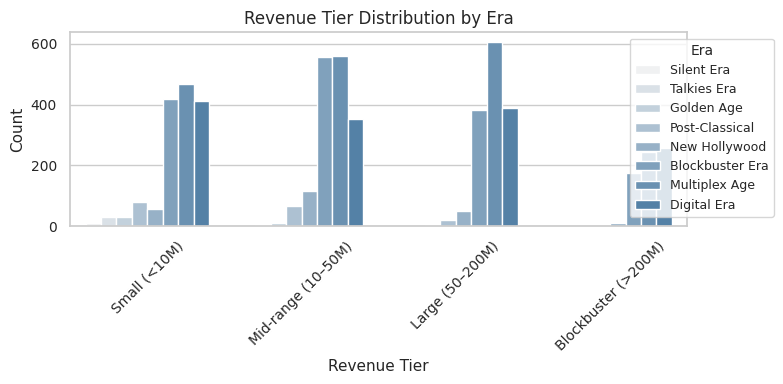

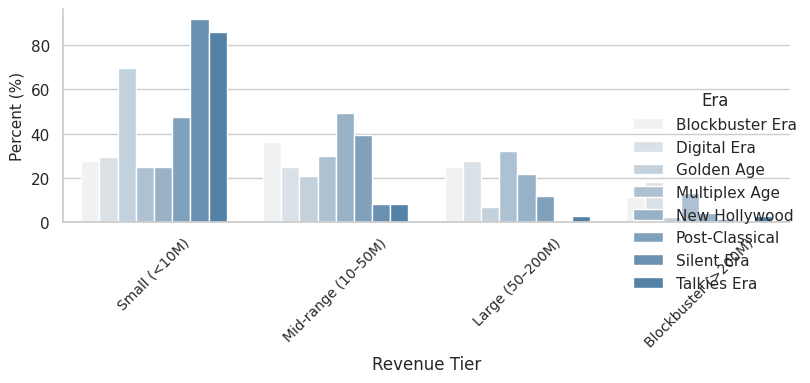

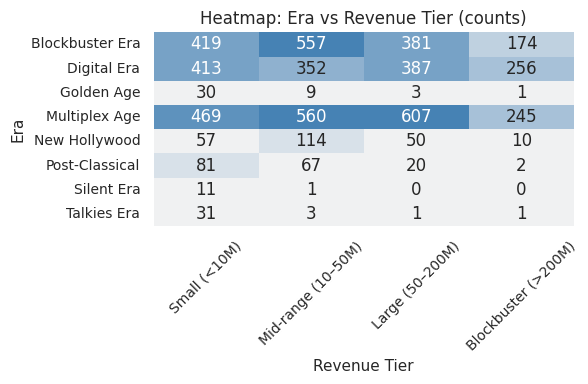

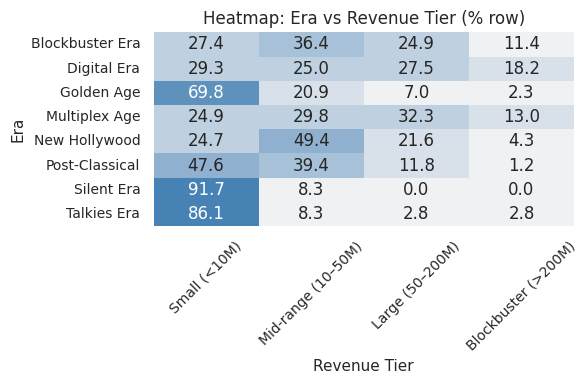


--- Profit Tier by Era (counts) ---
Profit Tier      Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Era                                                                          
Blockbuster Era        509          242                359             297   
Digital Era            421          210                286             310   
Golden Age               2           31                  6               3   
Multiplex Age          596          284                416             428   
New Hollywood           25           64                 88              46   
Post‑Classical          20           87                 46              15   
Silent Era               1           10                  1               0   
Talkies Era              1           30                  3               1   

Profit Tier      Superhit (>200M)  
Era                                
Blockbuster Era               124  
Digital Era                   181  
Golden Age                      1  
Mu

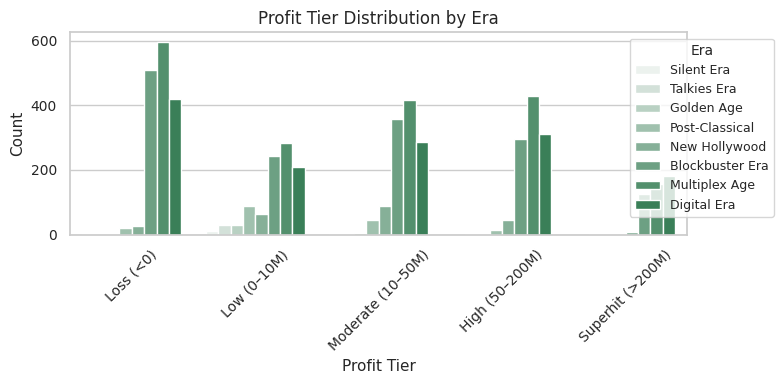

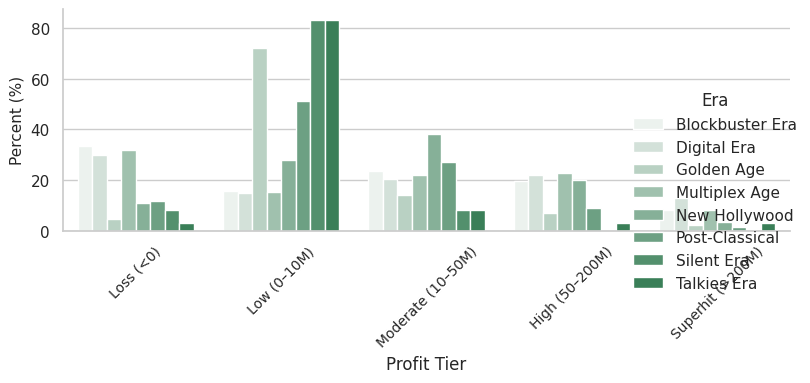

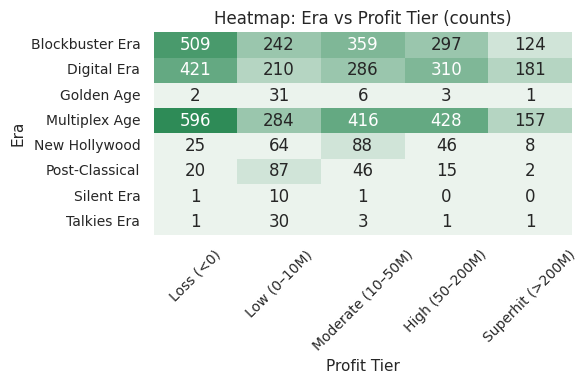

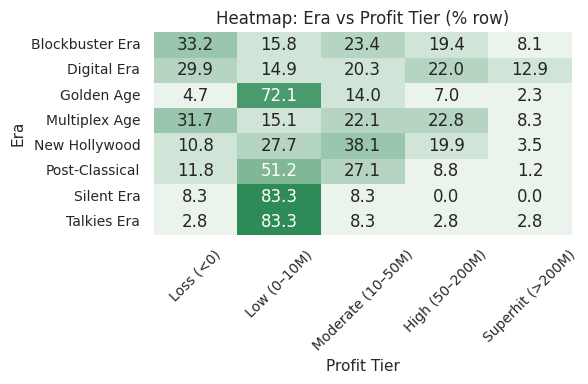


--- ROI Category by Era (counts) ---
ROI Category     Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Era                                                                   
Blockbuster Era            509        263           228         268   
Digital Era                421        252           231         300   
Golden Age                   2          7             8          14   
Multiplex Age              596        422           285         369   
New Hollywood               25         37            14          47   
Post‑Classical              20         16            27          48   
Silent Era                   1          2             4           0   
Talkies Era                  1          8             6           8   

ROI Category     Exceptional (>5)  
Era                                
Blockbuster Era               263  
Digital Era                   204  
Golden Age                     12  
Multiplex Age                 209  
New Hollywood                 108  

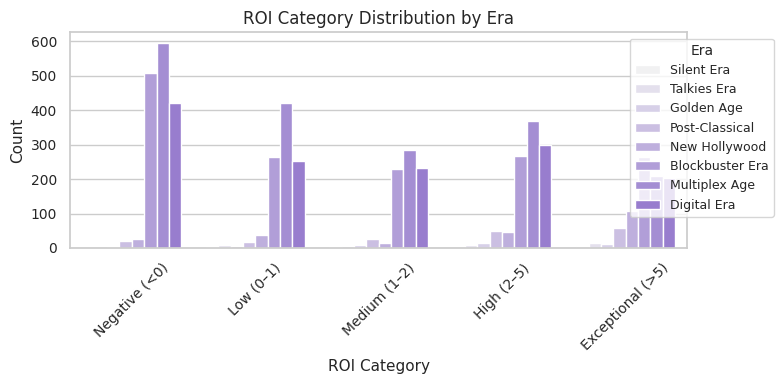

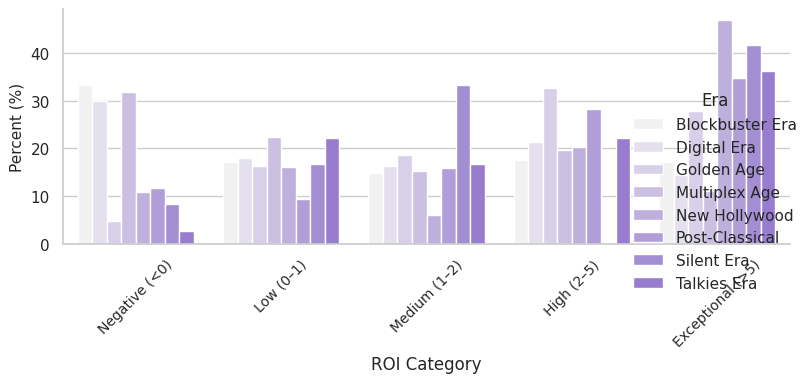

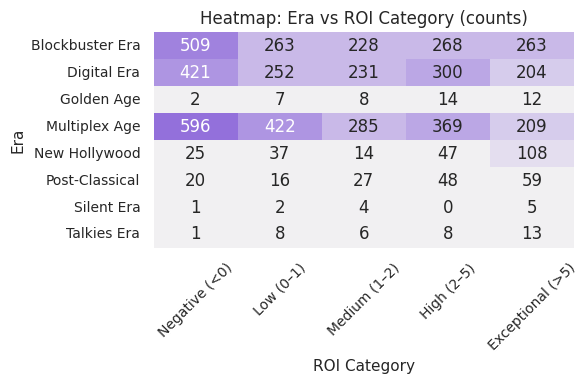

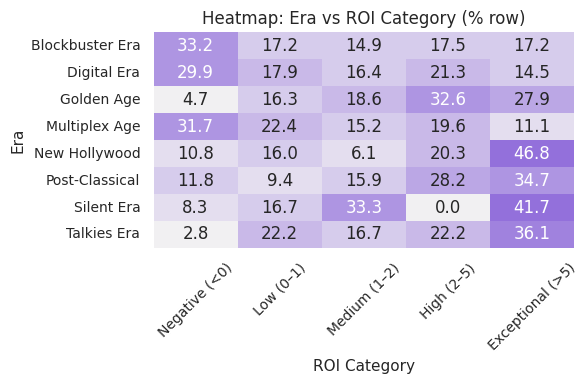

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 7 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 7.xlsx'
df = pd.read_excel(file_path)

# 2. Map Release Year → Film Era
def assign_era(year):
    if year <= 1927:
        return 'Silent Era'
    elif year <= 1939:
        return 'Talkies Era'
    elif year <= 1948:
        return 'Golden Age'
    elif year <= 1967:
        return 'Post‑Classical'
    elif year <= 1980:
        return 'New Hollywood'
    elif year <= 2000:
        return 'Blockbuster Era'
    elif year <= 2010:
        return 'Multiplex Age'
    else:
        return 'Digital Era'

df['Era'] = df['Release Year'].apply(assign_era)

# 3. Save updated DataFrame as Final 8
output_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df.to_excel(output_path, index=False)

# 4. Filter out tiny eras (<5 films)
era_counts = df['Era'].value_counts()
keep_eras = era_counts[era_counts >= 5].index.tolist()
df2 = df[df['Era'].isin(keep_eras)].copy()

print("=== Era Counts ===")
print(era_counts, "\n")

# 5. Define tier orders
rev_order  = ['Small (<10M)', 'Mid‑range (10–50M)', 'Large (50–200M)', 'Blockbuster (>200M)']
prof_order = ['Loss (<0)', 'Low (0–10M)', 'Moderate (10–50M)', 'High (50–200M)', 'Superhit (>200M)']
roi_order  = ['Negative (<0)', 'Low (0–1)', 'Medium (1–2)', 'High (2–5)', 'Exceptional (>5)']

# 6. Helper to analyze Era vs Tier
def era_vs_tier(tier, order, palette, ylabel):
    # a) Crosstab counts
    ct_counts = pd.crosstab(df2['Era'], df2[tier]).reindex(order, axis=1).fillna(0).astype(int)
    print(f"\n--- {tier} by Era (counts) ---")
    print(ct_counts)
    # b) Crosstab row‑percent
    ct_pct = ct_counts.div(ct_counts.sum(axis=1), axis=0).round(3) * 100
    print(f"\n--- {tier} by Era (row %) ---")
    print(ct_pct)
    # c) Count‑based bar chart
    plt.figure(figsize=(8,4))
    sns.countplot(data=df2, x=tier, hue='Era', order=order, palette=palette)
    plt.title(f'{tier} Distribution by Era', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel(tier, fontsize=11)
    plt.ylabel('Count', fontsize=11)
    plt.legend(title='Era', fontsize=9, title_fontsize=10, loc='upper right', bbox_to_anchor=(1.15,1))
    plt.tight_layout()
    plt.show()
    # d) Percent‑based bar chart
    melted = ct_pct.reset_index().melt(id_vars='Era', var_name=tier, value_name='Percent')
    g = sns.catplot(
        data=melted, kind='bar', x=tier, y='Percent', hue='Era',
        order=order, palette=palette, height=4, aspect=1.6
    )
    g.set_titles(f'{tier} Distribution by Era (row %)', fontsize=12)
    g.set_xticklabels(rotation=45, fontsize=10)
    g.set_ylabels('Percent (%)', fontsize=11)
    plt.tight_layout()
    plt.show()
    # e) Count‑based heatmap
    plt.figure(figsize=(6,4))
    sns.heatmap(ct_counts, annot=True, fmt='d', cmap=palette, cbar=False)
    plt.title(f'Heatmap: Era vs {tier} (counts)', fontsize=12)
    plt.xlabel(tier, fontsize=11)
    plt.ylabel('Era', fontsize=11)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()
    # f) Percent‑based heatmap
    plt.figure(figsize=(6,4))
    sns.heatmap(ct_pct, annot=True, fmt='.1f', cmap=palette, cbar=False)
    plt.title(f'Heatmap: Era vs {tier} (% row)', fontsize=12)
    plt.xlabel(tier, fontsize=11)
    plt.ylabel('Era', fontsize=11)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()

# 7. Set a softer color palette
sns.set_theme(style='whitegrid')
rev_palette  = sns.light_palette("steelblue", n_colors=len(keep_eras))
prof_palette = sns.light_palette("seagreen", n_colors=len(keep_eras))
roi_palette  = sns.light_palette("mediumpurple", n_colors=len(keep_eras))


# 8. Run analysis
era_vs_tier('Revenue Tier', rev_order,  rev_palette,  'Count')
era_vs_tier('Profit Tier',   prof_order, prof_palette, 'Count')
era_vs_tier('ROI Category',  roi_order,  roi_palette,  'Count')


=== Era Counts ===
 Era
Multiplex Age      1881
Blockbuster Era    1531
Digital Era        1408
New Hollywood       231
Post‑Classical      170
Golden Age           43
Talkies Era          36
Silent Era           12
Name: count, dtype: int64 


--- Revenue Tier by Era (counts) ---
 Revenue Tier     Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Era                                                                  
Blockbuster Era           419                 557              381   
Digital Era               413                 352              387   
Golden Age                 30                   9                3   
Multiplex Age             469                 560              607   
New Hollywood              57                 114               50   
Post‑Classical             81                  67               20   
Silent Era                 11                   1                0   
Talkies Era                31                   3                1   

Revenue Tier    

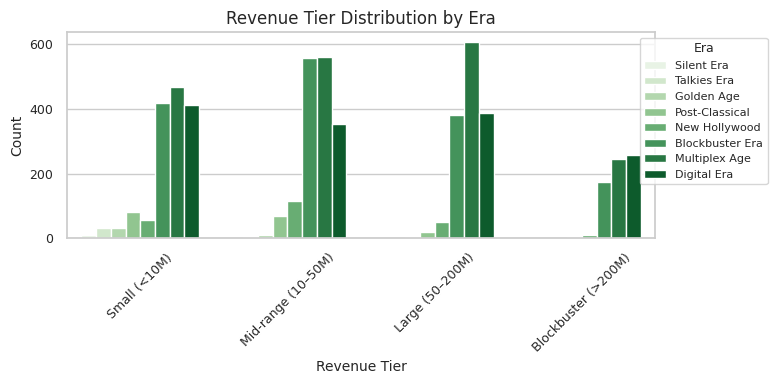

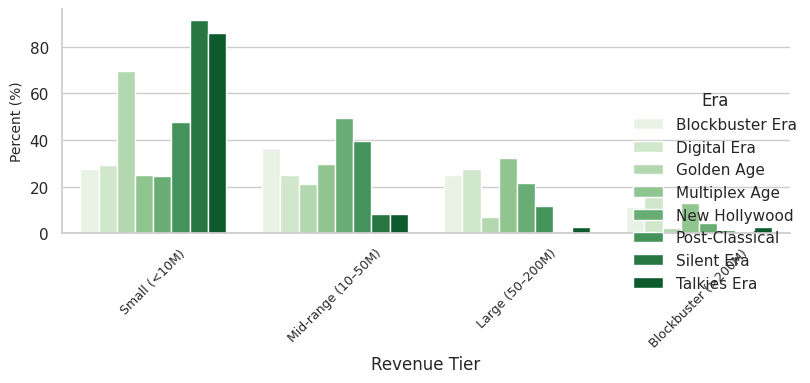

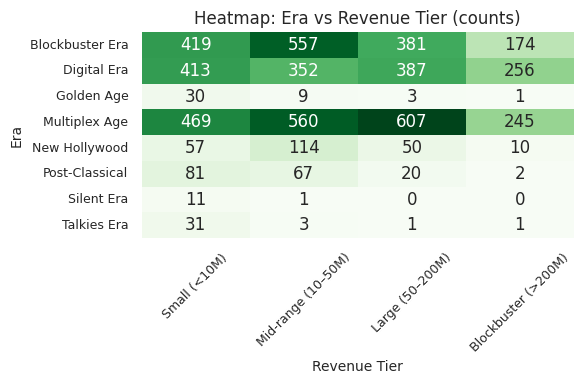

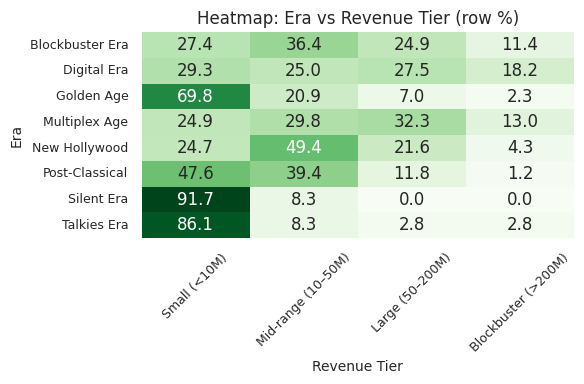


--- Profit Tier by Era (counts) ---
 Profit Tier      Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Era                                                                          
Blockbuster Era        509          242                359             297   
Digital Era            421          210                286             310   
Golden Age               2           31                  6               3   
Multiplex Age          596          284                416             428   
New Hollywood           25           64                 88              46   
Post‑Classical          20           87                 46              15   
Silent Era               1           10                  1               0   
Talkies Era              1           30                  3               1   

Profit Tier      Superhit (>200M)  
Era                                
Blockbuster Era               124  
Digital Era                   181  
Golden Age                      1  
M

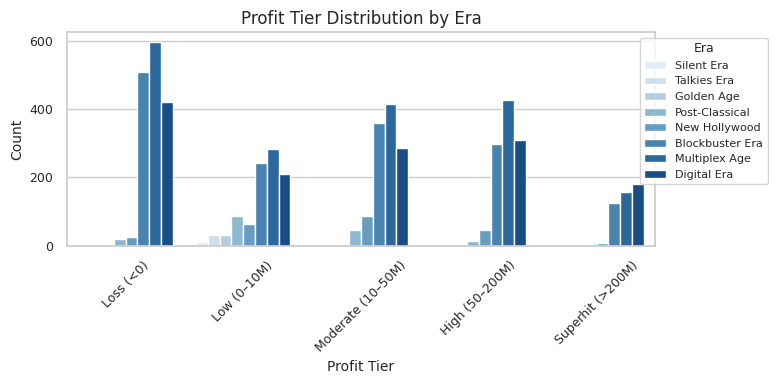

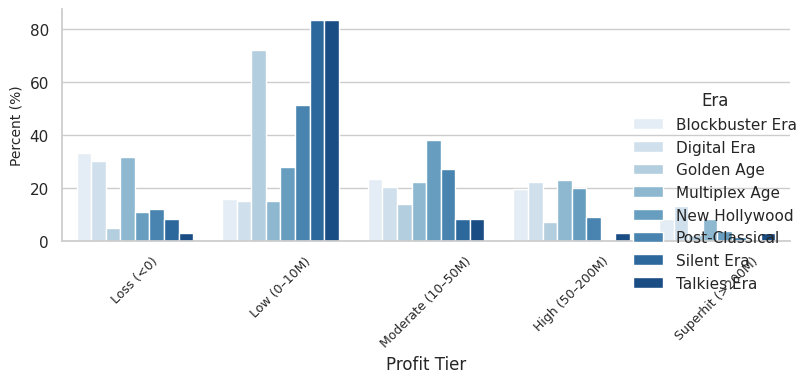

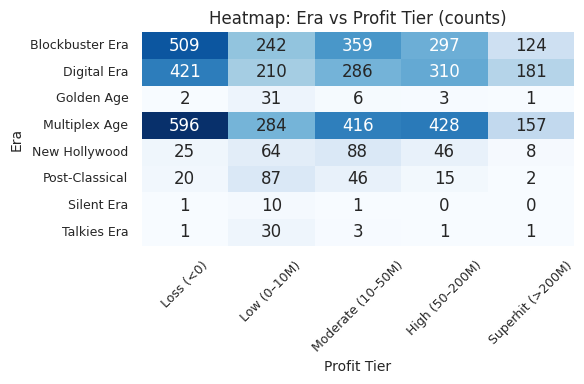

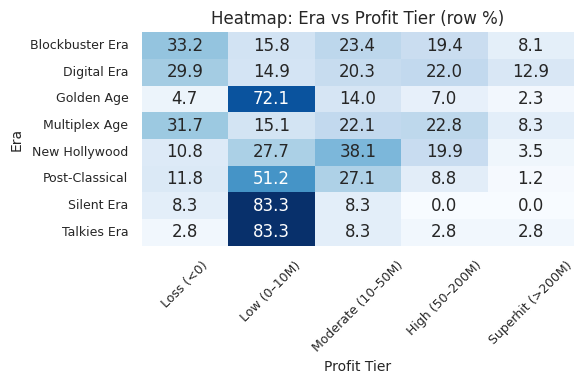


--- ROI Category by Era (counts) ---
 ROI Category     Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Era                                                                   
Blockbuster Era            509        263           228         268   
Digital Era                421        252           231         300   
Golden Age                   2          7             8          14   
Multiplex Age              596        422           285         369   
New Hollywood               25         37            14          47   
Post‑Classical              20         16            27          48   
Silent Era                   1          2             4           0   
Talkies Era                  1          8             6           8   

ROI Category     Exceptional (>5)  
Era                                
Blockbuster Era               263  
Digital Era                   204  
Golden Age                     12  
Multiplex Age                 209  
New Hollywood                 108 

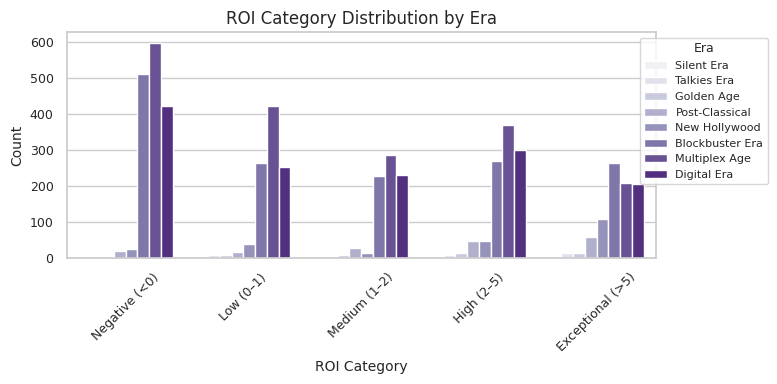

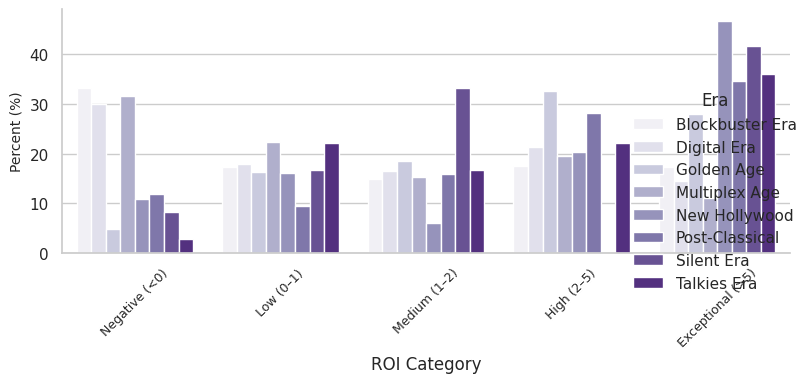

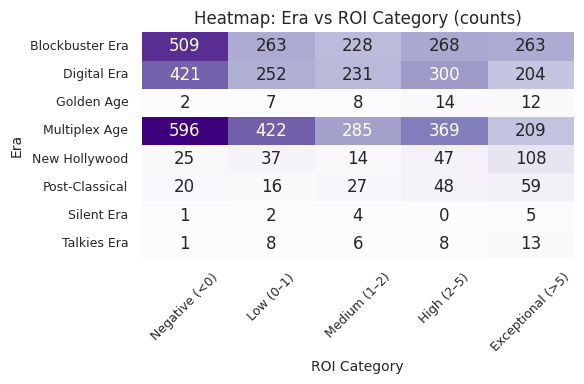

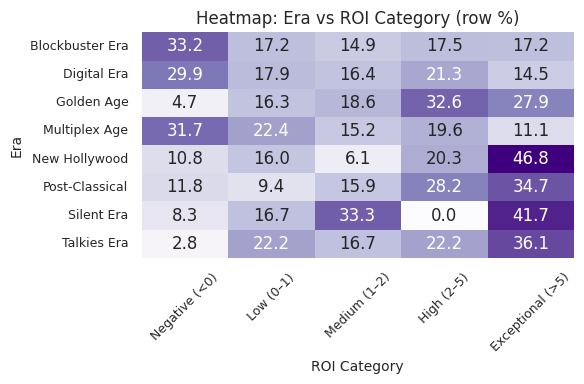

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 7 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 7.xlsx'
df = pd.read_excel(file_path)

# 2. Map Release Year → Film Era
def assign_era(year):
    if year <= 1927:
        return 'Silent Era'
    elif year <= 1939:
        return 'Talkies Era'
    elif year <= 1948:
        return 'Golden Age'
    elif year <= 1967:
        return 'Post‑Classical'
    elif year <= 1980:
        return 'New Hollywood'
    elif year <= 2000:
        return 'Blockbuster Era'
    elif year <= 2010:
        return 'Multiplex Age'
    else:
        return 'Digital Era'

df['Era'] = df['Release Year'].apply(assign_era)

# 3. Save updated DataFrame as Final 8
df.to_excel('/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx', index=False)

# 4. Filter eras with ≥5 films
era_counts = df['Era'].value_counts()
keep_eras = era_counts[era_counts >= 5].index.tolist()
df2 = df[df['Era'].isin(keep_eras)].copy()

print("=== Era Counts ===\n", era_counts, "\n")

# 5. Tier orders
rev_order  = ['Small (<10M)', 'Mid‑range (10–50M)', 'Large (50–200M)', 'Blockbuster (>200M)']
prof_order = ['Loss (<0)', 'Low (0–10M)', 'Moderate (10–50M)', 'High (50–200M)', 'Superhit (>200M)']
roi_order  = ['Negative (<0)', 'Low (0–1)', 'Medium (1–2)', 'High (2–5)', 'Exceptional (>5)']

sns.set_theme(style='whitegrid')

def era_vs_tier(tier, order, cmap_name):
    # counts crosstab
    ct = pd.crosstab(df2['Era'], df2[tier]).reindex(order, axis=1).fillna(0).astype(int)
    print(f"\n--- {tier} by Era (counts) ---\n", ct)
    # row % crosstab
    pct = ct.div(ct.sum(axis=1), axis=0).round(3) * 100
    print(f"\n--- {tier} by Era (row %) ---\n", pct)
    # count-based bar
    plt.figure(figsize=(8,4))
    sns.countplot(data=df2, x=tier, hue='Era', order=order, palette=cmap_name)
    plt.title(f'{tier} Distribution by Era', fontsize=12)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.xlabel(tier, fontsize=10)
    plt.ylabel('Count', fontsize=10)
    plt.legend(title='Era', fontsize=8, title_fontsize=9, loc='upper right', bbox_to_anchor=(1.2,1))
    plt.tight_layout()
    plt.show()
    # percent-based bar
    melt = pct.reset_index().melt(id_vars='Era', var_name=tier, value_name='Percent')
    g = sns.catplot(
        data=melt, kind='bar', x=tier, y='Percent', hue='Era',
        order=order, palette=cmap_name, height=4, aspect=1.6
    )
    g.set_titles(f'{tier} Distribution by Era (row %)', fontsize=12)
    g.set_xticklabels(rotation=45, fontsize=9)
    g.set_ylabels('Percent (%)', fontsize=10)
    plt.tight_layout()
    plt.show()
    # count heatmap
    plt.figure(figsize=(6,4))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap_name, cbar=False)
    plt.title(f'Heatmap: Era vs {tier} (counts)', fontsize=12)
    plt.xlabel(tier, fontsize=10)
    plt.ylabel('Era', fontsize=10)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()
    # percent heatmap
    plt.figure(figsize=(6,4))
    sns.heatmap(pct, annot=True, fmt='.1f', cmap=cmap_name, cbar=False)
    plt.title(f'Heatmap: Era vs {tier} (row %)', fontsize=12)
    plt.xlabel(tier, fontsize=10)
    plt.ylabel('Era', fontsize=10)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()

# 6. Run with color maps matching your studio analysis
era_vs_tier('Revenue Tier', rev_order,  'Greens')
era_vs_tier('Profit Tier',   prof_order, 'Blues')
era_vs_tier('ROI Category',  roi_order,  'Purples')


Mounted at /content/drive
=== Era Counts ===
Era
Multiplex Age      1881
Blockbuster Era    1531
Digital Era        1408
New Hollywood       231
Post‑Classical      170
Golden Age           43
Talkies Era          36
Silent Era           12
Name: count, dtype: int64 

=== Descriptive statistics by Era ===
               Era  Revenue_mean  Revenue_median   Profit_mean  Profit_median  \
0  Blockbuster Era  7.573085e+07      27400000.0  4.988636e+07     10800000.0   
1      Digital Era  1.278897e+08      40309160.5  8.784457e+07     16632979.5   
2       Golden Age  1.861263e+07       6000000.0  1.689546e+07      4531000.0   
3    Multiplex Age  9.891437e+07      39421467.0  6.074593e+07     12872796.0   
4    New Hollywood  5.162491e+07      24441725.0  4.411647e+07     17300000.0   
5   Post‑Classical  2.455187e+07      10875000.0  2.038333e+07      7570136.0   
6       Silent Era  4.550673e+06       1120818.5  3.780380e+06       572827.0   
7      Talkies Era  2.046436e+07       260500

<ipython-input-63-e33c14a33649>:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


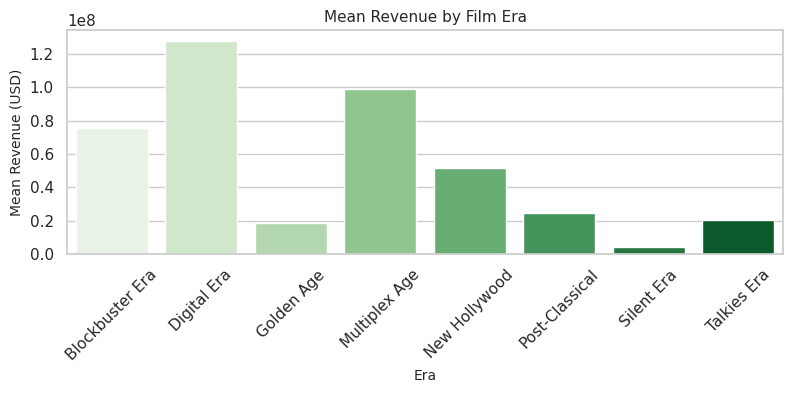

<ipython-input-63-e33c14a33649>:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


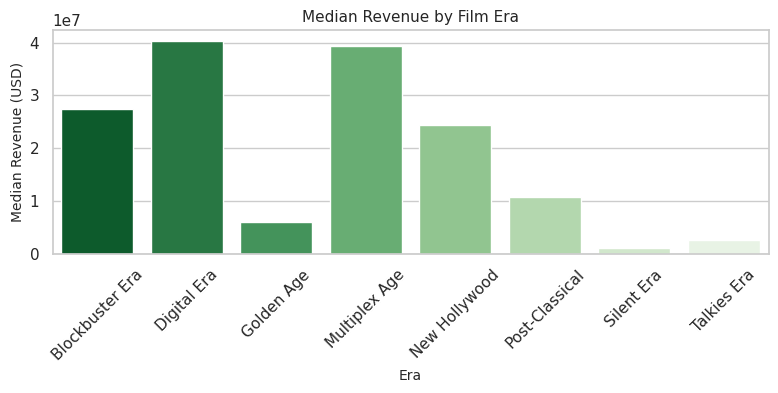

<ipython-input-63-e33c14a33649>:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


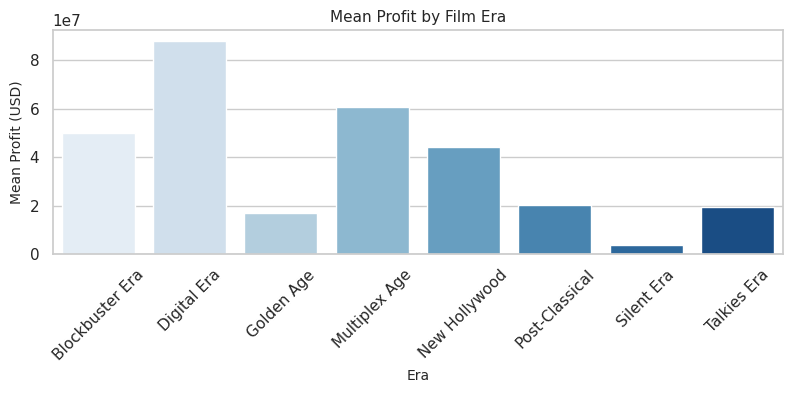

<ipython-input-63-e33c14a33649>:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


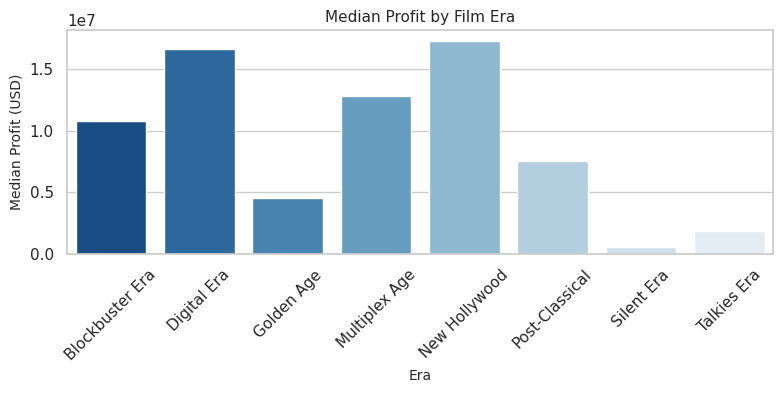

<ipython-input-63-e33c14a33649>:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


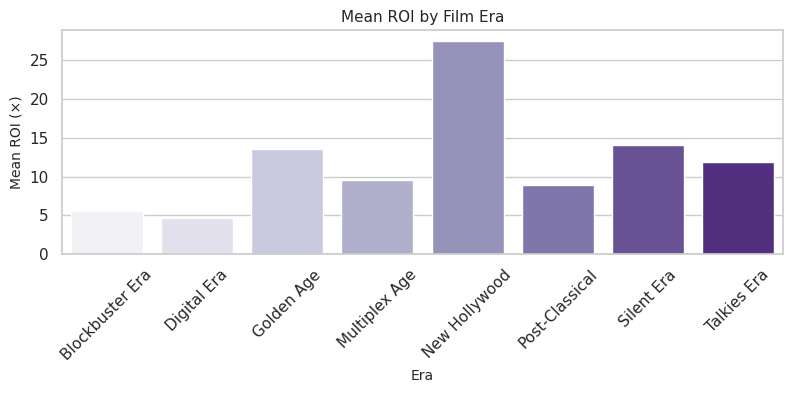

<ipython-input-63-e33c14a33649>:112: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


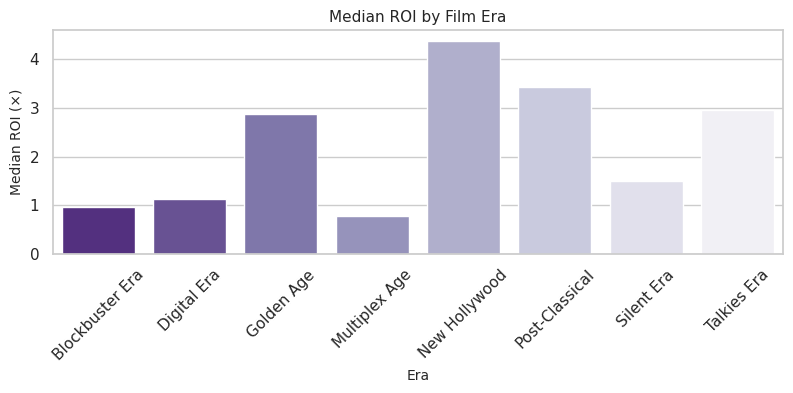

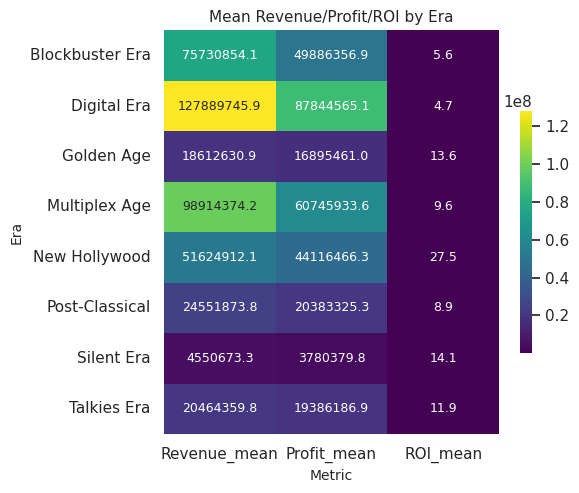

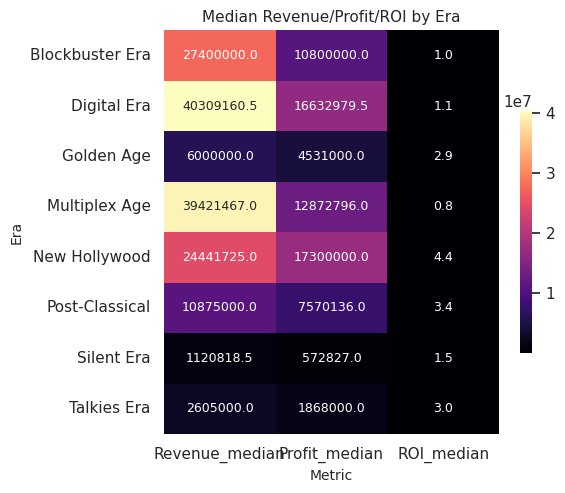

In [ ]:
# 0. (Re)mount Google Drive in Colab
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive')

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep only non‐null era bins
df2 = df[df['Era'].notna()].copy()

# 3. Drop bins with fewer than 5 films
era_counts = df2['Era'].value_counts()
keep = era_counts[era_counts >= 5].index.tolist()
df2 = df2[df2['Era'].isin(keep)]
print("=== Era Counts ===")
print(era_counts, "\n")

# 4. Aggregate descriptive stats for Revenue, Profit, ROI
stats = df2.groupby('Era').agg({
    'Revenue': ['mean','median'],
    'Profit':  ['mean','median'],
    'ROI':     ['mean','median']
})
# flatten MultiIndex
stats.columns = ['_'.join(col) for col in stats.columns]
stats = stats.reset_index()
print("=== Descriptive statistics by Era ===")
print(stats, "\n")

# 5. Plotting style
sns.set_theme(style='whitegrid')
plt.rcParams.update({'font.size': 9})

# A) Mean Revenue by Era
plt.figure(figsize=(8,4))
sns.barplot(
    data=stats,
    x='Era', y='Revenue_mean',
    palette='Greens'
)
plt.title('Mean Revenue by Film Era', fontsize=11)
plt.xlabel('Era', fontsize=10)
plt.ylabel('Mean Revenue (USD)', fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# B) Median Revenue by Era
plt.figure(figsize=(8,4))
sns.barplot(
    data=stats,
    x='Era', y='Revenue_median',
    palette='Greens_r'
)
plt.title('Median Revenue by Film Era', fontsize=11)
plt.xlabel('Era', fontsize=10)
plt.ylabel('Median Revenue (USD)', fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# C) Mean Profit by Era
plt.figure(figsize=(8,4))
sns.barplot(
    data=stats,
    x='Era', y='Profit_mean',
    palette='Blues'
)
plt.title('Mean Profit by Film Era', fontsize=11)
plt.xlabel('Era', fontsize=10)
plt.ylabel('Mean Profit (USD)', fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# D) Median Profit by Era
plt.figure(figsize=(8,4))
sns.barplot(
    data=stats,
    x='Era', y='Profit_median',
    palette='Blues_r'
)
plt.title('Median Profit by Film Era', fontsize=11)
plt.xlabel('Era', fontsize=10)
plt.ylabel('Median Profit (USD)', fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# E) Mean ROI by Era
plt.figure(figsize=(8,4))
sns.barplot(
    data=stats,
    x='Era', y='ROI_mean',
    palette='Purples'
)
plt.title('Mean ROI by Film Era', fontsize=11)
plt.xlabel('Era', fontsize=10)
plt.ylabel('Mean ROI (×)', fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# F) Median ROI by Era
plt.figure(figsize=(8,4))
sns.barplot(
    data=stats,
    x='Era', y='ROI_median',
    palette='Purples_r'
)
plt.title('Median ROI by Film Era', fontsize=11)
plt.xlabel('Era', fontsize=10)
plt.ylabel('Median ROI (×)', fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# G) Heatmap of mean metrics
hm = stats.set_index('Era')[['Revenue_mean','Profit_mean','ROI_mean']]
plt.figure(figsize=(6,5))
sns.heatmap(
    hm, annot=True, fmt='.1f',
    cmap='viridis', cbar_kws={'shrink':.6}
)
plt.title('Mean Revenue/Profit/ROI by Era', fontsize=11)
plt.xlabel('Metric', fontsize=10)
plt.ylabel('Era', fontsize=10)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# H) Heatmap of median metrics
hm2 = stats.set_index('Era')[['Revenue_median','Profit_median','ROI_median']]
plt.figure(figsize=(6,5))
sns.heatmap(
    hm2, annot=True, fmt='.1f',
    cmap='magma', cbar_kws={'shrink':.6}
)
plt.title('Median Revenue/Profit/ROI by Era', fontsize=11)
plt.xlabel('Metric', fontsize=10)
plt.ylabel('Era', fontsize=10)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



--- Revenue Tier by Season (counts) ---


Revenue Tier,Small (<10M),Mid‑range (10–50M),Large (50–200M),Blockbuster (>200M)
Season,,,,
Early Spring,172,196,183,60
Late Spring,189,171,123,118
Early Summer,143,174,174,164
Late Summer,182,220,224,65
Early Autumn,321,327,185,41
Late Autumn,171,187,175,99
Early Winter,161,202,229,105
Late Winter,172,186,156,37



--- Revenue Tier by Season (row %) ---


Revenue Tier,Small (<10M),Mid‑range (10–50M),Large (50–200M),Blockbuster (>200M)
Season,,,,
Early Spring,28.2,32.1,30.0,9.8
Late Spring,31.4,28.5,20.5,19.6
Early Summer,21.8,26.6,26.6,25.0
Late Summer,26.3,31.8,32.4,9.4
Early Autumn,36.7,37.4,21.2,4.7
Late Autumn,27.1,29.6,27.7,15.7
Early Winter,23.1,29.0,32.9,15.1
Late Winter,31.2,33.8,28.3,6.7


<Figure size 700x350 with 0 Axes>

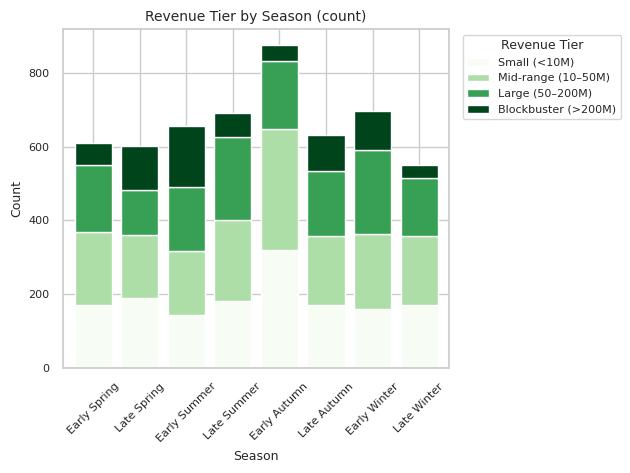

<Figure size 700x350 with 0 Axes>

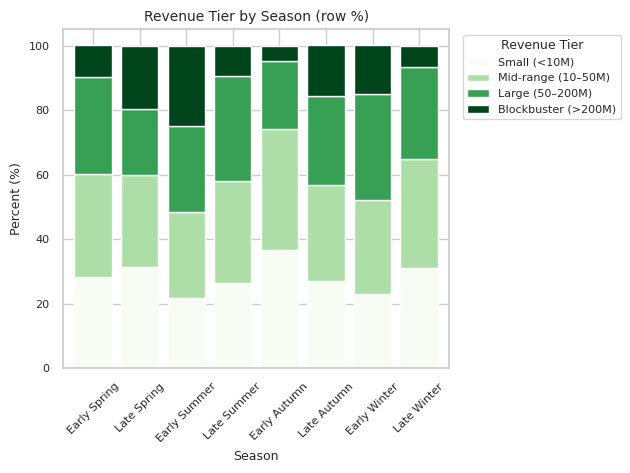

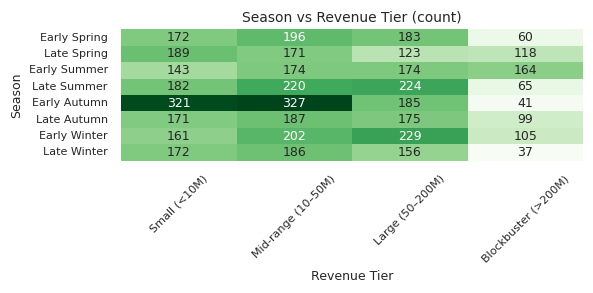

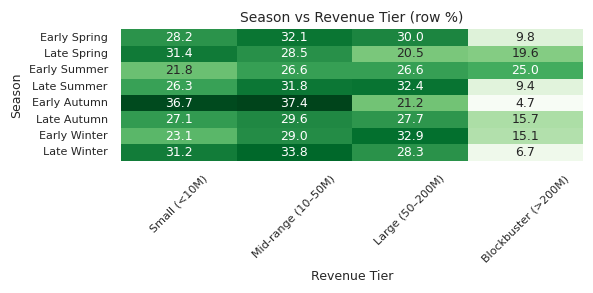


--- Profit Tier by Season (counts) ---


Profit Tier,Loss (<0),Low (0–10M),Moderate (10–50M),High (50–200M),Superhit (>200M)
Season,,,,,
Early Spring,183,112,148,122,46
Late Spring,171,114,123,99,94
Early Summer,134,103,140,170,108
Late Summer,184,134,181,149,43
Early Autumn,352,172,202,125,23
Late Autumn,197,99,124,141,71
Early Winter,174,116,161,180,66
Late Winter,180,108,126,114,23



--- Profit Tier by Season (row %) ---


Profit Tier,Loss (<0),Low (0–10M),Moderate (10–50M),High (50–200M),Superhit (>200M)
Season,,,,,
Early Spring,30.0,18.3,24.2,20.0,7.5
Late Spring,28.5,19.0,20.5,16.5,15.6
Early Summer,20.5,15.7,21.4,26.0,16.5
Late Summer,26.6,19.4,26.2,21.6,6.2
Early Autumn,40.3,19.7,23.1,14.3,2.6
Late Autumn,31.2,15.7,19.6,22.3,11.2
Early Winter,25.0,16.6,23.1,25.8,9.5
Late Winter,32.7,19.6,22.9,20.7,4.2


<Figure size 700x350 with 0 Axes>

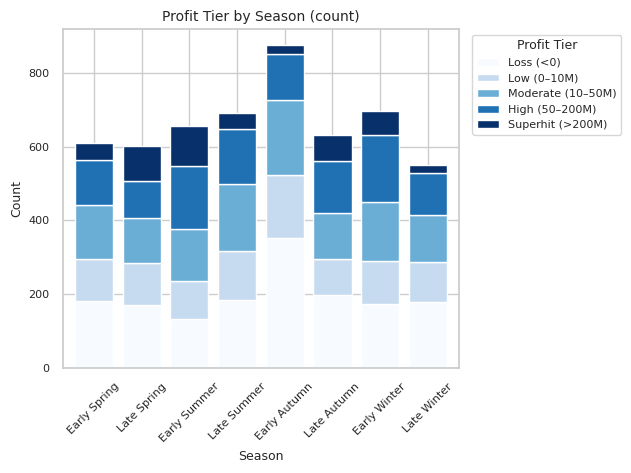

<Figure size 700x350 with 0 Axes>

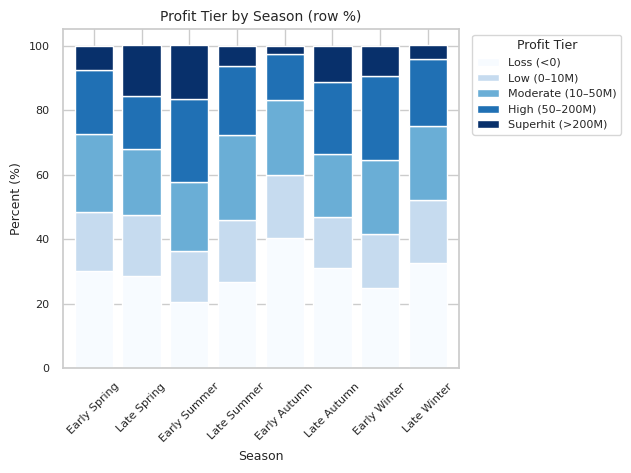

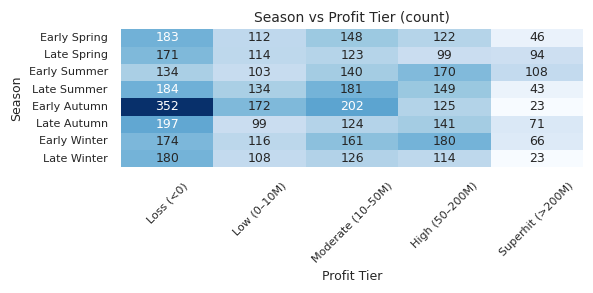

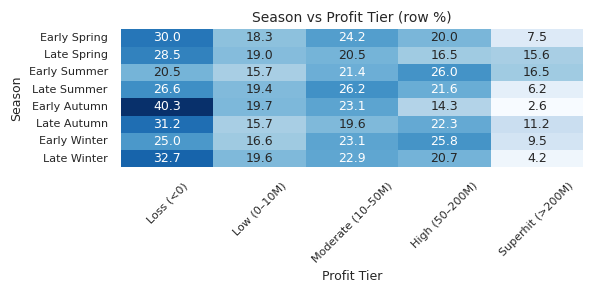


--- ROI Category by Season (counts) ---


ROI Category,Negative (<0),Low (0–1),Medium (1–2),High (2–5),Exceptional (>5)
Season,,,,,
Early Spring,183,128,95,118,87
Late Spring,171,113,95,128,94
Early Summer,134,110,117,159,135
Late Summer,184,145,105,141,116
Early Autumn,352,170,110,128,114
Late Autumn,197,108,95,120,112
Early Winter,174,138,107,150,128
Late Winter,180,95,79,110,87



--- ROI Category by Season (row %) ---


ROI Category,Negative (<0),Low (0–1),Medium (1–2),High (2–5),Exceptional (>5)
Season,,,,,
Early Spring,30.0,20.9,15.5,19.3,14.2
Late Spring,28.5,18.8,15.8,21.3,15.6
Early Summer,20.5,16.8,17.9,24.3,20.6
Late Summer,26.6,21.0,15.2,20.4,16.8
Early Autumn,40.3,19.5,12.6,14.6,13.0
Late Autumn,31.2,17.1,15.0,19.0,17.7
Early Winter,25.0,19.8,15.4,21.5,18.4
Late Winter,32.7,17.2,14.3,20.0,15.8


<Figure size 700x350 with 0 Axes>

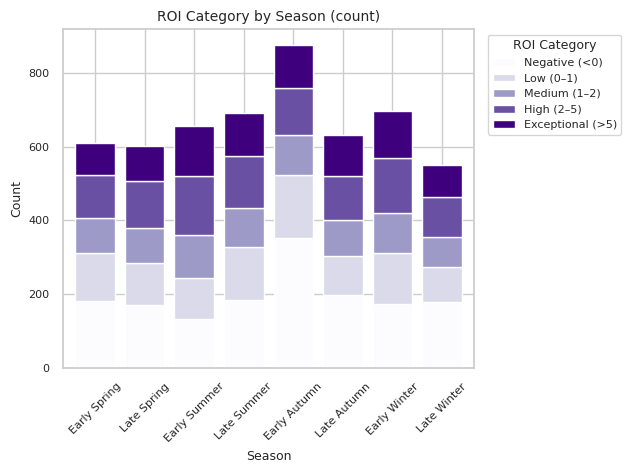

<Figure size 700x350 with 0 Axes>

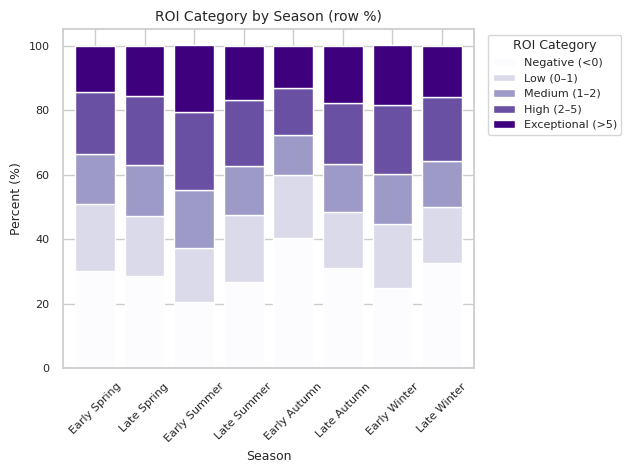

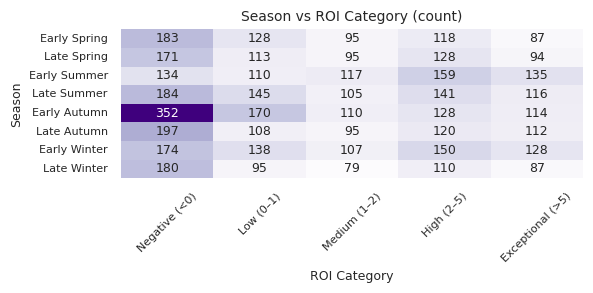

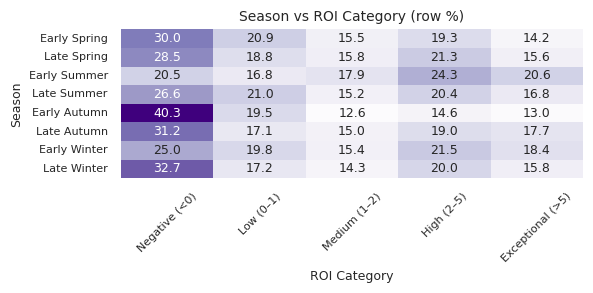

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep only rows where Season is non‑null
df = df[df['Season'].notna()]

# 3. Define the orders for plotting
season_order = [
    'Early Spring', 'Late Spring',
    'Early Summer', 'Late Summer',
    'Early Autumn', 'Late Autumn',
    'Early Winter', 'Late Winter'
]
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

# 4. Clean plotting defaults
sns.set_theme(style='whitegrid')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'legend.title_fontsize': 9
})

def season_vs_tier(tier, order, cmap):
    # a) Crosstab counts
    ct = pd.crosstab(df['Season'], df[tier]).reindex(season_order)[order].fillna(0).astype(int)
    print(f"\n--- {tier} by Season (counts) ---")
    display(ct)

    # b) Crosstab row‑percent
    pct = (ct.div(ct.sum(axis=1), axis=0) * 100).round(1)
    print(f"\n--- {tier} by Season (row %) ---")
    display(pct)

    # c) Count‑based stacked bar chart
    plt.figure(figsize=(7,3.5))
    ct.plot(
        kind='bar', stacked=True, colormap=cmap,
        width=0.8, legend=False
    )
    plt.title(f'{tier} by Season (count)')
    plt.xticks(rotation=45)
    plt.xlabel('Season')
    plt.ylabel('Count')
    plt.legend(title=tier, bbox_to_anchor=(1.02,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # d) Percent‑based stacked bar chart
    plt.figure(figsize=(7,3.5))
    pct.plot(
        kind='bar', stacked=True, colormap=cmap,
        width=0.8, legend=False
    )
    plt.title(f'{tier} by Season (row %)')
    plt.xticks(rotation=45)
    plt.xlabel('Season')
    plt.ylabel('Percent (%)')
    plt.legend(title=tier, bbox_to_anchor=(1.02,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # e) Count‑based heatmap
    plt.figure(figsize=(6,3))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap, cbar=False)
    plt.title(f'Season vs {tier} (count)')
    plt.xlabel(tier)
    plt.ylabel('Season')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # f) Percent‑based heatmap
    plt.figure(figsize=(6,3))
    sns.heatmap(pct, annot=True, fmt='.1f', cmap=cmap, cbar=False)
    plt.title(f'Season vs {tier} (row %)')
    plt.xlabel(tier)
    plt.ylabel('Season')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 5. Run analyses
season_vs_tier('Revenue Tier', rev_order, cmap='Greens')
season_vs_tier('Profit Tier', prof_order, cmap='Blues')
season_vs_tier('ROI Category', roi_order, cmap='Purples')


=== Descriptive statistics by Season ===
             Revenue                                         Profit  \
               count          mean      median           std  count   
Season                                                                
Early Spring     611  8.835263e+07  30987695.0  1.725843e+08    611   
Late Spring      601  1.289807e+08  25037897.0  2.276984e+08    601   
Early Summer     655  1.482016e+08  59217789.0  2.194792e+08    655   
Late Summer      691  7.603451e+07  32556119.0  1.174971e+08    691   
Early Autumn     874  4.698651e+07  17746837.5  7.823484e+07    874   
Late Autumn      632  1.122676e+08  36855808.5  2.009666e+08    632   
Early Winter     697  1.031636e+08  44907260.0  1.885472e+08    697   
Late Winter      551  6.302070e+07  26559557.0  1.040553e+08    551   

                                                       ROI             \
                      mean      median           std count       mean   
Season                         

<ipython-input-66-cce0831618cb>:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


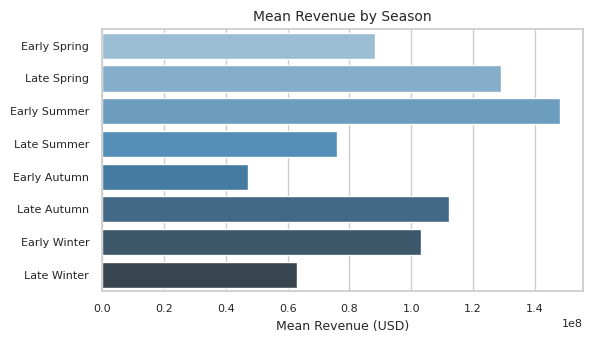

<ipython-input-66-cce0831618cb>:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


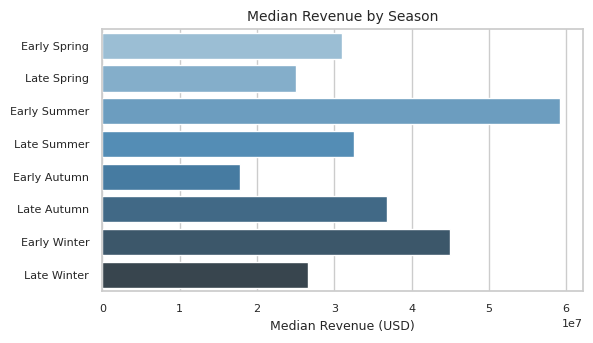

<ipython-input-66-cce0831618cb>:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


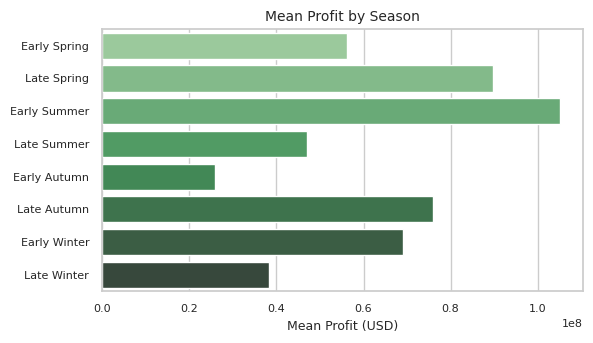

<ipython-input-66-cce0831618cb>:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


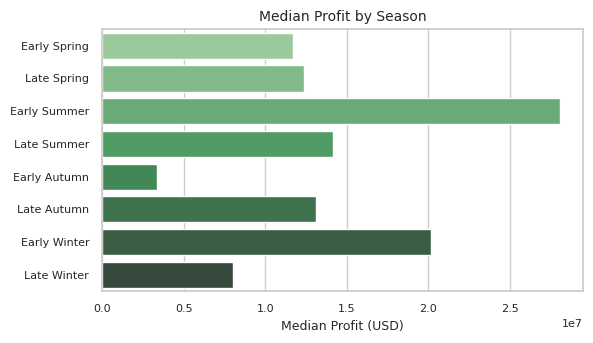

<ipython-input-66-cce0831618cb>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


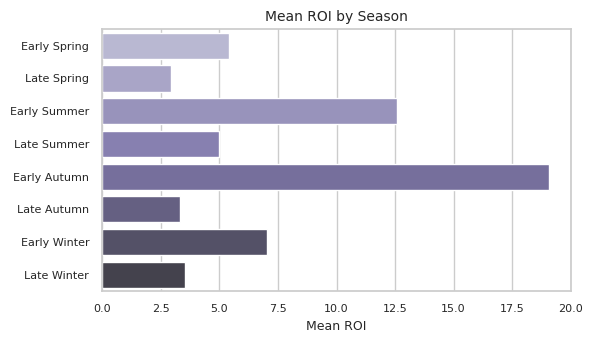

<ipython-input-66-cce0831618cb>:106: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


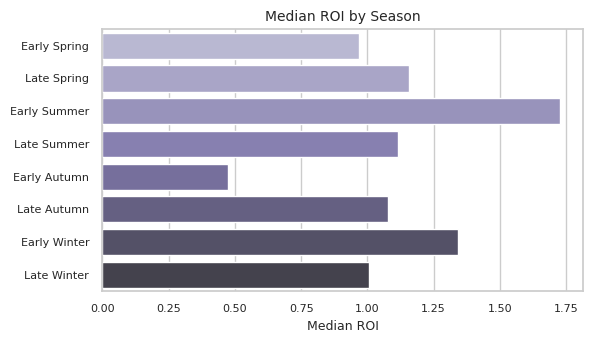

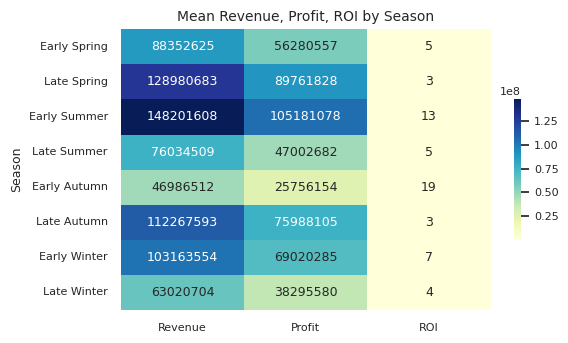

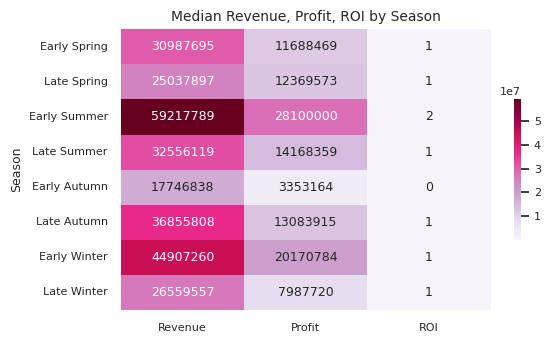

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep only rows with a Season
df = df[df['Season'].notna()]

# 3. Define season order
season_order = [
    'Early Spring', 'Late Spring',
    'Early Summer', 'Late Summer',
    'Early Autumn', 'Late Autumn',
    'Early Winter', 'Late Winter'
]

# 4. Compute descriptive stats
stats = (
    df
    .groupby('Season')[['Revenue','Profit','ROI']]
    .agg(['count','mean','median','std'])
    .loc[season_order]
)
print("=== Descriptive statistics by Season ===")
print(stats)

# 5. Set plotting style & smaller fonts
sns.set_theme(style='whitegrid')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8
})

# 6. Melt stats for plotting
mean_df = stats.xs('mean', axis=1, level=1).reset_index()
med_df  = stats.xs('median', axis=1, level=1).reset_index()

# A) Bar plot: Mean Revenue by Season
plt.figure(figsize=(6,3.5))
sns.barplot(
    data=mean_df, y='Season', x='Revenue',
    order=season_order, palette='Blues_d'
)
plt.title('Mean Revenue by Season')
plt.xlabel('Mean Revenue (USD)')
plt.ylabel('')
plt.tight_layout()
plt.show()

# B) Bar plot: Median Revenue by Season
plt.figure(figsize=(6,3.5))
sns.barplot(
    data=med_df, y='Season', x='Revenue',
    order=season_order, palette='Blues_d'
)
plt.title('Median Revenue by Season')
plt.xlabel('Median Revenue (USD)')
plt.ylabel('')
plt.tight_layout()
plt.show()

# C) Bar plot: Mean Profit by Season
plt.figure(figsize=(6,3.5))
sns.barplot(
    data=mean_df, y='Season', x='Profit',
    order=season_order, palette='Greens_d'
)
plt.title('Mean Profit by Season')
plt.xlabel('Mean Profit (USD)')
plt.ylabel('')
plt.tight_layout()
plt.show()

# D) Bar plot: Median Profit by Season
plt.figure(figsize=(6,3.5))
sns.barplot(
    data=med_df, y='Season', x='Profit',
    order=season_order, palette='Greens_d'
)
plt.title('Median Profit by Season')
plt.xlabel('Median Profit (USD)')
plt.ylabel('')
plt.tight_layout()
plt.show()

# E) Bar plot: Mean ROI by Season
plt.figure(figsize=(6,3.5))
sns.barplot(
    data=mean_df, y='Season', x='ROI',
    order=season_order, palette='Purples_d'
)
plt.title('Mean ROI by Season')
plt.xlabel('Mean ROI')
plt.ylabel('')
plt.tight_layout()
plt.show()

# F) Bar plot: Median ROI by Season
plt.figure(figsize=(6,3.5))
sns.barplot(
    data=med_df, y='Season', x='ROI',
    order=season_order, palette='Purples_d'
)
plt.title('Median ROI by Season')
plt.xlabel('Median ROI')
plt.ylabel('')
plt.tight_layout()
plt.show()

# G) Heatmap of means
mean_matrix = mean_df.set_index('Season').loc[season_order]
plt.figure(figsize=(6,3.5))
sns.heatmap(
    mean_matrix, annot=True, fmt='.0f',
    cmap='YlGnBu', cbar_kws={'shrink':0.5}
)
plt.title('Mean Revenue, Profit, ROI by Season')
plt.tight_layout()
plt.show()

# H) Heatmap of medians
med_matrix = med_df.set_index('Season').loc[season_order]
plt.figure(figsize=(6,3.5))
sns.heatmap(
    med_matrix, annot=True, fmt='.0f',
    cmap='PuRd', cbar_kws={'shrink':0.5}
)
plt.title('Median Revenue, Profit, ROI by Season')
plt.tight_layout()
plt.show()



--- Revenue Tier by Holiday (counts) ---
Revenue Tier          Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Holidays                                                                  
Canada Day                      43                  71               49   
Christmas/New Year’s           109                 160              187   
Good Friday                     64                  91               58   
Labour Day                      88                  85               50   
Thanksgiving                    79                  95               65   
Victoria Day                    75                  53               31   

Revenue Tier          Blockbuster (>200M)  
Holidays                                   
Canada Day                             79  
Christmas/New Year’s                  103  
Good Friday                            18  
Labour Day                              2  
Thanksgiving                           12  
Victoria Day                           51  

--- 

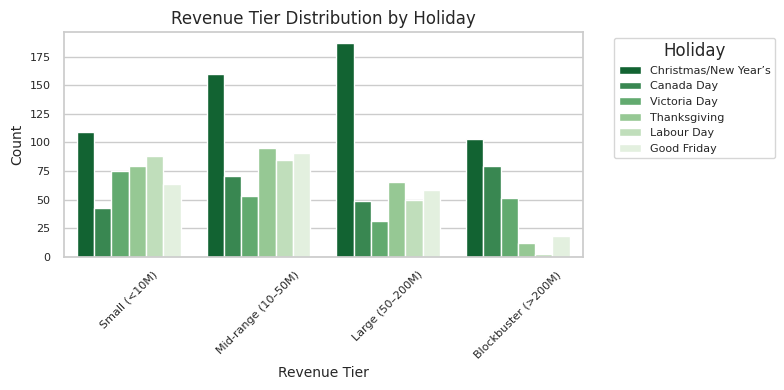

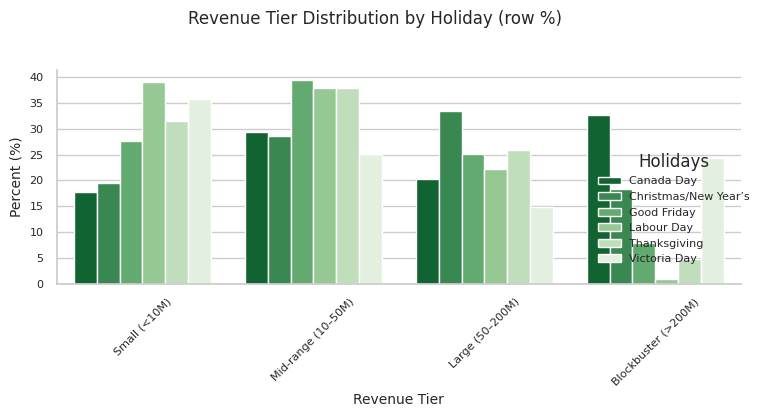

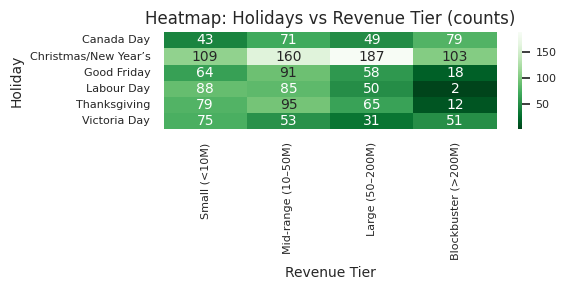

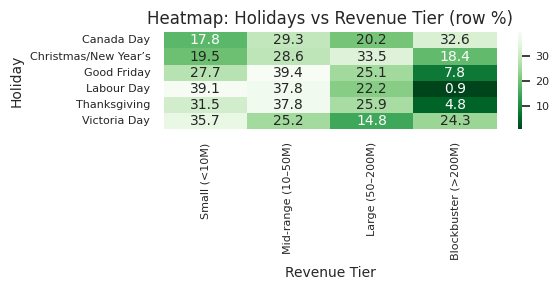


--- Profit Tier by Holiday (counts) ---
Profit Tier           Loss (<0)  Low (0–10M)  Moderate (10–50M)  \
Holidays                                                          
Canada Day                   40           38                 52   
Christmas/New Year’s        127           86                127   
Good Friday                  77           43                 54   
Labour Day                   88           58                 51   
Thanksgiving                 85           45                 76   
Victoria Day                 66           39                 31   

Profit Tier           High (50–200M)  Superhit (>200M)  
Holidays                                                
Canada Day                        62                50  
Christmas/New Year’s             154                65  
Good Friday                       43                14  
Labour Day                        26                 2  
Thanksgiving                      39                 6  
Victoria Day           

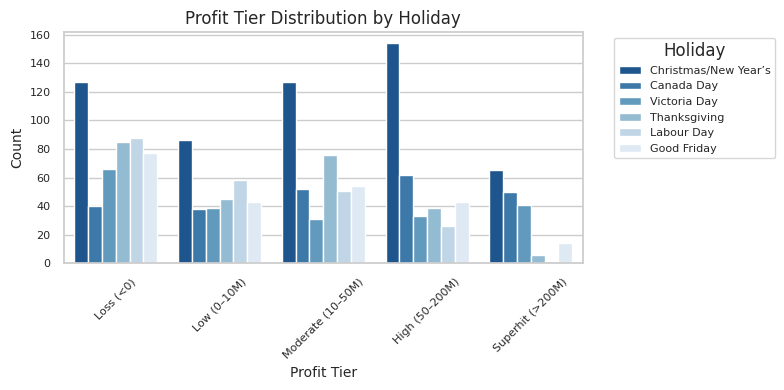

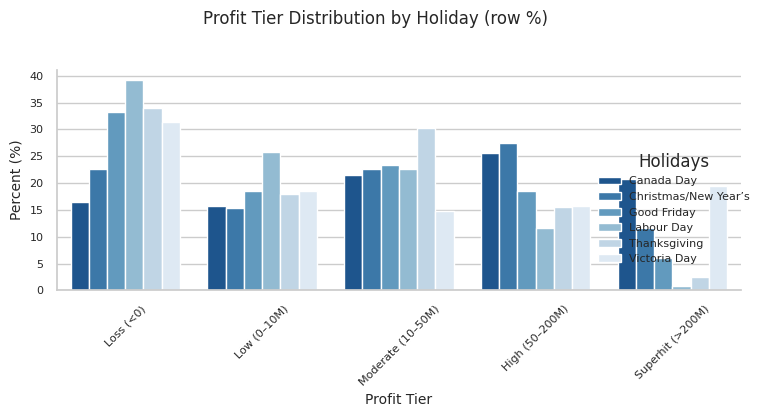

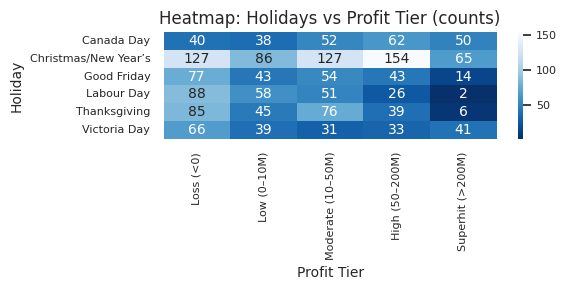

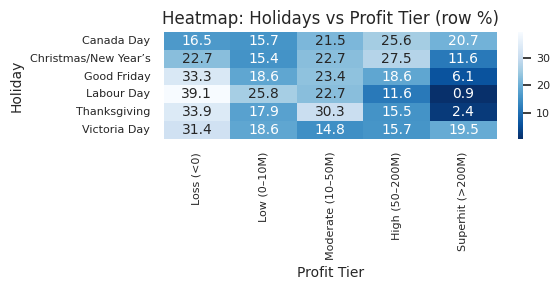


--- ROI Category by Holiday (counts) ---
ROI Category          Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Holidays                                                                   
Canada Day                       40         38            51          71   
Christmas/New Year’s            127        105            90         129   
Good Friday                      77         46            35          43   
Labour Day                       88         52            27          27   
Thanksgiving                     85         45            34          50   
Victoria Day                     66         41            32          39   

ROI Category          Exceptional (>5)  
Holidays                                
Canada Day                          42  
Christmas/New Year’s               108  
Good Friday                         30  
Labour Day                          31  
Thanksgiving                        37  
Victoria Day                        32  

--- ROI Category by 

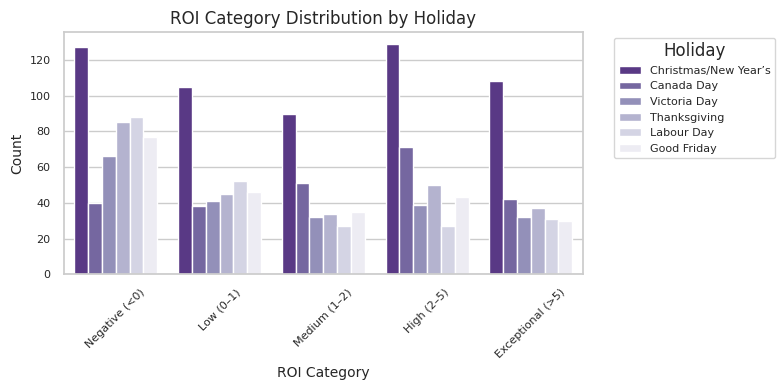

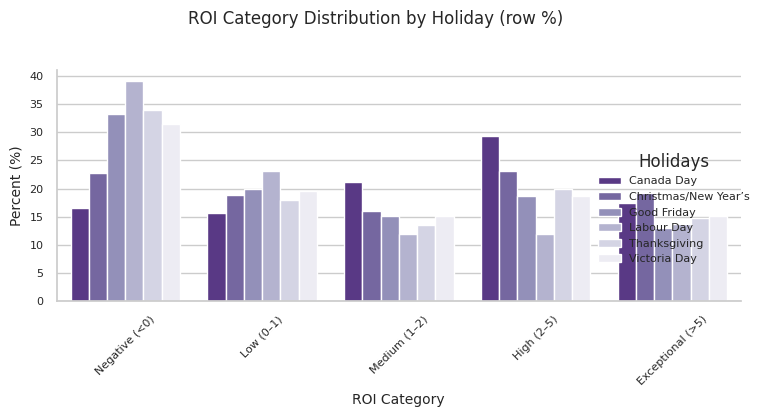

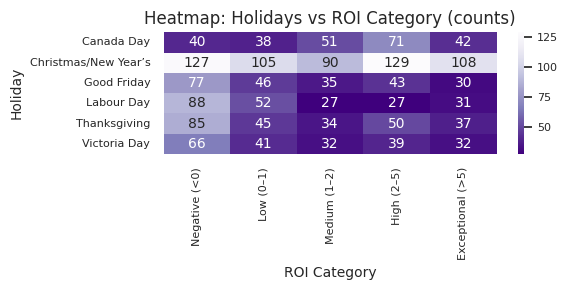

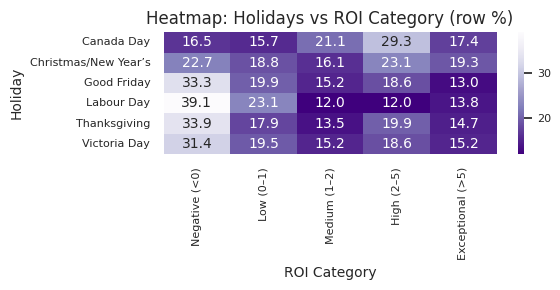

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep only rows with a holiday window
df_h = df[df['Holidays'].notna()]

# 3. Styling
sns.set_theme(style='whitegrid')
plt.rc('axes', titlesize=12, labelsize=10)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)
plt.rc('legend', fontsize=8)
plt.rc('font', size=10)

# 4. Tier orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

def holiday_vs_tier(tier, order, cmap):
    # a) Crosstab counts
    ct = pd.crosstab(df_h['Holidays'], df_h[tier]).reindex(columns=order, fill_value=0)
    print(f"\n--- {tier} by Holiday (counts) ---")
    print(ct)

    # b) Crosstab row-%
    ct_pct = (ct.div(ct.sum(axis=1), axis=0) * 100).round(1)
    print(f"\n--- {tier} by Holiday (row %) ---")
    print(ct_pct)

    # c) Count‑based bar chart
    plt.figure(figsize=(8,4))
    sns.countplot(
        data=df_h, x=tier, hue='Holidays',
        order=order, palette=cmap
    )
    plt.title(f'{tier} Distribution by Holiday')
    plt.xticks(rotation=45)
    plt.xlabel(tier)
    plt.ylabel('Count')
    plt.legend(title='Holiday', bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # d) Percent‑based bar chart
    dfp = ct_pct.reset_index().melt(
        id_vars='Holidays', var_name=tier, value_name='Percent'
    )
    g = sns.catplot(
        data=dfp, x=tier, y='Percent', hue='Holidays', kind='bar',
        order=order, height=4, aspect=1.5, palette=cmap
    )
    g.set_xticklabels(rotation=45)
    g.set_axis_labels(tier, 'Percent (%)')
    g.fig.suptitle(f'{tier} Distribution by Holiday (row %)', y=1.03)
    plt.tight_layout()
    plt.show()

    # e) Count‑based heatmap
    plt.figure(figsize=(6,3))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap)
    plt.title(f'Heatmap: Holidays vs {tier} (counts)')
    plt.xlabel(tier)
    plt.ylabel('Holiday')
    plt.tight_layout()
    plt.show()

    # f) Percent‑based heatmap
    plt.figure(figsize=(6,3))
    sns.heatmap(ct_pct, annot=True, fmt='.1f', cmap=cmap)
    plt.title(f'Heatmap: Holidays vs {tier} (row %)')
    plt.xlabel(tier)
    plt.ylabel('Holiday')
    plt.tight_layout()
    plt.show()

# 5. Run for each tier
holiday_vs_tier('Revenue Tier', rev_order,  'Greens_r')
holiday_vs_tier('Profit Tier',  prof_order, 'Blues_r')
holiday_vs_tier('ROI Category', roi_order,  'Purples_r')



=== Revenue Tier by Month (counts) ===
Revenue Tier  Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
MonthName                                                         
Jan                    122                 114               89   
Feb                    102                 114              109   
Mar                    115                 122              123   
Apr                    114                 130              114   
May                    132                 115               69   
Jun                     98                 125              112   
Jul                     87                 110              155   
Aug                    140                 159              131   
Sep                    245                 222              118   
Oct                    145                 175              135   
Nov                    102                 117              107   
Dec                    109                 160              187   

Revenue Tier  Blockbu

<Figure size 900x400 with 0 Axes>

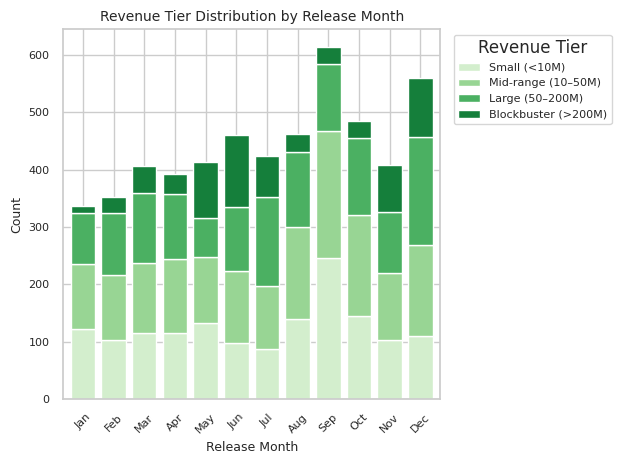

<Figure size 900x400 with 0 Axes>

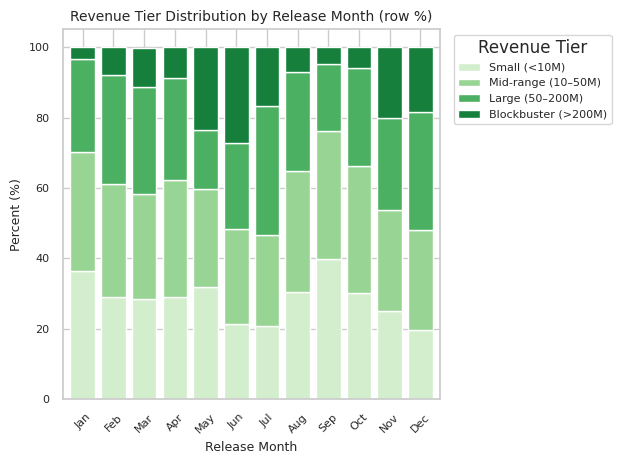

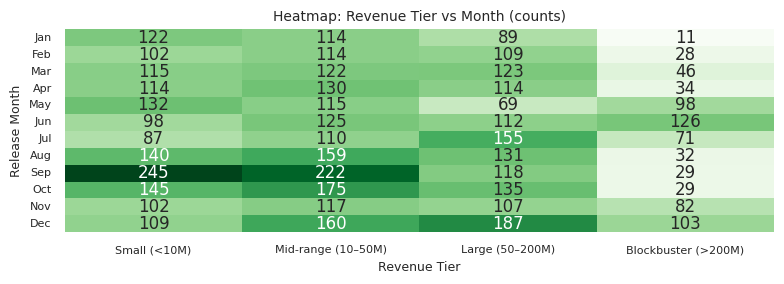

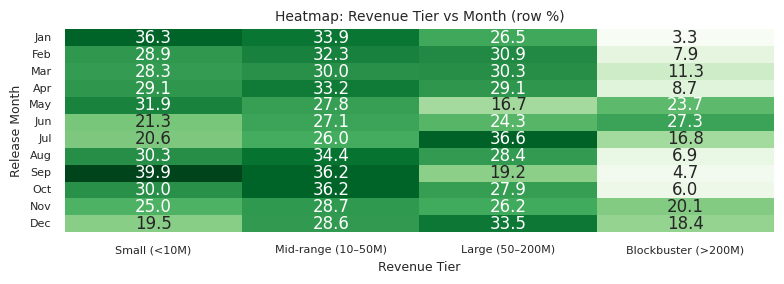


=== Profit Tier by Month (counts) ===
Profit Tier  Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
MonthName                                                                
Jan                113           74                 82              62   
Feb                114           64                 78              78   
Mar                123           69                 96              81   
Apr                120           77                 96              71   
May                111           80                 79              69   
Jun                 93           70                102             118   
Jul                 85           72                 99             113   
Aug                140           95                120              88   
Sep                261          126                125              85   
Oct                169           88                117              90   
Nov                119           57                 84              91   

<Figure size 900x400 with 0 Axes>

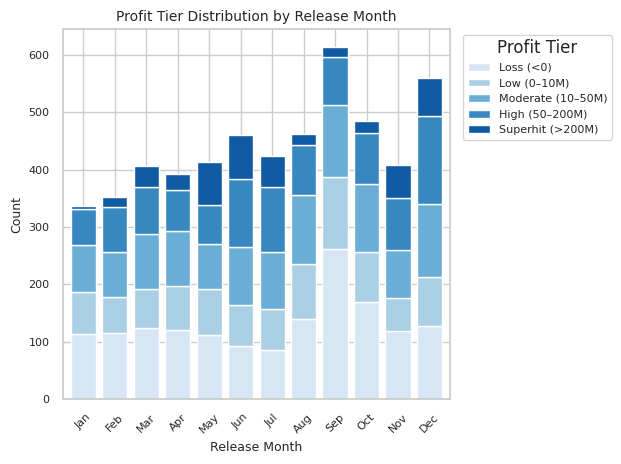

<Figure size 900x400 with 0 Axes>

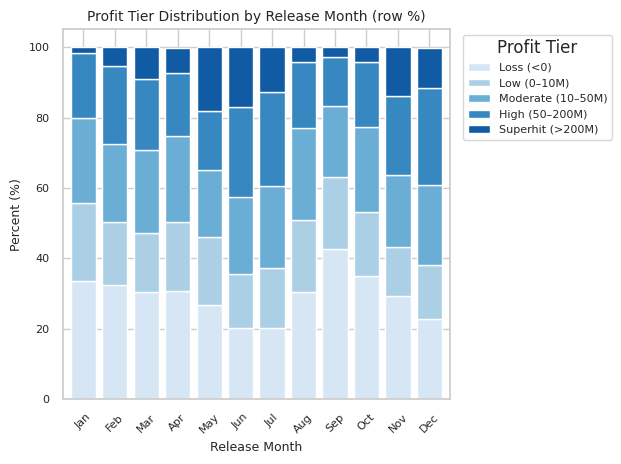

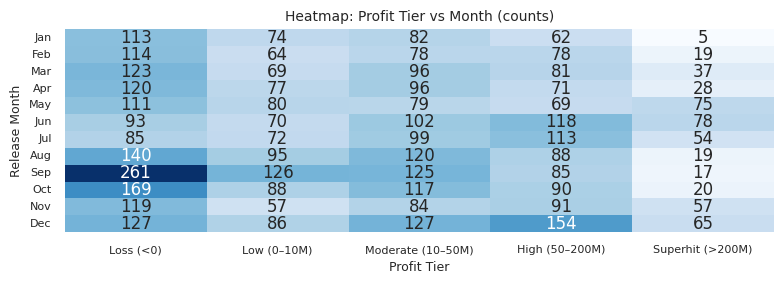

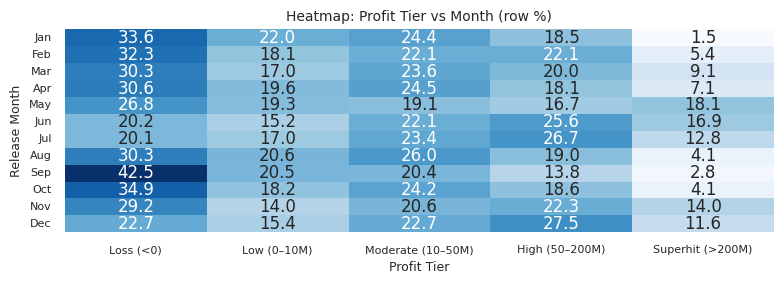


=== ROI Category by Month (counts) ===
ROI Category  Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
MonthName                                                          
Jan                     113         61            51          60   
Feb                     114         67            45          71   
Mar                     123         83            61          82   
Apr                     120         80            61          76   
May                     111         78            68          88   
Jun                      93         76            84         117   
Jul                      85         88            66          95   
Aug                     140         91            72          88   
Sep                     261        125            68          81   
Oct                     169         85            69          84   
Nov                     119         68            68          83   
Dec                     127        105            90         129   

ROI Cat

<Figure size 900x400 with 0 Axes>

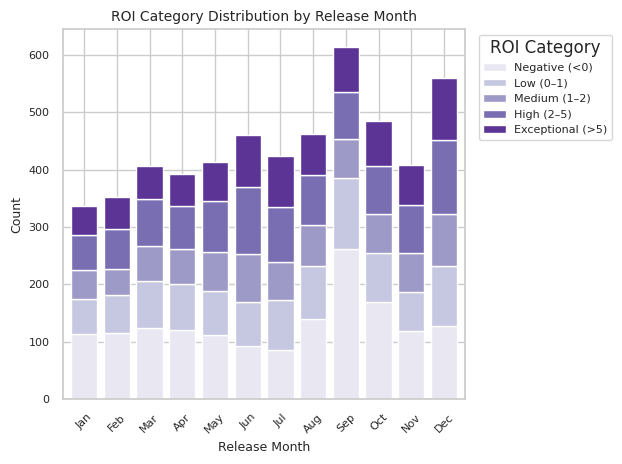

<Figure size 900x400 with 0 Axes>

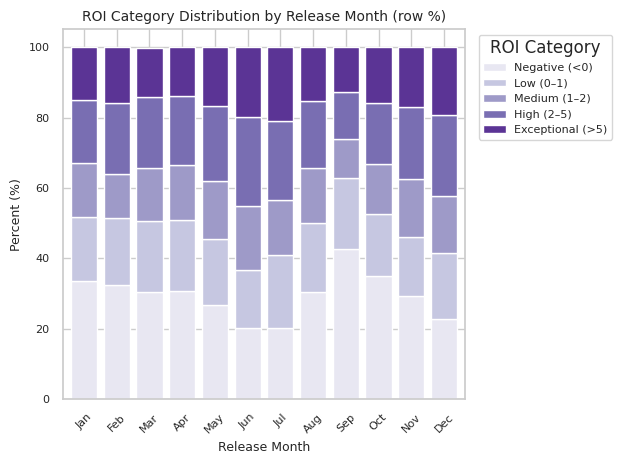

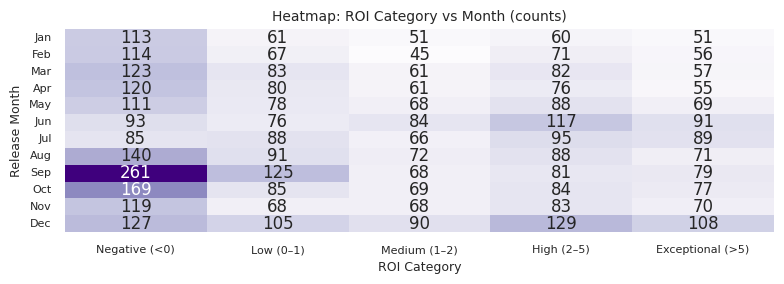

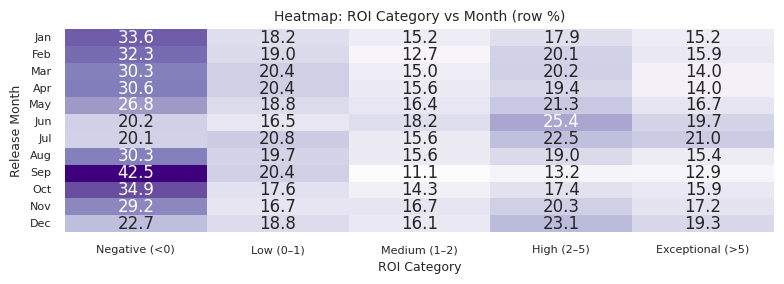

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Drop rows missing Release Month and map month numbers to names
df = df.dropna(subset=['Release Month'])
month_map = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr',
    5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug',
    9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}
df['MonthName'] = df['Release Month'].astype(int).map(month_map)

# 3. Define orders for plotting
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

# 4. Set subtle style
sns.set_theme(style='whitegrid')
plt.rc('axes', titlesize=10, labelsize=9)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)
plt.rc('legend', fontsize=8)

# 5. Analysis function
def month_vs_tier(tier, order, cmap_name):
    # Crosstabs
    ct_counts = pd.crosstab(df['MonthName'], df[tier]).reindex(index=months, columns=order, fill_value=0)
    ct_pct    = ct_counts.div(ct_counts.sum(axis=1), axis=0).round(3) * 100

    # Print tables for insights
    print(f"\n=== {tier} by Month (counts) ===")
    print(ct_counts)
    print(f"\n=== {tier} by Month (row %) ===")
    print(ct_pct)

    # Colors
    cmap = sns.color_palette(cmap_name, len(order))

    # A) Count‑based stacked bar
    plt.figure(figsize=(9,4))
    ct_counts.plot(
        kind='bar',
        stacked=True,
        color=cmap,
        width=0.8,
        legend=True
    )
    plt.title(f'{tier} Distribution by Release Month')
    plt.xlabel('Release Month')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title=tier, bbox_to_anchor=(1.02,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # B) Percent‑based stacked bar
    plt.figure(figsize=(9,4))
    ct_pct.plot(
        kind='bar',
        stacked=True,
        color=cmap,
        width=0.8
    )
    plt.title(f'{tier} Distribution by Release Month (row %)')
    plt.xlabel('Release Month')
    plt.ylabel('Percent (%)')
    plt.xticks(rotation=45)
    plt.legend(title=tier, bbox_to_anchor=(1.02,1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # C) Heatmap counts
    plt.figure(figsize=(8,3))
    sns.heatmap(ct_counts, annot=True, fmt='d', cmap=cmap_name, cbar=False)
    plt.title(f'Heatmap: {tier} vs Month (counts)')
    plt.xlabel(tier)
    plt.ylabel('Release Month')
    plt.tight_layout()
    plt.show()

    # D) Heatmap % row
    plt.figure(figsize=(8,3))
    sns.heatmap(ct_pct, annot=True, fmt='.1f', cmap=cmap_name, cbar=False)
    plt.title(f'Heatmap: {tier} vs Month (row %)')
    plt.xlabel(tier)
    plt.ylabel('Release Month')
    plt.tight_layout()
    plt.show()

# 6. Run for each tier
month_vs_tier('Revenue Tier', rev_order, cmap_name='Greens')
month_vs_tier('Profit Tier', prof_order, cmap_name='Blues')
month_vs_tier('ROI Category', roi_order, cmap_name='Purples')


=== Descriptive Statistics by Release Month ===
       Revenue_count  Revenue_mean  Revenue_median   Revenue_std  \
Month                                                              
Jan              336  4.470510e+07      20579190.0  6.465821e+07   
Feb              353  7.238321e+07      31609243.0  1.176429e+08   
Mar              406  9.315660e+07      33793403.0  1.688525e+08   
Apr              392  9.303281e+07      28641383.5  2.156183e+08   
May              414  1.381894e+08      24903681.5  2.172785e+08   
Jun              461  1.562450e+08      61947267.0  2.300002e+08   
Jul              423  1.182552e+08      58853106.0  1.718190e+08   
Aug              462  5.965586e+07      24922237.0  9.084949e+07   
Sep              614  4.536263e+07      16061925.5  7.790245e+07   
Oct              484  6.526805e+07      23796209.0  1.227408e+08   
Nov              408  1.288651e+08      43278503.0  2.195925e+08   
Dec              559  1.181703e+08      53977250.0  2.061124e+08   


<ipython-input-69-e402b9bb082b>:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


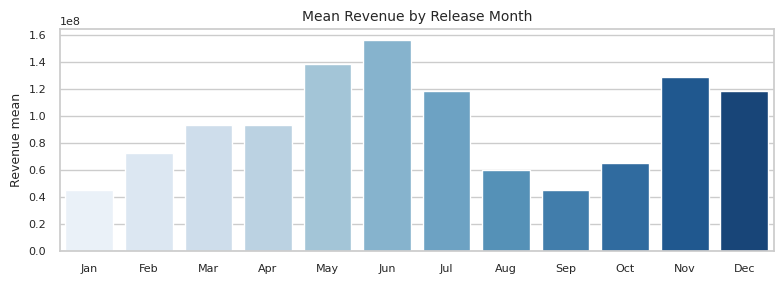

<ipython-input-69-e402b9bb082b>:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


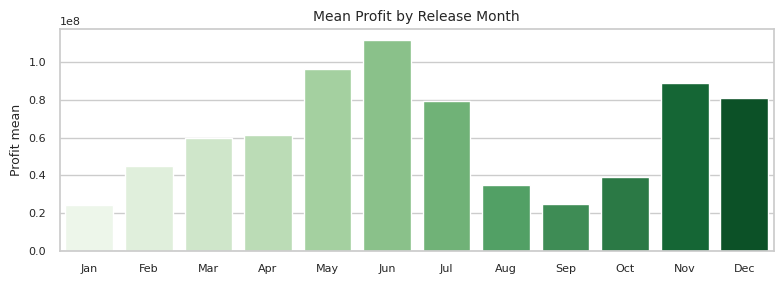

<ipython-input-69-e402b9bb082b>:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


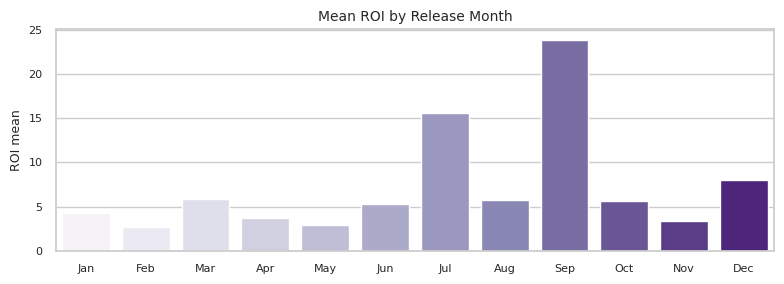

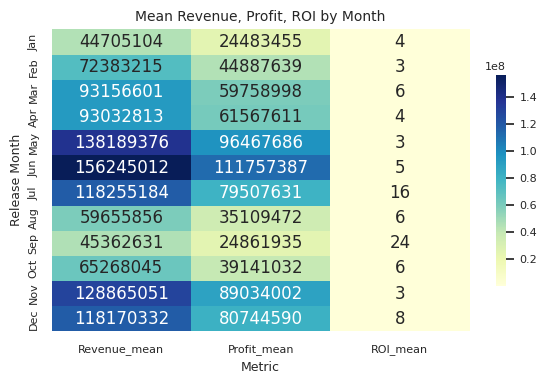

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep only rows with a Release Month
df = df.dropna(subset=['Release Month'])

# 3. Map month numbers to names
month_map = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr',
    5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug',
    9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}
df['Month'] = df['Release Month'].astype(int).map(month_map)

# 4. Define month order
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

# 5. Compute descriptive statistics
stats = (
    df.groupby('Month')[['Revenue', 'Profit', 'ROI']]
      .agg(['count','mean','median','std'])
      .reindex(months)
)
# Flatten column MultiIndex
stats.columns = ['_'.join(col) for col in stats.columns]
print("=== Descriptive Statistics by Release Month ===")
print(stats)

# 6. Set a subtle, small-font theme
sns.set_theme(style='whitegrid')
plt.rc('axes', titlesize=10, labelsize=9)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)
plt.rc('legend', fontsize=8)

# 7. Bar plots of mean Revenue, Profit, ROI by month
for metric, palette in [('Revenue_mean', 'Blues'), ('Profit_mean', 'Greens'), ('ROI_mean', 'Purples')]:
    plt.figure(figsize=(8,3))
    sns.barplot(
        data=stats.reset_index(),
        x='Month', y=metric,
        order=months,
        palette=sns.color_palette(palette, len(months))
    )
    plt.title(f'Mean {metric.split("_")[0]} by Release Month')
    plt.xlabel('')
    plt.ylabel(metric.replace('_', ' '))
    plt.tight_layout()
    plt.show()

# 8. Heatmap of mean metrics
mean_df = stats[['Revenue_mean','Profit_mean','ROI_mean']]
plt.figure(figsize=(6,4))
sns.heatmap(
    mean_df,
    annot=True, fmt='.0f',
    cmap='YlGnBu',
    cbar_kws={'shrink':0.7}
)
plt.title('Mean Revenue, Profit, ROI by Month')
plt.xlabel('Metric')
plt.ylabel('Release Month')
plt.tight_layout()
plt.show()


=== Descriptive Statistics by Release Day ===
             count  mean_revenue  median_revenue   std_revenue   mean_profit  \
Release Day                                                                    
Friday        2216  6.237017e+07      25773297.0  9.806568e+07  3.697069e+07   
Monday         239  1.032699e+08      25037897.0  1.915996e+08  7.342157e+07   
Saturday       251  7.429716e+07      12000000.0  1.600700e+08  4.963675e+07   
Sunday         183  7.277842e+07      28008462.0  1.354208e+08  4.657378e+07   
Thursday      1110  1.036370e+08      40687990.0  1.795705e+08  6.915292e+07   
Tuesday        358  1.536070e+08      38412893.5  2.787360e+08  1.107610e+08   
Wednesday      955  1.412275e+08      48428063.0  2.249239e+08  9.694375e+07   

             median_profit    std_profit   mean_ROI  median_ROI     std_ROI  
Release Day                                                                  
Friday           8395636.5  8.402562e+07   9.372455    0.830914  274.284379  

<ipython-input-70-63970434c24f>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=days, y=stats['mean_revenue'], palette='Blues_r')


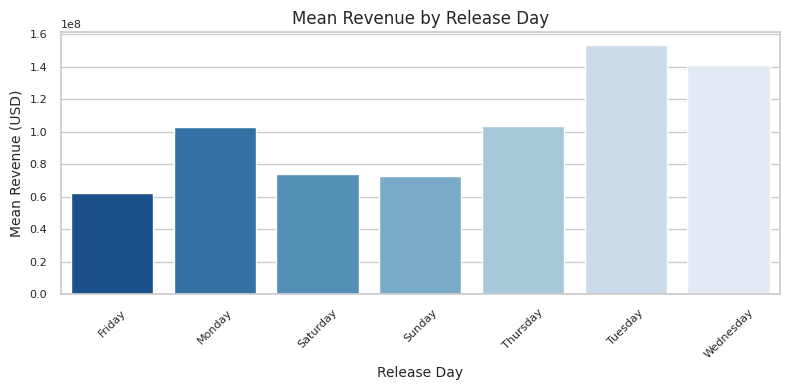

<ipython-input-70-63970434c24f>:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=days, y=stats['median_revenue'], palette='Blues_r')


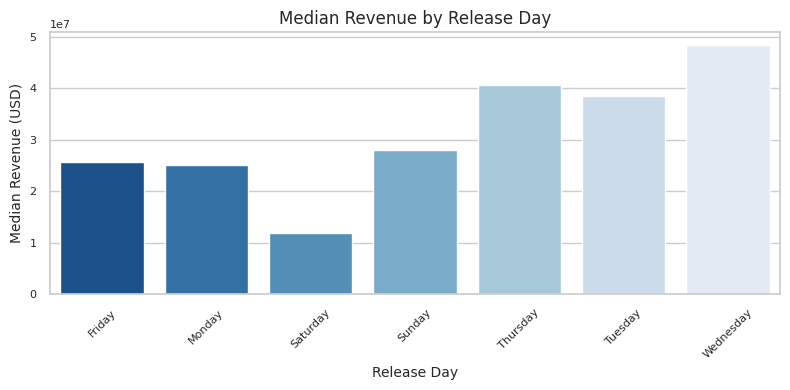

<ipython-input-70-63970434c24f>:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=days, y=stats['mean_profit'], palette='Greens_r')


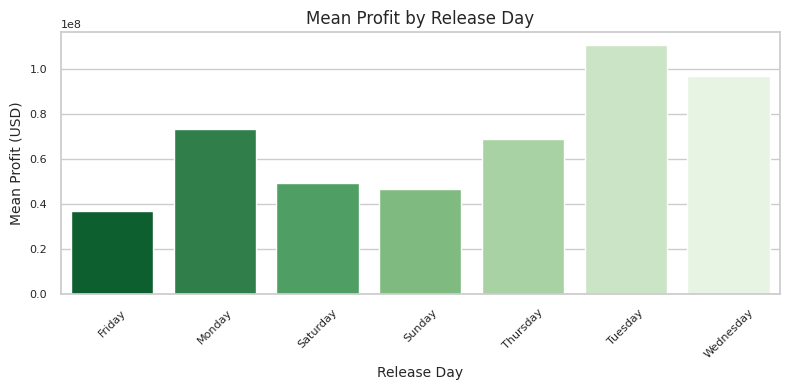

<ipython-input-70-63970434c24f>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=days, y=stats['median_profit'], palette='Greens_r')


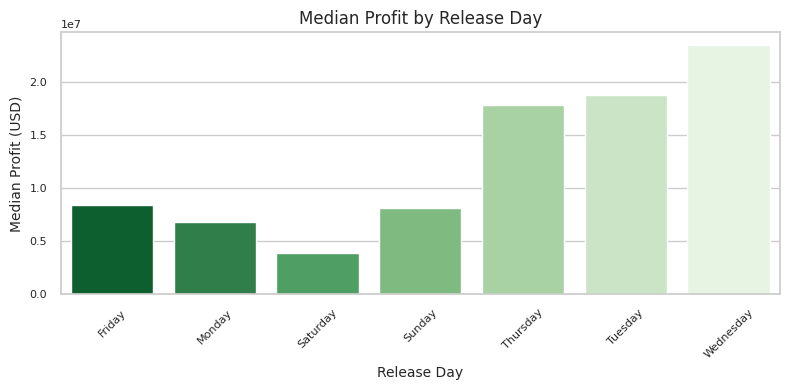

<ipython-input-70-63970434c24f>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=days, y=stats['mean_ROI'], palette='Purples_r')


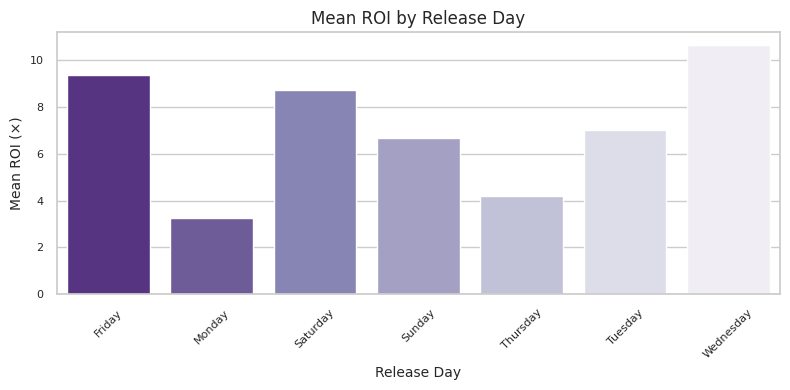

<ipython-input-70-63970434c24f>:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=days, y=stats['median_ROI'], palette='Purples_r')


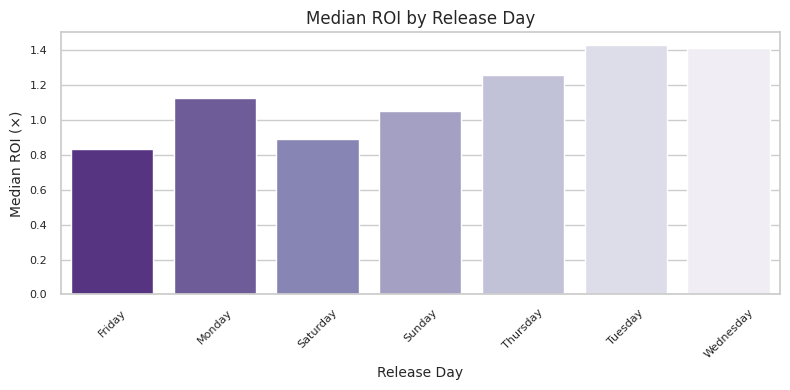

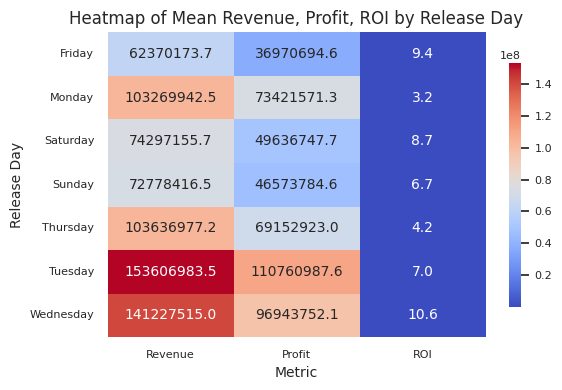

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Filter to only rows with a Release Day
df = df[df['Release Day'].notna()]

# 3. Compute descriptive statistics by Release Day
stats = df.groupby('Release Day')[['Revenue','Profit','ROI']].agg(
    count=('Revenue','count'),
    mean_revenue=('Revenue','mean'),
    median_revenue=('Revenue','median'),
    std_revenue=('Revenue','std'),
    mean_profit=('Profit','mean'),
    median_profit=('Profit','median'),
    std_profit=('Profit','std'),
    mean_ROI=('ROI','mean'),
    median_ROI=('ROI','median'),
    std_ROI=('ROI','std')
).sort_index()

print("=== Descriptive Statistics by Release Day ===")
print(stats)

# 4. Plotting style tweaks
sns.set_theme(style='whitegrid')
plt.rcParams.update({
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8
})

days = stats.index.tolist()

# A) Mean Revenue by Release Day
plt.figure(figsize=(8,4))
sns.barplot(x=days, y=stats['mean_revenue'], palette='Blues_r')
plt.title('Mean Revenue by Release Day')
plt.xlabel('Release Day')
plt.ylabel('Mean Revenue (USD)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# B) Median Revenue by Release Day
plt.figure(figsize=(8,4))
sns.barplot(x=days, y=stats['median_revenue'], palette='Blues_r')
plt.title('Median Revenue by Release Day')
plt.xlabel('Release Day')
plt.ylabel('Median Revenue (USD)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# C) Mean Profit by Release Day
plt.figure(figsize=(8,4))
sns.barplot(x=days, y=stats['mean_profit'], palette='Greens_r')
plt.title('Mean Profit by Release Day')
plt.xlabel('Release Day')
plt.ylabel('Mean Profit (USD)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# D) Median Profit by Release Day
plt.figure(figsize=(8,4))
sns.barplot(x=days, y=stats['median_profit'], palette='Greens_r')
plt.title('Median Profit by Release Day')
plt.xlabel('Release Day')
plt.ylabel('Median Profit (USD)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# E) Mean ROI by Release Day
plt.figure(figsize=(8,4))
sns.barplot(x=days, y=stats['mean_ROI'], palette='Purples_r')
plt.title('Mean ROI by Release Day')
plt.xlabel('Release Day')
plt.ylabel('Mean ROI (×)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# F) Median ROI by Release Day
plt.figure(figsize=(8,4))
sns.barplot(x=days, y=stats['median_ROI'], palette='Purples_r')
plt.title('Median ROI by Release Day')
plt.xlabel('Release Day')
plt.ylabel('Median ROI (×)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# G) Heatmap of mean metrics across days
mean_metrics = stats[['mean_revenue','mean_profit','mean_ROI']].rename(columns={
    'mean_revenue':'Revenue',
    'mean_profit':'Profit',
    'mean_ROI':'ROI'
})
plt.figure(figsize=(6,4))
sns.heatmap(
    mean_metrics,
    annot=True,
    fmt='.1f',
    cmap='coolwarm',
    cbar_kws={'shrink': 0.8}
)
plt.title('Heatmap of Mean Revenue, Profit, ROI by Release Day')
plt.xlabel('Metric')
plt.ylabel('Release Day')
plt.tight_layout()
plt.show()


Mounted at /content/drive

--- Revenue Tier by Budget Tier (counts) ---
Revenue Tier      Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Budget Tier                                                           
Micro (<5M)                824                 345               76   
Indie (5–20M)              561                 737              371   
Studio (20–100M)           126                 575              951   
Tentpole (>100M)             0                   6               51   

Revenue Tier      Blockbuster (>200M)  
Budget Tier                            
Micro (<5M)                        11  
Indie (5–20M)                      54  
Studio (20–100M)                  344  
Tentpole (>100M)                  280  

--- Revenue Tier by Budget Tier (row %) ---
Revenue Tier      Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Budget Tier                                                           
Micro (<5M)               65.6                27.5              6.1   
Ind

<Figure size 700x400 with 0 Axes>

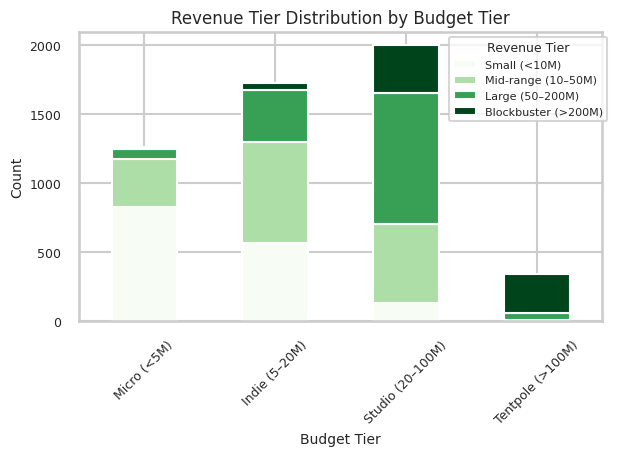

<Figure size 700x400 with 0 Axes>

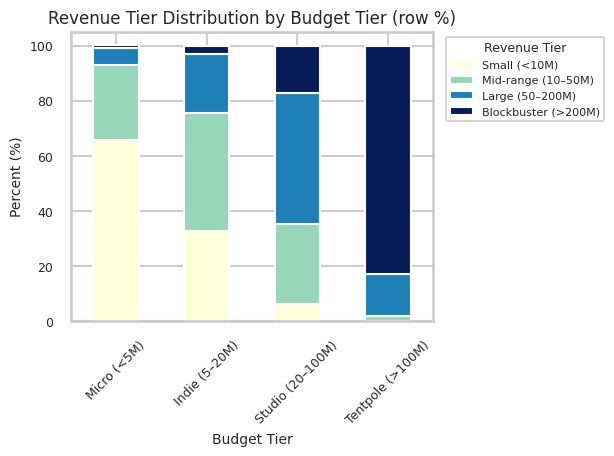

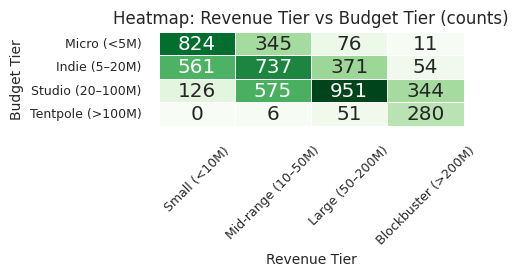

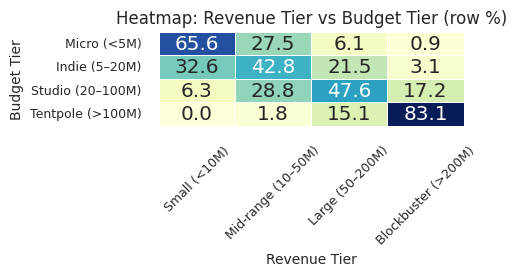


--- Profit Tier by Budget Tier (counts) ---
Profit Tier       Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Budget Tier                                                                   
Micro (<5M)             350          548                275              72   
Indie (5–20M)           617          274                501             282   
Studio (20–100M)        581          133                405             666   
Tentpole (>100M)         27            3                 24              80   

Profit Tier       Superhit (>200M)  
Budget Tier                         
Micro (<5M)                     11  
Indie (5–20M)                   49  
Studio (20–100M)               211  
Tentpole (>100M)               203  

--- Profit Tier by Budget Tier (row %) ---
Profit Tier       Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Budget Tier                                                                   
Micro (<5M)            27.9         43.6               2

<Figure size 700x400 with 0 Axes>

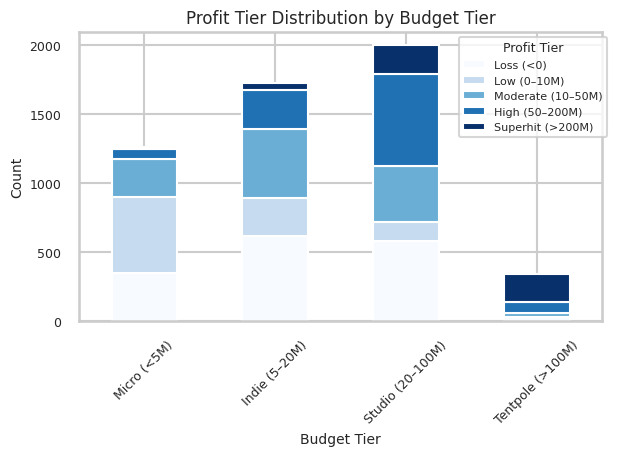

<Figure size 700x400 with 0 Axes>

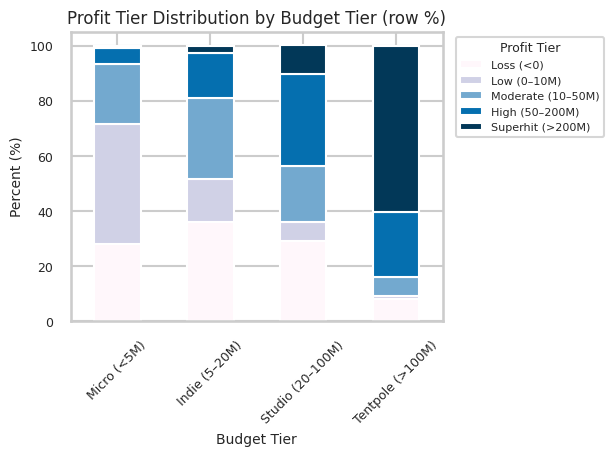

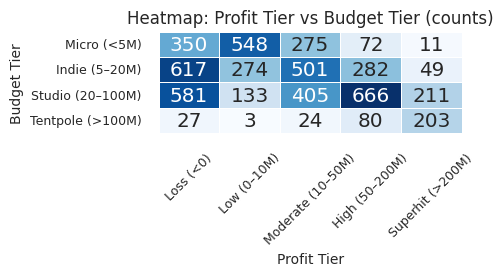

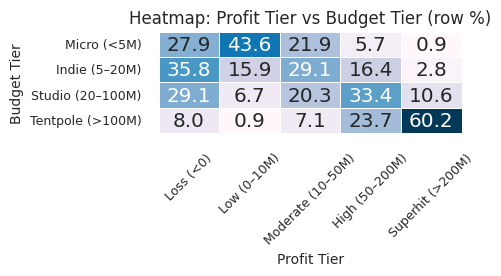


--- ROI Category by Budget Tier (counts) ---
ROI Category      Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Budget Tier                                                            
Micro (<5M)                 350        164           130         213   
Indie (5–20M)               617        296           231         299   
Studio (20–100M)            581        476           351         420   
Tentpole (>100M)             27         71            91         122   

ROI Category      Exceptional (>5)  
Budget Tier                         
Micro (<5M)                    399  
Indie (5–20M)                  280  
Studio (20–100M)               168  
Tentpole (>100M)                26  

--- ROI Category by Budget Tier (row %) ---
ROI Category      Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Budget Tier                                                            
Micro (<5M)                27.9       13.1          10.4        17.0   
Indie (5–20M)              35.8       

<Figure size 700x400 with 0 Axes>

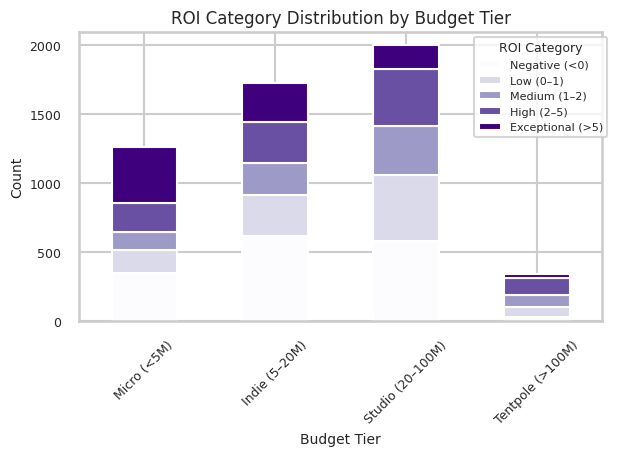

<Figure size 700x400 with 0 Axes>

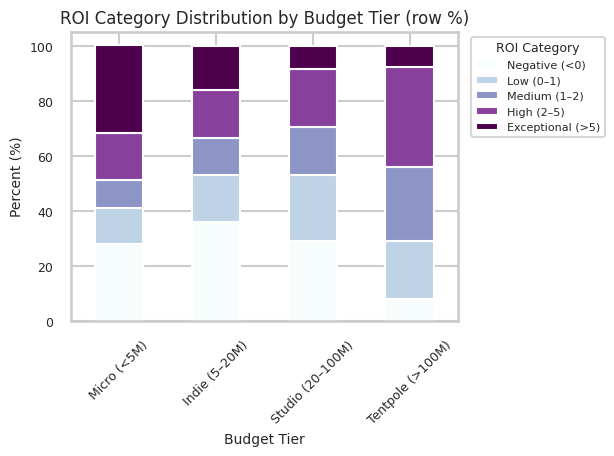

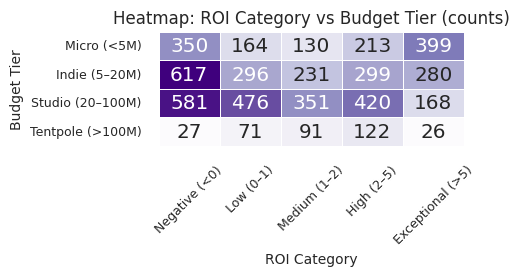

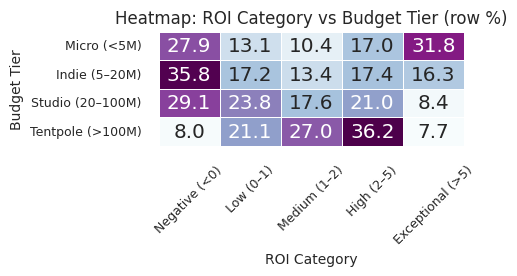

In [ ]:
# 1. Mount Google Drive and load data
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 2. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 3. Filter to rows with a Budget Tier
df = df[df['Budget Tier'].notna()]

# 4. Define the category orders
budget_order = ['Micro (<5M)', 'Indie (5–20M)', 'Studio (20–100M)', 'Tentpole (>100M)']
rev_order    = ['Small (<10M)', 'Mid‑range (10–50M)', 'Large (50–200M)', 'Blockbuster (>200M)']
prof_order   = ['Loss (<0)', 'Low (0–10M)', 'Moderate (10–50M)', 'High (50–200M)', 'Superhit (>200M)']
roi_order    = ['Negative (<0)', 'Low (0–1)', 'Medium (1–2)', 'High (2–5)', 'Exceptional (>5)']

# 5. Styling: subtle colors & smaller fonts
sns.set_theme(style='whitegrid')
sns.set_context("talk", font_scale=0.8)
subtle_palette = sns.color_palette("pastel")

# 6. Analysis function
def budget_vs_tier(tier_col, order, cmap_counts, cmap_pct):
    # a) Crosstabs
    counts = pd.crosstab(df['Budget Tier'], df[tier_col]).reindex(index=budget_order, columns=order, fill_value=0)
    pct = counts.div(counts.sum(axis=1), axis=0).round(3) * 100

    print(f"\n--- {tier_col} by Budget Tier (counts) ---")
    print(counts)
    print(f"\n--- {tier_col} by Budget Tier (row %) ---")
    print(pct)

    # b) Count-based stacked bar
    plt.figure(figsize=(7,4))
    counts.plot(kind='bar', stacked=True, colormap=cmap_counts, edgecolor='white')
    plt.title(f'{tier_col} Distribution by Budget Tier', fontsize=12)
    plt.xlabel('Budget Tier', fontsize=10)
    plt.ylabel('Count', fontsize=10)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.legend(title=tier_col, fontsize=8, title_fontsize=9, bbox_to_anchor=(1.02,1))
    plt.tight_layout()
    plt.show()

    # c) Percent-based stacked bar
    plt.figure(figsize=(7,4))
    pct.plot(kind='bar', stacked=True, colormap=cmap_pct, edgecolor='white')
    plt.title(f'{tier_col} Distribution by Budget Tier (row %)', fontsize=12)
    plt.xlabel('Budget Tier', fontsize=10)
    plt.ylabel('Percent (%)', fontsize=10)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.legend(title=tier_col, fontsize=8, title_fontsize=9, bbox_to_anchor=(1.02,1))
    plt.tight_layout()
    plt.show()

    # d) Count-based heatmap
    plt.figure(figsize=(5,3))
    sns.heatmap(counts, annot=True, fmt='d', cmap=cmap_counts, cbar=False, linewidths=.5)
    plt.title(f'Heatmap: {tier_col} vs Budget Tier (counts)', fontsize=12)
    plt.xlabel(tier_col, fontsize=10)
    plt.ylabel('Budget Tier', fontsize=10)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()

    # e) Percent-based heatmap
    plt.figure(figsize=(5,3))
    sns.heatmap(pct, annot=True, fmt='.1f', cmap=cmap_pct, cbar=False, linewidths=.5)
    plt.title(f'Heatmap: {tier_col} vs Budget Tier (row %)', fontsize=12)
    plt.xlabel(tier_col, fontsize=10)
    plt.ylabel('Budget Tier', fontsize=10)
    plt.xticks(rotation=45, fontsize=9)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()

# 7. Run for each tier
budget_vs_tier('Revenue Tier', rev_order, cmap_counts='Greens', cmap_pct='YlGnBu')
budget_vs_tier('Profit Tier', prof_order, cmap_counts='Blues', cmap_pct='PuBu')
budget_vs_tier('ROI Category', roi_order, cmap_counts='Purples', cmap_pct='BuPu')


=== Summary Stats by Budget Tier ===
                  Count  Mean_Revenue  Median_Revenue   Mean_Profit  \
Budget Tier                                                           
Micro (<5M)        1256  1.565478e+07       4720050.5  1.331560e+07   
Indie (5–20M)      1723  4.175222e+07      20342161.0  2.925859e+07   
Studio (20–100M)   1996  1.195263e+08      80004181.5  7.272825e+07   
Tentpole (>100M)    337  5.032212e+08     400062763.0  3.476189e+08   

                  Median_Profit   Mean_ROI  Median_ROI  
Budget Tier                                             
Micro (<5M)           2597021.5  27.168642    1.855512  
Indie (5–20M)         8579850.0   2.525390    0.806777  
Studio (20–100M)     36746985.0   1.552025    0.861481  
Tentpole (>100M)    252744280.0   2.165942    1.774916  


<ipython-input-2-ddf986f31552>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


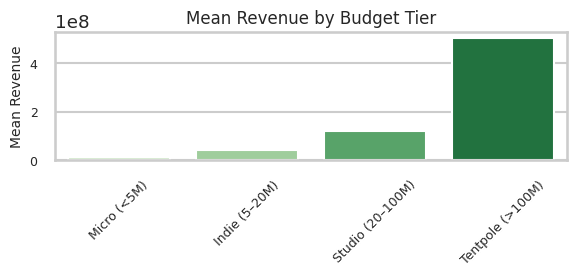

<ipython-input-2-ddf986f31552>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


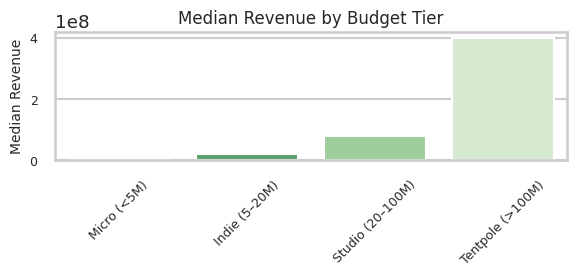

<ipython-input-2-ddf986f31552>:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


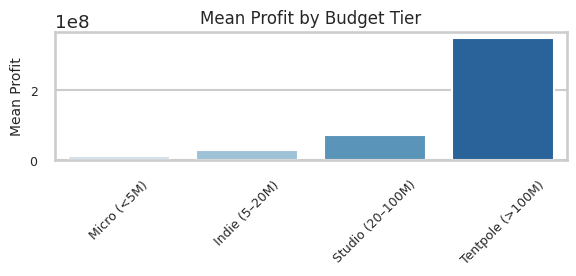

<ipython-input-2-ddf986f31552>:81: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


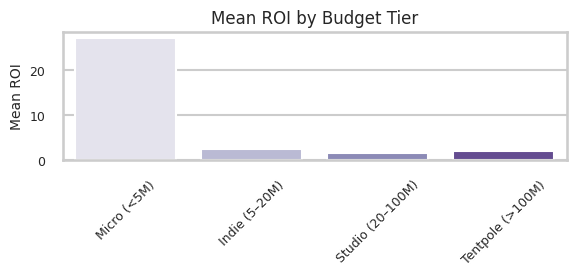

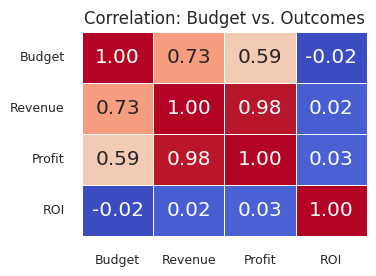

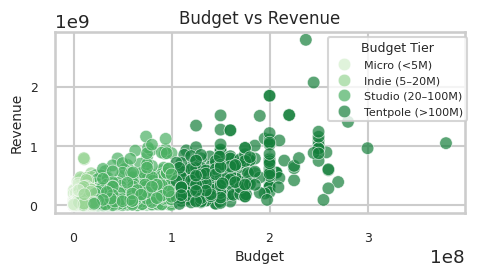

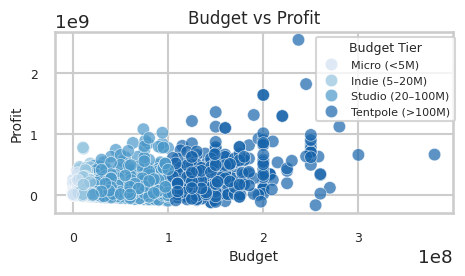

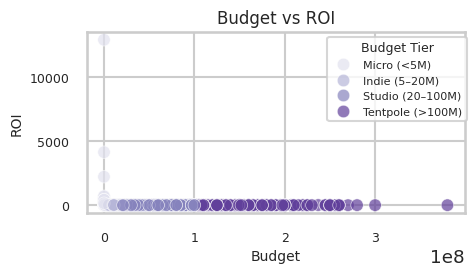

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep only rows with Budget & Budget Tier
df = df[df['Budget'].notna() & df['Budget Tier'].notna()]

# 3. Define Budget Tier order
budget_order = ['Micro (<5M)', 'Indie (5–20M)', 'Studio (20–100M)', 'Tentpole (>100M)']

# 4. Compute descriptive stats by Budget Tier
stats = df.groupby('Budget Tier').agg(
    Count=('Budget', 'size'),
    Mean_Revenue=('Revenue', 'mean'),
    Median_Revenue=('Revenue', 'median'),
    Mean_Profit=('Profit', 'mean'),
    Median_Profit=('Profit', 'median'),
    Mean_ROI=('ROI', 'mean'),
    Median_ROI=('ROI', 'median')
).reindex(budget_order)

print("=== Summary Stats by Budget Tier ===")
print(stats)

# 5. Plotting setup: subtle colors, smaller fonts
sns.set_theme(style='whitegrid')
sns.set_context('talk', font_scale=0.8)
palette = sns.color_palette("pastel")

# A) Mean Revenue by Budget Tier
plt.figure(figsize=(6,3))
sns.barplot(
    data=stats.reset_index(),
    x='Budget Tier', y='Mean_Revenue',
    order=budget_order, palette='Greens'
)
plt.title('Mean Revenue by Budget Tier', fontsize=12)
plt.xlabel('')
plt.ylabel('Mean Revenue', fontsize=10)
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

# B) Median Revenue by Budget Tier
plt.figure(figsize=(6,3))
sns.barplot(
    data=stats.reset_index(),
    x='Budget Tier', y='Median_Revenue',
    order=budget_order, palette='Greens_r'
)
plt.title('Median Revenue by Budget Tier', fontsize=12)
plt.xlabel('')
plt.ylabel('Median Revenue', fontsize=10)
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

# C) Mean Profit by Budget Tier
plt.figure(figsize=(6,3))
sns.barplot(
    data=stats.reset_index(),
    x='Budget Tier', y='Mean_Profit',
    order=budget_order, palette='Blues'
)
plt.title('Mean Profit by Budget Tier', fontsize=12)
plt.xlabel('')
plt.ylabel('Mean Profit', fontsize=10)
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

# D) Mean ROI by Budget Tier
plt.figure(figsize=(6,3))
sns.barplot(
    data=stats.reset_index(),
    x='Budget Tier', y='Mean_ROI',
    order=budget_order, palette='Purples'
)
plt.title('Mean ROI by Budget Tier', fontsize=12)
plt.xlabel('')
plt.ylabel('Mean ROI', fontsize=10)
plt.xticks(rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

# E) Correlation heatmap of numeric columns
corr = df[['Budget', 'Revenue', 'Profit', 'ROI']].corr()
plt.figure(figsize=(4,3))
sns.heatmap(
    corr, annot=True, fmt='.2f',
    cmap='coolwarm', cbar=False, linewidths=.5
)
plt.title('Correlation: Budget vs. Outcomes', fontsize=12)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

# F) Scatter plots of Budget vs Revenue/Profit/ROI colored by Budget Tier
for y_col, cmap in [('Revenue', 'Greens'), ('Profit', 'Blues'), ('ROI', 'Purples')]:
    plt.figure(figsize=(5,3))
    sns.scatterplot(
        data=df, x='Budget', y=y_col,
        hue='Budget Tier', hue_order=budget_order,
        palette=cmap, alpha=0.7, edgecolor='w', linewidth=0.5
    )
    plt.title(f'Budget vs {y_col}', fontsize=12)
    plt.xlabel('Budget', fontsize=10)
    plt.ylabel(y_col, fontsize=10)
    plt.xticks(fontsize=9)
    plt.yticks(fontsize=9)
    plt.legend(title='Budget Tier', fontsize=8, title_fontsize=9, bbox_to_anchor=(1.02,1))
    plt.tight_layout()
    plt.show()



--- Director vs Revenue Tier (counts) ---
Revenue Tier       Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Director                                                               
Alfred Hitchcock             12                   9                0   
Brian De Palma                3                   9                5   
Clint Eastwood                0                   7               16   
Oliver Stone                  3                   5                8   
Ridley Scott                  1                   8                5   
Robert Zemeckis               0                   1                8   
Steven Soderbergh             4                   4                4   
Steven Spielberg              0                   4                7   
Tim Burton                    1                   3                6   
Woody Allen                   2                  15                6   

Revenue Tier       Blockbuster (>200M)  
Director                                
Alfred Hit

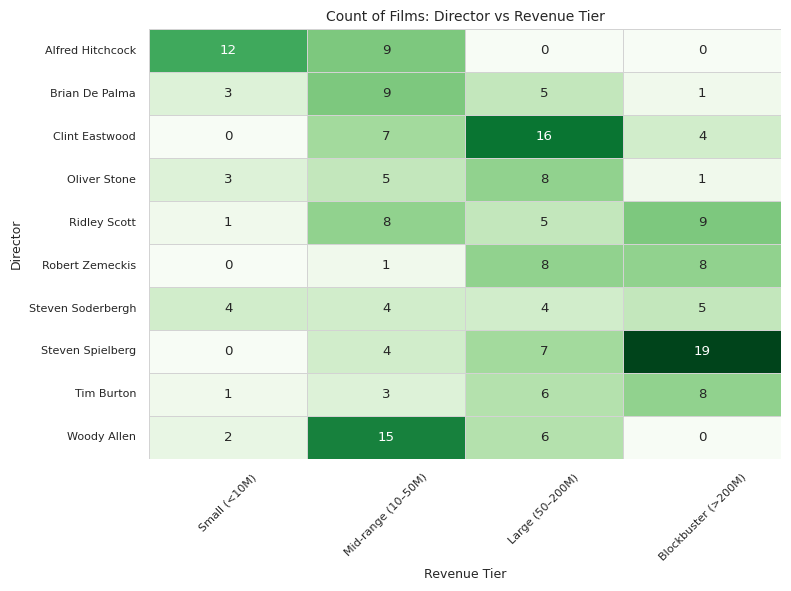

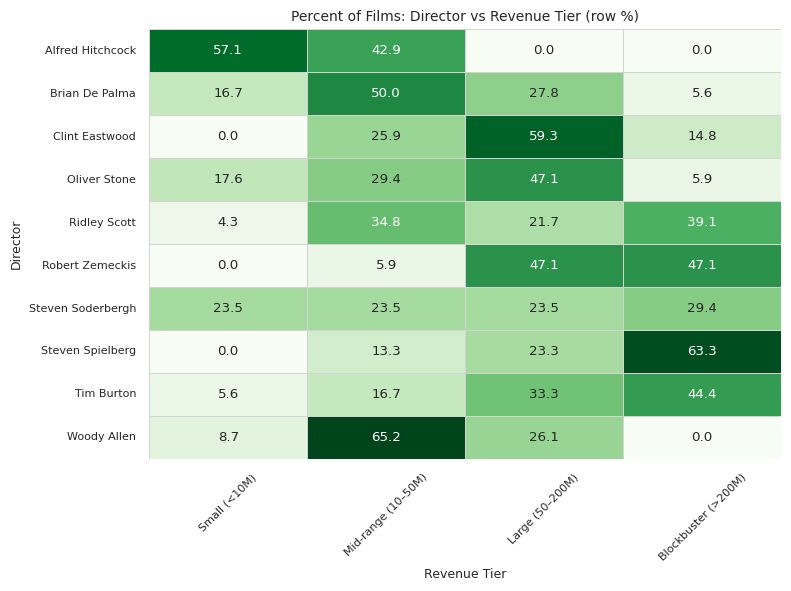


--- Director vs Profit Tier (counts) ---
Profit Tier        Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Director                                                                       
Alfred Hitchcock           1           17                  3               0   
Brian De Palma             9            1                  5               2   
Clint Eastwood             3            2                  8              12   
Oliver Stone               6            1                  5               5   
Ridley Scott               4            3                  5               7   
Robert Zemeckis            0            1                  2               8   
Steven Soderbergh          5            1                  4               3   
Steven Spielberg           2            1                  4               7   
Tim Burton                 2            0                  4               8   
Woody Allen                6            3                  9               5  

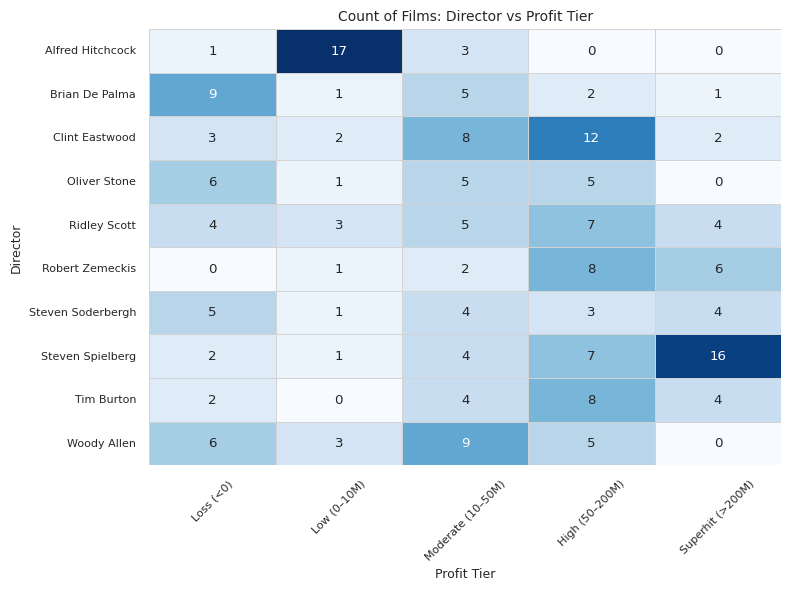

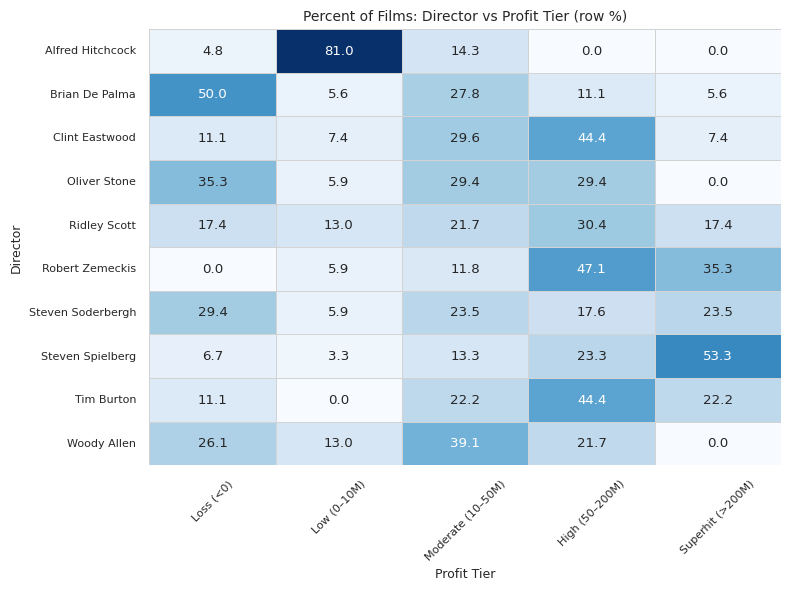


--- Director vs ROI Category (counts) ---
ROI Category       Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Director                                                                
Alfred Hitchcock               1          3             1          13   
Brian De Palma                 9          2             2           5   
Clint Eastwood                 3          3             6           7   
Oliver Stone                   6          6             2           1   
Ridley Scott                   4         10             4           4   
Robert Zemeckis                0          7             2           3   
Steven Soderbergh              5          4             2           5   
Steven Spielberg               2          2             6           9   
Tim Burton                     2          3             5           6   
Woody Allen                    6          2             2           6   

ROI Category       Exceptional (>5)  
Director                             
Alfr

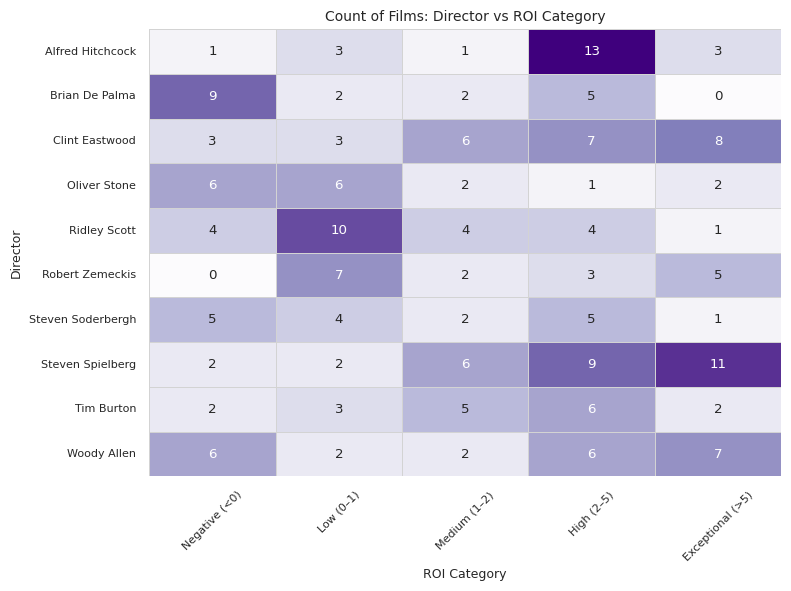

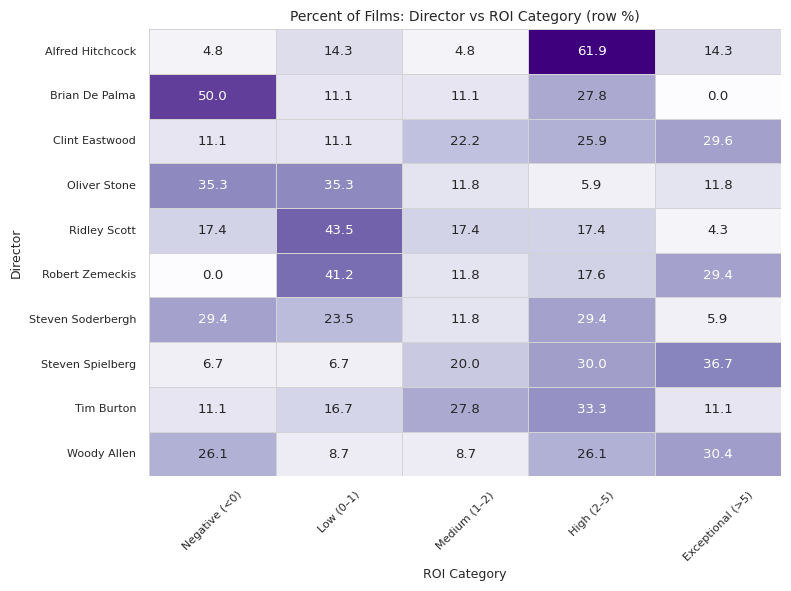

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep only rows with a Director
df = df.dropna(subset=['Director'])

# 3. Select top 10 directors by film count for clarity
top_directors = df['Director'].value_counts().head(10).index.tolist()
df_top = df[df['Director'].isin(top_directors)]

# 4. Define category orders
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

# 5. Set style
sns.set_theme(style='whitegrid')
sns.set_context("notebook", font_scale=0.8)

def director_vs_tier(df, tier, order, cmap):
    # a) Crosstab counts
    counts = pd.crosstab(df['Director'], df[tier]).reindex(columns=order, fill_value=0)
    print(f"\n--- Director vs {tier} (counts) ---")
    print(counts)

    # b) Crosstab row‑percent
    pct = counts.div(counts.sum(axis=1), axis=0).round(3) * 100
    print(f"\n--- Director vs {tier} (row %) ---")
    print(pct)

    # c) Count‑based heatmap
    plt.figure(figsize=(8, len(counts)*0.5 + 1))
    sns.heatmap(
        counts, annot=True, fmt='d', cmap=cmap,
        cbar=False, linewidths=0.5, linecolor='lightgrey'
    )
    plt.title(f'Count of Films: Director vs {tier}', fontsize=10)
    plt.xlabel(tier, fontsize=9)
    plt.ylabel('Director', fontsize=9)
    plt.xticks(fontsize=8, rotation=45)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    plt.show()

    # d) Percent‑based heatmap
    plt.figure(figsize=(8, len(pct)*0.5 + 1))
    sns.heatmap(
        pct, annot=True, fmt='.1f', cmap=cmap,
        cbar=False, linewidths=0.5, linecolor='lightgrey'
    )
    plt.title(f'Percent of Films: Director vs {tier} (row %)', fontsize=10)
    plt.xlabel(tier, fontsize=9)
    plt.ylabel('Director', fontsize=9)
    plt.xticks(fontsize=8, rotation=45)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    plt.show()

# 6. Run analysis for each tier
director_vs_tier(df_top, 'Revenue Tier', rev_order, 'Greens')
director_vs_tier(df_top, 'Profit Tier', prof_order, 'Blues')
director_vs_tier(df_top, 'ROI Category', roi_order, 'Purples')



--- Revenue Tier by Director (counts) ---
Revenue Tier       Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Director                                                               
Bill Condon                   1                   0                0   
Lasse Hallström               0                   1                3   
Michael Bay                   0                   0                2   
Ridley Scott                  0                   1                1   
Roland Emmerich               1                   1                0   
Steven Soderbergh             0                   2                3   
Steven Spielberg              0                   0                3   
Woody Allen                   0                   1                4   

Revenue Tier       Blockbuster (>200M)  
Director                                
Bill Condon                          3  
Lasse Hallström                      0  
Michael Bay                          3  
Ridley Scott                   

<Figure size 800x400 with 0 Axes>

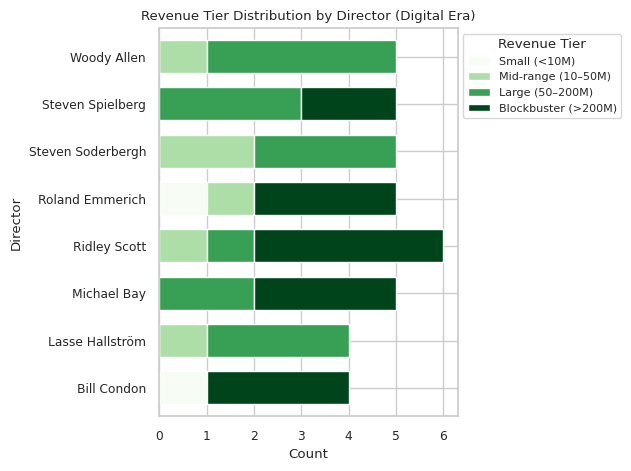

<Figure size 800x400 with 0 Axes>

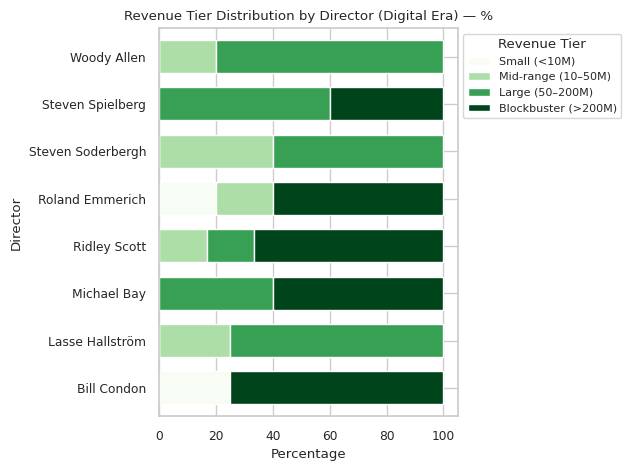

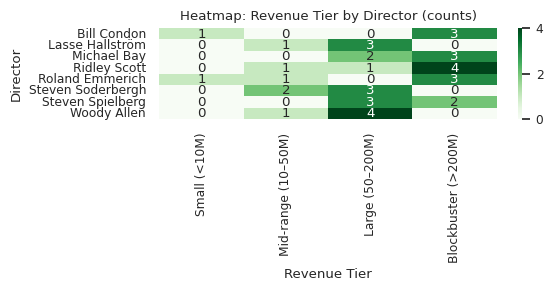

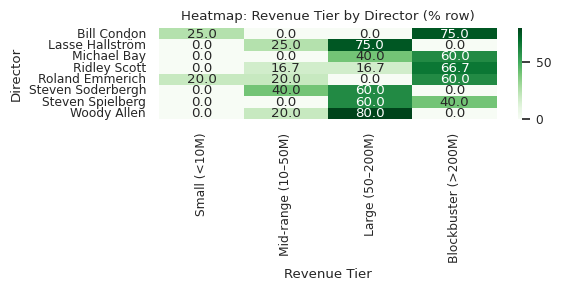


--- Profit Tier by Director (counts) ---
Profit Tier        Loss (<0)  Low (0–10M)  Moderate (10–50M)  High (50–200M)  \
Director                                                                       
Bill Condon                1            0                  0               0   
Lasse Hallström            0            0                  1               3   
Michael Bay                0            0                  1               1   
Ridley Scott               0            0                  2               2   
Roland Emmerich            2            0                  0               1   
Steven Soderbergh          1            0                  2               2   
Steven Spielberg           0            0                  1               2   
Woody Allen                0            0                  2               3   

Profit Tier        Superhit (>200M)  
Director                             
Bill Condon                       3  
Lasse Hallström                   0  
Micha

<Figure size 800x400 with 0 Axes>

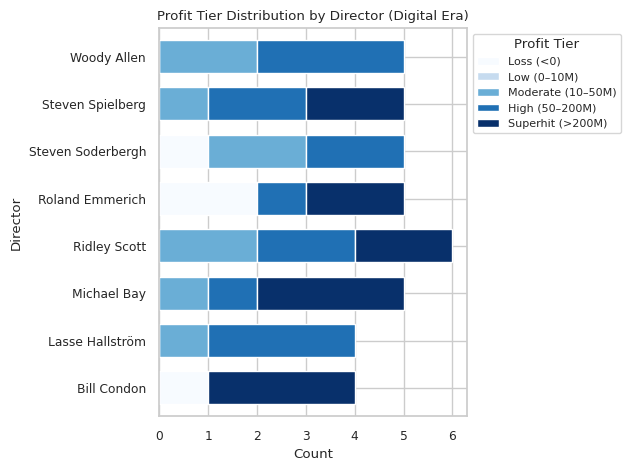

<Figure size 800x400 with 0 Axes>

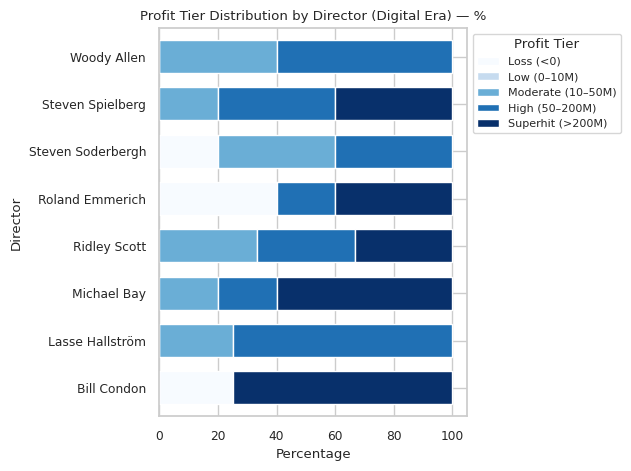

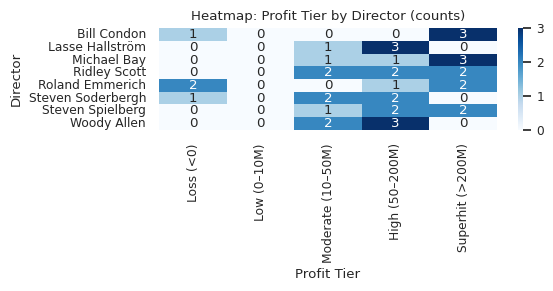

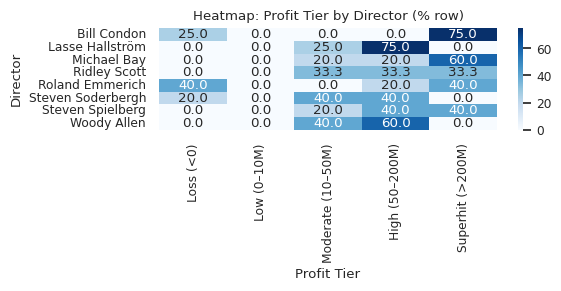


--- ROI Category by Director (counts) ---
ROI Category       Negative (<0)  Low (0–1)  Medium (1–2)  High (2–5)  \
Director                                                                
Bill Condon                    1          0             0           0   
Lasse Hallström                0          0             0           2   
Michael Bay                    0          1             1           3   
Ridley Scott                   0          2             2           2   
Roland Emmerich                2          1             1           1   
Steven Soderbergh              1          1             2           0   
Steven Spielberg               0          1             2           2   
Woody Allen                    0          0             1           4   

ROI Category       Exceptional (>5)  
Director                             
Bill Condon                       3  
Lasse Hallström                   2  
Michael Bay                       0  
Ridley Scott                      0 

<Figure size 800x400 with 0 Axes>

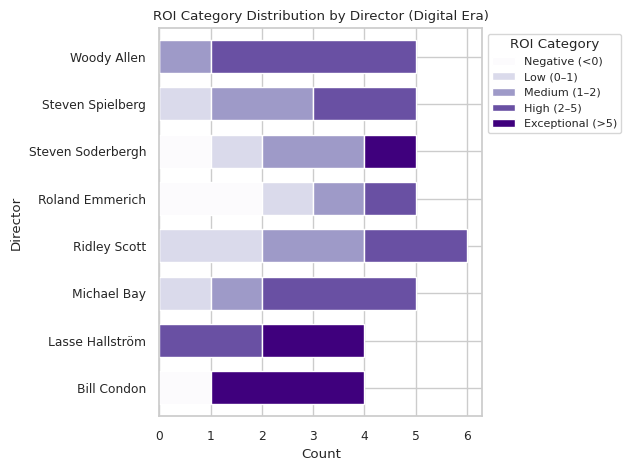

<Figure size 800x400 with 0 Axes>

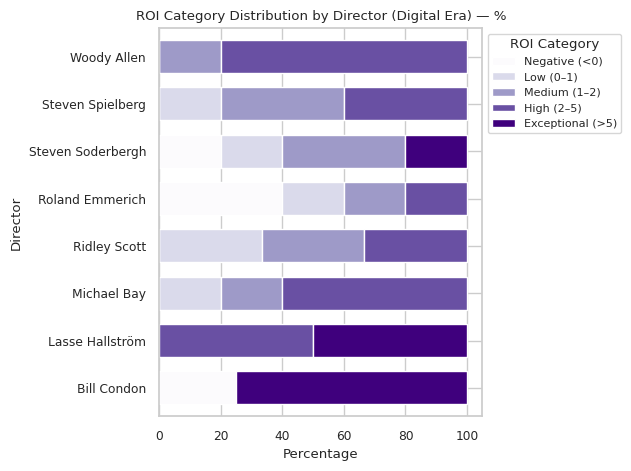

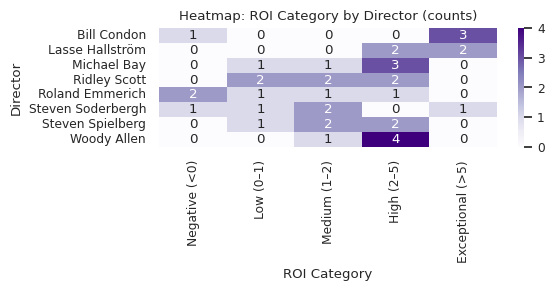

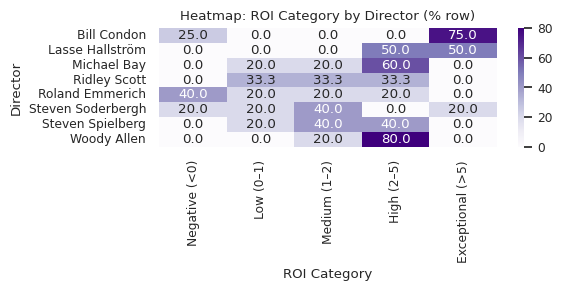

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Filter: only directors in the Digital Era
df_dig = df[df['Director'].notna() & (df['Era'] == 'Digital Era')].copy()

# 3. Prepare: top directors by film count (to keep plots readable)
top_dirs = df_dig['Director'].value_counts().nlargest(8).index.tolist()
df_dig = df_dig[df_dig['Director'].isin(top_dirs)]

# 4. Styling
sns.set_theme(style='whitegrid', font_scale=0.8)
rev_order  = ['Small (<10M)','Mid‑range (10–50M)','Large (50–200M)','Blockbuster (>200M)']
prof_order = ['Loss (<0)','Low (0–10M)','Moderate (10–50M)','High (50–200M)','Superhit (>200M)']
roi_order  = ['Negative (<0)','Low (0–1)','Medium (1–2)','High (2–5)','Exceptional (>5)']

def plot_tier_by_director(df, tier_col, order, cmap_name):
    # Crosstabs
    ct = pd.crosstab(df['Director'], df[tier_col]).reindex(columns=order, fill_value=0)
    ct_pct = ct.div(ct.sum(axis=1), axis=0)*100

    print(f"\n--- {tier_col} by Director (counts) ---")
    print(ct)
    print(f"\n--- {tier_col} by Director (% row) ---")
    print(ct_pct.round(1))

    # Count‑based bar chart
    plt.figure(figsize=(8,4))
    ct.plot(kind='barh', stacked=True, colormap=cmap_name, width=0.7)
    plt.title(f'{tier_col} Distribution by Director (Digital Era)')
    plt.xlabel('Count')
    plt.ylabel('Director')
    plt.legend(title=tier_col, bbox_to_anchor=(1,1), fontsize='small')
    plt.tight_layout()
    plt.show()

    # Percent‑based bar chart
    plt.figure(figsize=(8,4))
    ct_pct.plot(kind='barh', stacked=True, colormap=cmap_name, width=0.7)
    plt.title(f'{tier_col} Distribution by Director (Digital Era) — %')
    plt.xlabel('Percentage')
    plt.ylabel('Director')
    plt.legend(title=tier_col, bbox_to_anchor=(1,1), fontsize='small')
    plt.tight_layout()
    plt.show()

    # Count‑based heatmap
    plt.figure(figsize=(6,3))
    sns.heatmap(ct, annot=True, fmt='d', cmap=cmap_name)
    plt.title(f'Heatmap: {tier_col} by Director (counts)')
    plt.xlabel(tier_col)
    plt.ylabel('Director')
    plt.tight_layout()
    plt.show()

    # Percent‑based heatmap
    plt.figure(figsize=(6,3))
    sns.heatmap(ct_pct, annot=True, fmt='.1f', cmap=cmap_name)
    plt.title(f'Heatmap: {tier_col} by Director (% row)')
    plt.xlabel(tier_col)
    plt.ylabel('Director')
    plt.tight_layout()
    plt.show()

# 5. Run for Revenue Tier, Profit Tier, ROI Category
plot_tier_by_director(df_dig, 'Revenue Tier', rev_order,  'Greens')
plot_tier_by_director(df_dig, 'Profit Tier',  prof_order, 'Blues')
plot_tier_by_director(df_dig, 'ROI Category', roi_order,  'Purples')


In [ ]:
import pandas as pd

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Filter to rows with a Director
df = df[df['Director'].notna()]

# 3. Crosstab counts for each tier
rev_counts = pd.crosstab(df['Director'], df['Revenue Tier'])
prof_counts = pd.crosstab(df['Director'], df['Profit Tier'])
roi_counts = pd.crosstab(df['Director'], df['ROI Category'])

# 4. Combine into a single DataFrame
directors_df = rev_counts.join([prof_counts, roi_counts], how='outer').fillna(0).astype(int)

# 5. Sort by director name (ascending)
directors_df = directors_df.sort_index()

# 6. Save to Excel
output_path = 'Directors 1.xlsx'
directors_df.to_excel(output_path)

# 7. Display the first few rows
directors_df.head(10)


,Blockbuster (>200M),Large (50–200M),Mid‑range (10–50M),Small (<10M),High (50–200M),Loss (<0),Low (0–10M),Moderate (10–50M),Superhit (>200M),Exceptional (>5),High (2–5),Low (0–1),Medium (1–2),Negative (<0)
Director,,,,,,,,,,,,,,
A.R. Murugadoss,0,2,0,0,2,0,0,0,0,2,0,0,0,0
Aamir Khan,0,0,1,0,0,0,0,1,0,1,0,0,0,0
Aaron Katz,0,0,0,1,0,0,1,0,0,1,0,0,0,0
Aaron Norris,0,0,0,1,0,1,0,0,0,0,0,0,0,1
Abbas Alibhai Burmawalla,0,0,0,1,0,0,1,0,0,0,0,0,1,0
Abbas Tyrewala,0,0,1,0,0,0,1,0,0,0,1,0,0,0
Abderrahmane Sissako,0,0,0,1,0,1,0,0,0,0,0,0,0,1
Abe Sylvia,0,0,0,1,0,1,0,0,0,0,0,0,0,1
Abel Ferrara,0,0,0,5,0,3,2,0,0,0,0,0,2,3


In [ ]:
import os
import pandas as pd

# 1. Read Final 8 file (make sure it’s an ordinary space, not NBSP)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'

# sanity check
if not os.path.exists(file_path):
    raise FileNotFoundError(f"Cannot find file at {file_path!r}")

df = pd.read_excel(file_path)

# 2. Filter to rows with a valid Director
df = df[df['Director'].notna()]

# 3. Build cross‑tabs for each tier
rev_counts   = pd.crosstab(df['Director'], df['Revenue Tier'])
prof_counts  = pd.crosstab(df['Director'], df['Profit Tier'])
roi_counts   = pd.crosstab(df['Director'], df['ROI Category'])

# 4. Combine and sort
directors_df = rev_counts.join([prof_counts, roi_counts], how='outer').fillna(0).astype(int)
directors_df = directors_df.sort_index()

# 5. Save to Excel
output_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 1.xlsx'
directors_df.to_excel(output_path)

print(f"✅ Saved Directors 1.xlsx with {len(directors_df)} rows to:\n  {output_path}")


✅ Saved Directors 1.xlsx with 2084 rows to:
  /content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 1.xlsx


In [ ]:
import pandas as pd

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Filter to rows with a valid Director
df_dir = df.dropna(subset=['Director'])

# 3. Count Revenue Tier occurrences per Director
rev_counts = df_dir.groupby('Director')['Revenue Tier'] \
    .value_counts() \
    .unstack(fill_value=0)

# 4. Count ROI Category occurrences per Director
roi_counts = df_dir.groupby('Director')['ROI Category'] \
    .value_counts() \
    .unstack(fill_value=0)

# 5. Merge revenue and ROI counts
directors = rev_counts.join(roi_counts, how='outer').fillna(0).astype(int)

# 6. Sort: first by Blockbuster (>200M) desc, then Exceptional (>5) desc
directors_sorted = directors.sort_values(
    by=['Blockbuster (>200M)', 'Exceptional (>5)'],
    ascending=False
)

# 7. Save to Excel as "Directors 2"
output_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 2.xlsx'
directors_sorted.to_excel(output_path, sheet_name='Directors2')

# 8. Read back Directors 2 for verification
directors2 = pd.read_excel(output_path, index_col=0)

# Display the top rows
directors2.head()


,Blockbuster (>200M),Large (50–200M),Mid‑range (10–50M),Small (<10M),Exceptional (>5),High (2–5),Low (0–1),Medium (1–2),Negative (<0)
Director,,,,,,,,,
Steven Spielberg,19,7,4,0,11,9,2,6,2
Michael Bay,9,4,0,0,1,8,2,2,0
Ridley Scott,9,5,8,1,1,4,10,4,4
Robert Zemeckis,8,8,1,0,5,3,7,2,0
Tim Burton,8,6,3,1,2,6,3,5,2


In [ ]:
import pandas as pd

# 1. Read Directors 2 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 2.xlsx'
df2 = pd.read_excel(file_path)

# 2. Inspect structure
print(df2.dtypes)
print(df2.shape)

# 3. Peek at the data
print(df2.head())

# 4. Summary stats on the numeric columns
print(df2.describe())

# 5. Check for any missing values
print(df2.isna().sum())


Director               object
Blockbuster (>200M)     int64
Large (50–200M)         int64
Mid‑range (10–50M)      int64
Small (<10M)            int64
Exceptional (>5)        int64
High (2–5)              int64
Low (0–1)               int64
Medium (1–2)            int64
Negative (<0)           int64
dtype: object
(2084, 10)
           Director  Blockbuster (>200M)  Large (50–200M)  Mid‑range (10–50M)  \
0  Steven Spielberg                   19                7                   4   
1       Michael Bay                    9                4                   0   
2      Ridley Scott                    9                5                   8   
3   Robert Zemeckis                    8                8                   1   
4        Tim Burton                    8                6                   3   

   Small (<10M)  Exceptional (>5)  High (2–5)  Low (0–1)  Medium (1–2)  \
0             0                11           9          2             6   
1             0                 1       

In [ ]:
import pandas as pd

# 1. Read Directors 2 file (adjust path if needed)
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 2.xlsx'
df = pd.read_excel(file_path)

# 2. Reorder columns
ordered_cols = [
    'Director',
    'Blockbuster (>200M)',
    'Large (50–200M)',
    'Mid‑range (10–50M)',
    'Small (<10M)',
    'Exceptional (>5)',
    'High (2–5)',
    'Medium (1–2)',
    'Low (0–1)',
    'Negative (<0)'
]
df = df[ordered_cols]

# 3. Assign points per tier
points_map = {
    'Blockbuster (>200M)': 4,
    'Large (50–200M)':       3,
    'Mid‑range (10–50M)':    2,
    'Small (<10M)':          1,
    'Exceptional (>5)':      4,
    'High (2–5)':            3,
    'Medium (1–2)':          2,
    'Low (0–1)':             1,
    'Negative (<0)':        -1,
}

# 4. Compute the Points column
df['Points'] = sum(df[col] * weight for col, weight in points_map.items())

# 5. Save to Directors 3.xlsx
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 3.xlsx'
df.to_excel(out_path, index=False)

# 6. Show descriptive statistics of Points
print(df['Points'].describe())


count    2084.000000
mean        8.706814
std        12.550156
min         0.000000
25%         1.000000
50%         5.000000
75%        11.000000
max       188.000000
Name: Points, dtype: float64


In [ ]:
import pandas as pd
import numpy as np

# 1. Read Directors 3 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 3.xlsx'
df = pd.read_excel(file_path)

# 2. Create Director Tiers based on Points
conditions = [
    df['Points'] >= 11,
    df['Points'].between(5, 10),
    df['Points'].between(1, 4),
    df['Points'] == 0
]
choices = ['Elite', 'Pro', 'Rising', 'Newcomers']
df['Director Tiers'] = np.select(conditions, choices, default='Unknown')

# 3. Define tier ordering
tier_order = {'Elite': 0, 'Pro': 1, 'Rising': 2, 'Newcomers': 3}
df['TierOrder'] = df['Director Tiers'].map(tier_order)

# 4. Sort by Tier, Points, Blockbuster count, Exceptional ROI count
df_sorted = df.sort_values(
    by=['TierOrder', 'Points', 'Blockbuster (>200M)', 'Exceptional (>5)'],
    ascending=[True, False, False, False]
).drop(columns=['TierOrder'])

# 5. Save as Directors 4
output_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 4.xlsx'
df_sorted.to_excel(output_path, index=False)

# 6. Display head of sorted DataFrame
df_sorted.head(10)


,Director,Blockbuster (>200M),Large (50–200M),Mid‑range (10–50M),Small (<10M),Exceptional (>5),High (2–5),Medium (1–2),Low (0–1),Negative (<0),Points,Director Tiers
0,Steven Spielberg,19,7,4,0,11,9,6,2,2,188,Elite
20,Clint Eastwood,4,16,7,0,8,7,6,3,3,143,Elite
2,Ridley Scott,9,5,8,1,1,4,4,10,4,98,Elite
3,Robert Zemeckis,8,8,1,0,5,3,2,7,0,98,Elite
345,Woody Allen,0,6,15,2,7,6,2,2,6,96,Elite
4,Tim Burton,8,6,3,1,2,6,5,3,2,94,Elite
349,Alfred Hitchcock,0,0,9,12,3,13,1,3,1,85,Elite
1,Michael Bay,9,4,0,0,1,8,2,2,0,82,Elite
8,Ron Howard,7,8,0,0,3,2,6,2,2,82,Elite
18,Steven Soderbergh,5,4,4,4,1,5,2,4,5,66,Elite


In [ ]:
import pandas as pd

# 1. Read Directors 4 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 4.xlsx'
df = pd.read_excel(file_path)

# 2. Count directors per tier
tier_counts = df['Director Tiers'].value_counts().sort_index()
print(tier_counts)


Director Tiers
Elite        526
Newcomers    410
Pro          620
Rising       528
Name: count, dtype: int64


<ipython-input-17-fe613f5a15ef>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
<ipython-input-17-fe613f5a15ef>:53: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=8)
<ipython-input-17-fe613f5a15ef>:54: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)


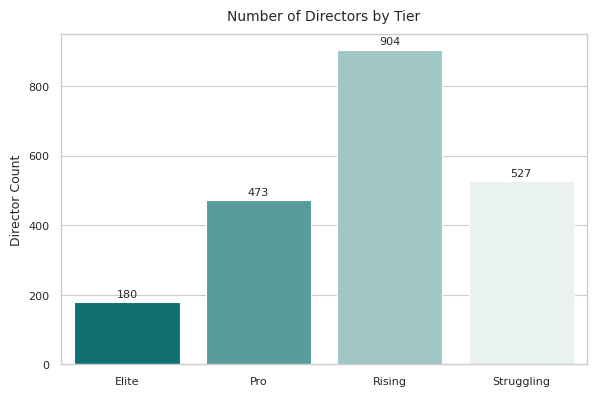

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Read Directors 4 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 4.xlsx'
df = pd.read_excel(file_path)

# 2. Define the new tier based on Points
def assign_tier(points):
    if points >= 25:
        return 'Elite'
    elif points >= 8:
        return 'Pro'
    elif points >= 2:
        return 'Rising'
    else:
        return 'Struggling'

df['Director Tiers'] = df['Points'].apply(assign_tier)

# 3. Convert to categorical with the desired order
tier_order = ['Elite', 'Pro', 'Rising', 'Struggling']
df['Director Tiers'] = pd.Categorical(df['Director Tiers'], categories=tier_order, ordered=True)

# 4. Sort: by tier, then Points desc, then Blockbuster desc, then Exceptional ROI desc
df_sorted = df.sort_values(
    by=['Director Tiers', 'Points', 'Blockbuster (>200M)', 'Exceptional (>5)'],
    ascending=[True, False, False, False]
)

# 5. Save to Directors 5
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 5.xlsx'
df_sorted.to_excel(out_path, index=False)

# 6. Count how many directors in each tier, in the specified order
tier_counts = df_sorted['Director Tiers'].value_counts().reindex(tier_order)

# 7. Visualization of the tier counts
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=0.8)

plt.figure(figsize=(6, 4))
palette = sns.light_palette("teal", n_colors=len(tier_order), reverse=True)
ax = sns.barplot(
    x=tier_counts.index,
    y=tier_counts.values,
    palette=palette
)
ax.set_title("Number of Directors by Tier", fontsize=10, pad=10)
ax.set_xlabel("")  # no x-label
ax.set_ylabel("Director Count", fontsize=9)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=8)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)
for i, v in enumerate(tier_counts.values):
    ax.text(i, v + max(tier_counts.values)*0.01, str(v), ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


=== Top 10 Actors by Blockbuster Count ===
 Revenue Tier       Small (<10M)  Mid‑range (10–50M)  Large (50–200M)  \
Actor                                                                  
Tom Cruise                    1                   1                9   
Tom Hanks                     2                   6               12   
Will Smith                    0                   0                6   
Jim Carrey                    1                   5                7   
Johnny Depp                   3                   7               14   
Brad Pitt                     2                   4               14   
Cameron Diaz                  2                   2               10   
Harrison Ford                 3                   5               14   
Matt Damon                    3                   8               12   
Samuel L. Jackson             3                  10               11   

Revenue Tier       Blockbuster (>200M)  
Actor                                   
Tom Cruis

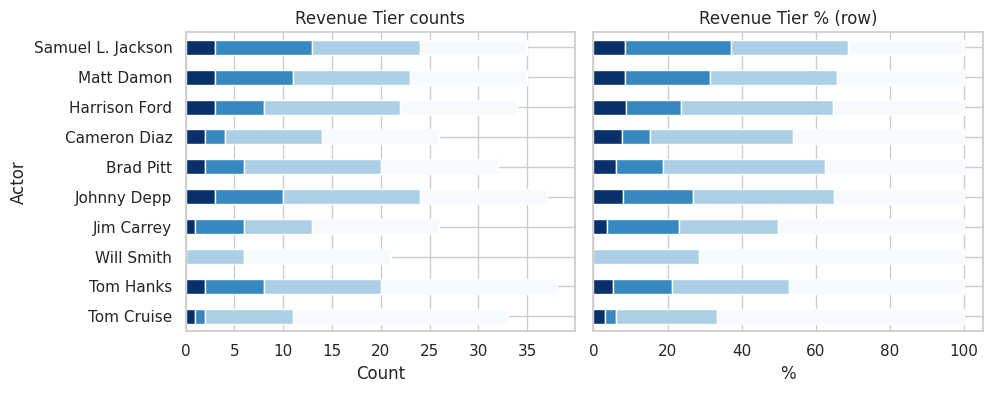

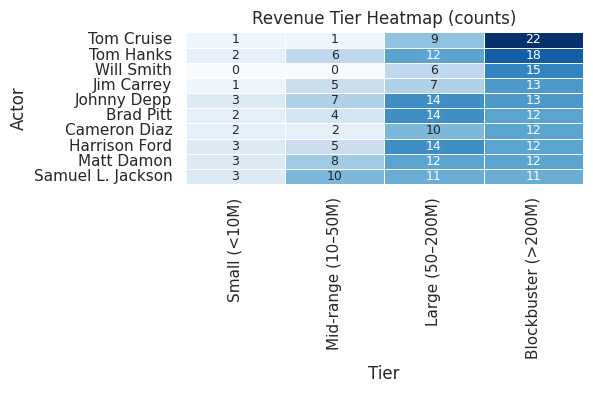

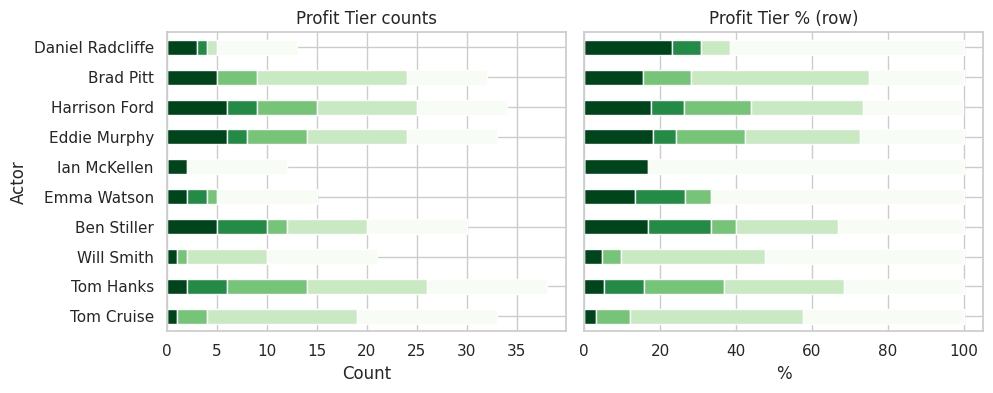

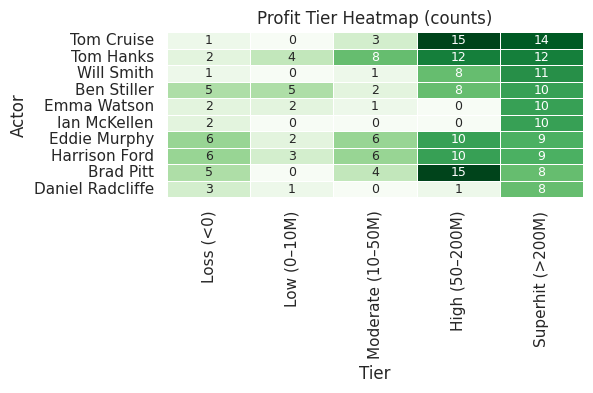

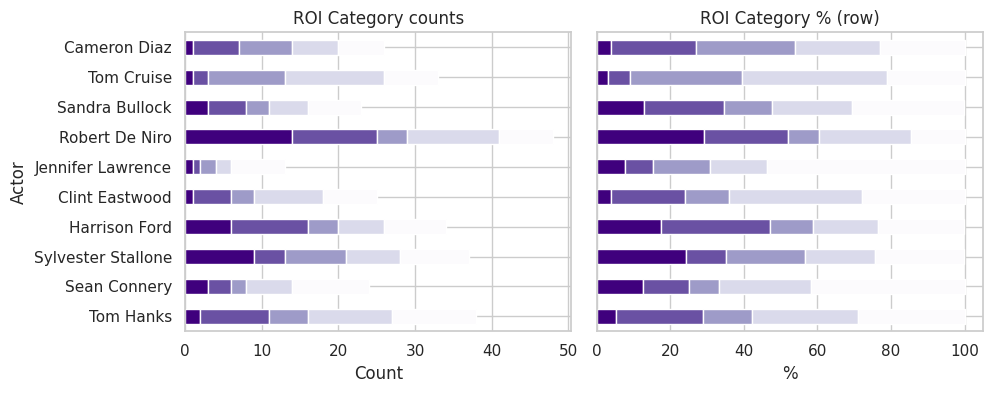

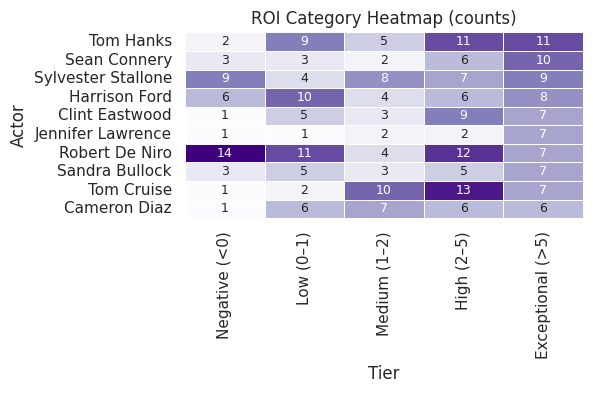

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Filter rows with all three actor columns non-null
actor_cols = ['Lead Actor', '2nd Actor', '3rd Actor']
df_actors = df.dropna(subset=actor_cols)

# 3. Melt into one “Actor” column
df_melt = df_actors.melt(
    id_vars=['Revenue Tier', 'Profit Tier', 'ROI Category'],
    value_vars=actor_cols,
    var_name='Role',
    value_name='Actor'
)

# Define tier orders
rev_order = ['Small (<10M)', 'Mid‑range (10–50M)', 'Large (50–200M)', 'Blockbuster (>200M)']
prof_order = ['Loss (<0)', 'Low (0–10M)', 'Moderate (10–50M)', 'High (50–200M)', 'Superhit (>200M)']
roi_order  = ['Negative (<0)', 'Low (0–1)', 'Medium (1–2)', 'High (2–5)', 'Exceptional (>5)']

# Function to compute counts and percentages
def tier_stats(df, tier_col, order):
    counts = pd.crosstab(df['Actor'], df[tier_col]).reindex(columns=order).fillna(0).astype(int)
    percents = counts.div(counts.sum(axis=1), axis=0).multiply(100).round(1)
    return counts, percents

# 4. Compute for each tier type
rev_counts, rev_perc = tier_stats(df_melt, 'Revenue Tier', rev_order)
prof_counts, prof_perc = tier_stats(df_melt, 'Profit Tier', prof_order)
roi_counts,  roi_perc  = tier_stats(df_melt, 'ROI Category', roi_order)

# 5. Identify top 10 actors by blockbuster appearances
top_rev_actors  = rev_counts['Blockbuster (>200M)'].nlargest(10).index
top_prof_actors = prof_counts['Superhit (>200M)'].nlargest(10).index
top_roi_actors  = roi_perc['Exceptional (>5)'].nlargest(10).index

# 6. Print data for insights
print("=== Top 10 Actors by Blockbuster Count ===\n", rev_counts.loc[top_rev_actors])
print("\n=== Their Revenue Tier % ===\n", rev_perc.loc[top_rev_actors])
print("\n=== Top 10 Actors by Superhit Profit Count ===\n", prof_counts.loc[top_prof_actors])
print("\n=== Their Profit Tier % ===\n", prof_perc.loc[top_prof_actors])
print("\n=== Top 10 Actors by Exceptional ROI % ===\n", roi_perc.loc[top_roi_actors])

# 7. Plotting settings
sns.set_theme(style='whitegrid')
plt.rc('font', size=9)

def plot_tier_bars(counts, percents, order, title, cmap):
    top = counts[order[-1]].nlargest(10).index
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    # count-based
    counts.loc[top, order].plot(
        kind='barh', stacked=True, ax=axes[0], cmap=cmap, legend=False
    )
    axes[0].set_title(f"{title} counts")
    axes[0].set_xlabel("Count")
    # %-based
    percents.loc[top, order].plot(
        kind='barh', stacked=True, ax=axes[1], cmap=cmap, legend=False
    )
    axes[1].set_title(f"{title} % (row)")
    axes[1].set_xlabel("%")
    plt.tight_layout()
    plt.show()

def plot_tier_heatmap(counts, order, title, cmap):
    top = counts[order[-1]].nlargest(10).index
    plt.figure(figsize=(6, 4))
    sns.heatmap(
        counts.loc[top, order],
        annot=True, fmt='d', cmap=cmap,
        cbar=False, linewidths=0.5
    )
    plt.title(f"{title} Heatmap (counts)")
    plt.ylabel("Actor")
    plt.xlabel("Tier")
    plt.tight_layout()
    plt.show()

# 8. Visualizations
plot_tier_bars(rev_counts, rev_perc, rev_order,  "Revenue Tier", "Blues_r")
plot_tier_heatmap(rev_counts, rev_order, "Revenue Tier", "Blues")

plot_tier_bars(prof_counts, prof_perc, prof_order, "Profit Tier",   "Greens_r")
plot_tier_heatmap(prof_counts, prof_order, "Profit Tier",   "Greens")

plot_tier_bars(roi_counts, roi_perc, roi_order,   "ROI Category", "Purples_r")
plot_tier_heatmap(roi_counts, roi_order,   "ROI Category", "Purples")


Top 10 Digital Era Actors by Blockbuster Count:


Revenue Tier,Small (<10M),Mid‑range (10–50M),Large (50–200M),Blockbuster (>200M)
Actor,,,,
Dwayne Johnson,1,1,2,8
Jennifer Lawrence,2,1,1,8
Josh Hutcherson,1,1,0,6
Michael Fassbender,1,6,2,6
Adam Sandler,0,0,3,5
Anne Hathaway,1,0,2,5
Bradley Cooper,0,4,2,5
Johnny Depp,0,2,3,5
Kristen Wiig,1,1,2,5



Their Revenue Tier %:


Revenue Tier,Small (<10M),Mid‑range (10–50M),Large (50–200M),Blockbuster (>200M)
Actor,,,,
Dwayne Johnson,8.3,8.3,16.7,66.7
Jennifer Lawrence,16.7,8.3,8.3,66.7
Josh Hutcherson,12.5,12.5,0.0,75.0
Michael Fassbender,6.7,40.0,13.3,40.0
Adam Sandler,0.0,0.0,37.5,62.5
Anne Hathaway,12.5,0.0,25.0,62.5
Bradley Cooper,0.0,36.4,18.2,45.5
Johnny Depp,0.0,20.0,30.0,50.0
Kristen Wiig,11.1,11.1,22.2,55.6



Top 10 Digital Era Actors by Superhit Profit Count:


Profit Tier,Loss (<0),Low (0–10M),Moderate (10–50M),High (50–200M),Superhit (>200M)
Actor,,,,,
Dwayne Johnson,1,1,0,3,7
Jennifer Lawrence,1,1,2,3,5
Josh Hutcherson,2,0,0,1,5
Kristen Wiig,1,1,0,2,5
Liam Hemsworth,3,1,0,0,5
Robert Downey Jr.,0,0,1,0,5
Vin Diesel,0,0,0,2,5
Chris Evans,0,0,3,0,4
Chris Hemsworth,3,0,2,1,4



Their Profit Tier %:


Profit Tier,Loss (<0),Low (0–10M),Moderate (10–50M),High (50–200M),Superhit (>200M)
Actor,,,,,
Dwayne Johnson,8.3,8.3,0.0,25.0,58.3
Jennifer Lawrence,8.3,8.3,16.7,25.0,41.7
Josh Hutcherson,25.0,0.0,0.0,12.5,62.5
Kristen Wiig,11.1,11.1,0.0,22.2,55.6
Liam Hemsworth,33.3,11.1,0.0,0.0,55.6
Robert Downey Jr.,0.0,0.0,16.7,0.0,83.3
Vin Diesel,0.0,0.0,0.0,28.6,71.4
Chris Evans,0.0,0.0,42.9,0.0,57.1
Chris Hemsworth,30.0,0.0,20.0,10.0,40.0



Top 10 Digital Era Actors by Exceptional ROI %:


ROI Category,Negative (<0),Low (0–1),Medium (1–2),High (2–5),Exceptional (>5)
Actor,,,,,
Aadukalam Naren,0.0,0.0,0.0,0.0,100.0
Aamir Khan,0.0,0.0,0.0,0.0,100.0
Adam Levine,0.0,0.0,0.0,0.0,100.0
Adam Trese,0.0,0.0,0.0,0.0,100.0
Aditya Roy Kapoor,0.0,0.0,0.0,0.0,100.0
Aftab Shivdasani,0.0,0.0,0.0,0.0,100.0
Agata Kulesza,0.0,0.0,0.0,0.0,100.0
Agata Trzebuchowska,0.0,0.0,0.0,0.0,100.0
Ajay Devgn,0.0,0.0,0.0,0.0,100.0


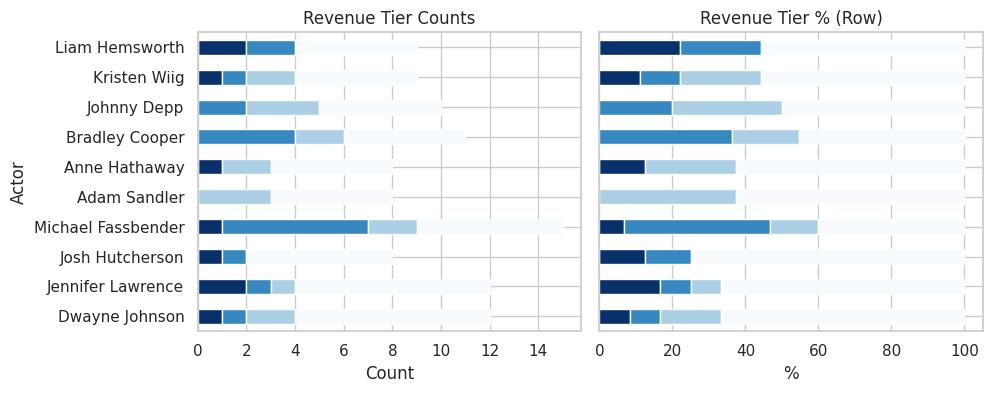

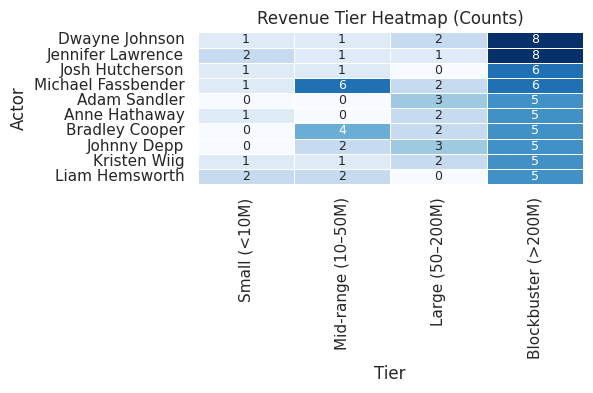

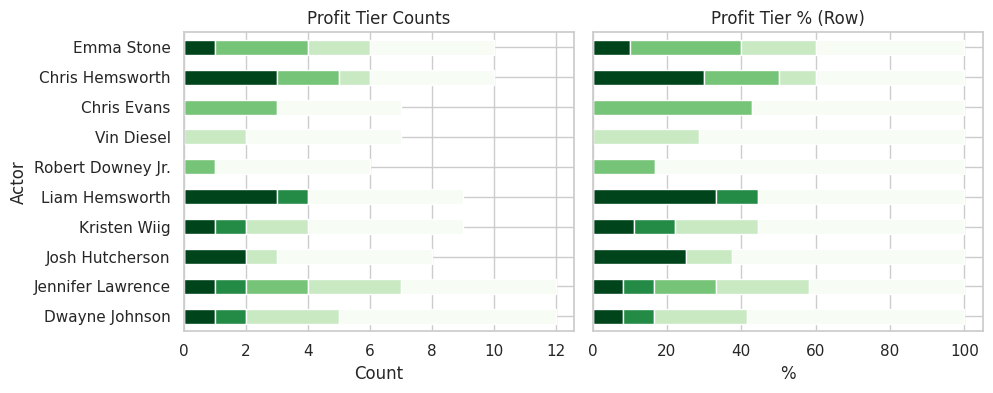

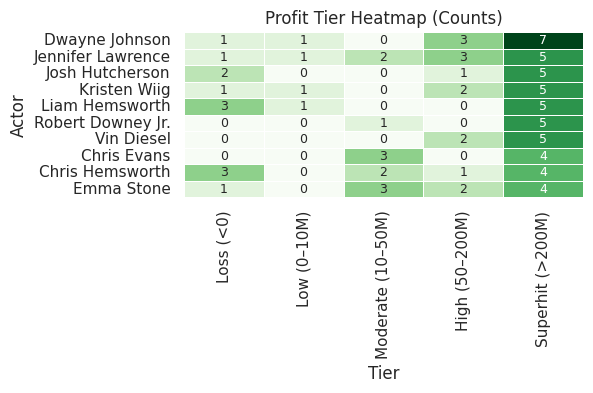

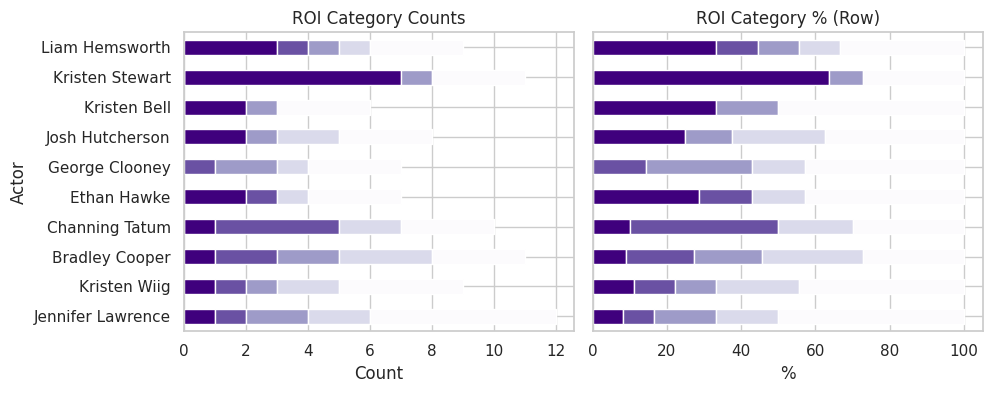

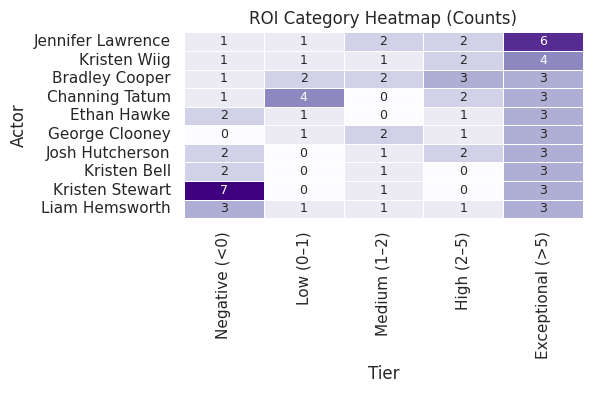

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Filter rows with all three actor columns non-null and Digital Era only
actor_cols = ['Lead Actor', '2nd Actor', '3rd Actor']
df_de = df.dropna(subset=actor_cols)
df_de = df_de[df_de['Era'] == 'Digital Era']

# 3. Melt into one “Actor” column
df_melt = df_de.melt(
    id_vars=['Revenue Tier', 'Profit Tier', 'ROI Category'],
    value_vars=actor_cols,
    var_name='Role',
    value_name='Actor'
)

# 4. Define tier orders
rev_order = ['Small (<10M)', 'Mid‑range (10–50M)', 'Large (50–200M)', 'Blockbuster (>200M)']
prof_order = ['Loss (<0)', 'Low (0–10M)', 'Moderate (10–50M)', 'High (50–200M)', 'Superhit (>200M)']
roi_order  = ['Negative (<0)', 'Low (0–1)', 'Medium (1–2)', 'High (2–5)', 'Exceptional (>5)']

# 5. Compute counts and percentages
def tier_stats(df, tier_col, order):
    counts = pd.crosstab(df['Actor'], df[tier_col]).reindex(columns=order).fillna(0).astype(int)
    percents = counts.div(counts.sum(axis=1), axis=0).multiply(100).round(1)
    return counts, percents

rev_counts, rev_perc = tier_stats(df_melt, 'Revenue Tier', rev_order)
prof_counts, prof_perc = tier_stats(df_melt, 'Profit Tier', prof_order)
roi_counts,  roi_perc  = tier_stats(df_melt, 'ROI Category', roi_order)

# 6. Select top 10 actors by Blockbuster count in Digital Era
top_rev_actors  = rev_counts['Blockbuster (>200M)'].nlargest(10).index
top_prof_actors = prof_counts['Superhit (>200M)'].nlargest(10).index
top_roi_actors  = roi_perc['Exceptional (>5)'].nlargest(10).index

# 7. Display tables for insight
print("Top 10 Digital Era Actors by Blockbuster Count:")
display(rev_counts.loc[top_rev_actors])
print("\nTheir Revenue Tier %:")
display(rev_perc.loc[top_rev_actors])

print("\nTop 10 Digital Era Actors by Superhit Profit Count:")
display(prof_counts.loc[top_prof_actors])
print("\nTheir Profit Tier %:")
display(prof_perc.loc[top_prof_actors])

print("\nTop 10 Digital Era Actors by Exceptional ROI %:")
display(roi_perc.loc[top_roi_actors])

# 8. Plotting settings
sns.set_theme(style='whitegrid')
plt.rc('font', size=9)

def plot_tier_bars(counts, percents, order, title, cmap):
    top = counts[order[-1]].nlargest(10).index
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    counts.loc[top, order].plot(
        kind='barh', stacked=True, ax=axes[0], cmap=cmap, legend=False
    )
    axes[0].set_title(f"{title} Counts")
    axes[0].set_xlabel("Count")
    percents.loc[top, order].plot(
        kind='barh', stacked=True, ax=axes[1], cmap=cmap, legend=False
    )
    axes[1].set_title(f"{title} % (Row)")
    axes[1].set_xlabel("%")
    plt.tight_layout()
    plt.show()

def plot_tier_heatmap(counts, order, title, cmap):
    top = counts[order[-1]].nlargest(10).index
    plt.figure(figsize=(6, 4))
    sns.heatmap(
        counts.loc[top, order],
        annot=True, fmt='d', cmap=cmap,
        cbar=False, linewidths=0.5
    )
    plt.title(f"{title} Heatmap (Counts)")
    plt.ylabel("Actor")
    plt.xlabel("Tier")
    plt.tight_layout()
    plt.show()

# 9. Generate visualizations
plot_tier_bars(rev_counts, rev_perc, rev_order,  "Revenue Tier", "Blues_r")
plot_tier_heatmap(rev_counts, rev_order, "Revenue Tier", "Blues")

plot_tier_bars(prof_counts, prof_perc, prof_order, "Profit Tier",   "Greens_r")
plot_tier_heatmap(prof_counts, prof_order, "Profit Tier",   "Greens")

plot_tier_bars(roi_counts, roi_perc, roi_order,   "ROI Category", "Purples_r")
plot_tier_heatmap(roi_counts, roi_order,   "ROI Category", "Purples")


In [ ]:
import pandas as pd

# 1. Read Final 8 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
df = pd.read_excel(file_path)

# 2. Keep rows where all three actor columns are non-null
actor_df = df.dropna(subset=['Lead Actor', '2nd Actor', '3rd Actor'])

# 3. Melt the three actor columns into one
melted = actor_df.melt(
    id_vars=['Revenue Tier', 'ROI Category'],
    value_vars=['Lead Actor', '2nd Actor', '3rd Actor'],
    var_name='Role',
    value_name='Actor'
)

# 4. Count appearances by Actor × Revenue Tier
rev_counts = (
    melted
    .groupby(['Actor', 'Revenue Tier'])
    .size()
    .unstack(fill_value=0)
)

# 5. Count appearances by Actor × ROI Category
roi_counts = (
    melted
    .groupby(['Actor', 'ROI Category'])
    .size()
    .unstack(fill_value=0)
)

# 6. Combine into one table
actors_summary = pd.concat([rev_counts, roi_counts], axis=1).fillna(0).astype(int)

# 7. Reorder columns
col_order = [
    'Blockbuster (>200M)',
    'Large (50–200M)',
    'Mid‑range (10–50M)',
    'Small (<10M)',
    'Exceptional (>5)',
    'High (2–5)',
    'Medium (1–2)',
    'Low (0–1)',
    'Negative (<0)'
]
# ensure only existing cols are selected
actors_summary = actors_summary[[c for c in col_order if c in actors_summary.columns]]

# 8. Compute Points
weights = {
    'Blockbuster (>200M)': 4,
    'Large (50–200M)': 3,
    'Mid‑range (10–50M)': 2,
    'Small (<10M)': 1,
    'Exceptional (>5)': 4,
    'High (2–5)': 3,
    'Medium (1–2)': 2,
    'Low (0–1)': 1,
    'Negative (<0)': -1
}
actors_summary['Points'] = sum(
    actors_summary[col] * w for col, w in weights.items() if col in actors_summary.columns
)

# 9. Sort by Points desc, then Blockbuster desc, then Exceptional ROI desc, etc.
sort_order = ['Points', 'Blockbuster (>200M)', 'Exceptional (>5)']
actors_summary = actors_summary.sort_values(
    by=[c for c in sort_order if c in actors_summary.columns],
    ascending=False
)

# 10. Save to "Actors 1.xlsx"
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Actors 1.xlsx'
actors_summary.to_excel(out_path, index=True)

# 11. Print Points stats
print(actors_summary['Points'].describe())


count    5196.000000
mean       10.454965
std        18.065161
min         0.000000
25%         3.000000
50%         6.000000
75%        10.000000
max       216.000000
Name: Points, dtype: float64


In [ ]:
import pandas as pd

# 1. Read Actors 1 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Actors 1.xlsx'
df = pd.read_excel(file_path)

# 2. Define the new tier based on Points
def assign_tier(points):
    if points >= 50:
        return 'Elite'
    elif points >= 20:
        return 'Pro'
    elif points >= 10:
        return 'Rising'
    else:
        return 'Novice'

df['Director Tiers'] = df['Points'].apply(assign_tier)

# 3. Convert to categorical with the desired order
tier_order = ['Elite', 'Pro', 'Rising', 'Novice']
df['Director Tiers'] = pd.Categorical(df['Director Tiers'], categories=tier_order, ordered=True)

# 4. Sort: by tier (Elite→Novice), then Points desc, then Blockbuster desc, then Exceptional ROI desc
df_sorted = df.sort_values(
    by=['Director Tiers', 'Points', 'Blockbuster (>200M)', 'Exceptional (>5)'],
    ascending=[True, False, False, False]
)

# 5. Save to Actors 2
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Actors 2.xlsx'
df_sorted.to_excel(out_path, index=False)

# 6. Count how many actors in each tier, in the specified order
tier_counts = df_sorted['Director Tiers'].value_counts().reindex(tier_order)
print(tier_counts)


Director Tiers
Elite      204
Pro        435
Rising     706
Novice    3851
Name: count, dtype: int64


<ipython-input-20-77fccc09452b>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


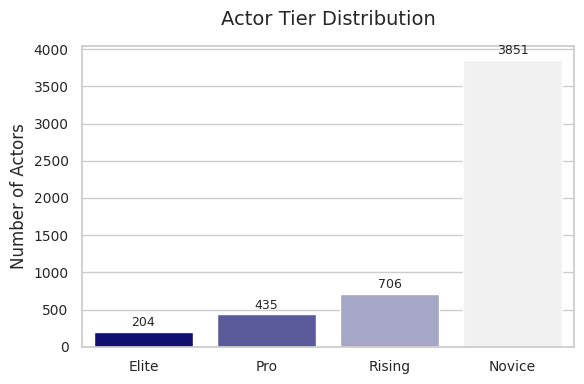

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Read Actors 2 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Actors 2.xlsx'
df = pd.read_excel(file_path)

# 2. Count actors in each tier (ordered)
tier_order = ['Elite', 'Pro', 'Rising', 'Novice']
counts = df['Director Tiers'].value_counts().reindex(tier_order)

# 3. Plot settings for a soothing look
sns.set_theme(style='whitegrid')
plt.figure(figsize=(6,4))
palette = sns.light_palette("navy", n_colors=4, reverse=True)

# 4. Barplot
ax = sns.barplot(
    x=counts.index,
    y=counts.values,
    palette=palette
)

# 5. Annotations & styling
for i, v in enumerate(counts.values):
    ax.text(i, v + counts.max()*0.01, str(v),
            ha='center', va='bottom', fontsize=9)

ax.set_title('Actor Tier Distribution', fontsize=14, pad=15)
ax.set_xlabel('')
ax.set_ylabel('Number of Actors', fontsize=12)
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# 1. Read Final 8 and Directors 5
final8_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 8.xlsx'
dir5_path   = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Directors 5.xlsx'

df8 = pd.read_excel(final8_path)
d5  = pd.read_excel(dir5_path)

# 2. Extract and rename the two columns
director_info = (
    d5[['Director', 'Director Tiers', 'Points']]
    .rename(columns={
        'Director Tiers': 'Director Tier',
        'Points':         'Director Points'
    })
)

# 3. Merge onto Final 8
df9 = df8.merge(director_info, on='Director', how='left')

# 4. Reorder so the new cols sit immediately after 'Director'
cols = list(df9.columns)
# remove the new cols from original list
cols.remove('Director Tier')
cols.remove('Director Points')
# find position of 'Director'
idx = cols.index('Director') + 1
# insert the new cols
for offset, col in enumerate(['Director Tier', 'Director Points']):
    cols.insert(idx + offset, col)

df9 = df9[cols]

# 5. Save as Final 9.xlsx
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 9.xlsx'
df9.to_excel(out_path, index=False)


In [ ]:
import pandas as pd

# 1. Read Final 9 and Actors 2
final9_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 9.xlsx'
actors2_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Actors 2.xlsx'

df9     = pd.read_excel(final9_path)
actors2 = pd.read_excel(actors2_path)

# 2. Build mapping dicts from Actors 2
#    Assuming actors2 has columns 'Actor', 'Director Tiers' (the tier) and 'Points'
actor_to_tier  = dict(zip(actors2['Actor'], actors2['Director Tiers']))
actor_to_points = dict(zip(actors2['Actor'], actors2['Points']))

# 3. Map Lead Actor → Lead Actor Tier & Points
df9['Lead Actor Tier']  = df9['Lead Actor'].map(actor_to_tier)
df9['Lead Actor Points']= df9['Lead Actor'].map(actor_to_points)

# 4. Compute Highest Actor Tier and Total Actor Points
tier_order = ['Elite','Pro','Rising','Novice']  # highest first

def pick_best_tier(row):
    # gather the three actors' tiers
    tiers = [actor_to_tier.get(a) for a in (row['Lead Actor'], row['2nd Actor'], row['3rd Actor'])]
    for t in tier_order:
        if t in tiers:
            return t
    return None

def sum_actor_points(row):
    pts = [
        actor_to_points.get(row['Lead Actor'], 0),
        actor_to_points.get(row['2nd Actor'],   0),
        actor_to_points.get(row['3rd Actor'],   0)
    ]
    return sum(pts)

df9['Highest Actor Tier'] = df9.apply(pick_best_tier, axis=1)
df9['Total Actor Points']= df9.apply(sum_actor_points, axis=1)

# 5. Reorder so new columns follow Lead Actor and 3rd Actor
cols = list(df9.columns)
# remove new cols
for c in ['Lead Actor Tier','Lead Actor Points','Highest Actor Tier','Total Actor Points']:
    cols.remove(c)
# insert after 'Lead Actor'
i = cols.index('Lead Actor') + 1
cols[i:i] = ['Lead Actor Tier','Lead Actor Points']
# insert after '3rd Actor'
j = cols.index('3rd Actor') + 1
cols[j:j] = ['Highest Actor Tier','Total Actor Points']

df10 = df9[cols]

# 6. Save as Final 10
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 10.xlsx'
df10.to_excel(out_path, index=False)


In [ ]:
import pandas as pd

# 1. Read Final 10 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 10.xlsx'
df = pd.read_excel(file_path)

# 2. Filter to rows with a valid Series
df_series = df.dropna(subset=['Series'])

# 3. Count Revenue Tier occurrences per Series
rev_counts = df_series.groupby('Series')['Revenue Tier'] \
    .value_counts().unstack(fill_value=0)

# 4. Count ROI Category occurrences per Series
roi_counts = df_series.groupby('Series')['ROI Category'] \
    .value_counts().unstack(fill_value=0)

# 5. Combine into one DataFrame
series_summary = pd.concat([rev_counts, roi_counts], axis=1).fillna(0).astype(int)

# 6. Reorder columns
rev_order = ["Blockbuster (>200M)", "Large (50–200M)", "Mid‑range (10–50M)", "Small (<10M)"]
roi_order = ["Exceptional (>5)", "High (2–5)", "Medium (1–2)", "Low (0–1)", "Negative (<0)"]
cols = rev_order + roi_order
series_summary = series_summary.reindex(columns=cols).fillna(0)

# 7. Calculate Points
points_map = {
    "Blockbuster (>200M)": 4,
    "Large (50–200M)": 3,
    "Mid‑range (10–50M)": 2,
    "Small (<10M)": 1,
    "Exceptional (>5)": 4,
    "High (2–5)": 3,
    "Medium (1–2)": 2,
    "Low (0–1)": 1,
    "Negative (<0)": -1
}
series_summary['Points'] = sum(series_summary[col] * pts for col, pts in points_map.items())

# 8. Sort by Points desc, then Blockbuster, then Exceptional ROI
series_summary = series_summary.sort_values(
    by=['Points', 'Blockbuster (>200M)', 'Exceptional (>5)'],
    ascending=[False, False, False]
)

# 9. Show Points statistics
stats = series_summary['Points'].describe()
print(stats)

# 10. Save to "Series 1.xlsx"
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Series 1.xlsx'
series_summary.to_excel(out_path, index=True)


count    576.000000
mean      10.635417
std       11.489688
min        0.000000
25%        5.000000
50%        7.000000
75%       13.000000
max      178.000000
Name: Points, dtype: float64


In [ ]:
import pandas as pd

# 1. Read Series 1 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Series 1.xlsx'
df = pd.read_excel(file_path)

# 2. Define the new tier based on Points
def assign_series_tier(points):
    if points >= 25:
        return 'Blockbuster'
    elif points >= 15:
        return 'Hit'
    elif points >= 8:
        return 'Good'
    else:
        return 'Emerging'

df['Series Tiers'] = df['Points'].apply(assign_series_tier)

# 3. Convert to ordered categorical
tier_order = ['Blockbuster', 'Hit', 'Good', 'Emerging']
df['Series Tiers'] = pd.Categorical(df['Series Tiers'], categories=tier_order, ordered=True)

# 4. Sort: by tier, then Points desc, then Blockbuster count, then Exceptional ROI count
df_sorted = df.sort_values(
    by=['Series Tiers', 'Points', 'Blockbuster (>200M)', 'Exceptional (>5)'],
    ascending=[True, False, False, False]
)

# 5. Save to Series 2
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Series 2.xlsx'
df_sorted.to_excel(out_path, index=False)

# 6. Print counts per tier
tier_counts = df_sorted['Series Tiers'].value_counts().reindex(tier_order)
print(tier_counts)


Series Tiers
Blockbuster     42
Hit             71
Good           166
Emerging       297
Name: count, dtype: int64


<ipython-input-27-3732ba2c69d0>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


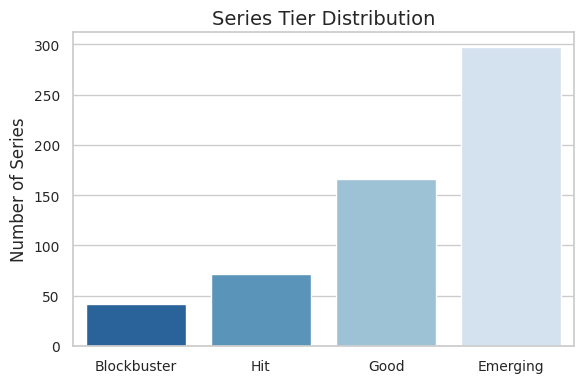

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Read Series 2 (tiered) file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Series 2.xlsx'
df = pd.read_excel(file_path)

# 2. Compute tier counts in the desired order
tier_order = ['Blockbuster','Hit','Good','Emerging']
counts = df['Series Tiers'].value_counts().reindex(tier_order)

# 3. Plot a soothing vertical bar chart
sns.set_theme(style='whitegrid')
plt.figure(figsize=(6, 4))
sns.barplot(
    x=counts.index,
    y=counts.values,
    palette=sns.color_palette("Blues_r", n_colors=len(tier_order))
)
plt.title('Series Tier Distribution', fontsize=14)
plt.ylabel('Number of Series', fontsize=12)
plt.xlabel('')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# 1. Read Final 10 and Series 2 files
final10_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 10.xlsx'
series2_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Series 2.xlsx'
df = pd.read_excel(final10_path)
df_series = pd.read_excel(series2_path)

# 2. Build a lookup from Series → (Tier, Points)
series_lookup = df_series.set_index('Series')[['Series Tiers', 'Points']]

# 3. Merge Tier and raw Points into df
df = df.merge(
    series_lookup,
    how='left',
    left_on='Series',
    right_index=True
).rename(columns={
    'Series Tiers': 'Series Tier',
    'Points': 'Series Points Raw'
})

# 4. Compute the adjusted Series Points
def compute_series_points(row):
    pts = row['Series Points Raw']
    flag = row['Series or not']
    return pts * flag if pts != 0 else pts + flag

df['Series Points'] = df.apply(compute_series_points, axis=1)

# 5. Drop the temporary raw column
df = df.drop(columns=['Series Points Raw'])

# 6. Insert the two new columns immediately after 'Series'
cols = df.columns.tolist()
insert_at = cols.index('Series') + 1
for col in ['Series Tier', 'Series Points'][::-1]:
    cols.insert(insert_at, col)
# Remove duplicates caused by insert
cols = [c for i, c in enumerate(cols) if cols.index(c) == i]
df = df[cols]

# 7. Save as Final 11
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 11.xlsx'
df.to_excel(out_path, index=False)


In [ ]:
import pandas as pd

# 1. Read Final 10 and Series 2 files
final10_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 10.xlsx'
series2_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Series 2.xlsx'
df = pd.read_excel(final10_path)
df_series = pd.read_excel(series2_path)

# 2. Build lookup of Series → (Tier, Points)
series_lookup = df_series.set_index('Series')[['Series Tiers', 'Points']]

# 3. Merge lookup into df
df = df.merge(
    series_lookup,
    how='left',
    left_on='Series',
    right_index=True
).rename(columns={
    'Series Tiers': 'Series Tier',
    'Points': 'Series Points Raw'
})

# 4. Compute adjusted Series Points
def compute_series_points(row):
    raw = row['Series Points Raw']
    flag = row['Series or not']
    # if no raw value, fallback to flag (0/1) or leave blank
    if pd.isna(raw):
        if pd.isna(flag):
            return pd.NA
        return flag
    # raw present
    if raw != 0:
        return raw * flag
    return raw + flag

df['Series Points'] = df.apply(compute_series_points, axis=1)

# 5. Drop the temporary raw column
df = df.drop(columns=['Series Points Raw'])

# 6. Insert the two new columns immediately after 'Series'
cols = df.columns.tolist()
pos = cols.index('Series') + 1
for new_col in ['Series Tier', 'Series Points'][::-1]:
    cols.insert(pos, new_col)
# remove any duplicates
cols = [c for i, c in enumerate(cols) if cols.index(c) == i]
df = df[cols]

# 7. Save as Final 11
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Final 11.xlsx'
df.to_excel(out_path, index=False)


# Data Modeling Prep

In [ ]:
import pandas as pd

# 1. Read Model 2 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 2.xlsx'
df_model2 = pd.read_excel(file_path)

# 2. Display basic dataframe info
print("DataFrame Info:")
df_model2.info()

# 3. Check for missing values
missing_counts = df_model2.isnull().sum()
print("\nMissing Values per Column:")
print(missing_counts)

# 5. Summary statistics for numeric columns
print("\nNumeric Summary:")
display(df_model2.describe())

# 6. Unique counts for categorical columns
cat_cols = df_model2.select_dtypes(include=['object', 'category']).columns
print("\nCategorical Column Unique Value Counts:")
for col in cat_cols:
    print(f"{col}: {df_model2[col].nunique()} unique values")


DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5312 entries, 0 to 5311
Data columns (total 61 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Title                 5312 non-null   object        
 1   ID                    4867 non-null   float64       
 2   IMDb ID               4867 non-null   object        
 3   Series or not         4867 non-null   float64       
 4   Series                1124 non-null   object        
 5   Series Tier           1124 non-null   object        
 6   Series Points         4867 non-null   float64       
 7   Language              4867 non-null   object        
 8   Country               4867 non-null   object        
 9   Studio                4867 non-null   object        
 10  Director              4840 non-null   object        
 11  Director Tier         4840 non-null   object        
 12  Director Points       4840 non-null   float64       
 13  Le

,ID,Series or not,Series Points,Director Points,Lead Actor Points,Total Actor Points,Runtime,Genre_Action,Genre_Adventure,Genre_Animation,...,Release Year,Release Month,Release Month-Date,Budget,Revenue,Profit,ROI,IMDb Rating,IMDb Votes,IMDb Popularity
count,4867.000000,4867.000000,4867.000000,4840.000000,4831.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,...,5312.000000,5312.000000,5312.000000,5.312000e+03,5.312000e+03,5.312000e+03,5312.000000,4867.000000,4867.000000,4867.000000
mean,55931.644545,0.230943,4.595439,21.427479,54.143242,99.523720,110.061182,0.266943,0.181664,0.056664,...,2000.102598,6.943336,15.399473,3.206163e+07,9.408160e+07,6.201997e+07,7.963634,6.259667,782.811383,10.234280
min,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1915.000000,1.000000,1.000000,2.500000e+03,1.404000e+03,-1.657101e+08,-0.999790,0.000000,0.000000,0.000657
25%,8288.000000,0.000000,0.000000,5.000000,12.000000,27.000000,95.000000,0.000000,0.000000,0.000000,...,1994.000000,4.000000,8.000000,6.000000e+06,7.883957e+06,-1.439310e+06,-0.196324,5.700000,94.000000,5.932002
50%,13448.000000,0.000000,0.000000,14.000000,39.000000,78.000000,106.000000,0.000000,0.000000,0.000000,...,2005.000000,7.000000,15.000000,1.800000e+07,3.152743e+07,1.217670e+07,1.076918,6.300000,307.000000,8.722406
75%,51945.500000,0.000000,0.000000,29.000000,81.500000,157.000000,120.000000,1.000000,0.000000,0.000000,...,2011.000000,10.000000,22.000000,4.000000e+07,1.028870e+08,6.572904e+07,3.257029,6.900000,872.000000,11.998189
max,443319.000000,1.000000,178.000000,188.000000,216.000000,471.000000,338.000000,1.000000,1.000000,1.000000,...,2017.000000,12.000000,31.000000,3.800000e+08,2.787965e+09,2.550965e+09,12889.386667,9.100000,14075.000000,547.488298
std,90938.639557,0.421479,15.725531,25.646203,50.511075,86.863865,22.043217,0.442404,0.385604,0.231222,...,15.527838,3.384091,8.506494,4.086088e+07,1.721883e+08,1.448479e+08,189.461751,0.893130,1290.626543,14.357270



Categorical Column Unique Value Counts:
Title: 5209 unique values
IMDb ID: 4855 unique values
Series: 576 unique values
Series Tier: 4 unique values
Language: 13 unique values
Country: 23 unique values
Studio: 18 unique values
Director: 2084 unique values
Director Tier: 4 unique values
Lead Actor: 1868 unique values
Lead Actor Tier: 4 unique values
2nd Actor: 2574 unique values
3rd Actor: 3060 unique values
Highest Actor Tier: 4 unique values
Runtime_bin: 3 unique values
Era: 8 unique values
Season: 8 unique values
Holidays: 6 unique values
Release Day: 7 unique values
Budget Tier: 4 unique values
Revenue Tier: 4 unique values
Profit Tier: 5 unique values
ROI Category: 5 unique values


In [ ]:
import pandas as pd

# 1. Read Model 2 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 2.xlsx'
df = pd.read_excel(file_path)

# 2. Drop rows with missing values in the specified columns
cols_to_check = ['Series Points', 'Language', 'Country', 'Studio']
df_clean = df.dropna(subset=cols_to_check)

# 3. Save the cleaned DataFrame as Model 3
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 3.xlsx'
df_clean.to_excel(out_path, index=False)

# 4. Report missing values per column
missing_counts = df_clean.isna().sum()
print(missing_counts)


Title                 0
ID                    0
IMDb ID               0
Series or not         0
Series             3743
                   ... 
ROI                   0
ROI Category          0
IMDb Rating           0
IMDb Votes            0
IMDb Popularity       0
Length: 61, dtype: int64


In [ ]:
# 4. Report only columns that still have missing values
missing_counts = df_clean.isna().sum()
missing_counts = missing_counts[missing_counts > 0]
print(missing_counts)


Series                3743
Series Tier           3743
Director                27
Director Tier           27
Director Points         27
Lead Actor              31
Lead Actor Tier         36
Lead Actor Points       36
2nd Actor               39
3rd Actor               42
Highest Actor Tier      36
Holidays              3285
dtype: int64


In [ ]:
import pandas as pd

# 1. Read Model 3 file
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 3.xlsx'
df = pd.read_excel(file_path)

# 2. Identify columns with any missing values
missing_cols = df.columns[df.isna().any()].tolist()
print("Columns with missing values before fill:", missing_cols)

# 3. Fill all NaNs in those columns with 0
df[missing_cols] = df[missing_cols].fillna(0)

# 4. Recount missing values to verify
missing_counts_after = df.isna().sum()
print("Missing values per column after fill:\n", missing_counts_after[missing_counts_after > 0])


Columns with missing values before fill: ['Series', 'Series Tier', 'Director', 'Director Tier', 'Director Points', 'Lead Actor', 'Lead Actor Tier', 'Lead Actor Points', '2nd Actor', '3rd Actor', 'Highest Actor Tier', 'Holidays']
Missing values per column after fill:
 Series([], dtype: int64)


In [ ]:
# 5. Save the cleaned DataFrame as Model 4
out_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 4.xlsx'
df.to_excel(out_path, index=False)


In [ ]:
import pandas as pd

# 1. Load the Model 5 dataset
file_path_5 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 5.xlsx'
df5 = pd.read_excel(file_path_5)

# 2. Define the six categorical blocks to one‑hot encode
cat_cols = ['Language', 'Country', 'Studio', 'Season', 'Holidays', 'Release Day']

# 3. Perform one‑hot encoding with drop_first=True (k‑1 rule) and integer dummies
df6 = pd.get_dummies(df5, columns=cat_cols, drop_first=True, dtype=int)

# 4. Verify that each block produced (levels – 1) dummy columns
print("Verification of k–1 dummies per categorical block:\n")
for col in cat_cols:
    levels = df5[col].nunique()
    dummies = [c for c in df6.columns if c.startswith(col + '_')]
    print(f"{col:12s}: {levels:2d} levels → {len(dummies):2d} dummies")

# 5. (Optional) Check new shape
print(f"\nOriginal shape: {df5.shape}")
print(f"One‑hot encoded shape: {df6.shape}")

# 6. Save out the new Model 6 file
file_path_6 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 6.xlsx'
df6.to_excel(file_path_6, index=False)


Verification of k–1 dummies per categorical block:

Language    : 13 levels → 12 dummies
Country     : 23 levels → 22 dummies
Studio      : 18 levels → 17 dummies
Season      :  8 levels →  7 dummies
Holidays    :  7 levels →  6 dummies
Release Day :  7 levels →  6 dummies

Original shape: (4867, 61)
One‑hot encoded shape: (4867, 125)


# Revenue Modeling

In [ ]:
import pandas as pd
from google.colab import drive
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

# 1. Mount drive (skip if already mounted)
drive.mount('/content/drive')

# 2. Read Model 8
file_path_8 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 8.xlsx'
df8 = pd.read_excel(file_path_8)

# 3a. Quick info
print("=== DataFrame Info ===")
df8.info()

# 3b. Missing values
print("\n=== Missing values per column ===")
print(df8.isnull().sum())

# 3c. Numeric summary
print("\n=== Numeric summary ===")
print(df8.describe())

# 4. Prepare X and y
X = df8.drop(columns=['Revenue'])
y = df8['Revenue']

# 5. Add constant for VIF calculation
X_const = sm.add_constant(X)

# 6. Compute VIFs
vif_data = pd.DataFrame({
    'feature': X_const.columns,
    'VIF': [variance_inflation_factor(X_const.values, i)
            for i in range(X_const.shape[1])]
})

# 7. Show all VIFs, then highlight those >10
print("\n=== All VIFs ===")
print(vif_data)

print("\n=== Features with VIF > 10 ===")
print(vif_data[vif_data['VIF'] > 10])


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
=== DataFrame Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4867 entries, 0 to 4866
Data columns (total 99 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   Revenue                        4867 non-null   int64
 1   Budget                         4867 non-null   int64
 2   Series Points                  4867 non-null   int64
 3   Director Points                4867 non-null   int64
 4   Lead Actor Points              4867 non-null   int64
 5   Total Actor Points             4867 non-null   int64
 6   Runtime                        4867 non-null   int64
 7   Genre_Action                   4867 non-null   int64
 8   Genre_Adventure                4867 non-null   int64
 9   Genre_Animation                4867 non-null   int64
 10  Genre_Comedy                   4867 non-

In [ ]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

# 1. Define mapping from 8 → 4 grouped seasons
season_map = {
    'Season_Spring': ['Season_Early Spring', 'Season_Late Spring'],
    'Season_Summer': ['Season_Early Summer', 'Season_Late Summer'],
    'Season_Autumn': ['Season_Early Autumn', 'Season_Late Autumn'],
    'Season_Winter': ['Season_Early Winter', 'Season_Late Winter']
}

# 2. For each season group, sum the available columns (skip any missing ones)
for new_col, old_cols in season_map.items():
    valid_cols = [col for col in old_cols if col in df8.columns]
    if valid_cols:
        df8[new_col] = df8[valid_cols].sum(axis=1).clip(upper=1)

# 3. Drop original season columns that exist
season_cols_to_drop = [col for sublist in season_map.values() for col in sublist if col in df8.columns]
df8.drop(columns=season_cols_to_drop, inplace=True)

# 4. VIF Check (excluding target)
X = df8.drop(columns=['Revenue'])
X_const = sm.add_constant(X)

vif_data = pd.DataFrame()
vif_data['feature'] = X_const.columns
vif_data['VIF'] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]

# 5. Show VIFs > 10
high_vif = vif_data[vif_data['VIF'] > 10].sort_values(by='VIF', ascending=False)

print("\n✅ Season regrouping complete.")
print("✔️ New season columns in df8:", [col for col in df8.columns if col.startswith('Season_')])
print(f"✔️ New shape: {df8.shape}")

print("\n=== VIFs > 10 ===")
print(high_vif)



✅ Season regrouping complete.
✔️ New season columns in df8: ['Season_Spring', 'Season_Summer', 'Season_Autumn', 'Season_Winter']
✔️ New shape: (4867, 96)

=== VIFs > 10 ===
                          feature           VIF
0                           const  28733.539693
30               Language_English     84.868437
33                 Language_Hindi     38.463339
28                  Release Month     38.428946
95                  Season_Winter     37.099407
81  Holidays_Christmas/New Year’s     36.507148
92                  Season_Spring     19.112061
31                Language_French     14.714450
37                 Language_Other     12.169998
62                    Country_USA     11.455870


In [ ]:
# 1. Drop Release Month
df8.drop(columns=['Release Month'], inplace=True)

# 2. Re-run VIF
X = df8.drop(columns=['Revenue'])
X_const = sm.add_constant(X)

vif_data = pd.DataFrame()
vif_data['feature'] = X_const.columns
vif_data['VIF'] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]

# 3. Show VIFs > 10
high_vif = vif_data[vif_data['VIF'] > 10].sort_values(by='VIF', ascending=False)

print("=== VIFs > 10 after dropping Release Month ===")
print(high_vif)


=== VIFs > 10 after dropping Release Month ===
             feature           VIF
0              const  28254.430062
29  Language_English     84.863249
32    Language_Hindi     38.462371
30   Language_French     14.710962
36    Language_Other     12.167359
61       Country_USA     11.453432


In [ ]:
# 1. Drop Language_English
df8.drop(columns=['Language_English'], inplace=True)

# 2. Re-run VIF
X = df8.drop(columns=['Revenue'])
X_const = sm.add_constant(X)

vif_data = pd.DataFrame()
vif_data['feature'] = X_const.columns
vif_data['VIF'] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]

# 3. Show VIFs > 10
high_vif = vif_data[vif_data['VIF'] > 10].sort_values(by='VIF', ascending=False)

print("=== VIFs > 10 after dropping Language_English ===")
print(high_vif)


=== VIFs > 10 after dropping Language_English ===
        feature           VIF
0         const  25761.077565
60  Country_USA     11.453347


In [ ]:
# Resave Model 11
file_path_11 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 11.xlsx'
df8.to_excel(file_path_11, index=False)
print(f"✅ Model 11 saved at: {file_path_11}")


✅ Model 11 saved at: /content/drive/My Drive/Colab Notebooks/804 Capstone/Model 11.xlsx


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from statsmodels.api import OLS, add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load the cleaned Model 11 dataset
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 11.xlsx'
df11 = pd.read_excel(file_path)

# 1. Define X and y
X = df11.drop(columns=['Revenue'])
y = df11['Revenue']

# 2. Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# 3. Add constant for statsmodels
X_train_const = add_constant(X_train)

# 4. Fit OLS model
ols_model = OLS(y_train, X_train_const).fit()

# 5. Summary statistics
summary = ols_model.summary()

# 6. Compute VIFs
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_const.values, i) for i in range(X_train_const.shape[1])]

(summary.as_text(), vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True))


/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


('                            OLS Regression Results                            \n==============================================================================\nDep. Variable:                Revenue   R-squared:                       0.621\nModel:                            OLS   Adj. R-squared:                  0.612\nMethod:                 Least Squares   F-statistic:                     67.76\nDate:                Sat, 19 Apr 2025   Prob (F-statistic):               0.00\nTime:                        05:20:15   Log-Likelihood:                -77491.\nNo. Observations:                3893   AIC:                         1.552e+05\nDf Residuals:                    3800   BIC:                         1.557e+05\nDf Model:                          92                                         \nCovariance Type:            nonrobust                                         \n=================================================================================================\n                   

In [ ]:
# 1. Drop high p-value columns manually
high_p_cols = [
    'Genre_Adventure', 'Genre_Comedy', 'Genre_Crime', 'Genre_Documentary',
    'Genre_Drama', 'Genre_Fantasy', 'Genre_Foreign', 'Genre_Music', 'Genre_Mystery',
    'Genre_ScienceFiction', 'Genre_Thriller', 'Genre_War',
    'Language_Danish', 'Language_French', 'Language_German', 'Language_Hindi',
    'Language_Italian', 'Language_Japanese', 'Language_Korean', 'Language_Other',
    'Language_Russian', 'Language_Spanish', 'Language_Tamil',
    'Country_Belgium', 'Country_Brazil', 'Country_Canada', 'Country_China',
    'Country_Czech Republic', 'Country_Denmark', 'Country_France', 'Country_Germany',
    'Country_Hong Kong', 'Country_Ireland', 'Country_Italy', 'Country_Japan',
    'Country_Mexico', 'Country_Netherlands', 'Country_New Zealand', 'Country_Russia',
    'Country_South Korea', 'Country_Spain', 'Country_UK', 'Country_USA',
    'Studio_Disney', 'Studio_DreamWorks', 'Studio_Orion', 'Studio_Universal',
    'Studio_Warner Bros',
    'Holidays_Christmas/New Year’s', 'Holidays_Good Friday',
    'Holidays_Labour Day', 'Holidays_Thanksgiving', 'Holidays_Victoria Day',
    'Season_Summer', 'Season_Autumn', 'Season_Winter',
    'Release Day_Monday', 'Release Day_Saturday', 'Release Day_Sunday',
    'Release Day_Thursday'
]

df_final = df11.drop(columns=high_p_cols, errors='ignore')

# 2. Check final shape
print("🧾 Final shape after dropping high p-value columns:", df_final.shape)

# 3. Refit OLS
import statsmodels.api as sm
X = df_final.drop(columns=['Revenue'])
y = df_final['Revenue']
X_const = sm.add_constant(X)
model_final = sm.OLS(y, X_const).fit()

# 4. Summary
print(model_final.summary())


🧾 Final shape after dropping high p-value columns: (4867, 34)
                            OLS Regression Results                            
Dep. Variable:                Revenue   R-squared:                       0.603
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     222.3
Date:                Sat, 19 Apr 2025   Prob (F-statistic):               0.00
Time:                        05:22:29   Log-Likelihood:                -97110.
No. Observations:                4867   AIC:                         1.943e+05
Df Residuals:                    4833   BIC:                         1.945e+05
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------

In [ ]:
import pandas as pd
import statsmodels.api as sm

# Load the last saved trimmed dataset
file_path_11 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 11.xlsx'
df = pd.read_excel(file_path_11)

# Define target and predictors
y = df['Revenue']
X = df.drop(columns=['Revenue'])

# Drop remaining insignificant predictors based on last summary
drop_cols = [
    'Genre_TVMovie', 'Studio_Touchstone', 'Studio_TriStar', 'Studio_MGM',
    'Studio_Miramax', 'Country_India', 'Country_Other', 'Release Year',
    'Genre_Horror', 'Studio_Paramount', 'Studio_New Line'
]

X_trimmed = X.drop(columns=drop_cols)

# Add constant
X_trimmed = sm.add_constant(X_trimmed)

# Fit OLS model
model = sm.OLS(y, X_trimmed).fit()

# Display summary
model_summary = model.summary()
model_summary_text = model_summary.as_text()

# Collect significant predictors (p <= 0.05)
p_values = model.pvalues
significant_predictors = p_values[p_values <= 0.05].index.tolist()

(model_summary_text, significant_predictors)


('                            OLS Regression Results                            \n==============================================================================\nDep. Variable:                Revenue   R-squared:                       0.612\nModel:                            OLS   Adj. R-squared:                  0.605\nMethod:                 Least Squares   F-statistic:                     91.98\nDate:                Sat, 19 Apr 2025   Prob (F-statistic):               0.00\nTime:                        05:27:29   Log-Likelihood:                -97054.\nNo. Observations:                4867   AIC:                         1.943e+05\nDf Residuals:                    4784   BIC:                         1.948e+05\nDf Model:                          82                                         \nCovariance Type:            nonrobust                                         \n=================================================================================================\n                   

In [ ]:
import pandas as pd
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Load Model 11
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 11.xlsx'
df = pd.read_excel(file_path)

# Define target and features
X = df.drop(columns=['Revenue'])
y = df['Revenue']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the predictors
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Ridge regression with built-in cross-validation
ridge = RidgeCV(alphas=[0.1, 1.0, 10.0, 100.0], cv=5)
ridge.fit(X_train_scaled, y_train)

# Lasso regression with built-in cross-validation
lasso = LassoCV(alphas=None, cv=5, max_iter=10000)
lasso.fit(X_train_scaled, y_train)

# Predictions and scores
ridge_train_r2 = ridge.score(X_train_scaled, y_train)
ridge_test_r2 = ridge.score(X_test_scaled, y_test)

lasso_train_r2 = lasso.score(X_train_scaled, y_train)
lasso_test_r2 = lasso.score(X_test_scaled, y_test)

ridge_mse = mean_squared_error(y_test, ridge.predict(X_test_scaled))
lasso_mse = mean_squared_error(y_test, lasso.predict(X_test_scaled))

ridge_coef = pd.Series(ridge.coef_, index=X.columns)
lasso_coef = pd.Series(lasso.coef_, index=X.columns)

ridge_best_alpha = ridge.alpha_
lasso_best_alpha = lasso.alpha_

ridge_results = {
    'alpha': ridge_best_alpha,
    'train_r2': ridge_train_r2,
    'test_r2': ridge_test_r2,
    'test_mse': ridge_mse,
    'coefficients': ridge_coef
}

lasso_results = {
    'alpha': lasso_best_alpha,
    'train_r2': lasso_train_r2,
    'test_r2': lasso_test_r2,
    'test_mse': lasso_mse,
    'coefficients': lasso_coef
}

ridge_results, lasso_results


({'alpha': np.float64(100.0),
  'train_r2': 0.6208047001454076,
  'test_r2': 0.5698251199983919,
  'test_mse': 1.6112120052099766e+16,
  'coefficients': Budget                   9.744434e+07
  Series Points            3.144561e+07
  Director Points          1.300163e+07
  Lead Actor Points       -6.622362e+06
  Total Actor Points       1.478538e+07
                               ...     
  Release Day_Wednesday    7.231635e+06
  Season_Spring            7.266050e+06
  Season_Summer            3.386975e+06
  Season_Autumn            2.558715e+06
  Season_Winter            8.630553e+05
  Length: 93, dtype: float64},
 {'alpha': np.float64(515232.74502611934),
  'train_r2': 0.6201080062850237,
  'test_r2': 0.5745518421868319,
  'test_mse': 1.593508155242544e+16,
  'coefficients': Budget                   1.032798e+08
  Series Points            3.169718e+07
  Director Points          1.241520e+07
  Lead Actor Points       -5.771339e+06
  Total Actor Points       1.276493e+07
               

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

# Load Model 11
file_path = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 11.xlsx'
df = pd.read_excel(file_path)

# Prepare data
X = df.drop(columns=['Revenue'])
y = df['Revenue']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Fit Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
rf_r2 = r2_score(y_test, y_pred)
rf_mse = mean_squared_error(y_test, y_pred)

# VIF Check on the training set
X_train_const = sm.add_constant(X_train)
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_const.values, i) for i in range(X_train_const.shape[1])]
high_vif = vif_data[vif_data["VIF"] > 10]

rf_r2, rf_mse, high_vif.sort_values(by='VIF', ascending=False)


/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


(0.6634061957055759,
 1.2607058281888662e+16,
         feature           VIF
 0         const  26066.826255
 60  Country_USA     11.219362)

In [ ]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# 1. Drop the high VIF feature
X_reduced = X.drop(columns=['Country_USA'])

# 2. Refit OLS
X_reduced_const = sm.add_constant(X_reduced)
ols_model = sm.OLS(y, X_reduced_const).fit()

# 3. Print OLS summary
print(ols_model.summary())

# 4. Calculate updated VIFs
vif_data = pd.DataFrame()
vif_data["feature"] = X_reduced_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_reduced_const.values, i) for i in range(X_reduced_const.shape[1])]

# 5. Print high VIF features only
print("\n=== Features with VIF > 10 ===")
print(vif_data[vif_data['VIF'] > 10])


                            OLS Regression Results                            
Dep. Variable:                Revenue   R-squared:                       0.612
Model:                            OLS   Adj. R-squared:                  0.605
Method:                 Least Squares   F-statistic:                     81.91
Date:                Sat, 19 Apr 2025   Prob (F-statistic):               0.00
Time:                        05:37:11   Log-Likelihood:                -97052.
No. Observations:                4867   AIC:                         1.943e+05
Df Residuals:                    4774   BIC:                         1.949e+05
Df Model:                          92                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Train-test split (again, if needed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit Random Forest
rf = RandomForestRegressor(n_estimators=200, max_depth=10, random_state=42)
rf.fit(X_train, y_train)

# Predictions
y_pred = rf.predict(X_test)

# Evaluate
print("R²:", r2_score(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))

# Feature Importance
importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop 10 Important Features:")
print(importances.head(10))


R²: 0.6625250881423983
MSE: 1.264006000164663e+16

Top 10 Important Features:
Budget                0.582283
Series Points         0.119103
Runtime               0.060652
Director Points       0.040123
Total Actor Points    0.035969
Release Year          0.029668
Lead Actor Points     0.022243
Genre_Animation       0.008788
Genre_Thriller        0.006967
Genre_Romance         0.006233
dtype: float64


In [ ]:
import statsmodels.api as sm
import pandas as pd

def backward_elimination(X, y, p_thresh=0.05, vif_thresh=10):
    X = X.copy()
    iteration = 0

    while True:
        iteration += 1
        X_const = sm.add_constant(X)
        model = sm.OLS(y, X_const).fit()

        # 1. Find the largest p‑value (excluding the intercept)
        pvals = model.pvalues.drop('const', errors='ignore')
        max_p = pvals.max()
        if max_p <= p_thresh:
            break

        # 2. Drop the variable with the largest p‑value
        drop_var = pvals.idxmax()
        print(f"Iter {iteration}: dropping '{drop_var}' (p = {max_p:.3f})")
        X = X.drop(columns=[drop_var])

        # 3. (Optional) Recompute VIFs and drop any with VIF > vif_thresh
        from statsmodels.stats.outliers_influence import variance_inflation_factor
        vif = pd.DataFrame({
            'feature': X_const.columns,
            'VIF': [variance_inflation_factor(X_const.values, i)
                    for i in range(X_const.shape[1])]
        }).query("VIF > @vif_thresh and feature != 'const'")
        if not vif.empty:
            # drop the feature with the highest VIF
            high_vif = vif.sort_values('VIF', ascending=False).iloc[0]['feature']
            print(f"        ALSO dropping '{high_vif}' (VIF = {vif['VIF'].max():.1f})")
            X = X.drop(columns=[high_vif])

    print("\nFinal model summary:")
    print(model.summary())
    return model, X

# Usage:
# X is your design matrix (without constant), y is your Revenue series
model, X_selected = backward_elimination(X_reduced, y)

# X_selected now contains only the significant, low‑VIF predictors


Iter 1: dropping 'Country_China' (p = 0.986)
Iter 2: dropping 'Holidays_Christmas/New Year’s' (p = 0.908)
Iter 3: dropping 'Genre_Comedy' (p = 0.852)
Iter 4: dropping 'Language_Hindi' (p = 0.839)
Iter 5: dropping 'Language_Danish' (p = 0.830)
Iter 6: dropping 'Language_French' (p = 0.803)
Iter 7: dropping 'Studio_DreamWorks' (p = 0.775)
Iter 8: dropping 'Genre_ScienceFiction' (p = 0.758)
Iter 9: dropping 'Language_Tamil' (p = 0.759)
Iter 10: dropping 'Language_Japanese' (p = 0.743)
Iter 11: dropping 'Genre_Foreign' (p = 0.737)
Iter 12: dropping 'Language_Other' (p = 0.704)
Iter 13: dropping 'Genre_Music' (p = 0.699)
Iter 14: dropping 'Genre_Adventure' (p = 0.714)
Iter 15: dropping 'Studio_Universal' (p = 0.691)
Iter 16: dropping 'Release Day_Sunday' (p = 0.651)
Iter 17: dropping 'Language_Korean' (p = 0.601)
Iter 18: dropping 'Language_German' (p = 0.592)
Iter 19: dropping 'Holidays_Labour Day' (p = 0.561)
Iter 20: dropping 'Genre_TVMovie' (p = 0.526)
Iter 21: dropping 'Studio_Touchsto

In [ ]:
import pandas as pd

# 1. recombine X_selected and y into one DataFrame
df12 = X_selected.copy()
df12['Revenue'] = y.values  # or y.reset_index(drop=True)

# 2. choose a path for Model 12
file_path_12 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 12.xlsx'

# 3. save it
df12.to_excel(file_path_12, index=False)

print(f"✅ Model 12 saved at: {file_path_12}")


✅ Model 12 saved at: /content/drive/My Drive/Colab Notebooks/804 Capstone/Model 12.xlsx


In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# 1. Load Model 12
file_path_12 = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 12.xlsx'
df12 = pd.read_excel(file_path_12)

# 2. Separate features (drop the target)
X12 = df12.drop(columns=['Revenue'])

# 3. Add intercept for VIF calculation
X12_const = sm.add_constant(X12)

# 4. Compute VIF for each feature
vif12 = pd.DataFrame({
    'feature': X12_const.columns,
    'VIF': [variance_inflation_factor(X12_const.values, i)
            for i in range(X12_const.shape[1])]
})

# 5. Display all VIFs and highlight those >10
print(vif12)
print("\n=== Features with VIF > 10 ===")
print(vif12[vif12['VIF'] > 10])


                   feature        VIF
0                    const  34.440430
1                   Budget   1.753308
2            Series Points   1.177652
3          Director Points   1.191321
4        Lead Actor Points   3.041584
5       Total Actor Points   3.222377
6                  Runtime   1.432126
7             Genre_Action   1.284023
8          Genre_Animation   1.234304
9              Genre_Drama   1.320468
10           Genre_Fantasy   1.134526
11           Genre_History   1.143054
12           Genre_Romance   1.130440
13          Genre_Thriller   1.188222
14           Genre_Western   1.034046
15  Country_Czech Republic   1.010691
16          Country_France   1.017951
17         Country_Germany   1.013165
18     Country_New Zealand   1.022248
19         Studio_Columbia   1.017115
20          Studio_Imagine   1.016857
21            Studio_Pixar   1.019868
22   Studio_United Artists   1.077918
23     Holidays_Canada Day   1.040447
24    Release Day_Thursday   1.108703
25     Relea

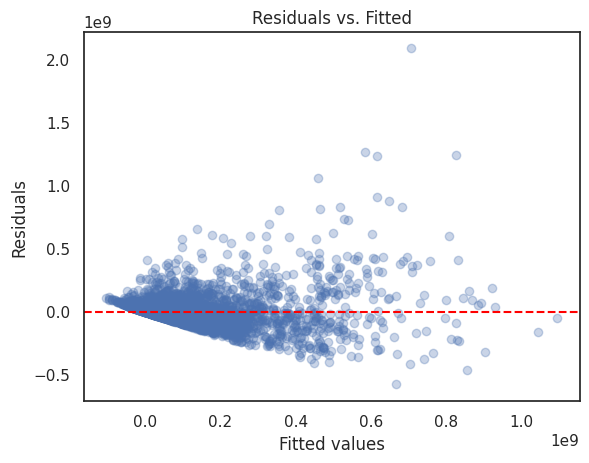

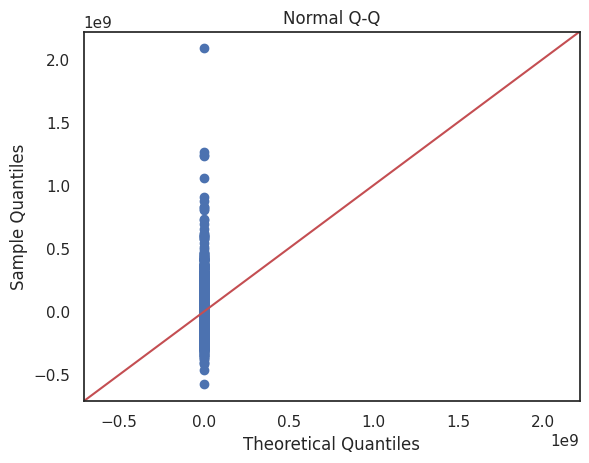

{'Lagrange multiplier': np.float64(485.83589398385175), 'p‑value': np.float64(1.2883365158634485e-85), 'f‑value': np.float64(19.874304282630984), 'f‑p‑value': np.float64(1.2205482154845452e-90)}


In [ ]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan

# assuming `model` is your fitted sm.OLS on Model 12
resid = model.resid
fitted = model.fittedvalues

# a) Residual vs. fitted
plt.scatter(fitted, resid, alpha=0.3)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Fitted values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted")
plt.show()

# b) QQ‑plot
sm.qqplot(resid, line='45')
plt.title("Normal Q‑Q")
plt.show()

# c) Breusch–Pagan for heteroskedasticity
bp_test = het_breuschpagan(resid, model.model.exog)
labels = ["Lagrange multiplier", "p‑value", "f‑value", "f‑p‑value"]
print(dict(zip(labels, bp_test)))


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=200, random_state=42)
cv_r2 = cross_val_score(rf, X12, y, cv=5, scoring="r2")
print("5‑fold CV R² (RF):", cv_r2.mean())


5‑fold CV R² (RF): 0.5414458084034676


# Revenue Modeling - Linear Regression

In [ ]:
# assume `model` is your final sm.OLS fit on X_final and y
robust = model.get_robustcov_results(cov_type="HC3")
print( robust.summary() )


                            OLS Regression Results                            
Dep. Variable:                Revenue   R-squared:                       0.607
Model:                            OLS   Adj. R-squared:                  0.605
Method:                 Least Squares   F-statistic:                     13.11
Date:                Sat, 19 Apr 2025   Prob (F-statistic):           1.83e-54
Time:                        06:09:51   Log-Likelihood:                -97084.
No. Observations:                4867   AIC:                         1.942e+05
Df Residuals:                    4839   BIC:                         1.944e+05
Df Model:                          27                                         
Covariance Type:                  HC3                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   -9.9

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 27, but rank is 26
  warnings.warn('covariance of constraints does not have full '


# Revenue Modeling - Random Forest

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_validate, KFold
from sklearn.metrics import make_scorer, r2_score, mean_squared_error

# 1) Load Model 12
file = '/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 12.xlsx'
df   = pd.read_excel(file)

# 2) Split into X/y
y = df['Revenue']
X = df.drop(columns=['Revenue'])

# 3) Set up RF and CV
rf = RandomForestRegressor(
    n_estimators=200,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
scoring = {
    'r2':  make_scorer(r2_score),
    'mse': make_scorer(mean_squared_error, greater_is_better=False)
}

# 4) 5‑fold CV
cv_res = cross_validate(
    rf, X, y,
    cv=cv,
    scoring=scoring,
    return_train_score=False
)

print("5‑fold CV R²: ", cv_res['test_r2'].mean())
print("5‑fold CV MSE:", -cv_res['test_mse'].mean())

# 5) Fit final RF on all the data and inspect feature importances
rf.fit(X, y)
importances = pd.Series(rf.feature_importances_, index=X.columns)
importances = importances.sort_values(ascending=False)

print("\nTop 10 features by importance:")
print(importances.head(10))


5‑fold CV R²:  0.6923677308794309
5‑fold CV MSE: 9778380532167698.0

Top 10 features by importance:
Budget                  0.567787
Series Points           0.123765
Runtime                 0.075015
Total Actor Points      0.054112
Director Points         0.049069
Lead Actor Points       0.037082
Genre_Animation         0.013511
Genre_Romance           0.010717
Release Day_Thursday    0.009865
Release Day_Tuesday     0.009081
dtype: float64


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# 1. Load Model 12
df = pd.read_excel('/content/drive/My Drive/Colab Notebooks/804 Capstone/Model 12.xlsx')

# 2. Split into X / y
y = df['Revenue']
X = df.drop(columns=['Revenue'])

# 3. Hold‐out split
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    random_state=42
)

# 4. Train RF on the training fold
rf = RandomForestRegressor(
    n_estimators=200,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train, y_train)

# 5. Predict & compute test metrics
y_pred = rf.predict(X_test)
test_r2  = r2_score(y_test, y_pred)
test_mse = mean_squared_error(y_test, y_pred)

print(f"Random Forest on held‑out test set:")
print(f"  •  R²   = {test_r2:.4f}")
print(f"  •  MSE  = {test_mse:.0f}")
print(f"  •  RMSE = {test_mse**0.5:,.0f}")


Random Forest on held‑out test set:
  •  R²   = 0.6563
  •  MSE  = 12874832804132494
  •  RMSE = 113,467,320


Test R²   = 0.6593
Test MSE  = 12759695298584682
Test RMSE = 112,958,821
Budget                    0.5904
Series Points             0.1267
Runtime                   0.0741
Director Points           0.0482
Total Actor Points        0.0457
Lead Actor Points         0.0305
Genre_Animation           0.0148
Genre_Romance             0.0111
Genre_Thriller            0.0104
Genre_Fantasy             0.0072
Release Day_Tuesday       0.0065
Holidays_Canada Day       0.0060
Release Day_Wednesday     0.0049
Release Day_Thursday      0.0045
Genre_Action              0.0041
Season_Spring             0.0039
Genre_Drama               0.0032
Country_New Zealand       0.0020
Studio_Pixar              0.0014
Country_Germany           0.0012
Studio_Columbia           0.0012
Genre_Western             0.0011
Genre_History             0.0004
Country_France            0.0004
Studio_United Artists     0.0003
Studio_Imagine            0.0003
Country_Czech Republic    0.0001
dtype: float64


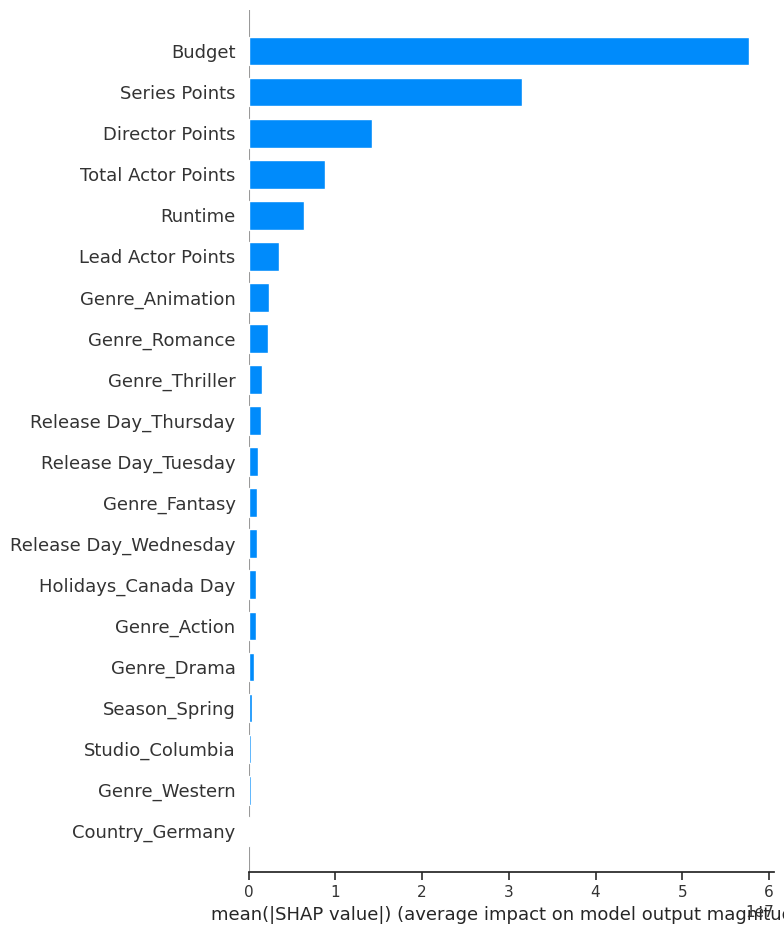

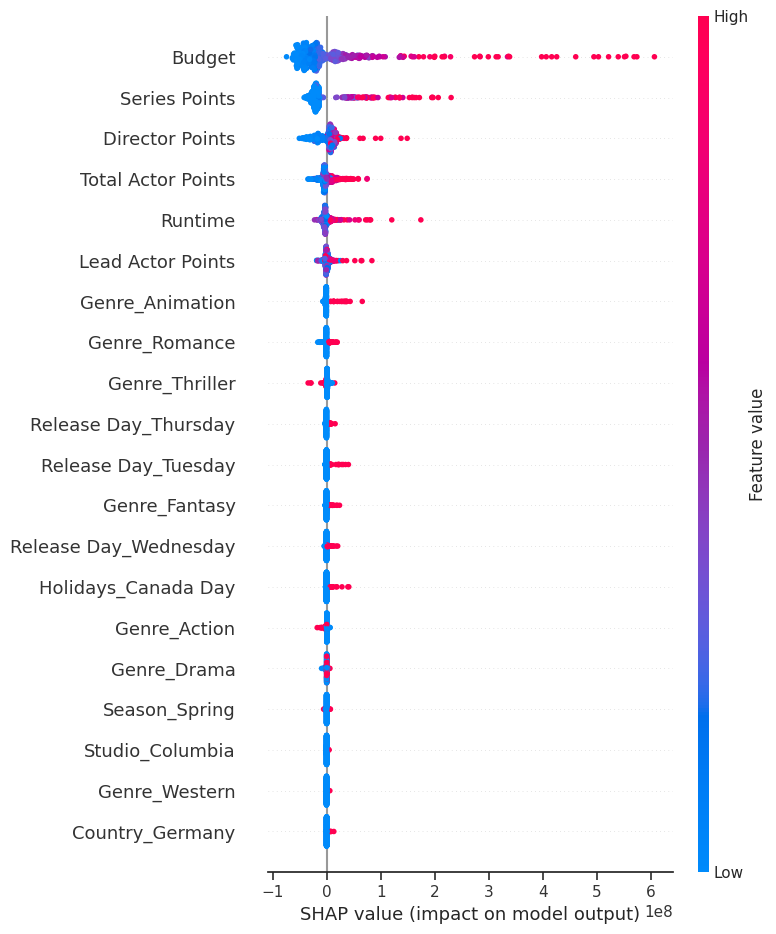

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
# 1. Train a smaller forest
rf = RandomForestRegressor(
    n_estimators=100,    # was 500
    max_depth=10,        # limit depth
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train, y_train)

# 2. Quick test‐set metrics
r2 = rf.score(X_test, y_test)
mse = np.mean((rf.predict(X_test) - y_test)**2)
rmse = np.sqrt(mse)
print(f"Test R²   = {r2:.4f}")
print(f"Test MSE  = {mse:.0f}")
print(f"Test RMSE = {rmse:,.0f}")

# 3. Feature importances (same as before)
importances = pd.Series(rf.feature_importances_, index=X.columns)
print(importances.sort_values(ascending=False).round(4))

# 4. SHAP on a 500‑row sample
import shap
X_shap = X_test.sample(500, random_state=42)
explainer = shap.TreeExplainer(rf, X_train.sample(200, random_state=42))  # small background
shap_values = explainer.shap_values(X_shap)

# bar plot of global importance
shap.summary_plot(shap_values, X_shap, plot_type="bar")

# dot plot (can also subsample)
shap.summary_plot(shap_values, X_shap)

# 5. LIME on a single instance (with a small background sample)
from lime.lime_tabular import LimeTabularExplainer
lime_exp = LimeTabularExplainer(
    training_data=X_train.sample(200, random_state=42).values,
    feature_names=X.columns,
    mode='regression'
)
idx = 0  # first test row
exp = lime_exp.explain_instance(
    X_test.iloc[idx].values,
    rf.predict,
    num_features=10
)
exp.show_in_notebook()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.inspection import permutation_importance
from scipy.stats import norm

# 1. Feature‐importances from the trained RF
fi = pd.Series(rf.feature_importances_, index=X.columns)
fi = fi.sort_values(ascending=False)
print("Raw feature_importances_:\n", fi.round(4))

# 2. Permutation importance on the test set
perm = permutation_importance(
    rf, X_test, y_test,
    n_repeats=30,         # more repeats → more precise std
    random_state=42,
    n_jobs=-1
)

imp_df = pd.DataFrame({
    'mean_imp': perm.importances_mean,
    'std_imp':  perm.importances_std
}, index=X.columns)

# 3. z‑scores & p‑values
imp_df['z_score'] = imp_df['mean_imp'] / imp_df['std_imp']
imp_df['p_value'] = 2 * (1 - norm.cdf(np.abs(imp_df['z_score'])))

# 4. Sort by mean importance
imp_df = imp_df.sort_values('mean_imp', ascending=False)

# 5. Display
pd.set_option('display.float_format', '{:0.4f}'.format)
print("\nPermutation importances with significance:\n", imp_df.head(20))

# If you want to filter “significant” ones at α=0.05:
sig = imp_df[imp_df['p_value'] < 0.05]
print(f"\n{len(sig)} features with p < 0.05:\n", sig)


Raw feature_importances_:
 Budget                    0.5904
Series Points             0.1267
Runtime                   0.0741
Director Points           0.0482
Total Actor Points        0.0457
Lead Actor Points         0.0305
Genre_Animation           0.0148
Genre_Romance             0.0111
Genre_Thriller            0.0104
Genre_Fantasy             0.0072
Release Day_Tuesday       0.0065
Holidays_Canada Day       0.0060
Release Day_Wednesday     0.0049
Release Day_Thursday      0.0045
Genre_Action              0.0041
Season_Spring             0.0039
Genre_Drama               0.0032
Country_New Zealand       0.0020
Studio_Pixar              0.0014
Country_Germany           0.0012
Studio_Columbia           0.0012
Genre_Western             0.0011
Genre_History             0.0004
Country_France            0.0004
Studio_United Artists     0.0003
Studio_Imagine            0.0003
Country_Czech Republic    0.0001
dtype: float64

Permutation importances with significance:
                       

# ROI Modeling
